In [1]:
# depending on where you run this, this may have to be %matplotlib notebook
%matplotlib inline

import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk 
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions 

%matplotlib inline

In [2]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'  

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_second = 86400

In [3]:
# define the plotting parameters

figsize = (8,4)

In [4]:
# import the data

# choose a TIC ID to analyze
ticid =  353894978

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"


# import data using Lightkurve
sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')
display(sr)
search_result = sr.download_all().stitch()

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 14,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
1,TESS Sector 15,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
2,TESS Sector 16,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
3,TESS Sector 17,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
4,TESS Sector 18,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
5,TESS Sector 19,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
6,TESS Sector 20,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
7,TESS Sector 21,2020,SPOC,120,353894978,0.0,"G022099 , G022208"
8,TESS Sector 22,2020,SPOC,120,353894978,0.0,"G022099 , G022208"


516110

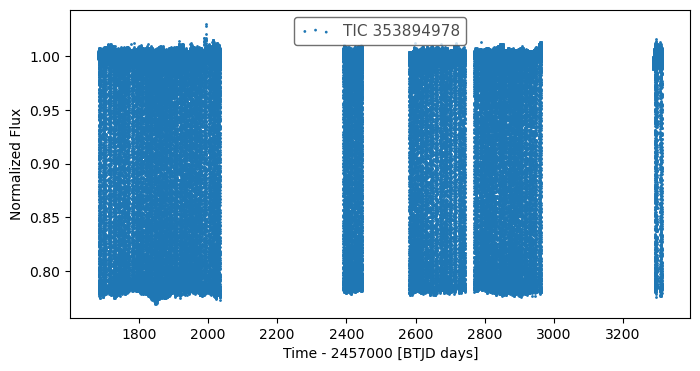

In [20]:
# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)

# t0 = 2337.376
# period_triple = 0.774

mask = time < 0  # (time > 2893.16-1) & (time < 2893.16+1) 

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data 

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})


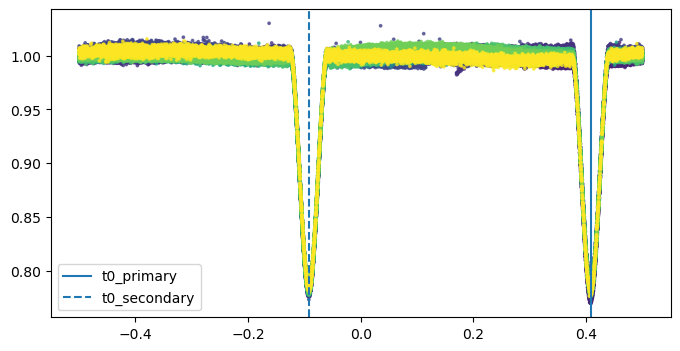

In [21]:
# define the orbital period and the t0 

# primary , or primary and secondary caught in 1 TCE,
# assuming primary / secondary caught in 1 TCE for now
# epoch=1683.9733, duration_hr=5.0161, period=1.670912, label="s0014-s0060:TCE1", 
period = 1.670912 * 2  # TCE1
period = 3.341826  # MCMC fit: 3.341825763874847

t0_primary = 1683.9733 + period / 2
t0_secondary = 1683.9733

duration_hr_primary = 5.0161  # used for the window to cut the lighcurve around eclipses in later cells

t0_for_plotting = 0  # keep 0 for plotting purposes
# t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.25  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
plt.show();

### Now that the data is ready we can start 

In [22]:
# show data to visualize what's changed in each step below
data  

,time,flux,err,phase
0,1683.354886,1.001724,0.001424,-0.276920
1,1683.356275,1.000383,0.001423,-0.276504
2,1683.357664,1.003524,0.001423,-0.276089
3,1683.359052,0.999456,0.001424,-0.275673
4,1683.360441,1.001970,0.001422,-0.275258
...,...,...,...,...
448446,3312.642470,0.997713,0.001197,0.267190
448447,3312.643859,0.995434,0.001195,0.267606
448448,3312.645248,0.994701,0.001195,0.268022
448449,3312.646637,0.995492,0.001195,0.268437


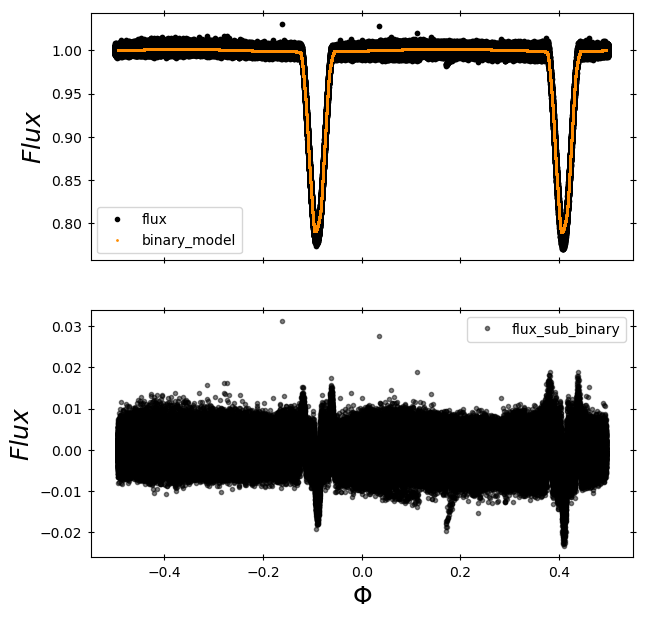

,time,flux,err,phase,flux_sub_binary,binary_model
0,1683.354886,1.001724,0.001424,-0.276920,0.000950,1.000775
1,1683.356275,1.000383,0.001423,-0.276504,-0.000384,1.000767
2,1683.357664,1.003524,0.001423,-0.276089,0.002764,1.000760
3,1683.359052,0.999456,0.001424,-0.275673,-0.001297,1.000753
4,1683.360441,1.001970,0.001422,-0.275258,0.001224,1.000746
...,...,...,...,...,...,...
448446,3312.642470,0.997713,0.001197,0.267190,-0.003247,1.000960
448447,3312.643859,0.995434,0.001195,0.267606,-0.005519,1.000953
448448,3312.645248,0.994701,0.001195,0.268022,-0.006246,1.000946
448449,3312.646637,0.995492,0.001195,0.268437,-0.005447,1.000939


In [23]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

10 443995 901
reached the end
10 425148 901
reached the end
10 423277 901
reached the end
10 422731 901
reached the end
10 422517 901
reached the end


,time,flux,err,phase,flux_sub_binary,binary_model,flux_detrended
0,1683.354886,1.001724,0.001424,-0.276920,0.000950,1.000775,1.001313
1,1683.356275,1.000383,0.001423,-0.276504,-0.000384,1.000767,0.999969
2,1683.357664,1.003524,0.001423,-0.276089,0.002764,1.000760,1.003108
3,1683.359052,0.999456,0.001424,-0.275673,-0.001297,1.000753,0.999037
4,1683.360441,1.001970,0.001422,-0.275258,0.001224,1.000746,1.001548
...,...,...,...,...,...,...,...
448446,3312.642470,0.997713,0.001197,0.267190,-0.003247,1.000960,1.002932
448447,3312.643859,0.995434,0.001195,0.267606,-0.005519,1.000953,1.000658
448448,3312.645248,0.994701,0.001195,0.268022,-0.006246,1.000946,0.999930
448449,3312.646637,0.995492,0.001195,0.268437,-0.005447,1.000939,1.000727


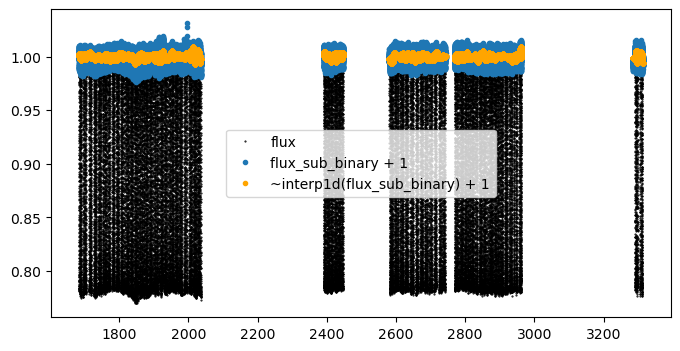

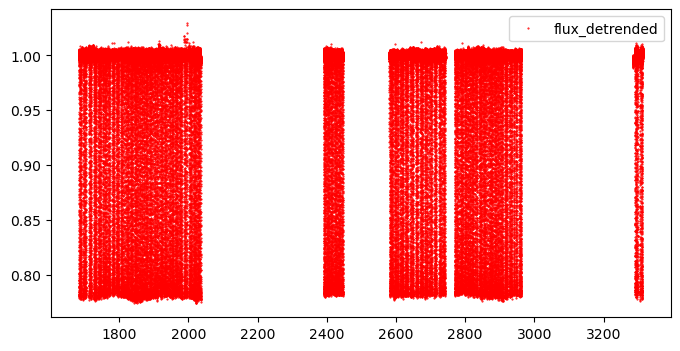

In [25]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

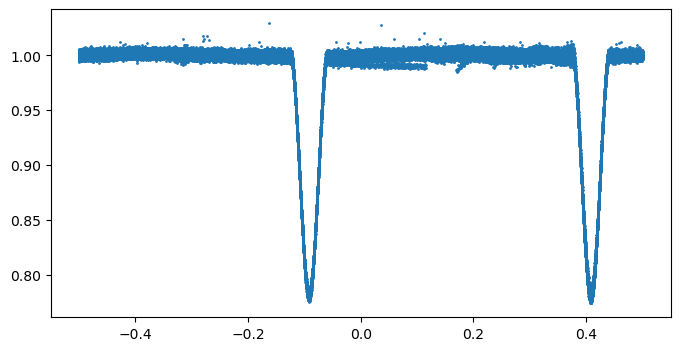

In [26]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
fig, ax = plt.subplots(figsize = figsize)
plt.scatter(data.phase, data.flux_detrended, s = 1)
plt.show()

Primary:   1685.644213 0.4081328591015855
Secondary: 1683.9733 -0.09186714089839282
window_width (phase): 0.07505028687908945


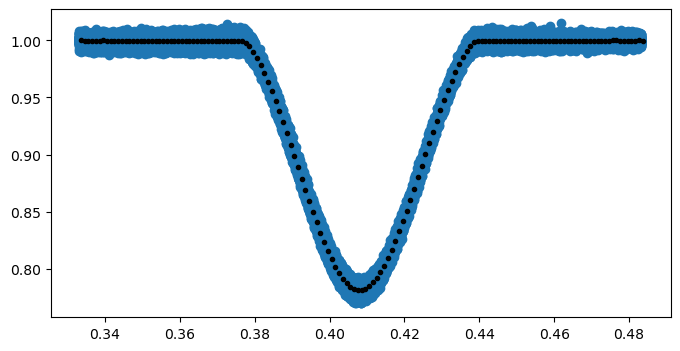

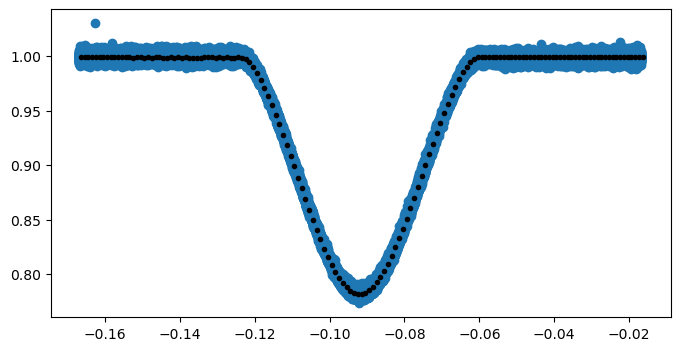

In [27]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]

print('Primary:  ', t0_primary, midpoint_p)
print('Secondary:', t0_secondary, midpoint_s)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
window_width = 1.2 * duration_hr_primary / 24 / period
# window_width = 0.05
print("window_width (phase):", window_width)


data_primary = data[(data['phase'] > midpoint_p - window_width) & (data['phase'] < midpoint_p + window_width) ]
data_secondary = data[(data['phase'] > midpoint_s - window_width) & (data['phase'] < midpoint_s + window_width) ]

ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)
ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


# -- -- -- -- -- -- -- -- -- 

fig = plt.subplots(figsize=figsize, sharex=True)
plt.errorbar(ph_binned, flux_binned, yerr=err_binned, fmt=".k", capsize=0, zorder = 2)
plt.scatter(data_primary.phase, data_primary.flux, zorder = -2)
plt.show()

# -- -- -- -- -- -- -- -- -- 
fig = plt.subplots(figsize=figsize, sharex=True)
plt.errorbar(ph_binned_s, flux_binned_s, yerr=err_binned_s, fmt=".k", capsize=0, zorder = 2)
plt.scatter(data_secondary.phase, data_secondary.flux, zorder = -2)
plt.show() 

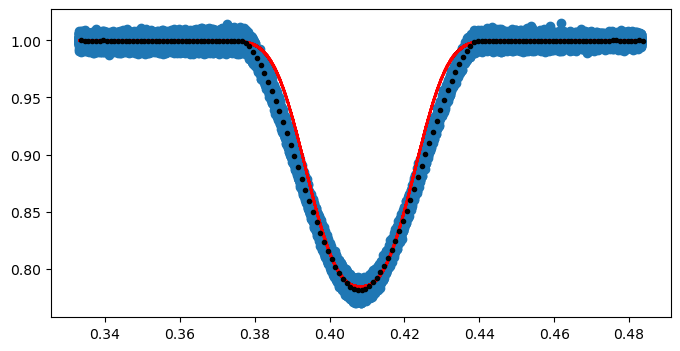

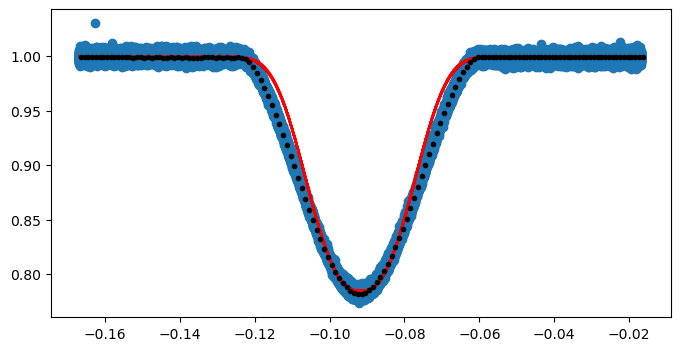

In [28]:
### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V) 
# t0 in normalixed phase
start_vals = [1, -0.215, midpoint_p, 0.012, 1.3]
start_vals_s = [1, -0.215, midpoint_s, 0.012, 1.3]

# - - -- - 

etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)


emcee parallel enabled, defaulted to use 9 CPUs.


100%|██████████████████████████████████████████████████████████| 1000/1000 [29:49<00:00,  1.79s/it]


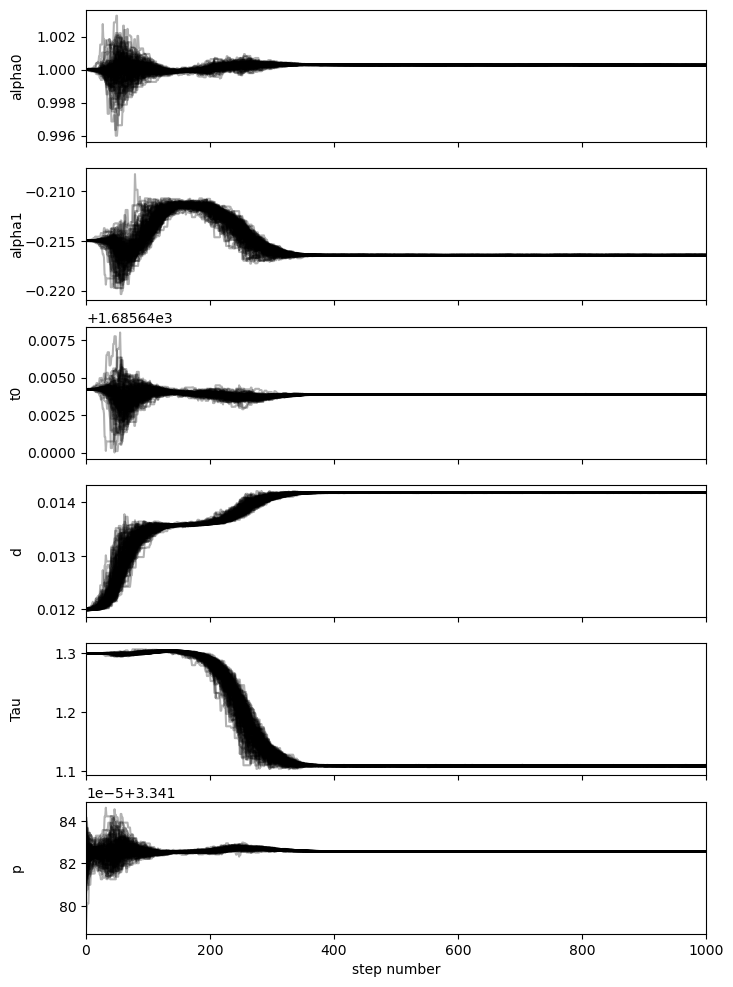

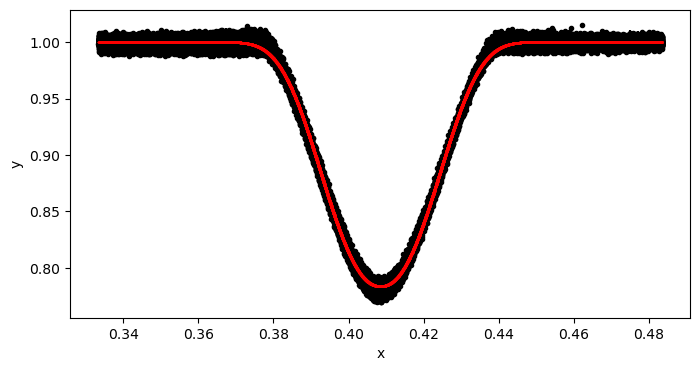

mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p = 1.0002769760582453, -0.21644504203100481, 1685.6438855762958, 0.01417650377528586, 1.1084553850023418, 3.341825763874847
std_p: 2.296768420963688e-08


In [15]:
# use MCMC to refine the period

use_mcmc_to_fit_period = False


if use_mcmc_to_fit_period:
    import etv_functions_with_period as etvp

    # enable info logging
    import sys
    import logging
    etvp.log.setLevel(logging.INFO)
    if not getattr(etvp.log, "_stdout_handler_added", False):  # for Jupyter        
        etvp.log.addHandler(logging.StreamHandler(stream=sys.stdout))
        etvp.log._stdout_handler_added = True
        
    # MCMC result
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p, fit_params_p_stats = etvp.run_mcmc_initial_fit_p(
        data_primary[:],
        [1, -0.215, t0_primary, 0.012, 1.3, period],
        nruns=1000, discard=600, 
        # nruns=20, discard=1, 
        pool="all",
        plot_chains=True,
        plot=True,
        also_return_stats=True,
    )
    print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p]]))
    print("std_p:", fit_params_p_stats["std_p"])
    

In [ ]:
# MCMC results
# mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p = 1.0002769760582453, -0.21644504203100481, 1685.6438855762958, 0.01417650377528586, 1.1084553850023418, 3.341825763874847
# std_p = 2.296768420963688e-08

100%|██████████████████████████████████████████████████████████| 1000/1000 [10:46<00:00,  1.55it/s]


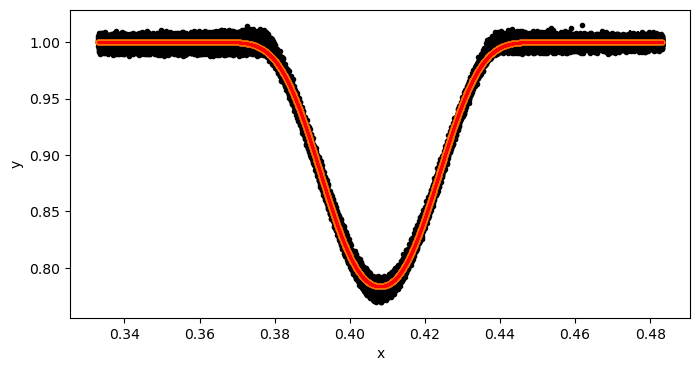

100%|██████████████████████████████████████████████████████████| 1000/1000 [11:16<00:00,  1.48it/s]


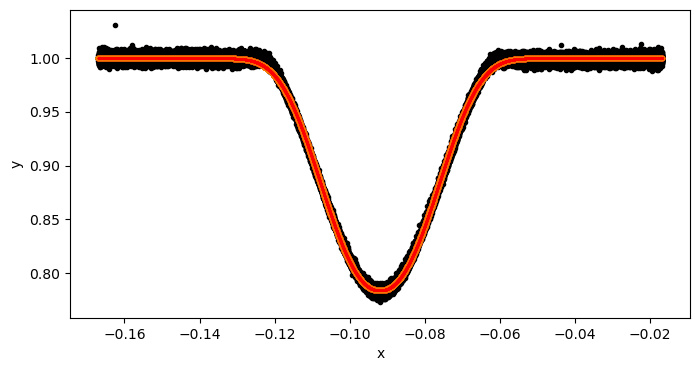

In [29]:
# run the initial model fit using MCMC for the primary and secondary eclipses 

mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns = 1000, plot_chains = False, plot = True)
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns = 1000, plot_chains = False, plot = True)
!$NOTIFY_CMD "Initial fit done"

In [ ]:
# Model params from MCMC fit (with TCE1 Period)
# 1.00029733877068 -0.21644068259987398 0.4084573204559342 0.014175335945694775 1.1087406998131772
# 0.9995033583125017 -0.2153388480950119 -0.09155924521145649 0.014157474054175173 1.1115983743234632

# The model params from MCMC fit above (with MCMC Period)
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0002761396156714, -0.2164428588578063, 0.40801899650994067, 0.014176322579186232, 1.1084884890946447
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 0.9995737754750964, -0.2153080194871514, -0.09198993944674563, 0.01415653589611892, 1.1117414776801726

In [30]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))
if t0_secondary is not None:
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s]]))

Initial model params:
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0002761396156714, -0.2164428588578063, 0.40801899650994067, 0.014176322579186232, 1.1084884890946447
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 0.9995737754750964, -0.2153080194871514, -0.09198993944674563, 0.01415653589611892, 1.1117414776801726


486

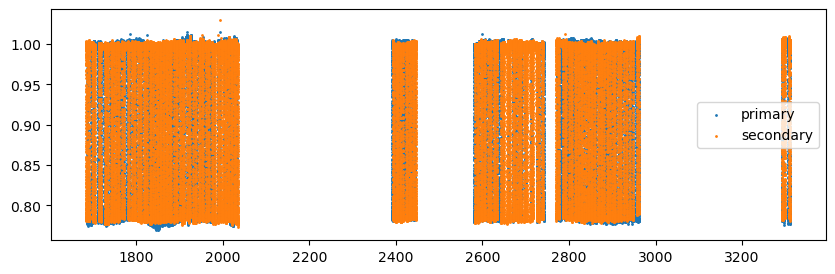

In [31]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data 
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

1685.644213 3.341826 1685.644213


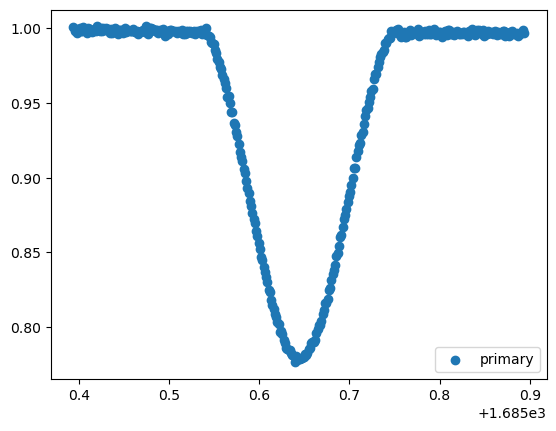

1685.644213 3.341826 1688.9860390000001


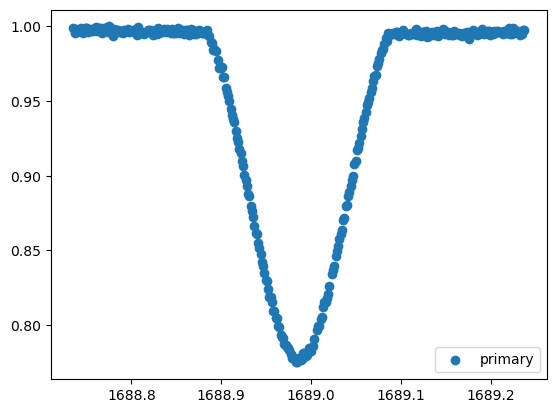

1685.644213 3.341826 1692.327865


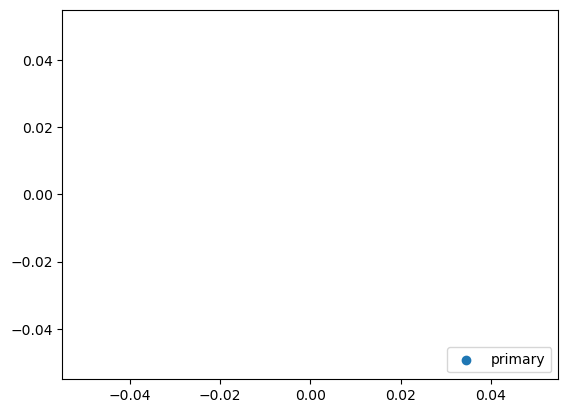

1683.9733 3.341826 1683.9733


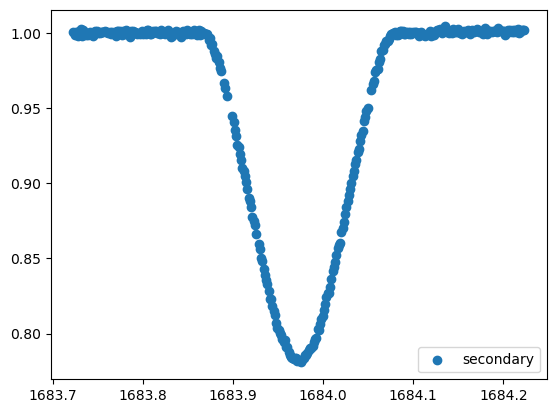

1683.9733 3.341826 1687.3151260000002


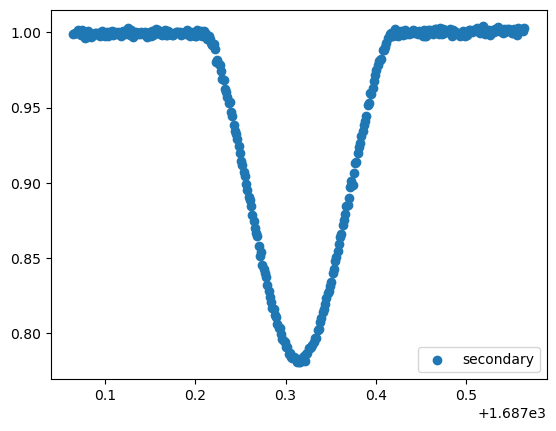

1683.9733 3.341826 1690.656952


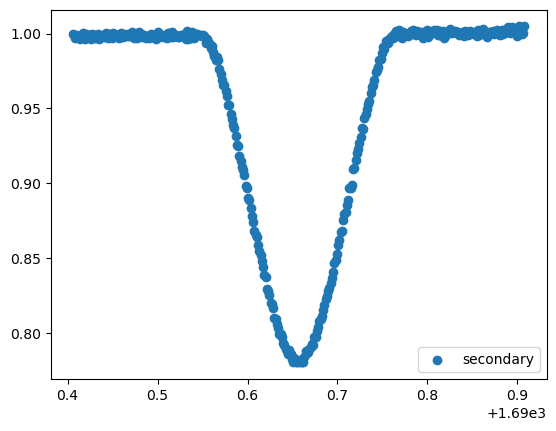

In [32]:
tr_index = range(0,n_transits)

for i in tr_index[0:3]:        
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux) 
    yerr = np.array(data_primary.err)
    
    print (t0_primary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()
    

for i in tr_index[0:3]:        
    transit_time = t0_secondary+(period*i)
    x = np.array(data_secondary.time)
    y = np.array(data_secondary.flux) 
    yerr = np.array(data_secondary.err)
    
    print (t0_secondary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="secondary")
    plt.legend(loc="lower right")
    plt.show()

Fitting individual primary eclipses...
Creating new manifest file
1685.644213 1.0002761396156714 -0.2164428588578063 0.40801899650994067


  0%|                                                                    | 0/10000 [00:00<?, ?it/s]C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1250.09it/s]


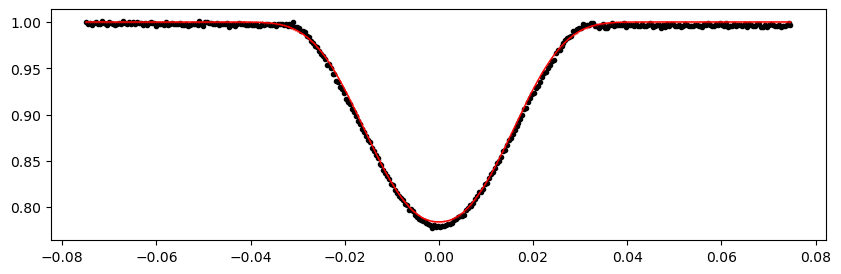

1688.9860390000001 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1248.13it/s]


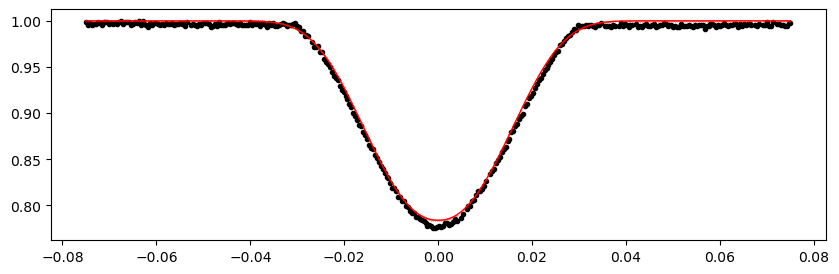

1695.669691 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1228.77it/s]


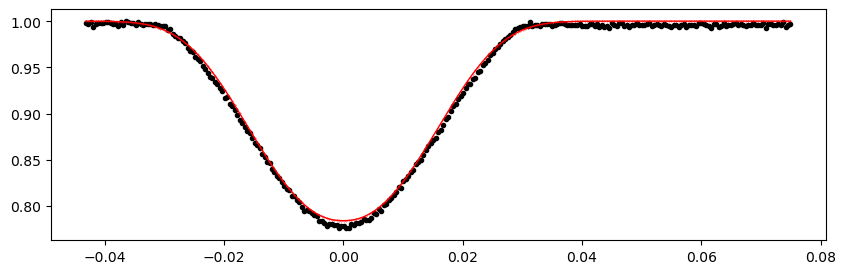

1699.0115170000001 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1253.35it/s]


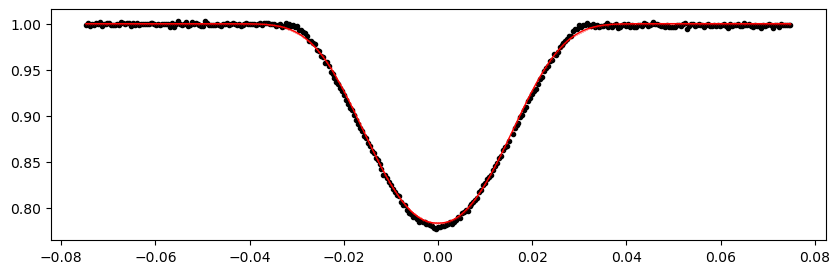

1702.353343 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1271.96it/s]


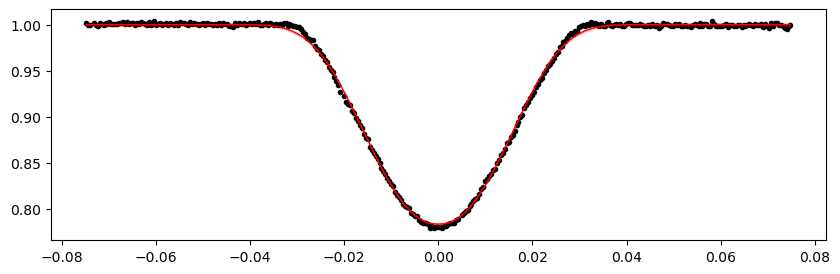

1705.695169 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1260.48it/s]


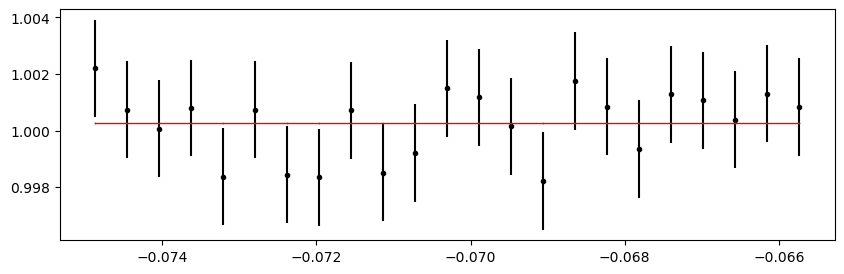

1712.378821 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1266.61it/s]


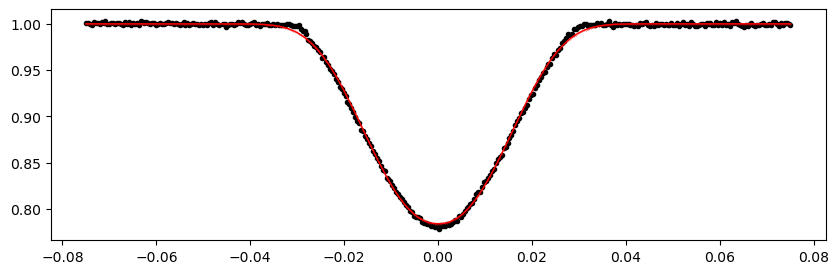

1715.720647 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1223.20it/s]


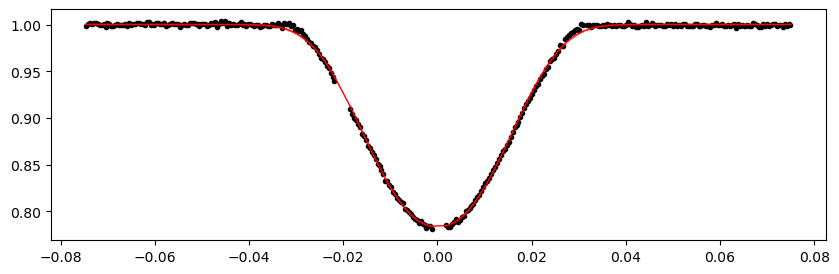

1719.062473 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1253.49it/s]


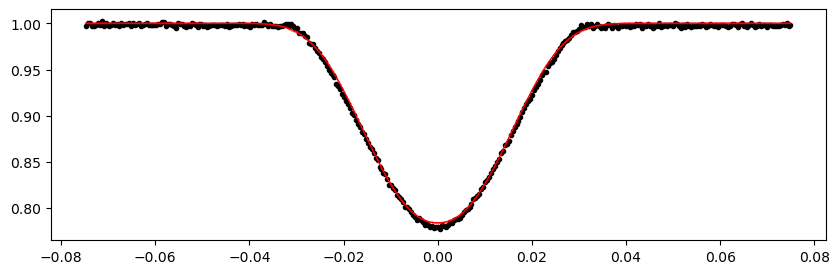

1725.7461250000001 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1296.04it/s]


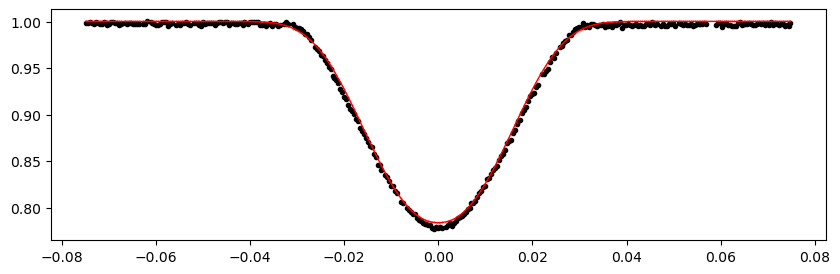

1729.087951 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1258.48it/s]


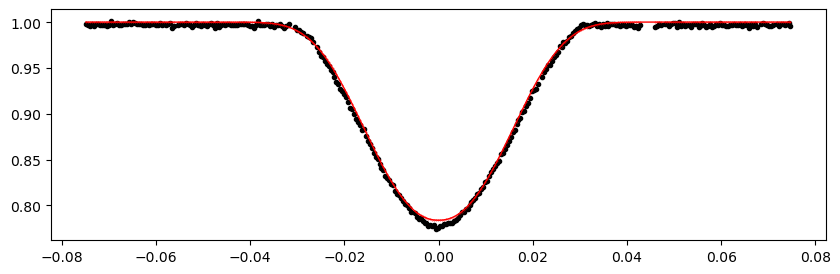

1732.429777 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1181.82it/s]


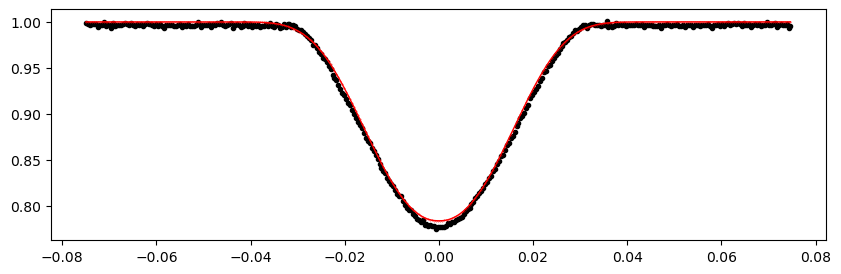

1739.113429 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1222.76it/s]


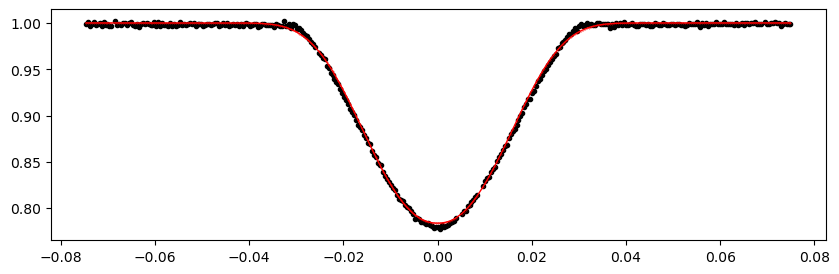

1742.455255 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1182.64it/s]


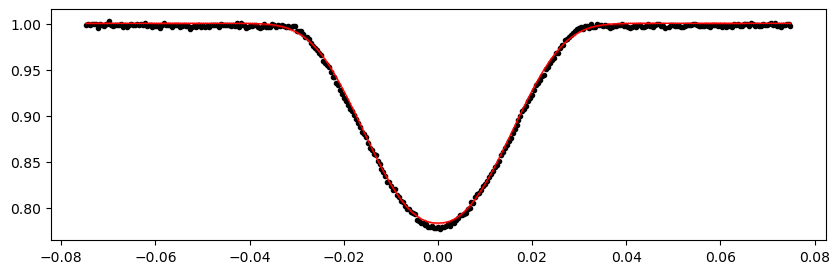

1745.797081 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1300.67it/s]


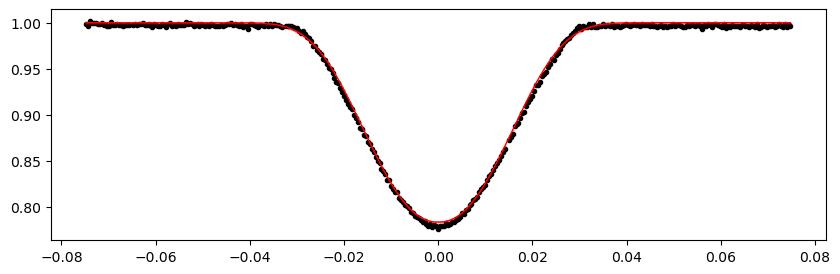

1749.138907 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1287.24it/s]


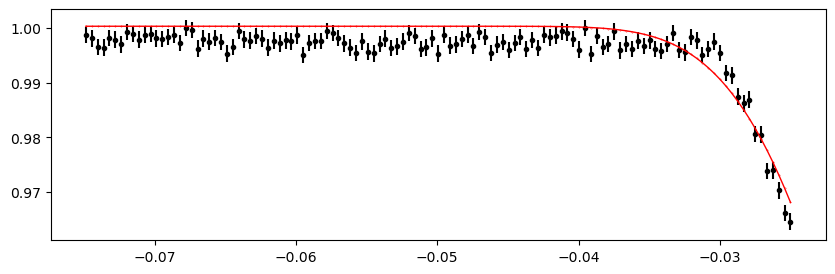

1752.480733 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1290.07it/s]


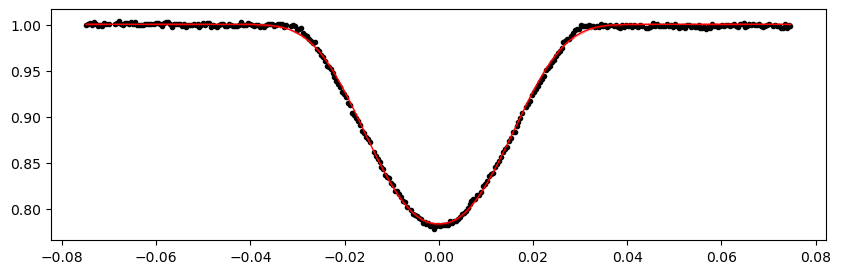

1755.822559 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1247.33it/s]


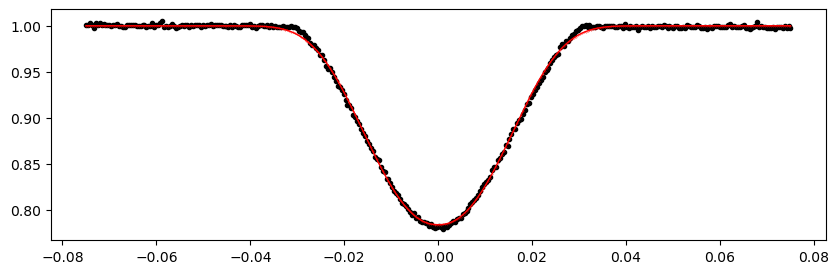

1759.164385 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1274.18it/s]


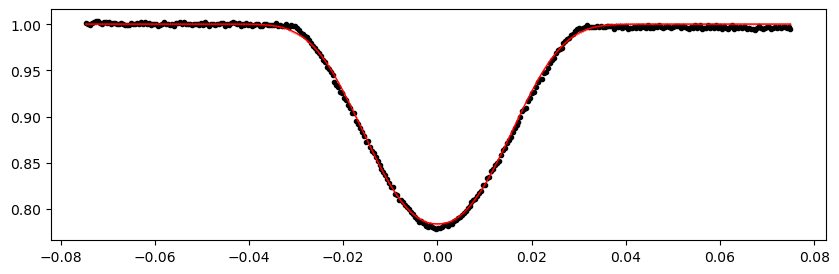

1762.5062110000001 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.29it/s]


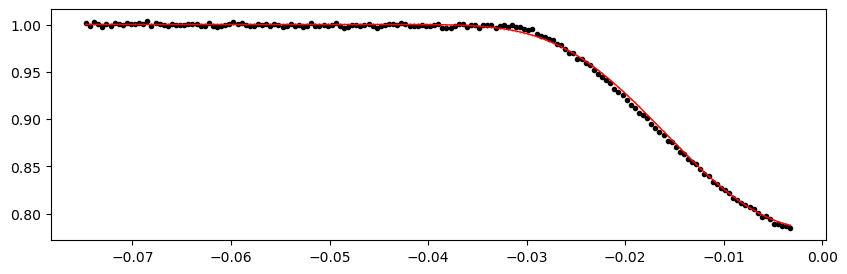

1765.848037 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1281.15it/s]


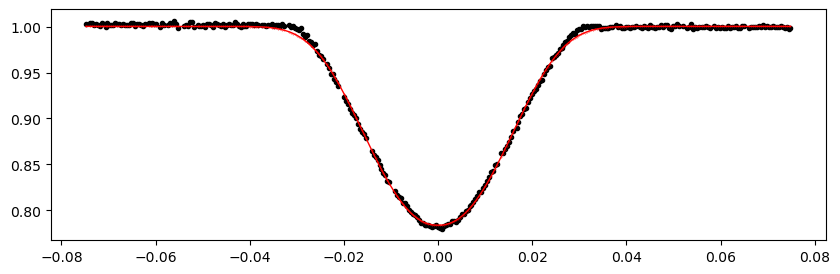

1769.189863 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1271.92it/s]


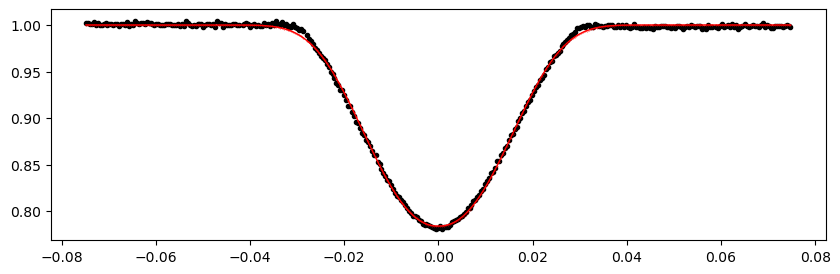

1772.5316890000001 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1269.01it/s]


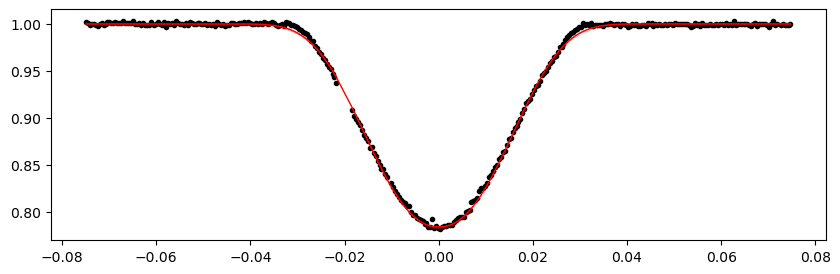

1779.215341 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1274.43it/s]


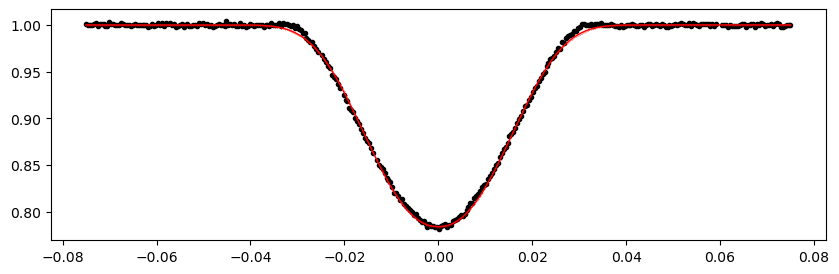

1782.557167 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.27it/s]


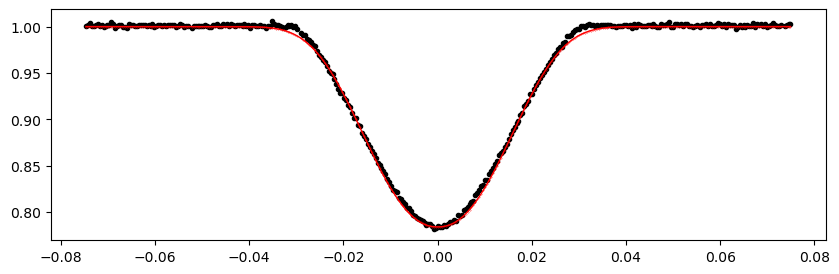

1785.898993 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1311.25it/s]


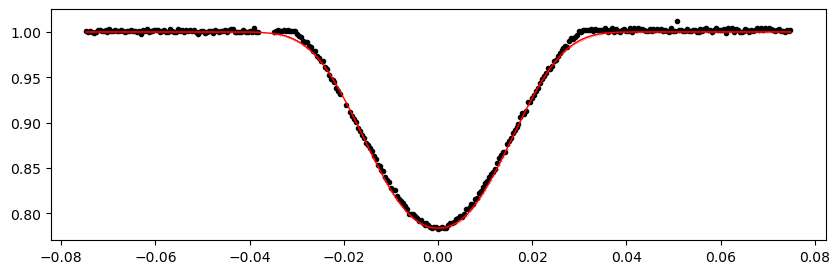

1792.582645 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1287.32it/s]


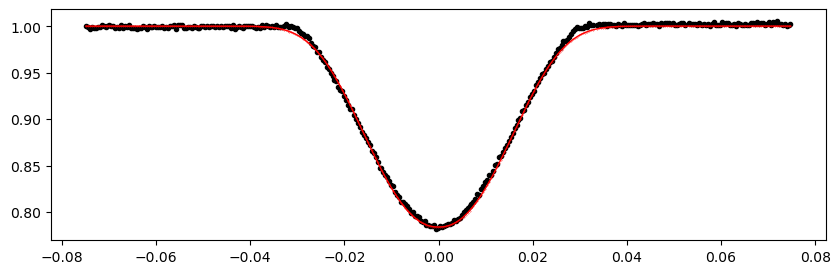

1795.924471 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1281.92it/s]


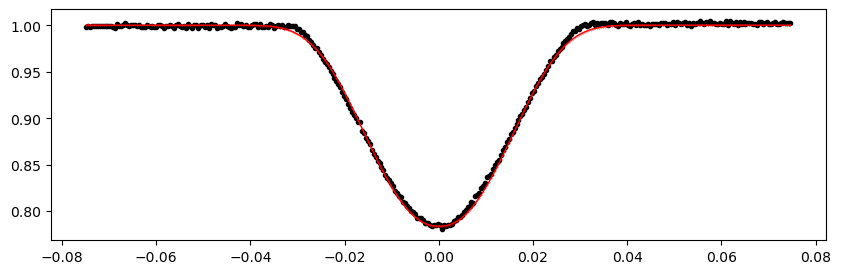

1799.2662970000001 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|███████████████████████████████████████████████████████| 10000/10000 [00:14<00:00, 672.66it/s]


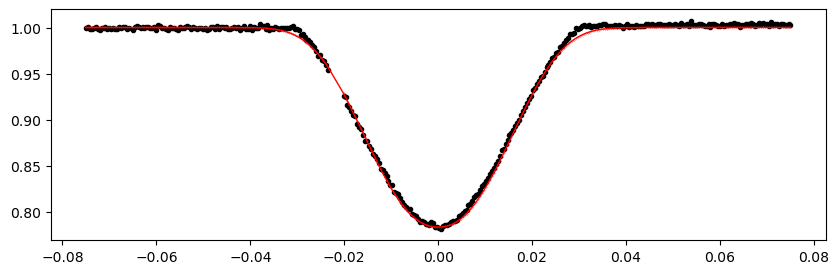

1805.949949 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1145.32it/s]


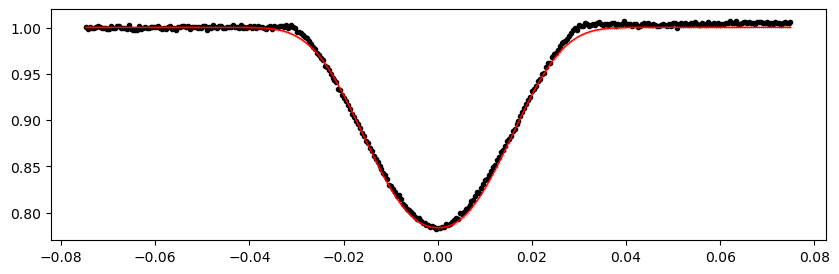

1809.2917750000001 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1197.41it/s]


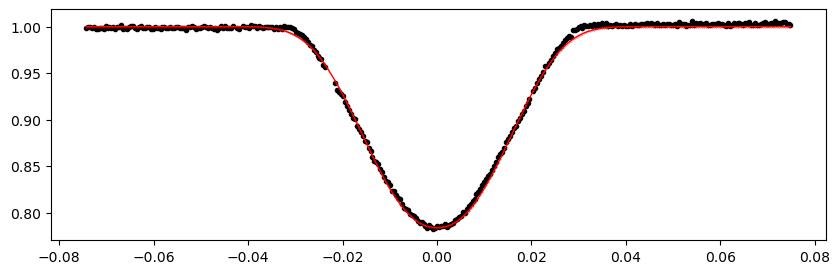

1812.633601 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1157.53it/s]


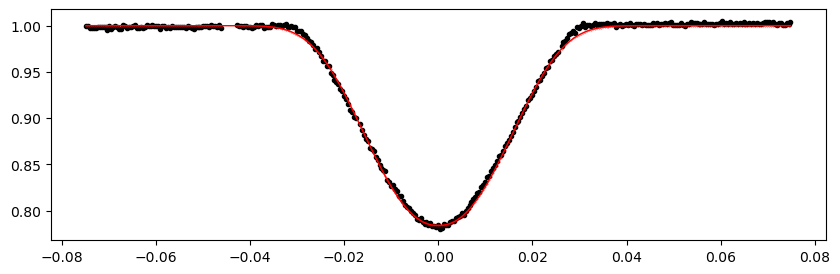

1815.975427 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1230.16it/s]


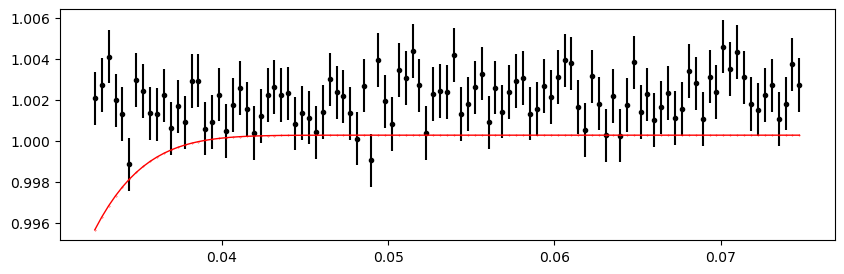

1819.3172530000002 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.29it/s]


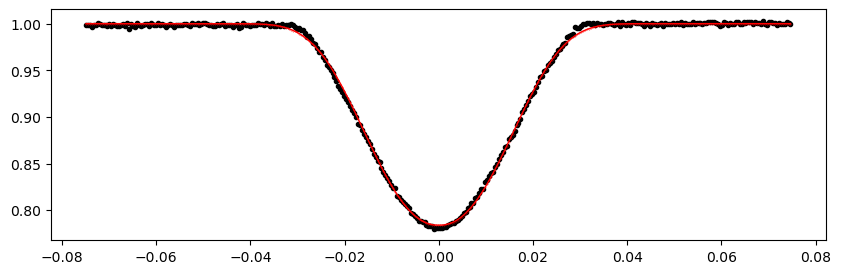

1822.659079 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1282.13it/s]


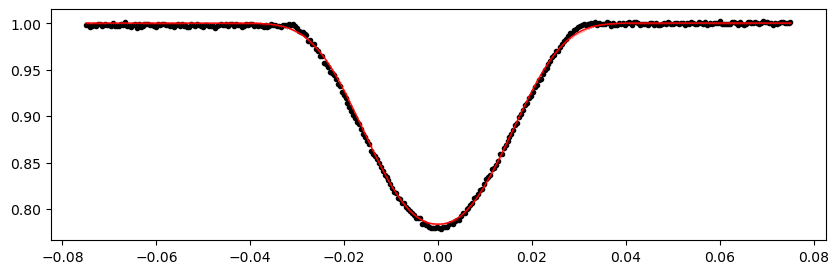

1826.000905 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.24it/s]


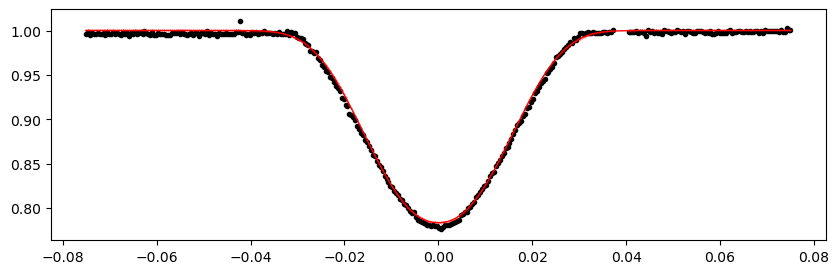

1829.342731 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1282.25it/s]


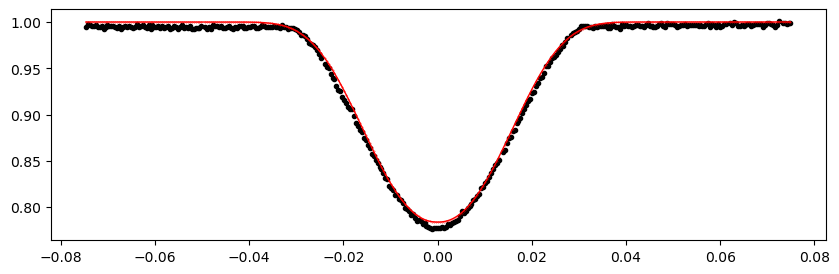

1832.684557 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1266.98it/s]


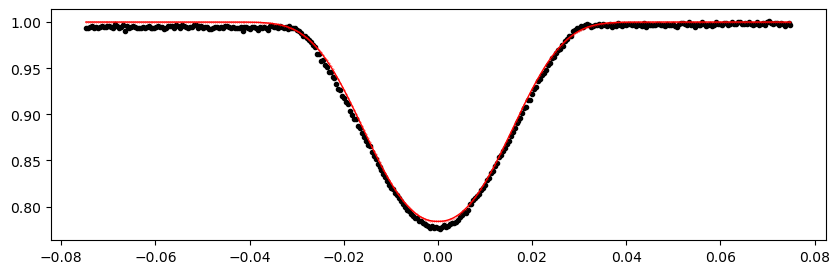

1836.0263830000001 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1267.16it/s]


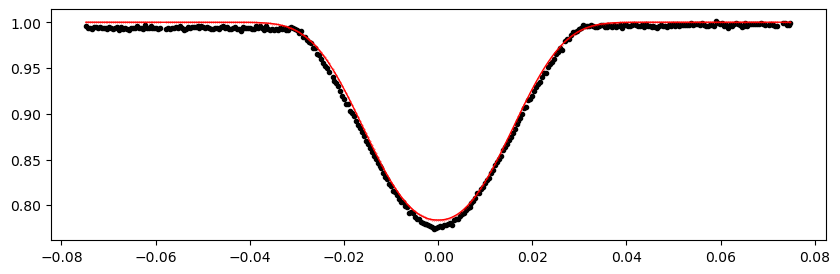

1839.368209 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1264.10it/s]


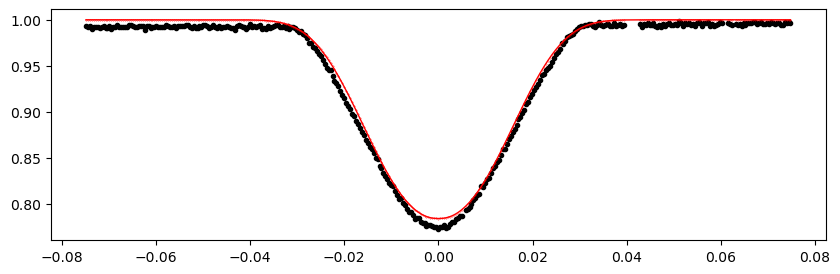

1842.710035 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1277.91it/s]


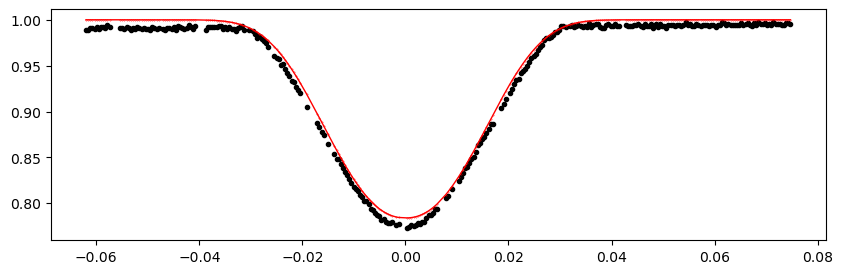

1846.051861 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1282.25it/s]


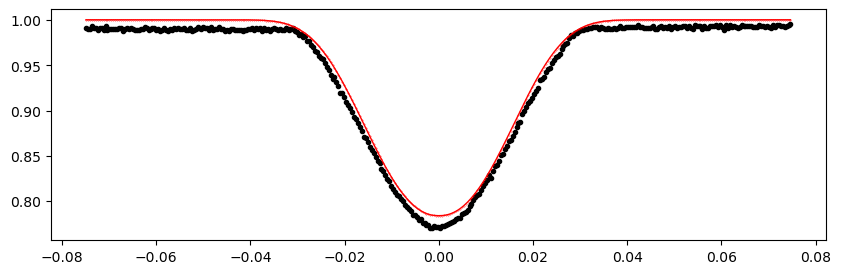

1849.393687 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1269.35it/s]


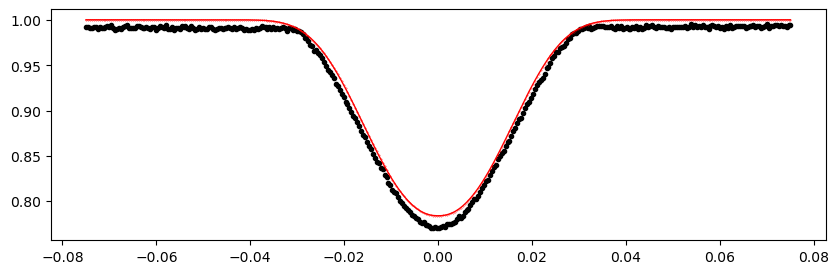

1852.735513 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1300.23it/s]


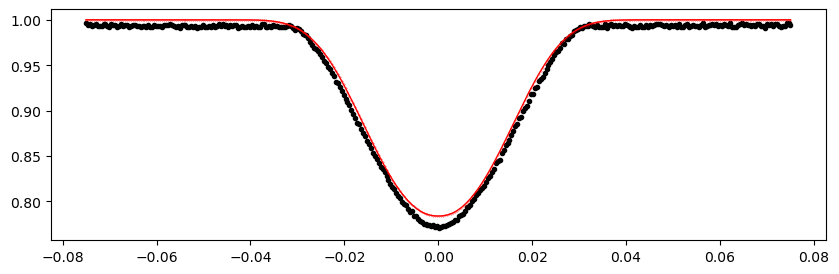

1859.419165 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1259.33it/s]


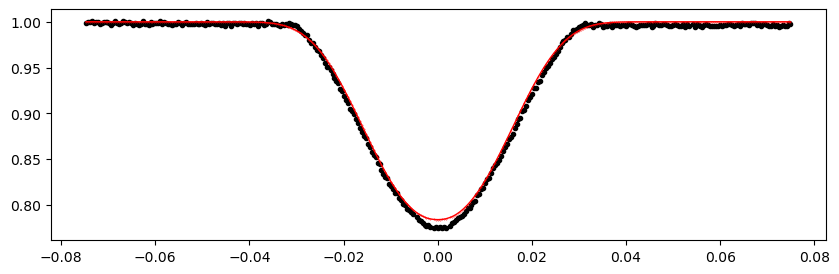

1862.760991 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1274.34it/s]


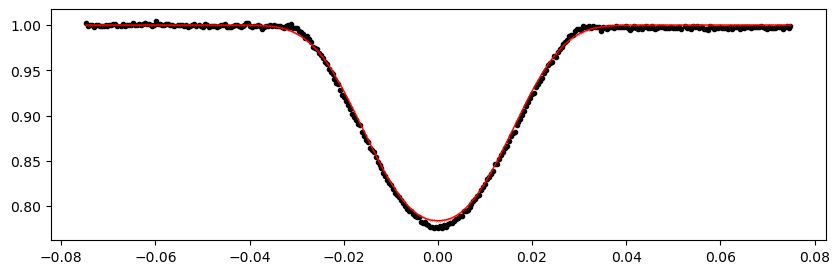

1866.102817 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1285.04it/s]


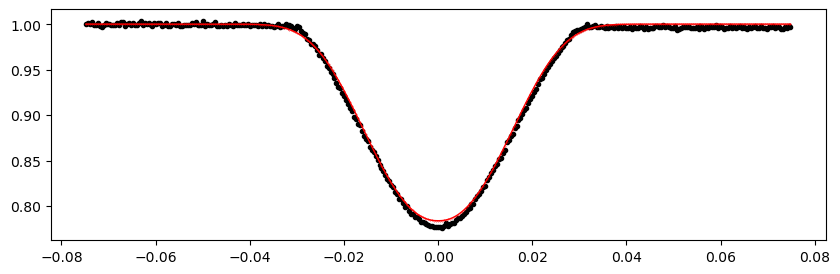

1872.7864690000001 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1292.51it/s]


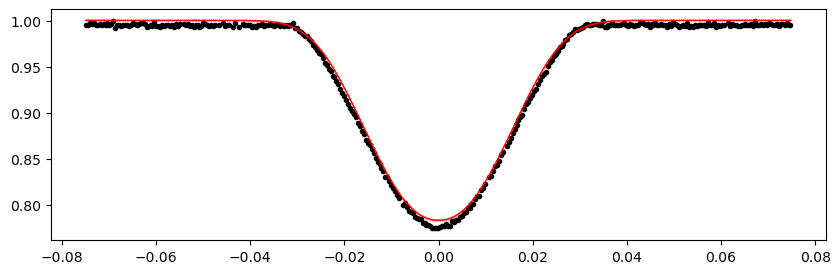

1876.128295 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1284.87it/s]


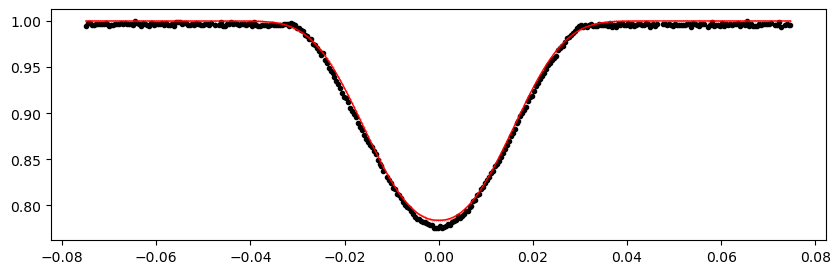

1879.470121 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1291.57it/s]


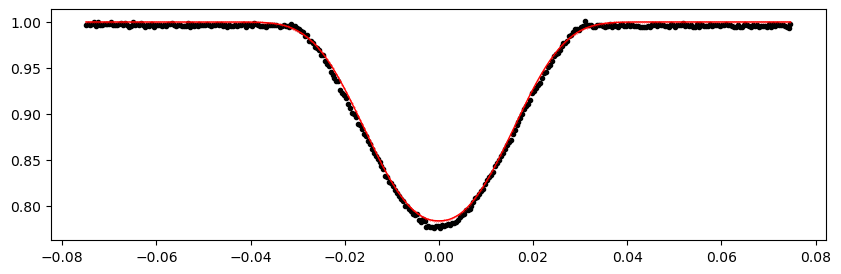

1882.8119470000001 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.24it/s]


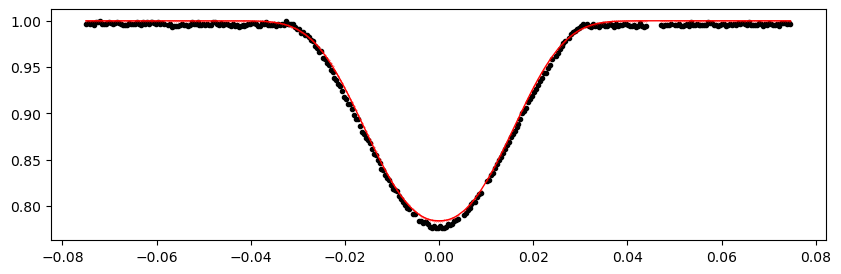

1886.153773 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1282.00it/s]


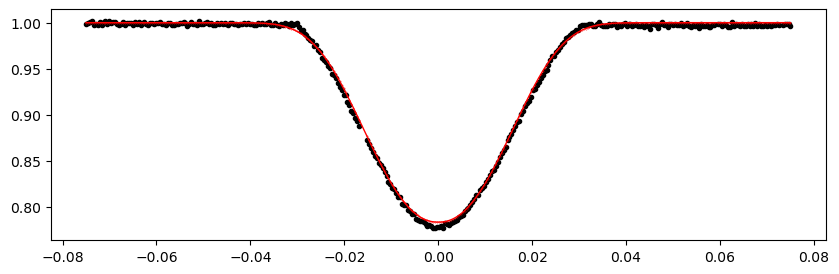

1889.495599 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1297.98it/s]


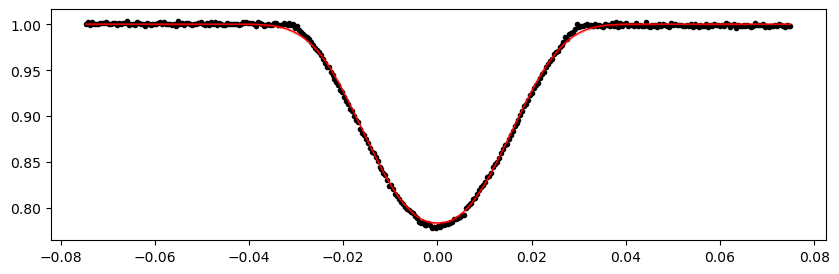

1892.8374250000002 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1292.20it/s]


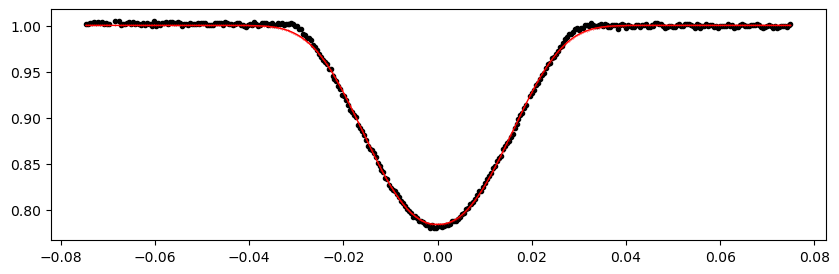

1896.179251 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1298.04it/s]


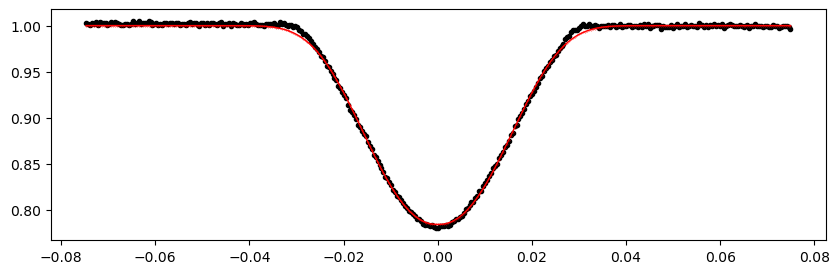

1902.862903 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1289.93it/s]


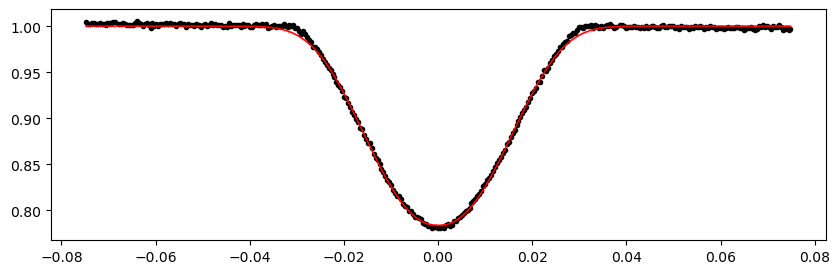

1906.204729 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.32it/s]


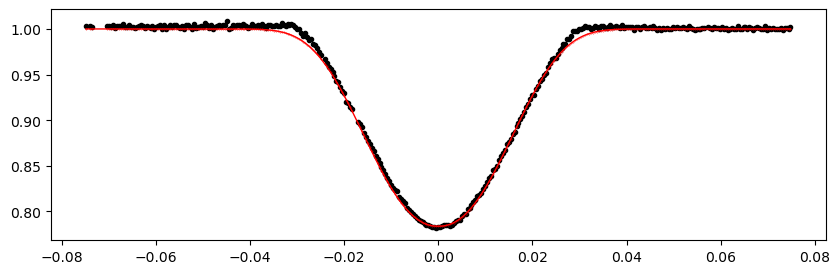

1909.5465550000001 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.28it/s]


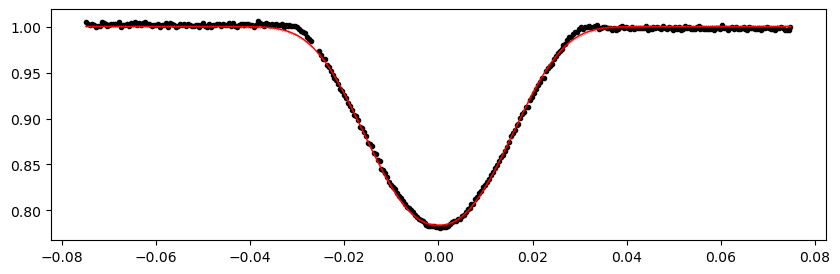

1916.230207 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1279.61it/s]


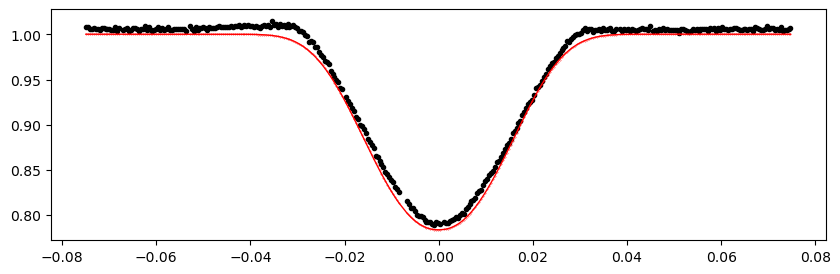

1919.5720330000001 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1274.54it/s]


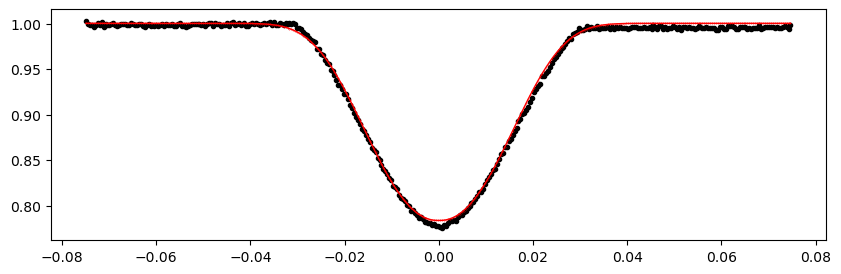

1922.913859 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1284.58it/s]


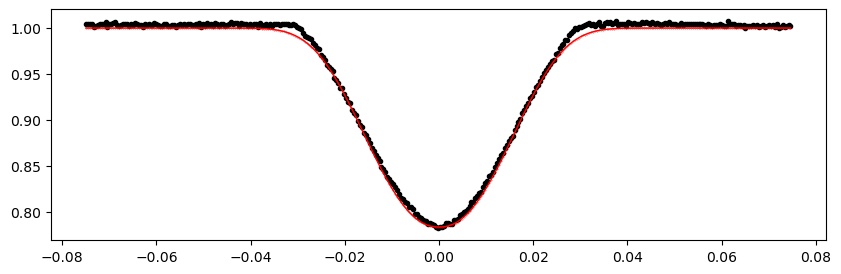

1926.255685 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1306.06it/s]


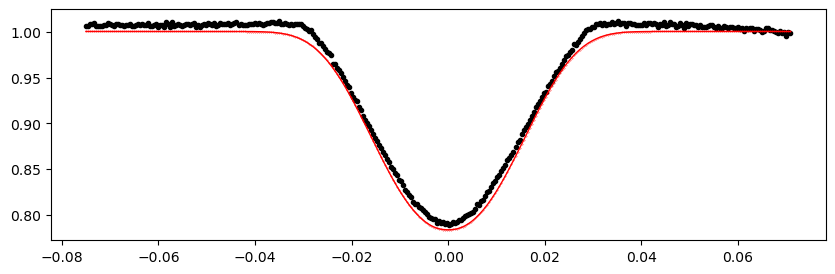

1929.597511 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1296.97it/s]


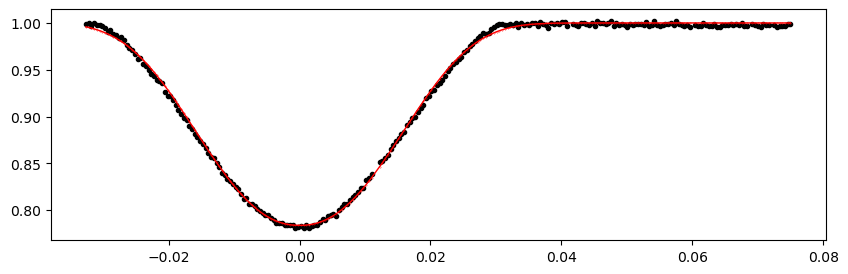

1932.939337 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1292.64it/s]


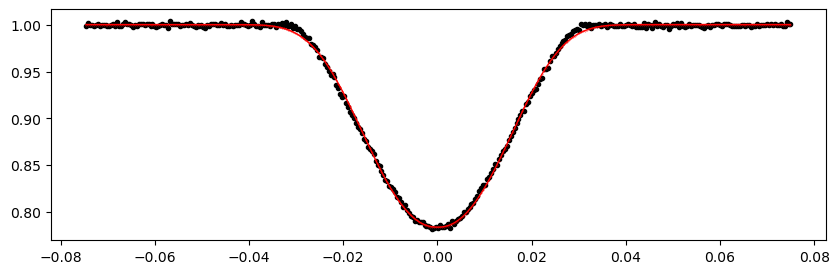

1936.281163 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1313.91it/s]


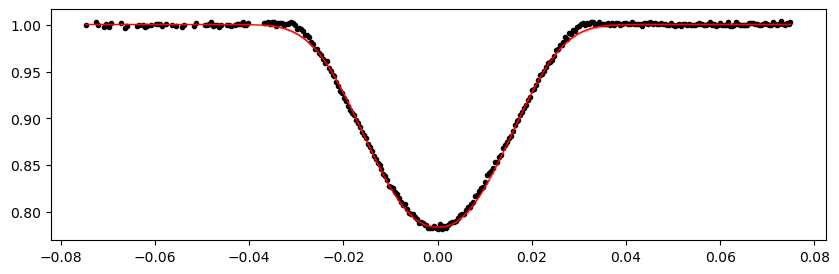

1939.622989 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.25it/s]


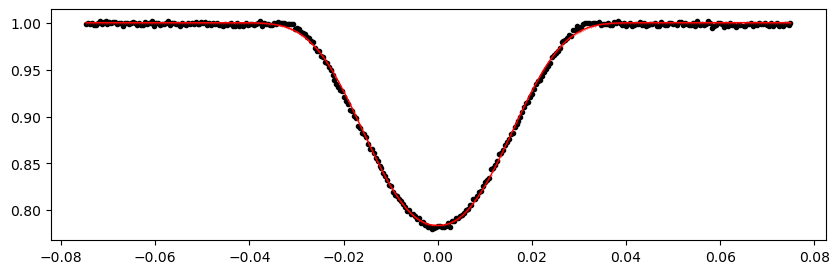

1946.3066410000001 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1319.55it/s]


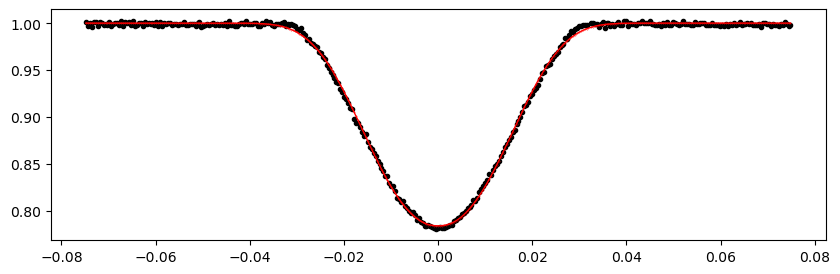

1949.648467 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1298.63it/s]


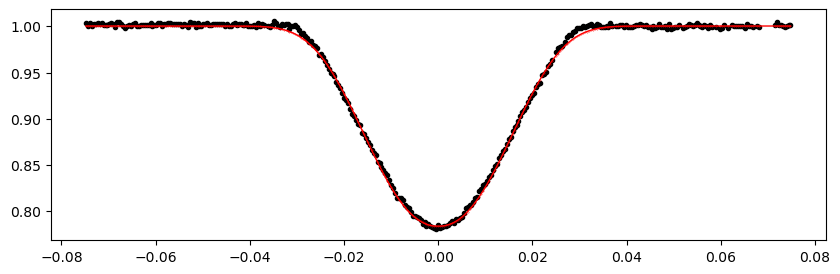

1952.990293 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1277.26it/s]


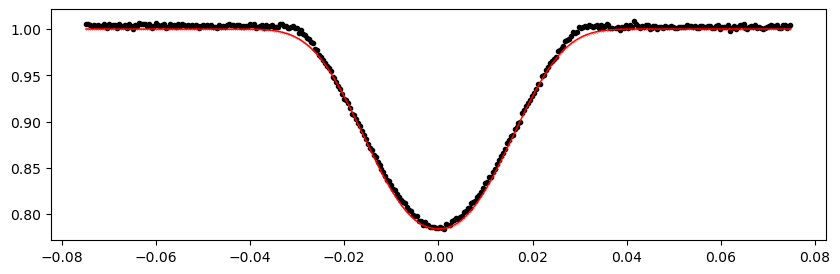

1956.3321190000001 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1305.71it/s]


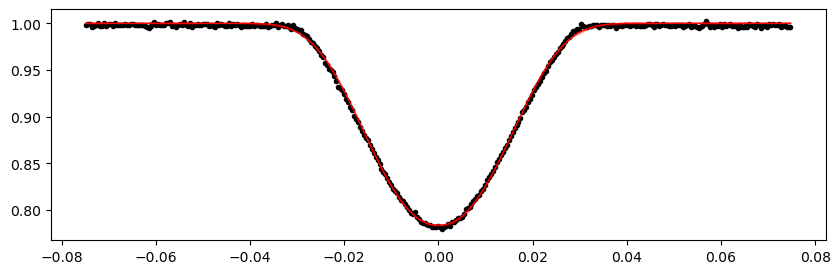

1959.673945 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1274.34it/s]


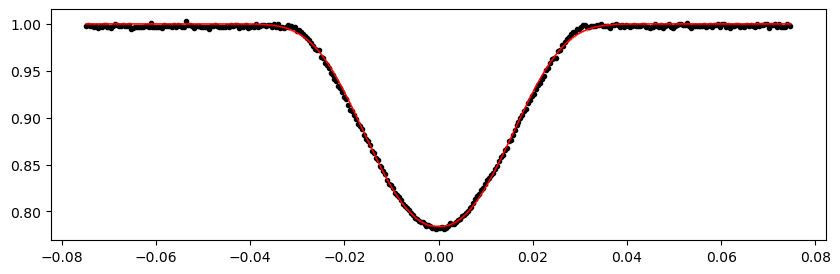

1963.015771 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1281.99it/s]


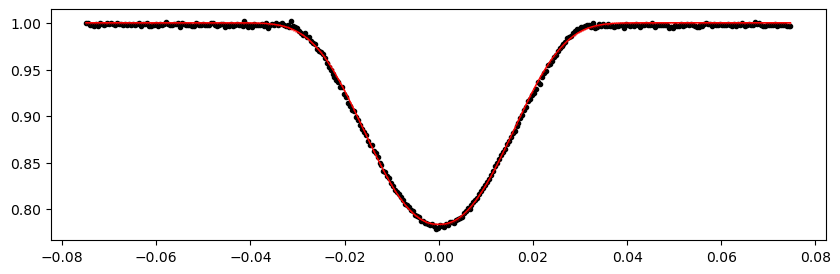

1966.3575970000002 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1259.49it/s]


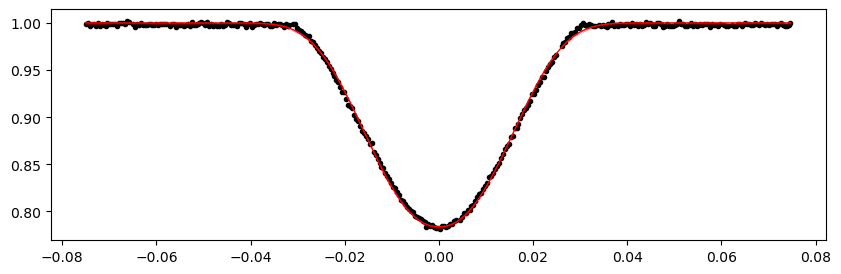

1969.699423 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1158.81it/s]


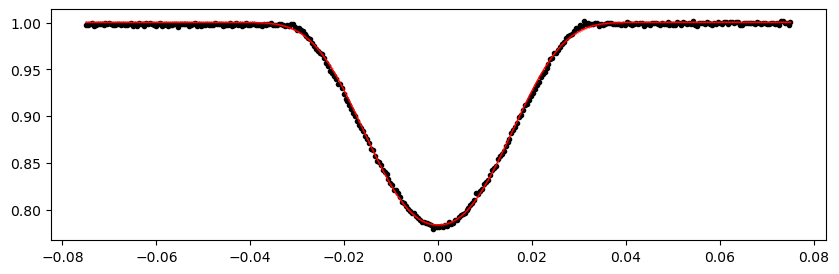

1973.041249 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1256.72it/s]


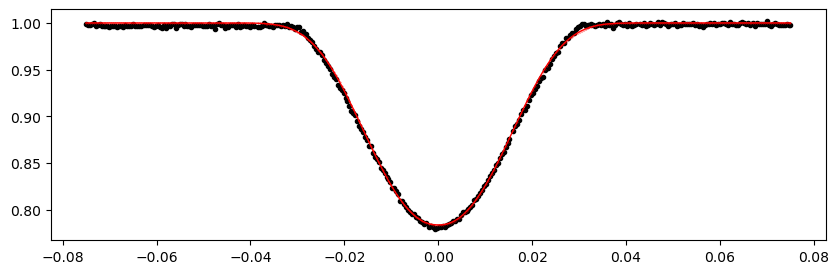

1976.3830750000002 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1271.92it/s]


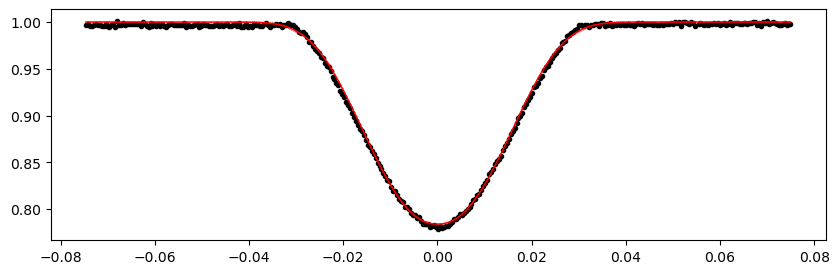

1979.724901 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1308.37it/s]


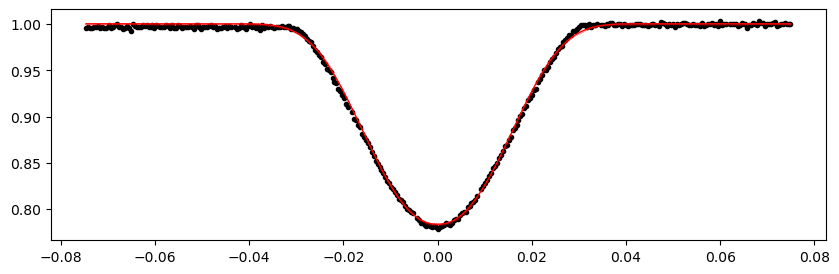

1989.750379 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1284.64it/s]


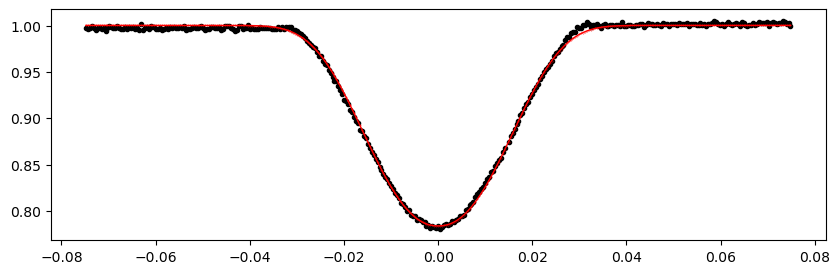

1993.092205 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1284.63it/s]


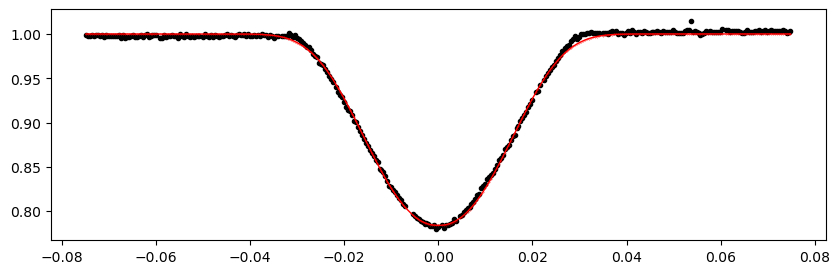

2003.117683 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1285.62it/s]


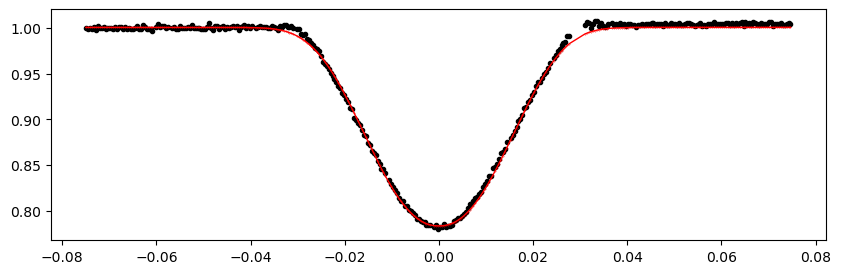

2006.459509 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1304.31it/s]


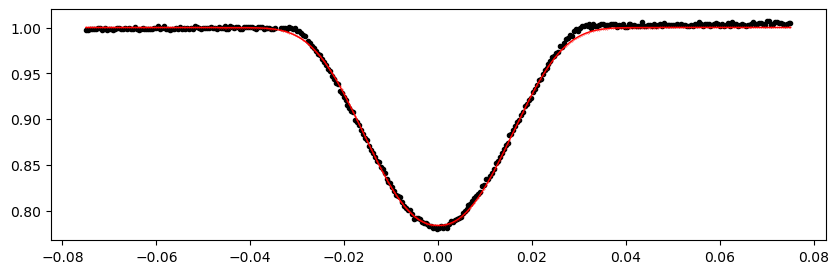

2013.143161 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1287.06it/s]


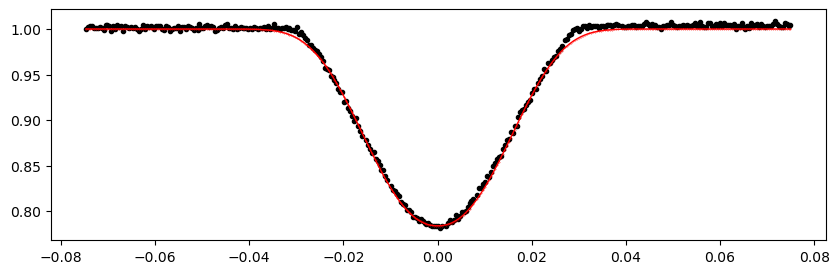

2016.484987 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1247.08it/s]


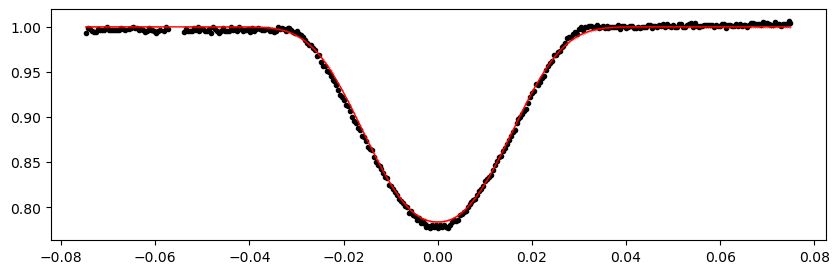

2019.8268130000001 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1279.56it/s]


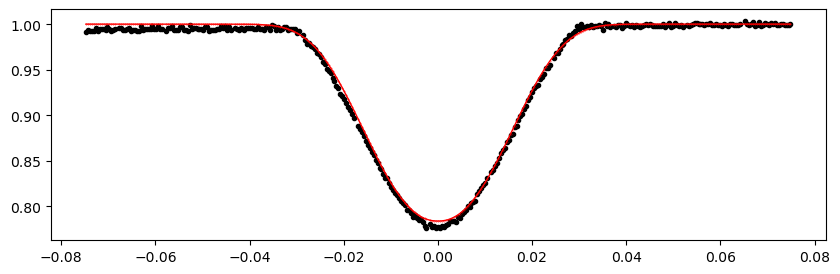

2023.168639 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.17it/s]


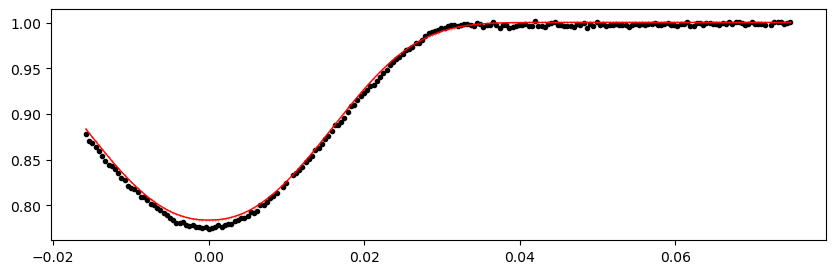

2026.510465 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1300.31it/s]


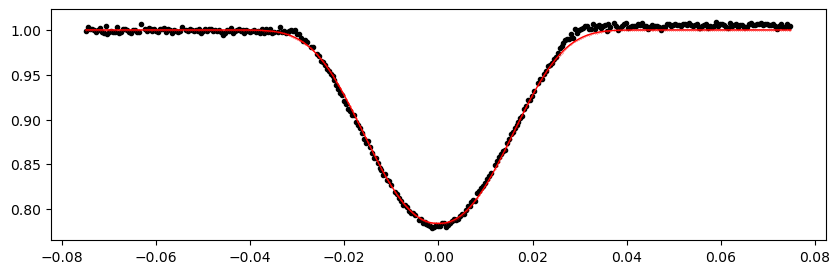

2029.8522910000002 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1274.21it/s]


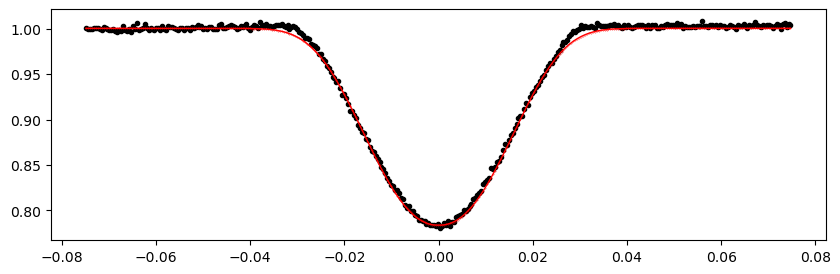

2033.194117 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1289.78it/s]


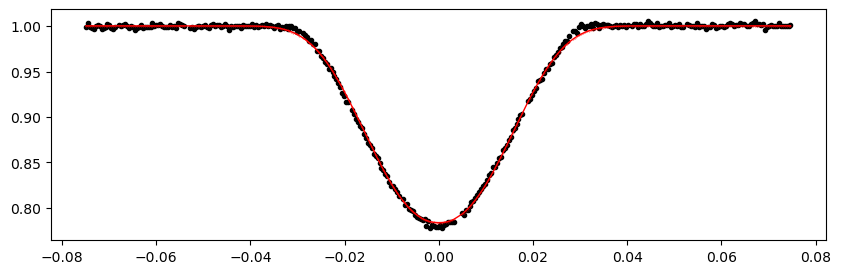

2390.769499 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1261.70it/s]


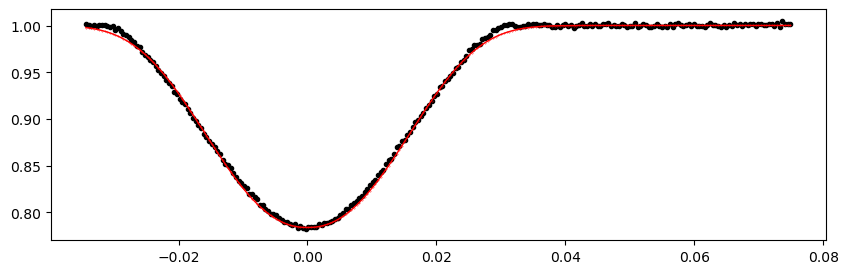

2394.111325 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1292.39it/s]


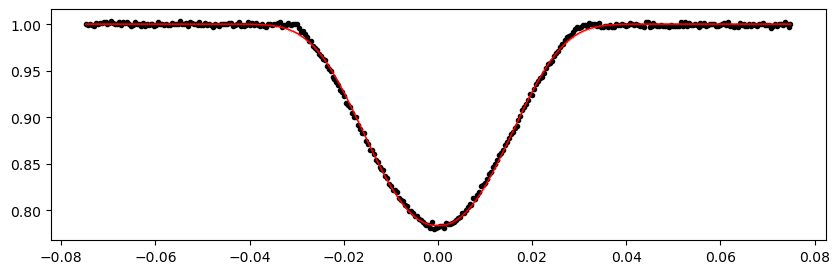

2397.453151 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1284.49it/s]


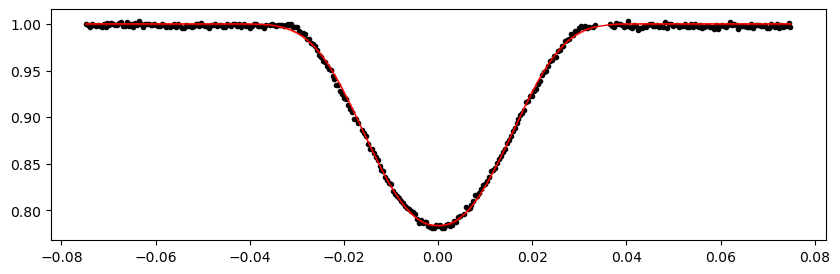

2400.794977 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1279.60it/s]


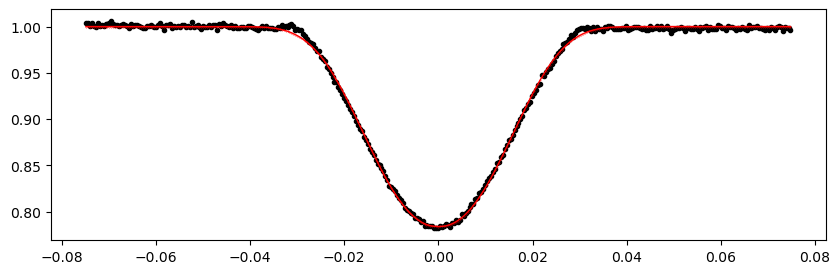

2404.1368030000003 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1285.43it/s]


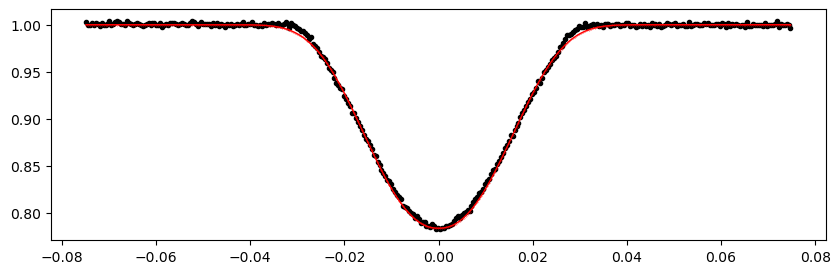

2407.478629 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.08it/s]


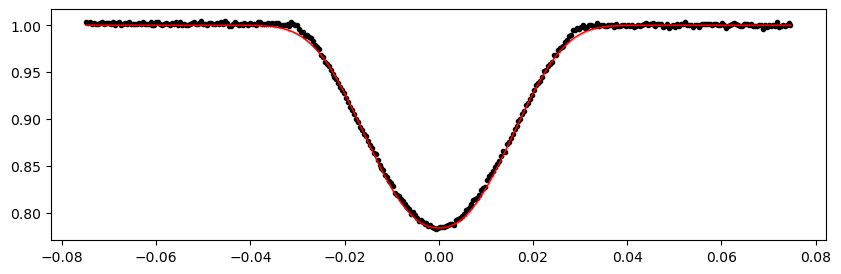

2410.820455 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1297.57it/s]


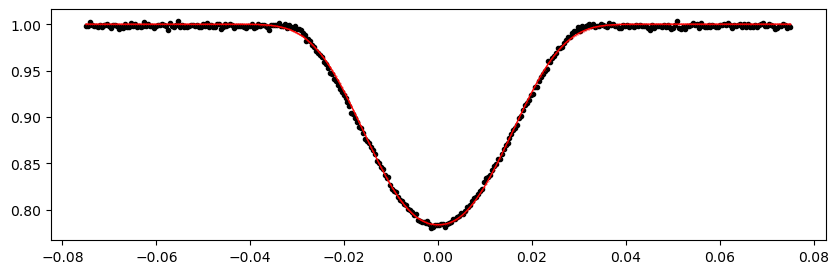

2414.162281 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1303.01it/s]


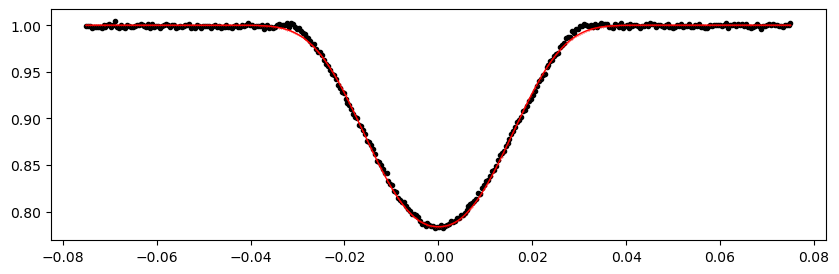

2417.504107 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1293.41it/s]


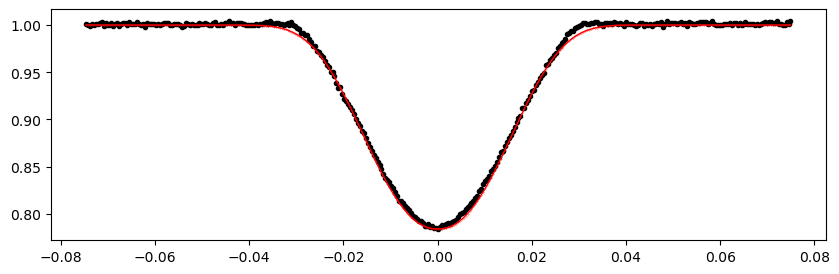

2420.845933 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1261.93it/s]


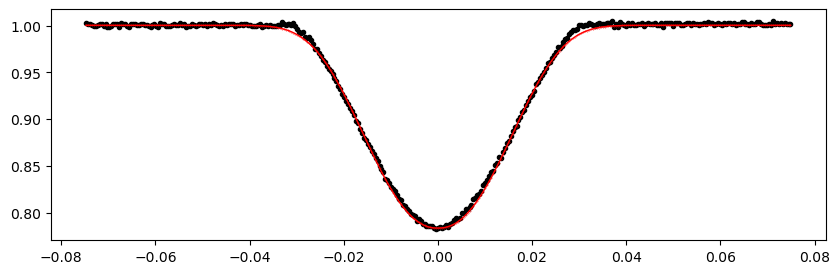

2424.187759 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1242.17it/s]


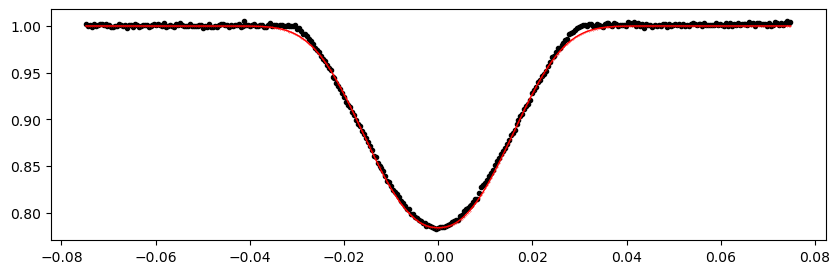

2427.529585 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1303.12it/s]


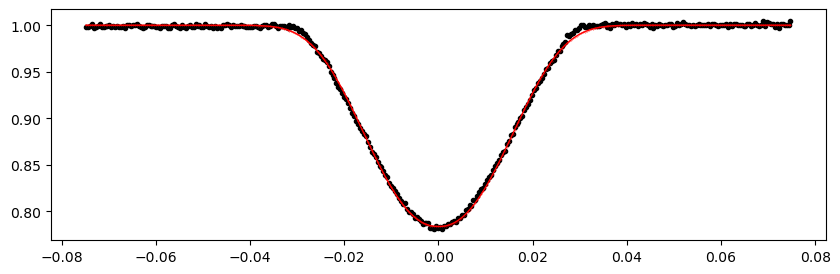

2430.871411 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1297.61it/s]


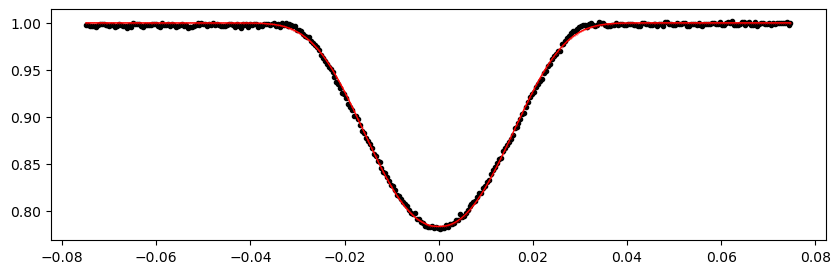

2434.213237 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.24it/s]


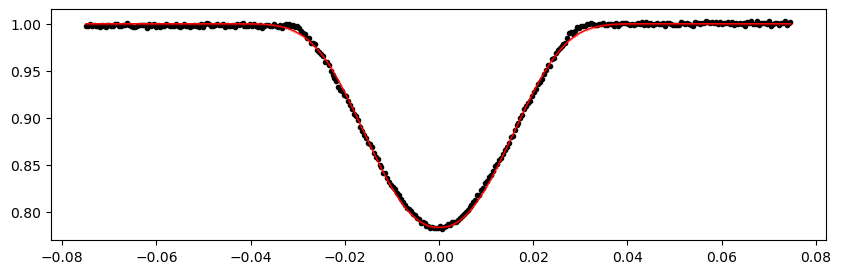

2437.5550630000002 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1303.36it/s]


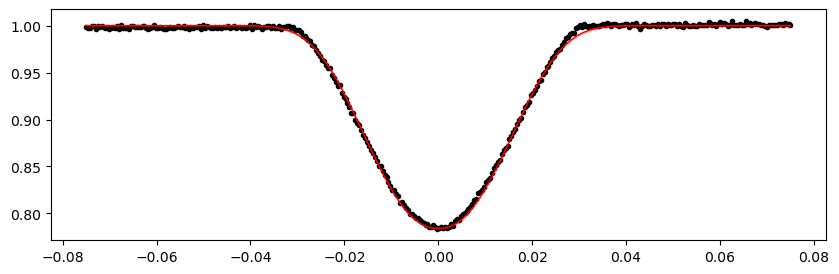

2440.896889 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1266.70it/s]


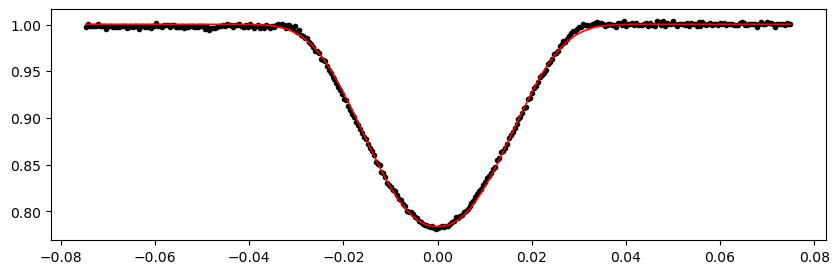

2444.238715 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.22it/s]


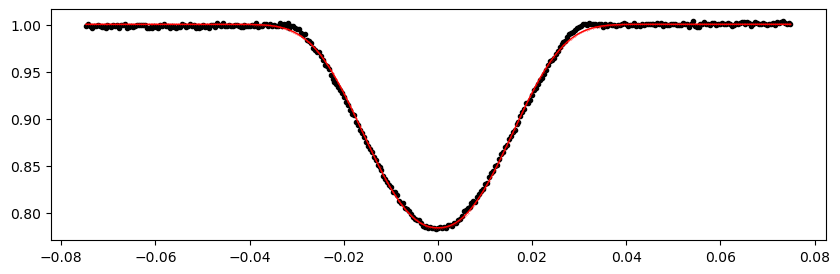

2581.253581 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1279.63it/s]


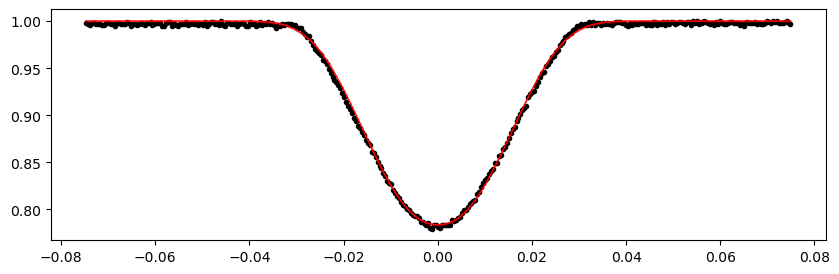

2584.5954070000003 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1270.71it/s]


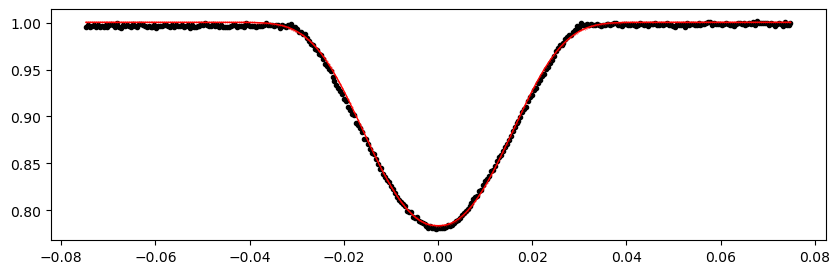

2587.937233 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1274.67it/s]


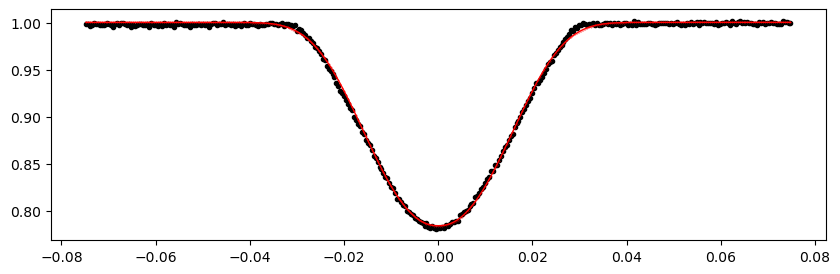

2591.279059 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.09it/s]


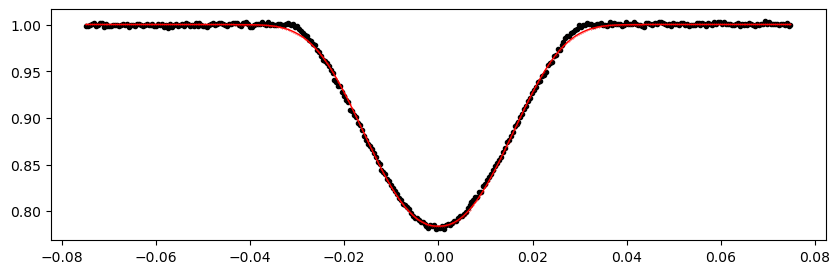

2597.962711 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1290.11it/s]


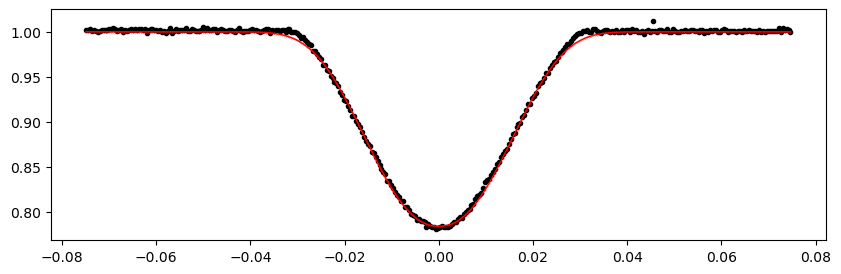

2601.304537 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1297.80it/s]


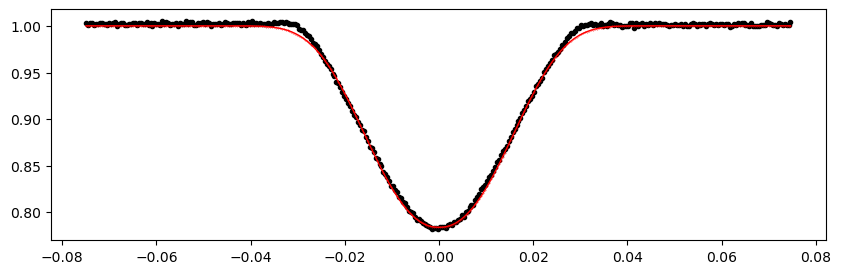

2604.646363 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1284.71it/s]


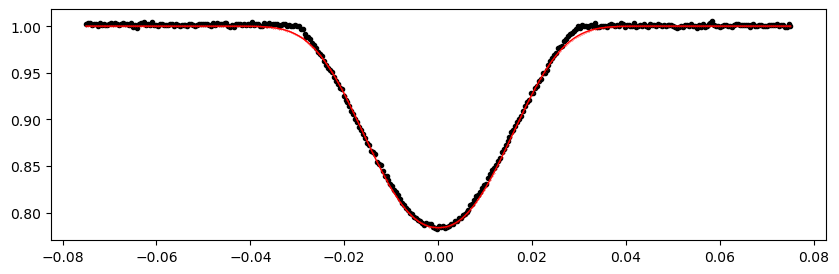

2611.330015 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1257.98it/s]


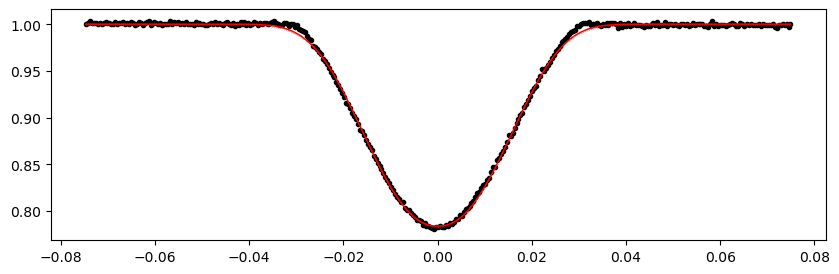

2614.6718410000003 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1276.56it/s]


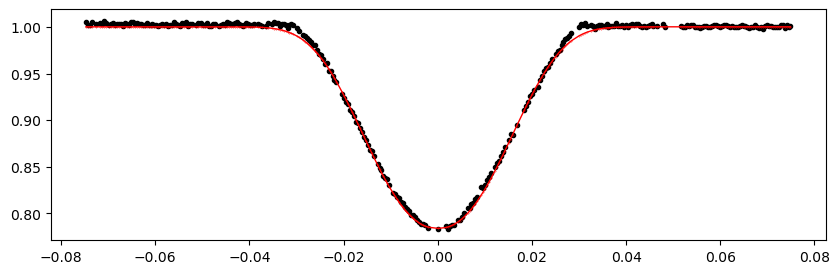

2618.013667 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1287.15it/s]


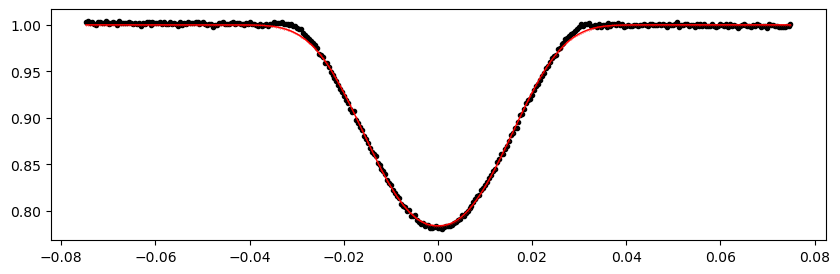

2621.355493 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1303.11it/s]


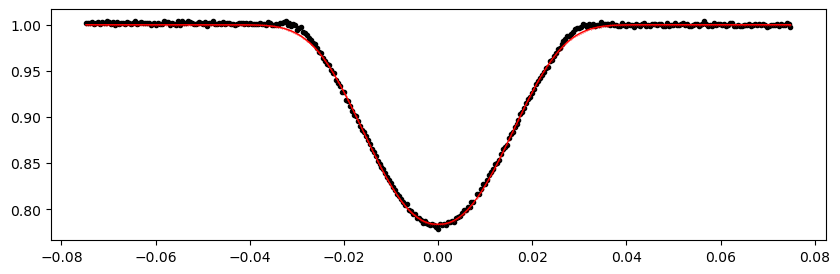

2628.039145 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1287.16it/s]


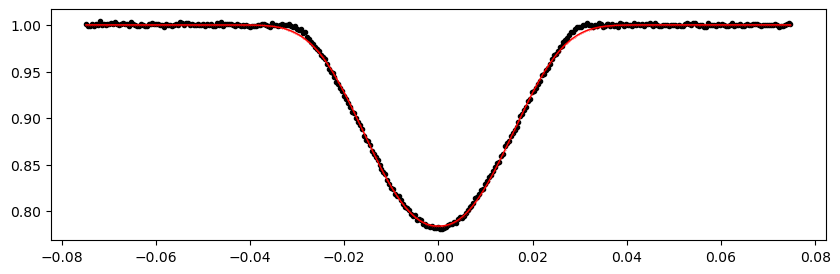

2631.380971 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1274.49it/s]


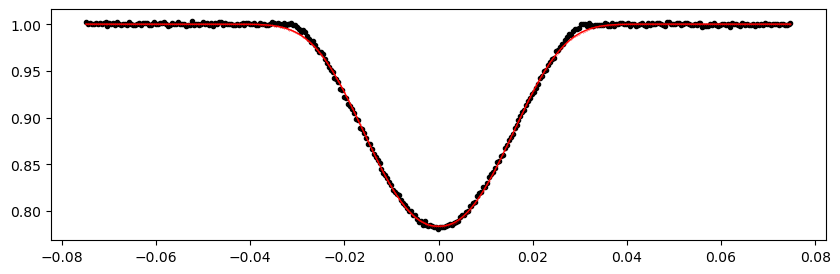

2634.7227970000004 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1289.79it/s]


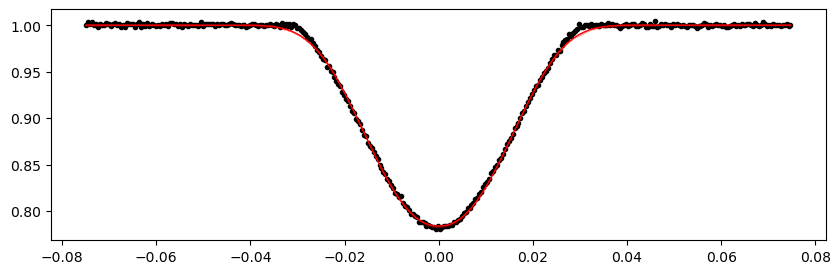

2641.406449 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1308.44it/s]


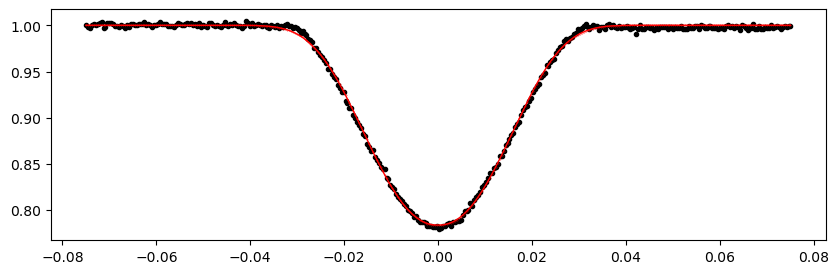

2644.748275 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1261.70it/s]


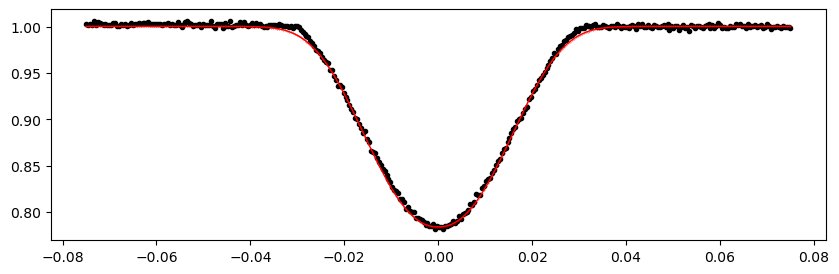

2648.0901010000002 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1279.66it/s]


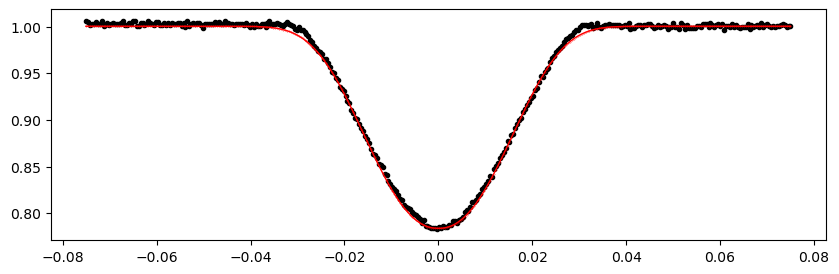

2658.1155790000003 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1289.99it/s]


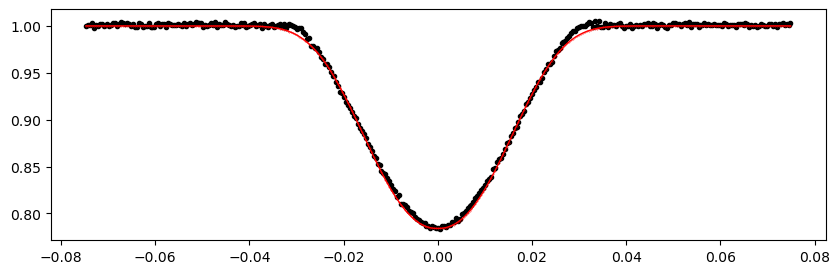

2661.457405 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1289.93it/s]


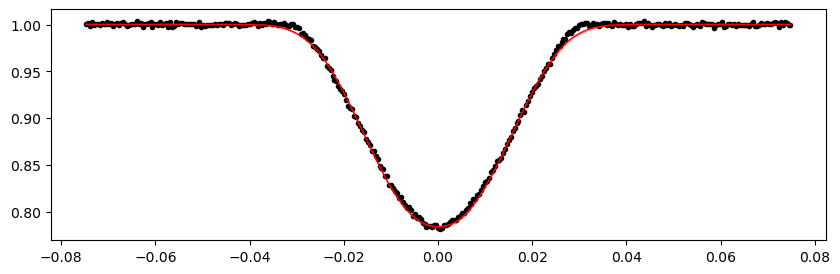

2671.482883 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1303.26it/s]


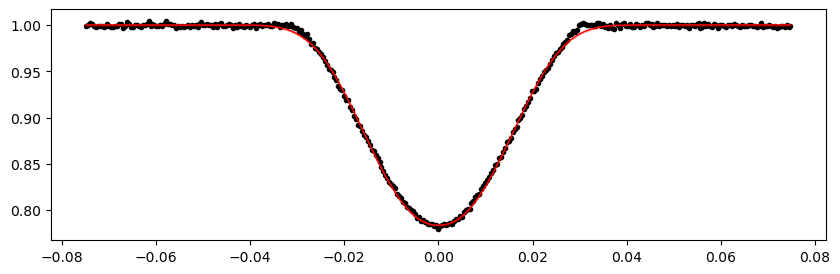

2674.824709 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1271.80it/s]


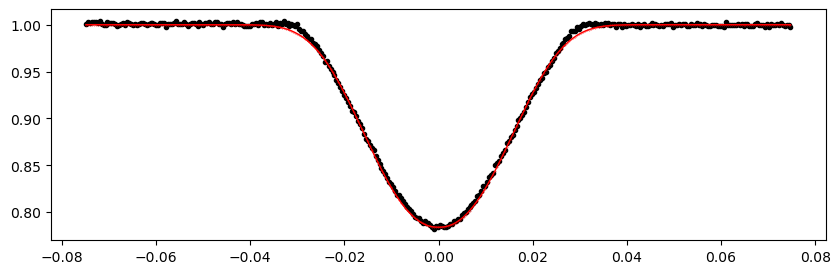

2678.1665350000003 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1300.40it/s]


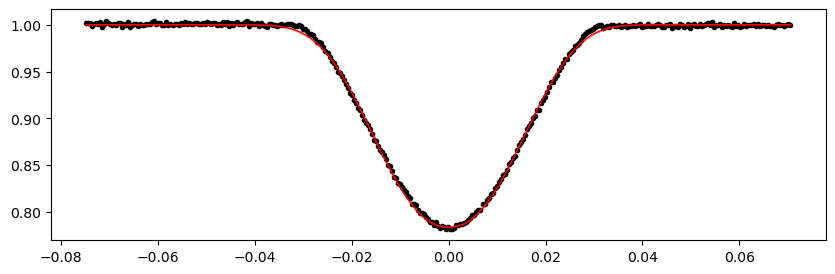

2684.850187 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1292.57it/s]


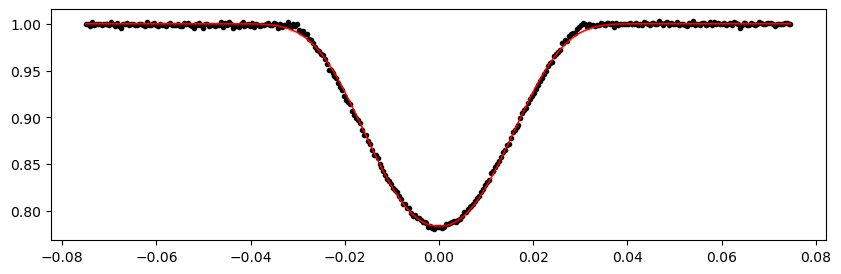

2688.192013 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1287.81it/s]


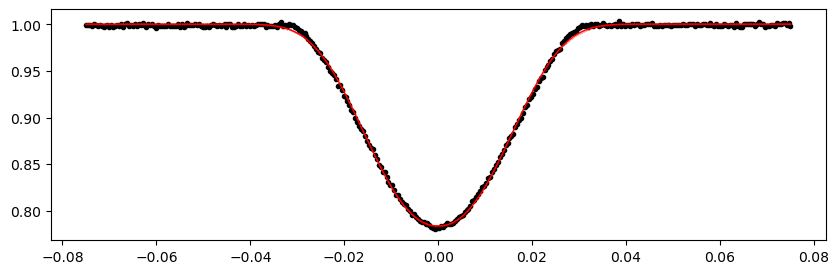

2691.533839 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.05it/s]


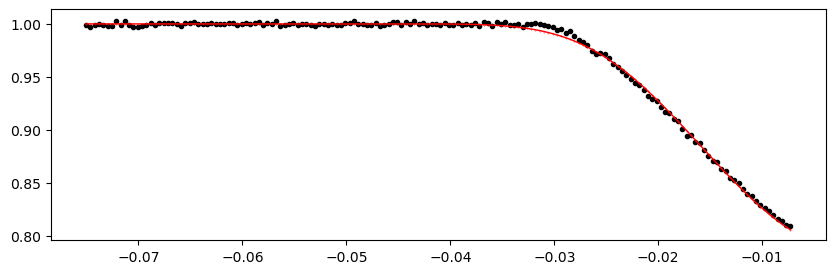

2698.2174910000003 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1303.17it/s]


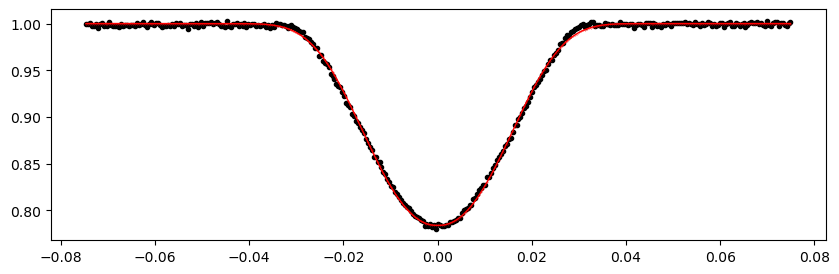

2701.559317 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1282.40it/s]


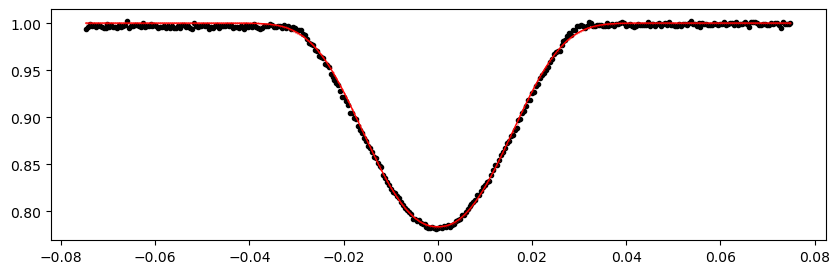

2704.901143 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1313.70it/s]


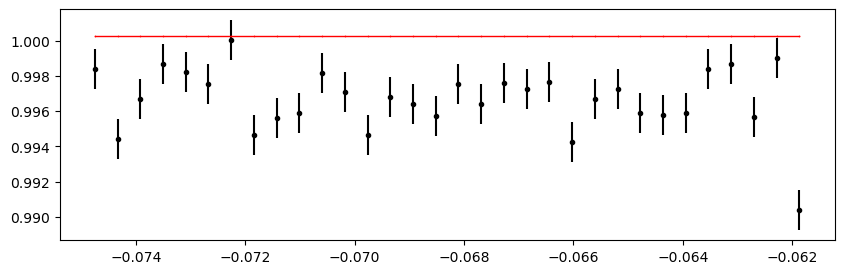

2711.5847949999998 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1266.36it/s]


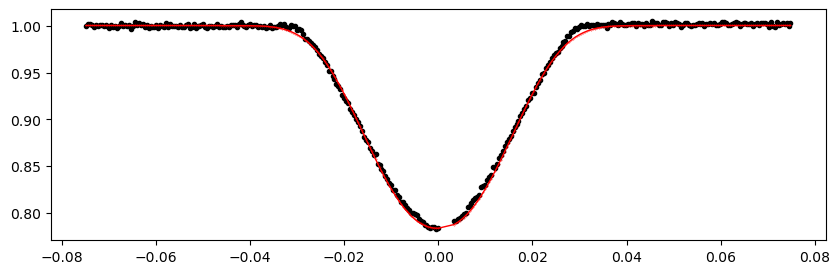

2714.926621 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1300.68it/s]


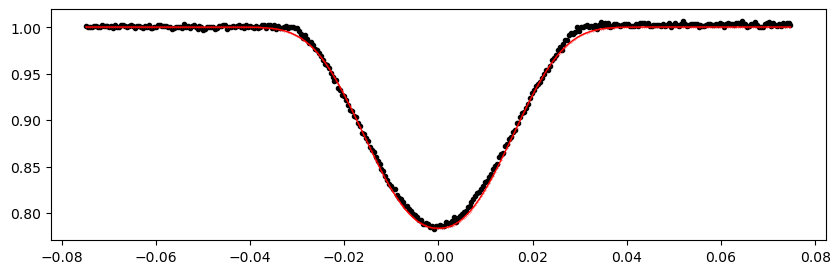

2724.952099 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1230.15it/s]


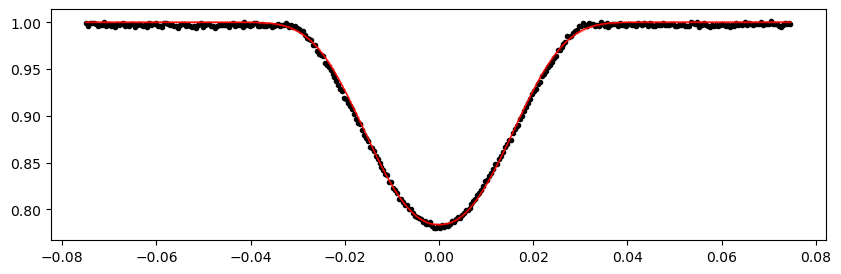

2728.293925 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1269.49it/s]


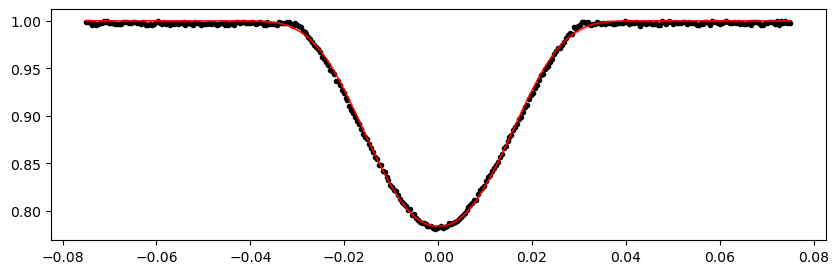

2731.635751 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1287.30it/s]


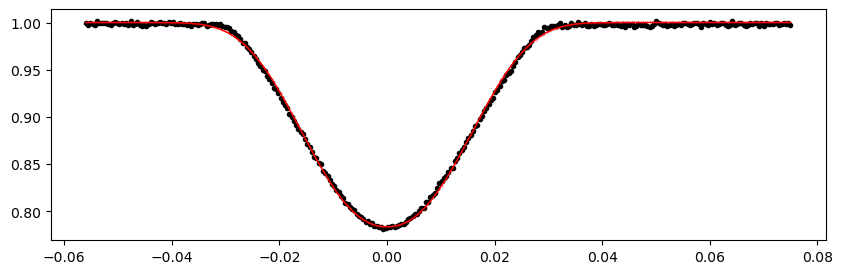

2738.3194030000004 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1285.01it/s]


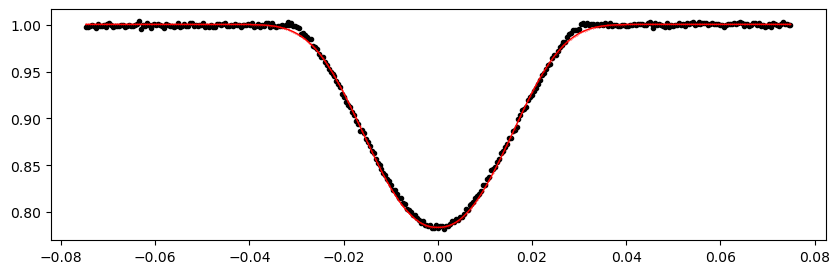

2741.6612290000003 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1259.48it/s]


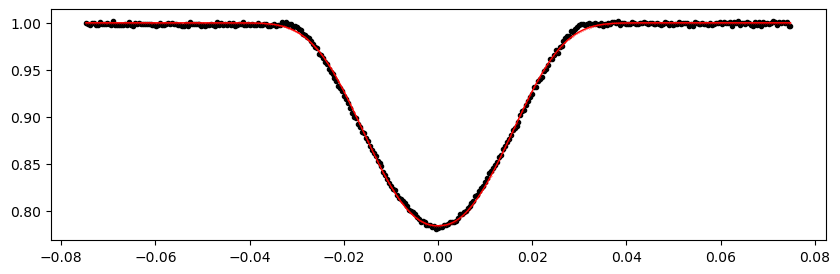

2771.737663 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.20it/s]


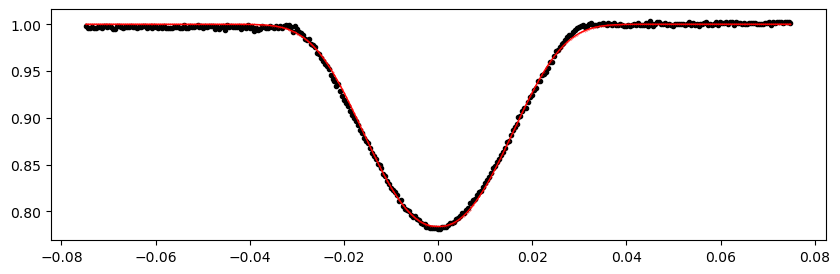

2775.079489 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1297.94it/s]


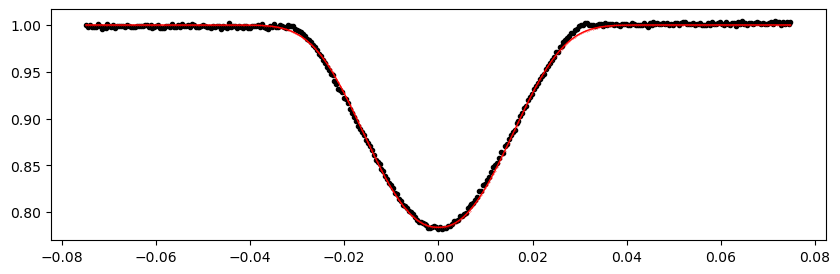

2778.421315 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1276.97it/s]


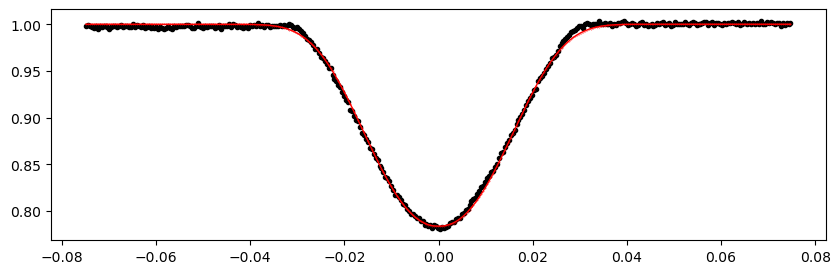

2781.7631410000004 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1274.18it/s]


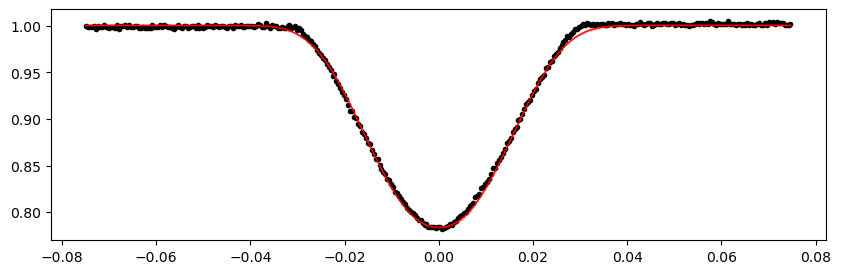

2785.104967 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1269.20it/s]


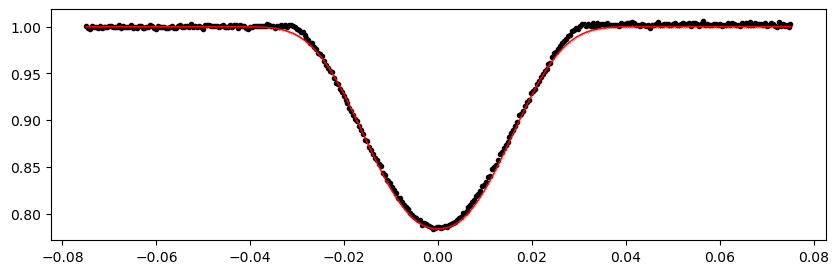

2788.446793 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1287.34it/s]


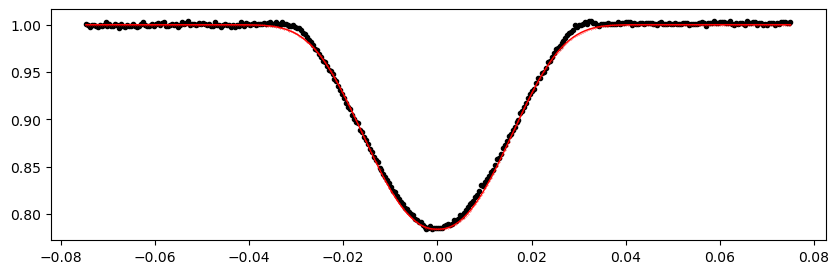

2791.788619 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1297.96it/s]


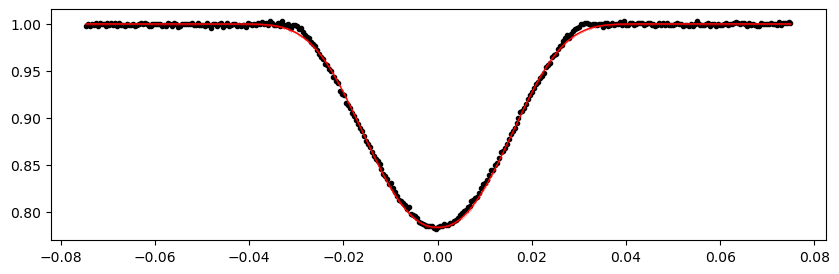

2795.130445 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1308.57it/s]


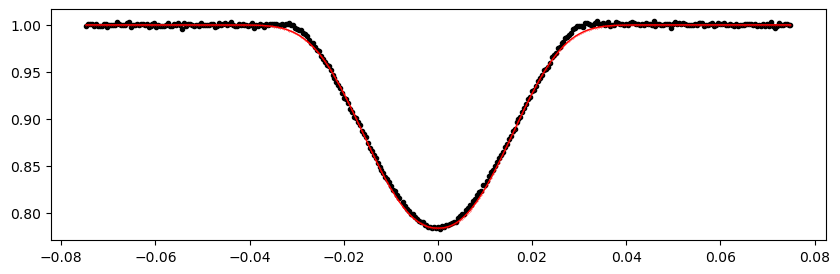

2798.472271 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1287.50it/s]


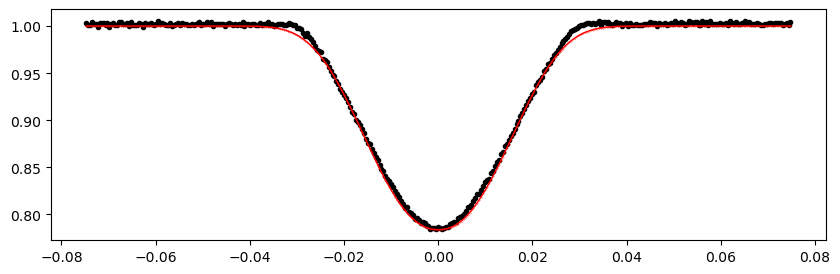

2801.8140970000004 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1264.07it/s]


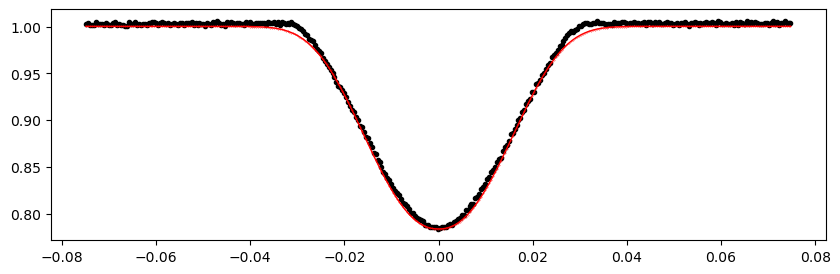

2805.1559230000003 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1261.45it/s]


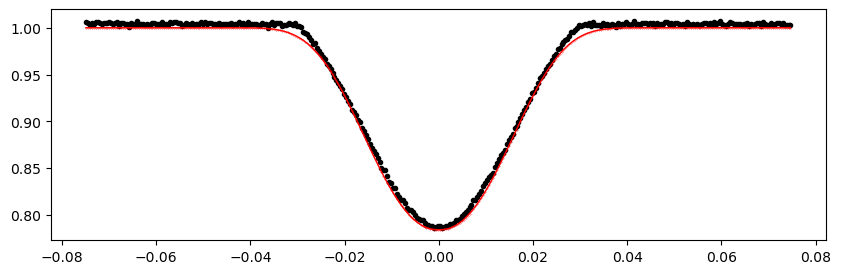

2808.497749 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1271.87it/s]


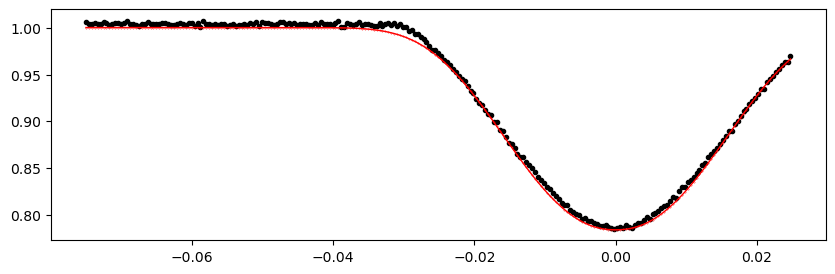

2811.839575 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1276.91it/s]


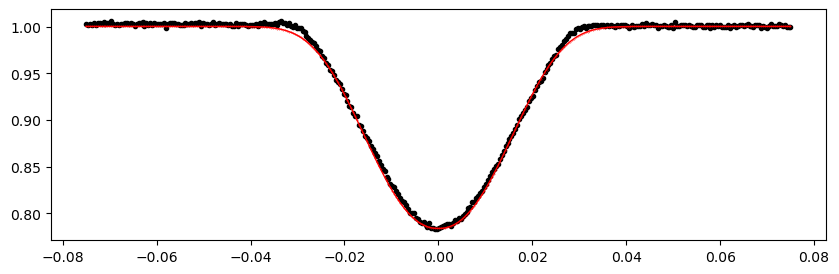

2815.181401 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1297.51it/s]


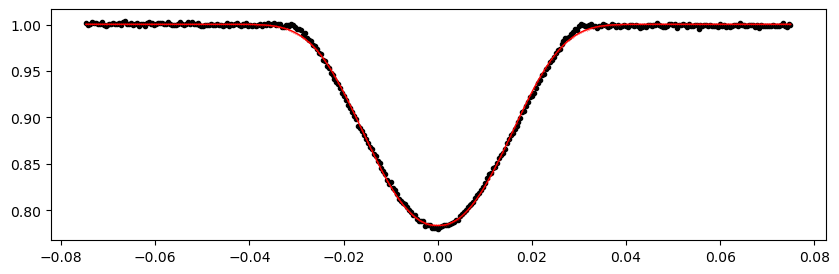

2818.523227 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1289.91it/s]


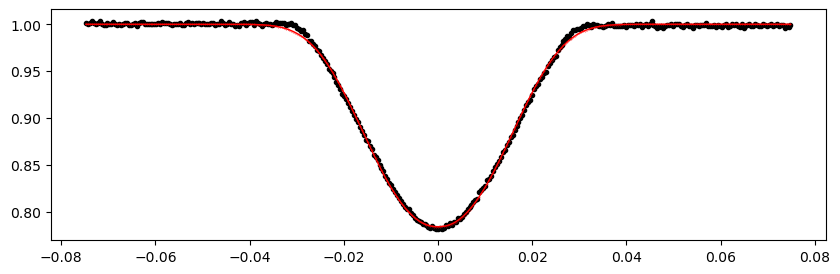

2821.865053 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1290.07it/s]


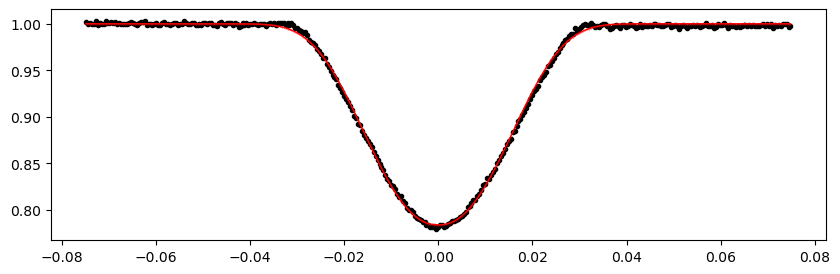

2825.2068790000003 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1305.68it/s]


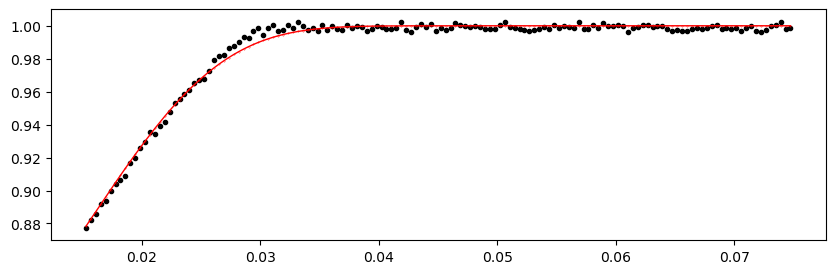

2828.548705 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1280.98it/s]


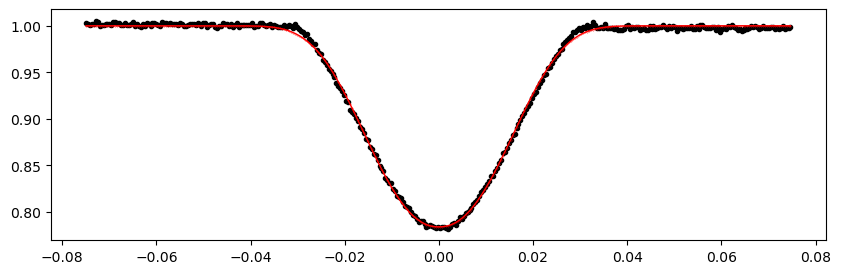

2831.890531 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1279.67it/s]


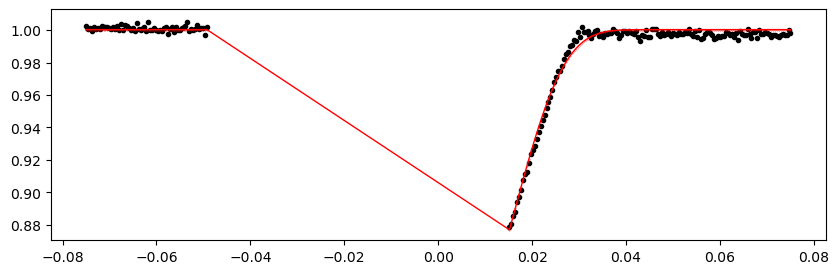

2835.232357 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1263.71it/s]


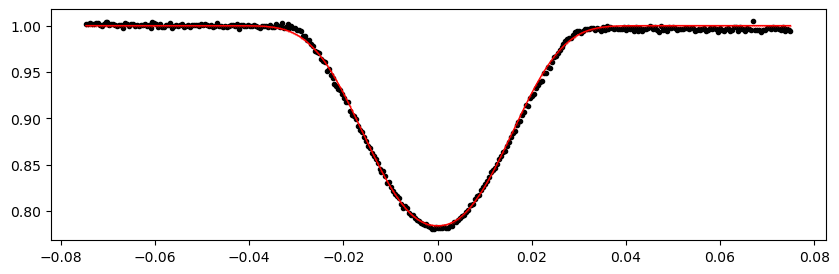

2838.574183 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1305.59it/s]


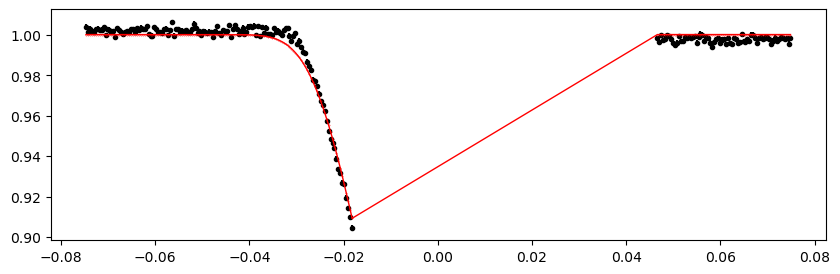

2841.916009 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1308.34it/s]


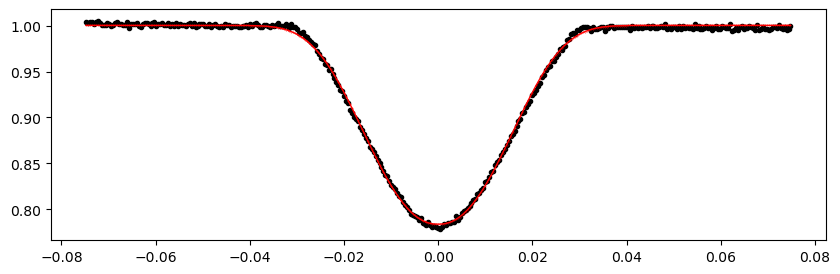

2845.2578350000003 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1287.30it/s]


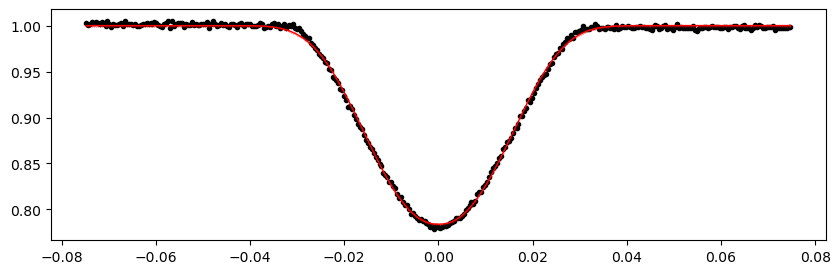

2848.599661 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1282.33it/s]


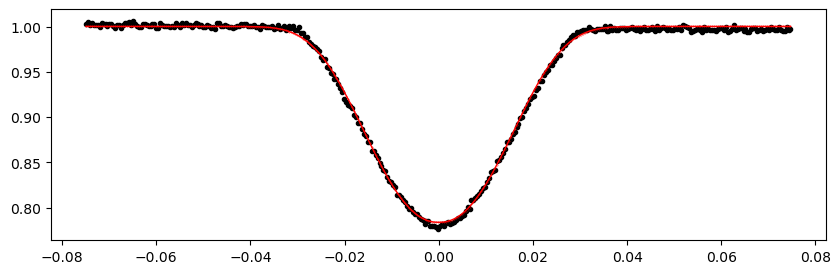

2851.941487 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1271.72it/s]


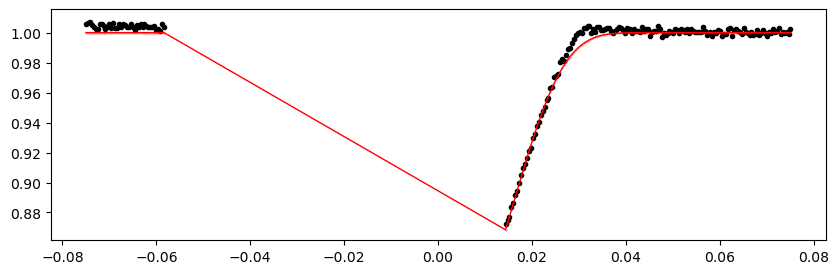

2855.283313 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1292.52it/s]


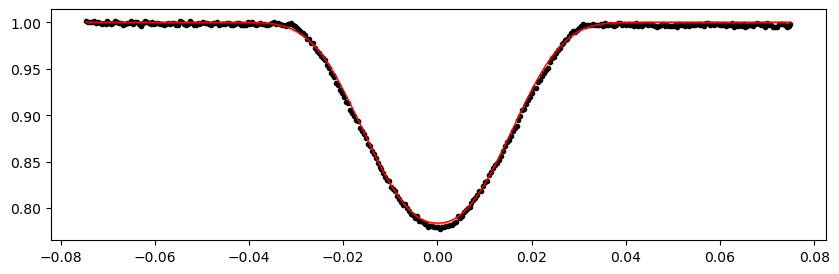

2858.6251389999998 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1264.38it/s]


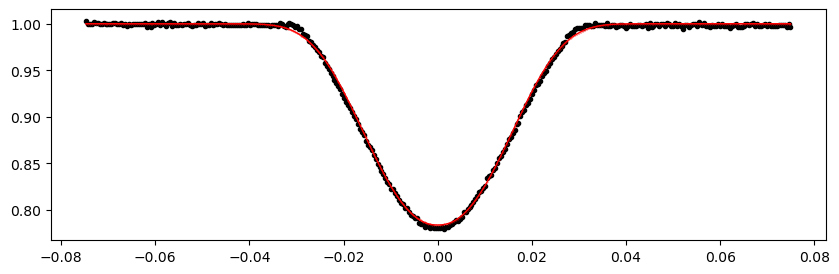

2861.966965 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1276.82it/s]


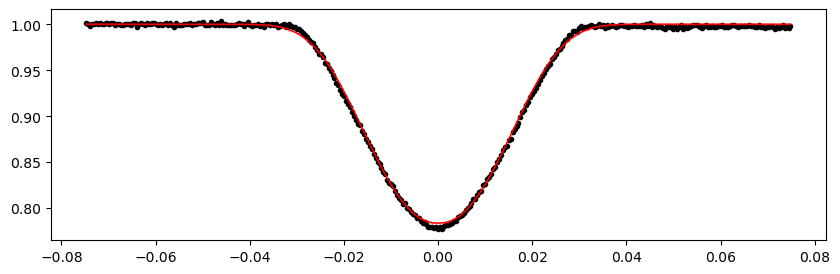

2868.6506170000002 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1300.65it/s]


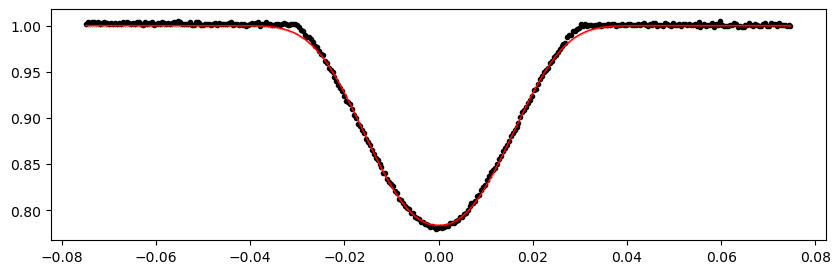

2871.992443 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1292.75it/s]


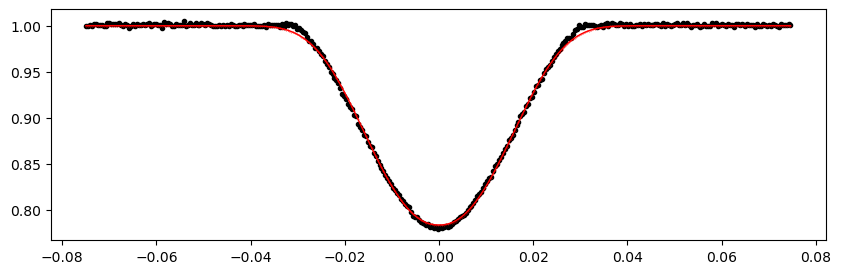

2875.334269 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1298.43it/s]


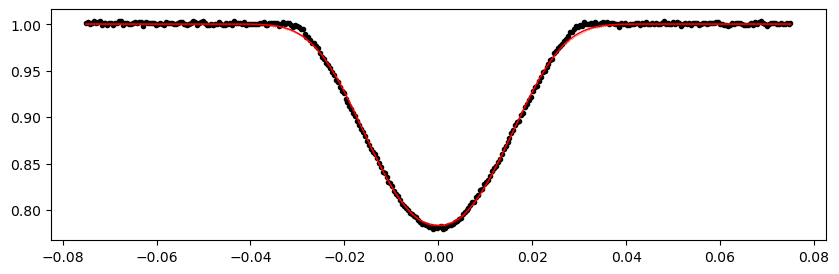

2878.676095 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1305.86it/s]


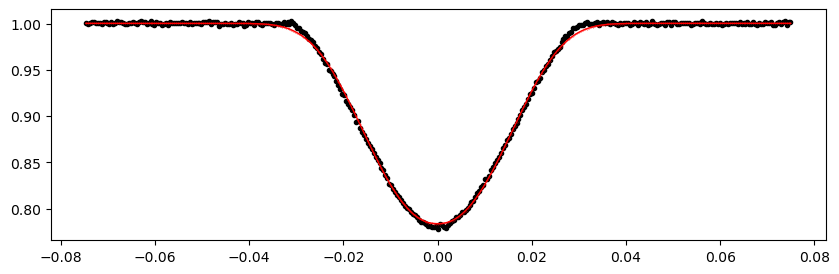

2882.017921 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1290.02it/s]


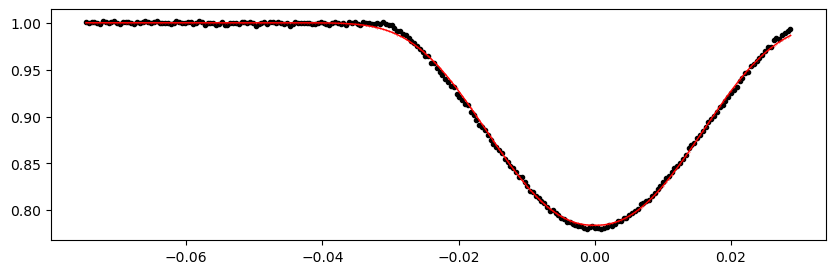

2885.3597470000004 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1273.82it/s]


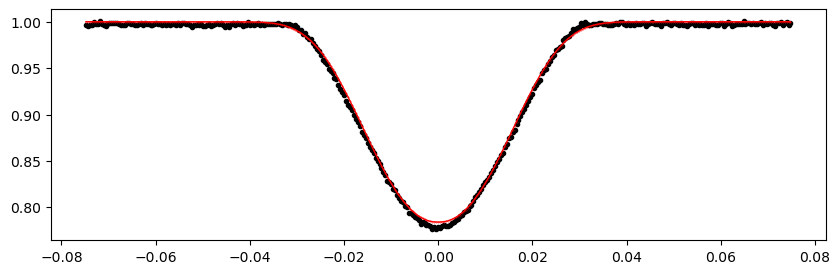

2888.7015730000003 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1297.86it/s]


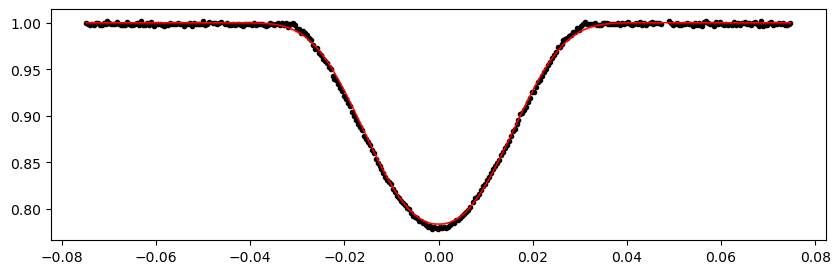

2892.043399 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1303.23it/s]


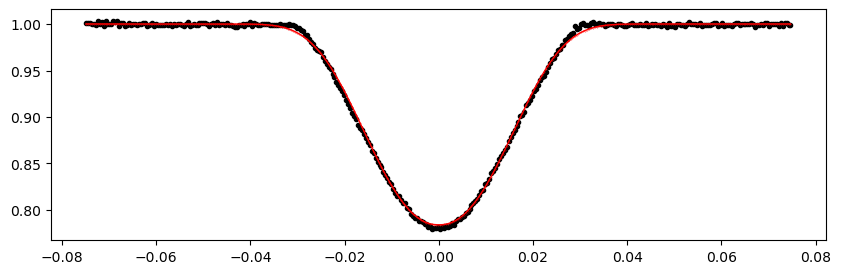

2895.385225 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1303.45it/s]


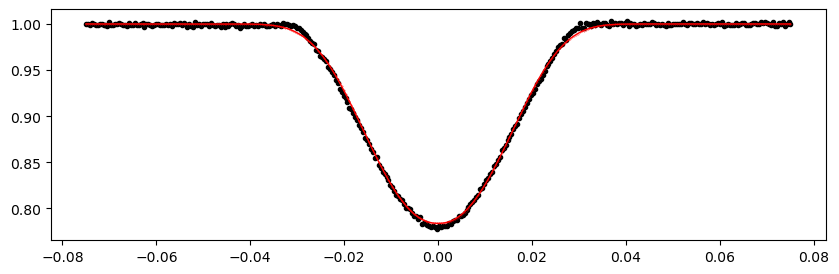

2898.727051 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1275.16it/s]


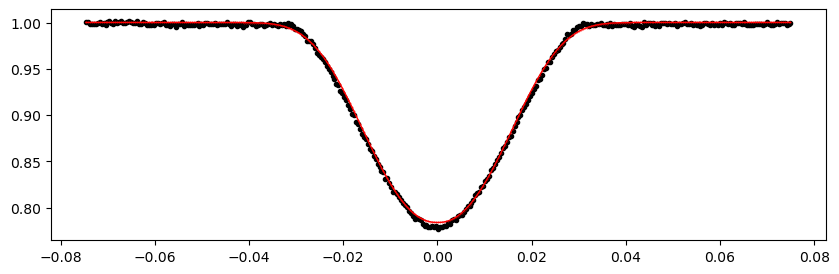

2902.068877 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.28it/s]


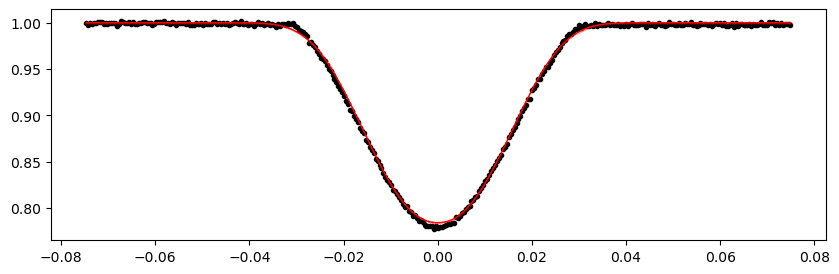

2905.410703 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1313.62it/s]


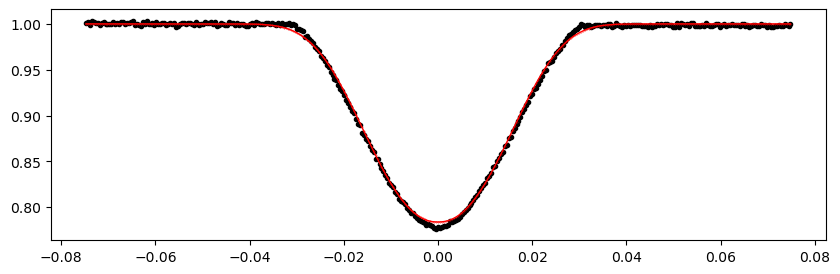

2908.7525290000003 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1292.53it/s]


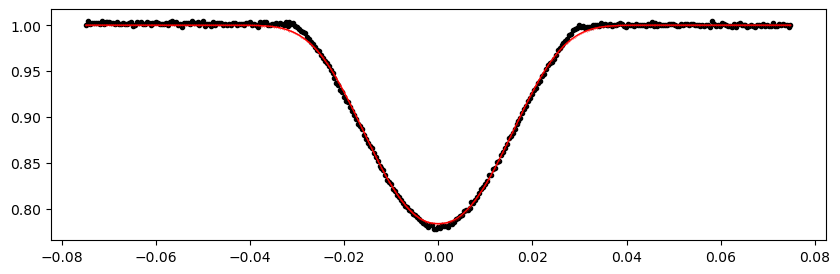

2912.094355 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1264.40it/s]


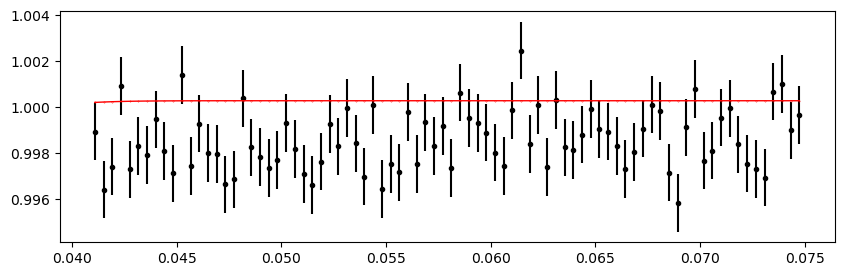

2915.436181 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1261.92it/s]


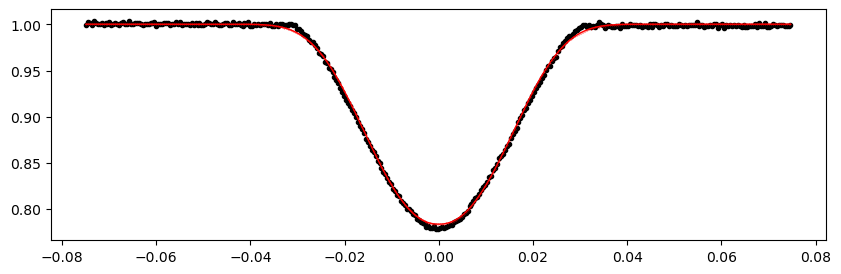

2918.778007 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1289.73it/s]


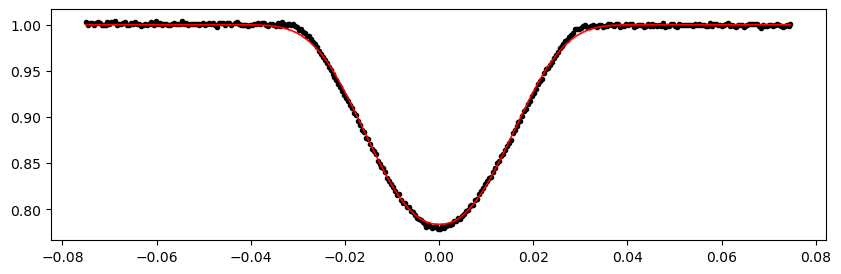

2922.119833 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1281.82it/s]


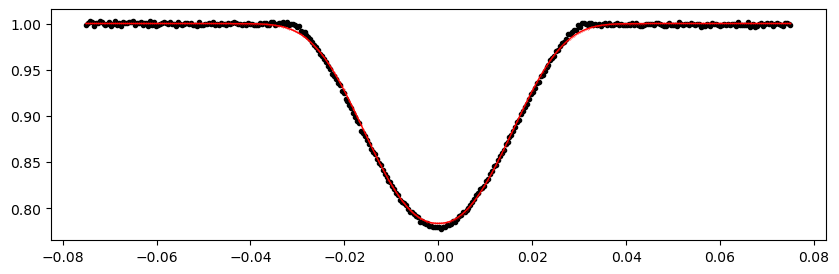

2928.8034850000004 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.14it/s]


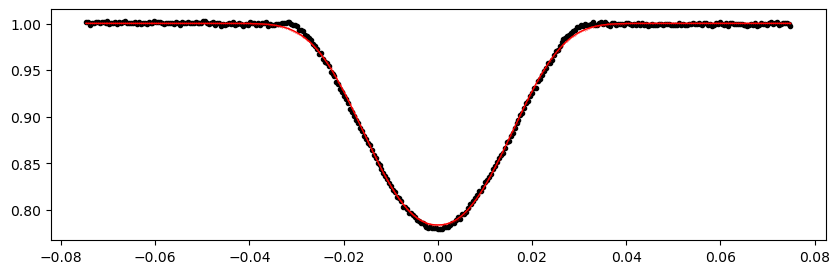

2932.145311 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1296.26it/s]


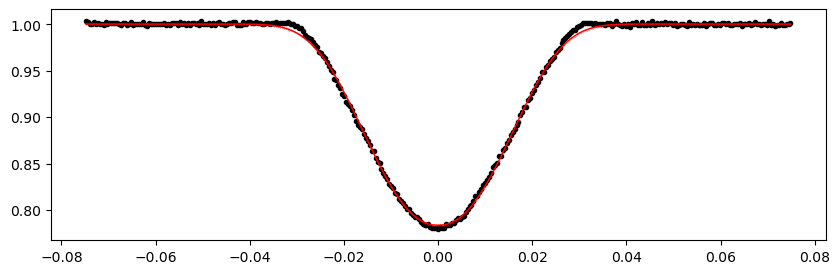

2935.487137 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1290.08it/s]


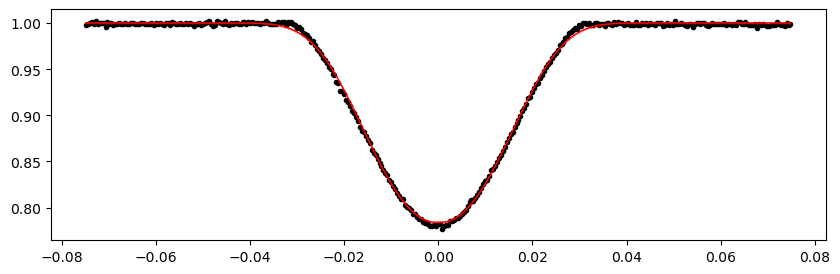

2942.170789 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1251.20it/s]


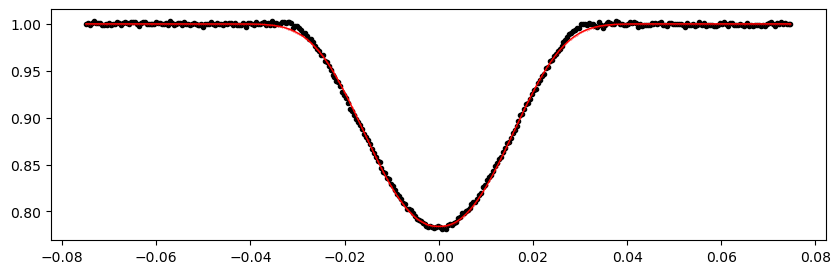

2945.512615 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1255.17it/s]


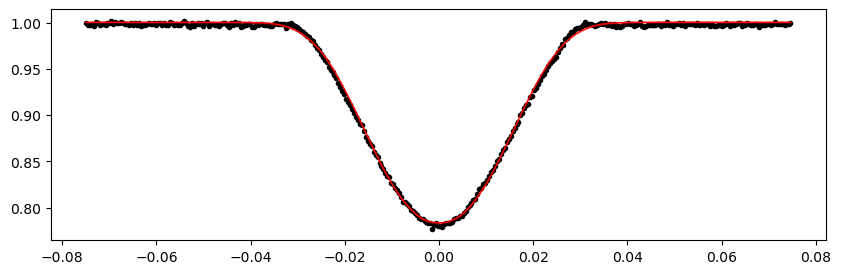

2948.8544410000004 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1297.90it/s]


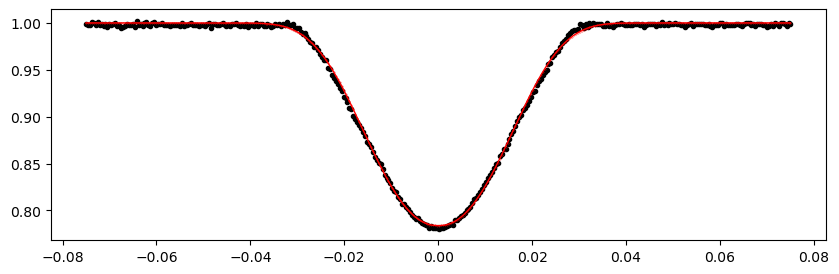

2955.538093 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1287.62it/s]


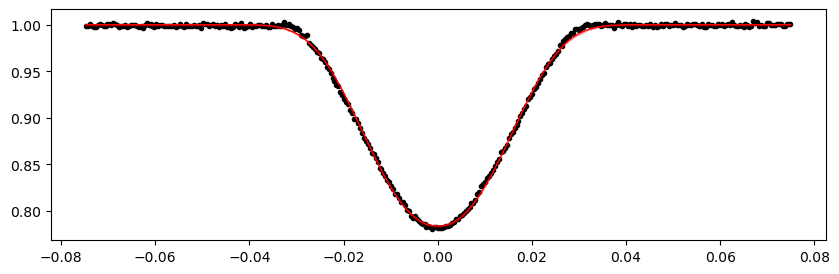

2958.879919 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1279.60it/s]


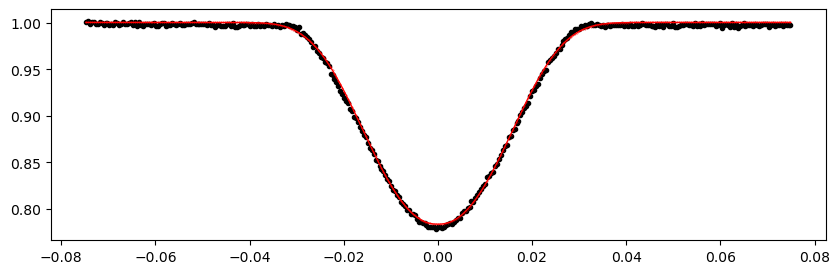

2962.221745 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1308.47it/s]


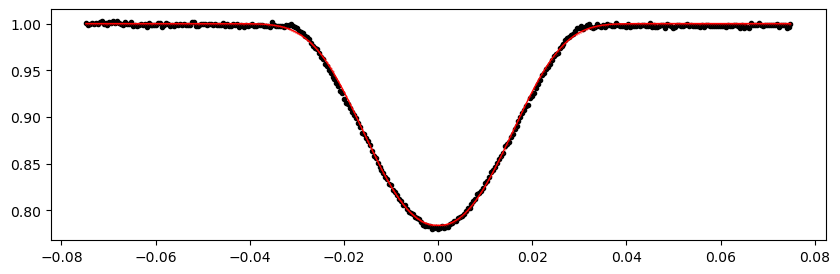

3293.062519 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1274.54it/s]


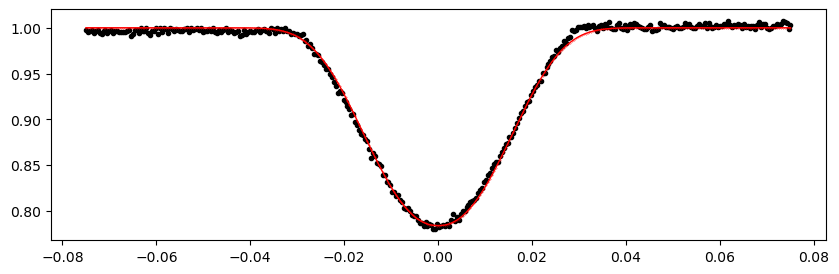

3296.404345 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1277.21it/s]


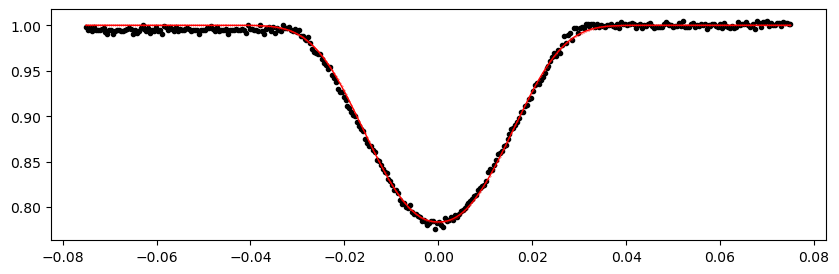

3306.4298230000004 1.0002761396156714 -0.2164428588578063 0.40801899650994067


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1297.73it/s]


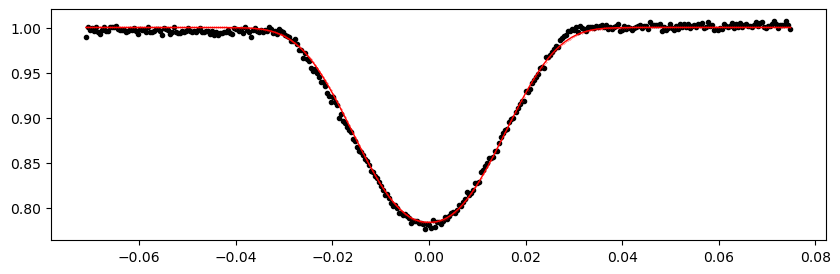

Fitting individual secondary eclipses...
Creating new manifest file
1683.9733 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


  0%|                                                                    | 0/10000 [00:00<?, ?it/s]C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1289.76it/s]


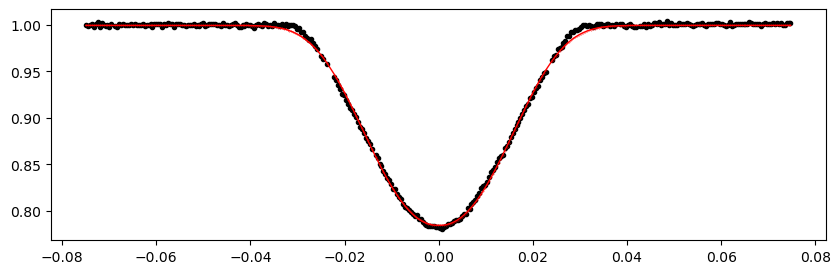

1687.3151260000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1311.09it/s]


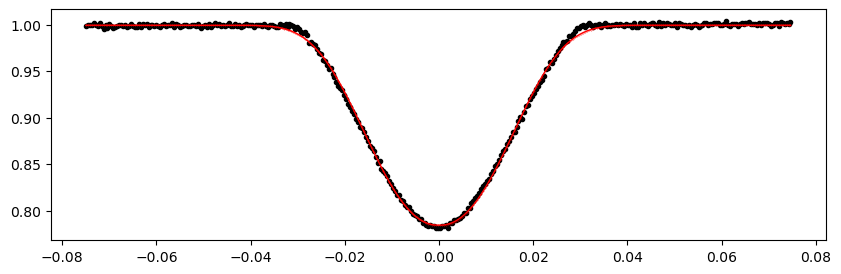

1690.656952 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1272.79it/s]


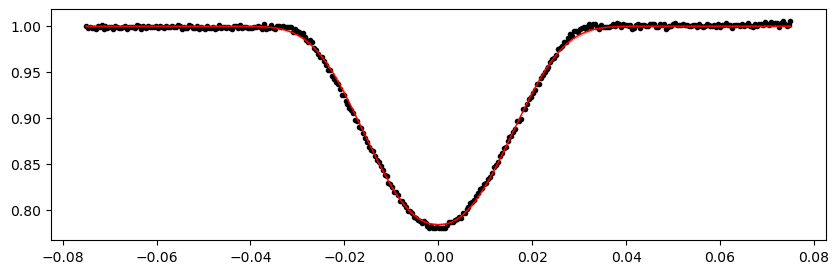

1697.3406040000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1277.03it/s]


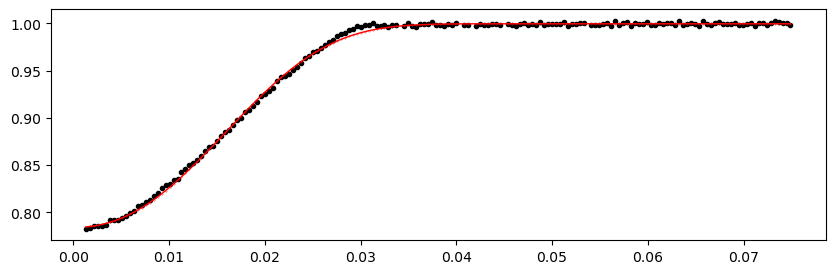

1700.68243 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1276.98it/s]


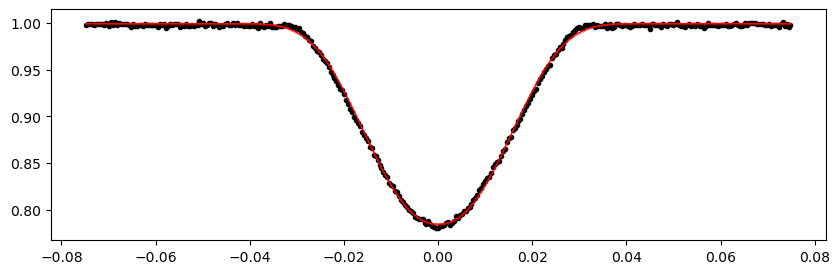

1704.0242560000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1274.49it/s]


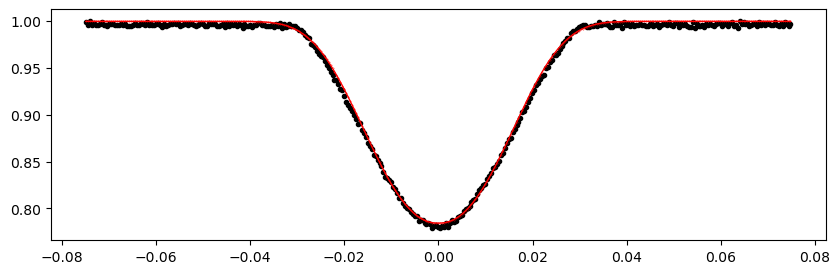

1714.0497340000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1279.55it/s]


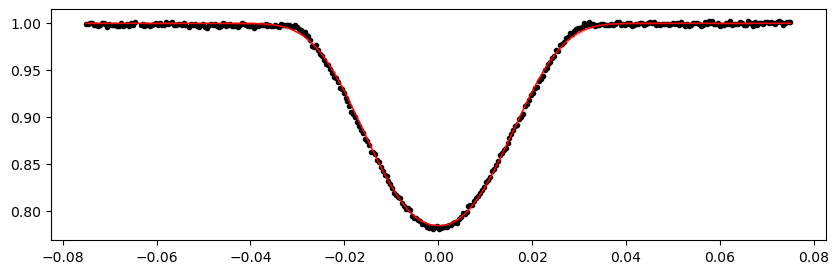

1717.39156 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1266.70it/s]


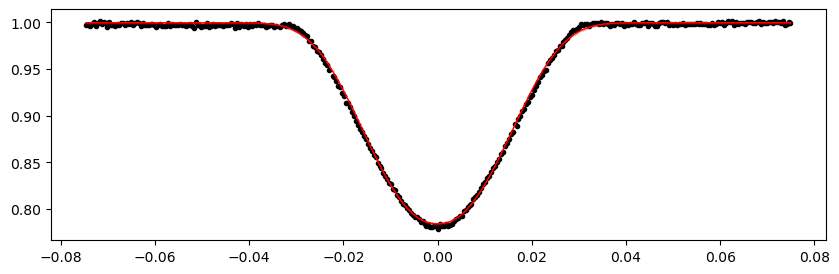

1720.733386 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1297.94it/s]


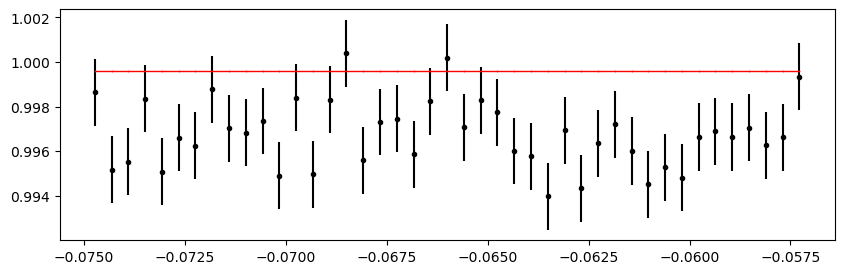

1727.417038 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1271.93it/s]


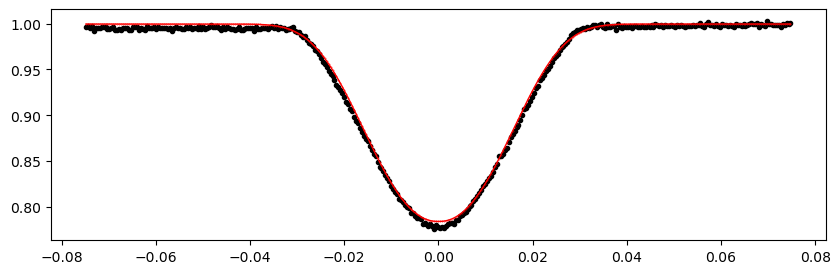

1730.7588640000001 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1287.46it/s]


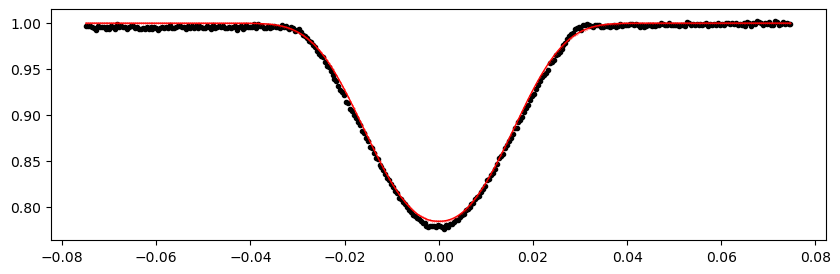

1734.1006900000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1290.59it/s]


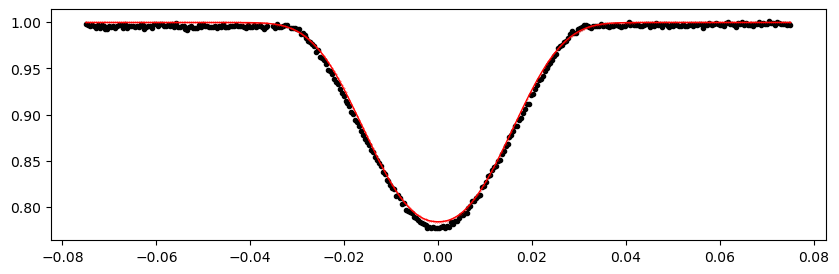

1740.7843420000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1267.12it/s]


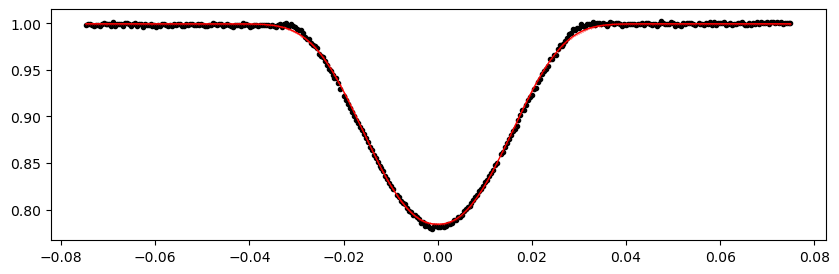

1744.126168 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1273.18it/s]


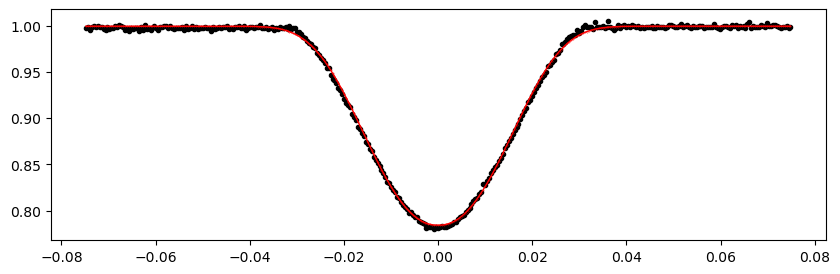

1747.467994 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1246.96it/s]


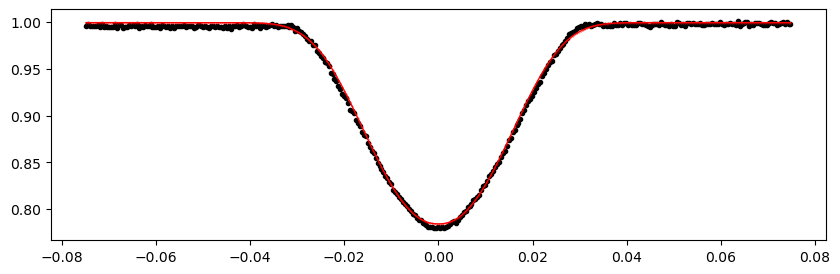

1754.151646 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1256.78it/s]


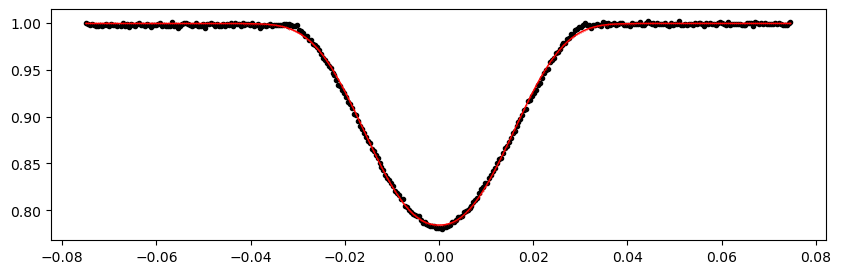

1757.493472 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1289.74it/s]


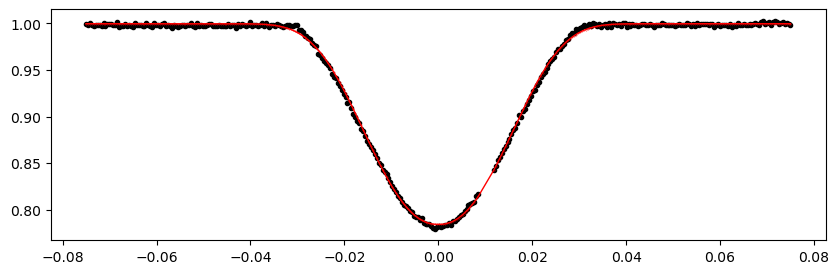

1760.8352980000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|███████████████████████████████████████████████████████| 10000/10000 [00:14<00:00, 698.56it/s]


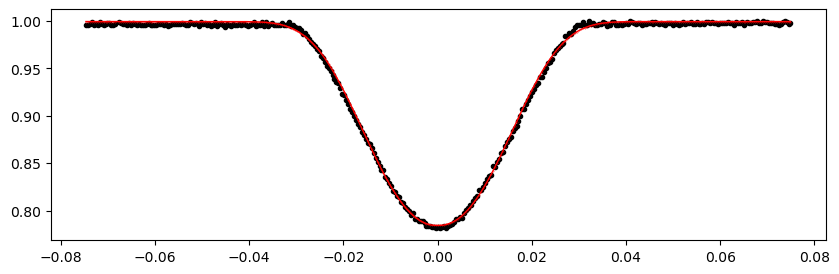

1767.5189500000001 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1061.23it/s]


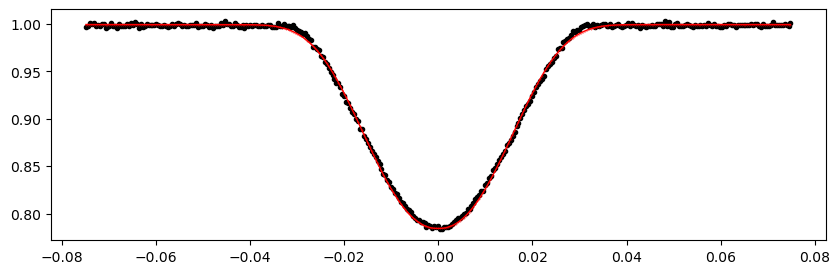

1770.8607760000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1233.54it/s]


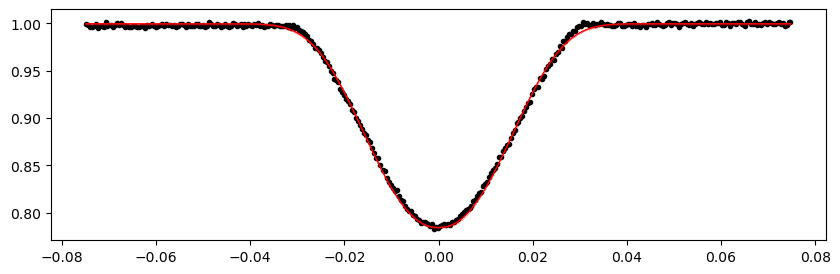

1774.202602 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1200.25it/s]


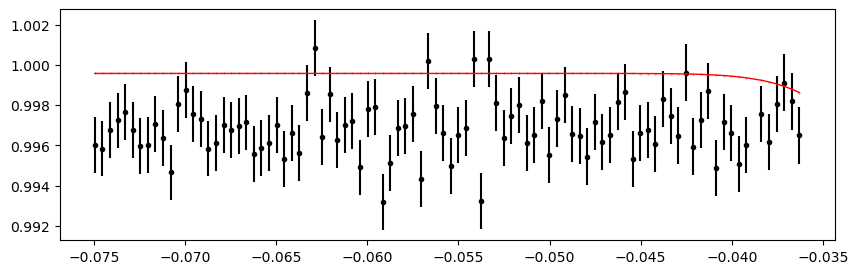

1777.5444280000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1060.64it/s]


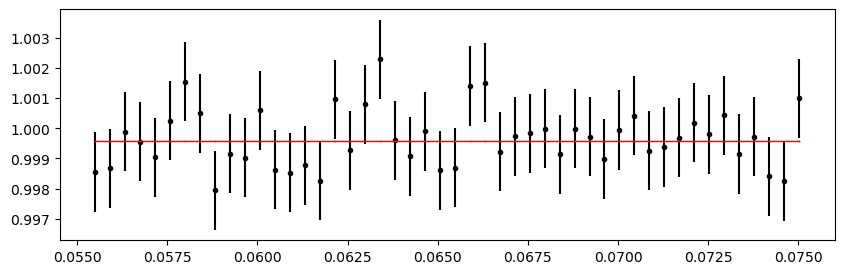

1780.886254 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1070.66it/s]


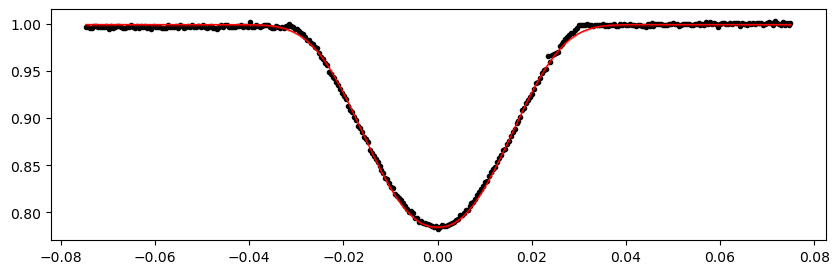

1784.22808 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1116.68it/s]


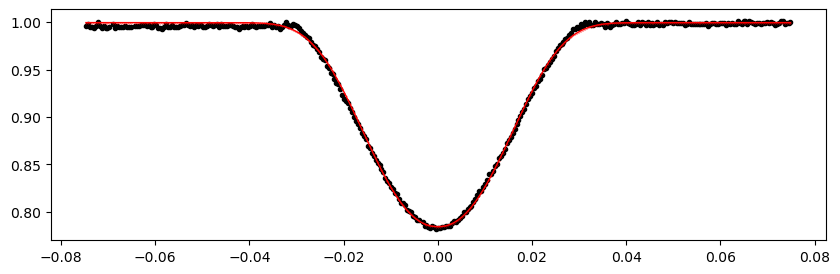

1787.5699060000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1104.97it/s]


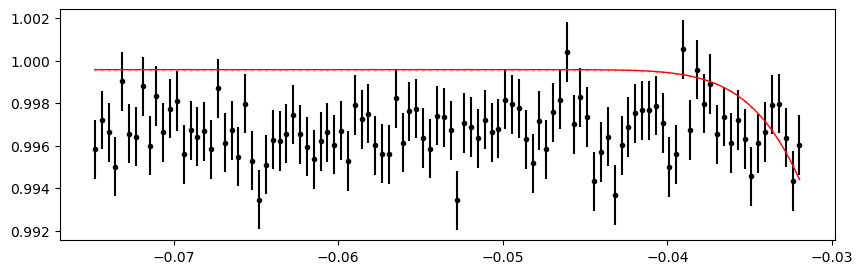

1790.911732 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1111.07it/s]


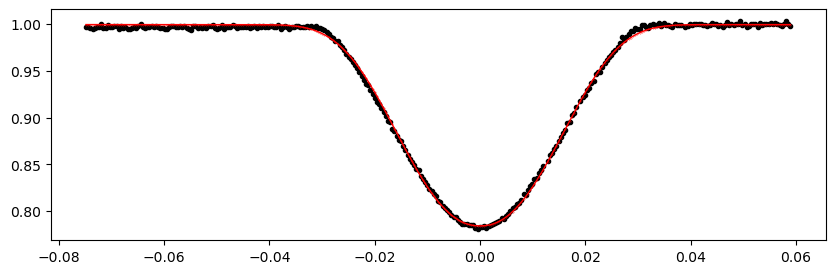

1794.253558 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1111.73it/s]


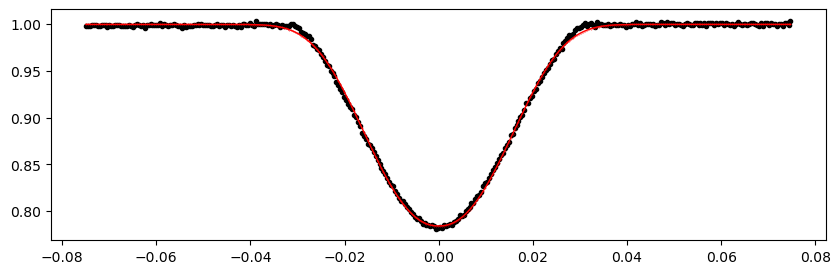

1797.5953840000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1075.81it/s]


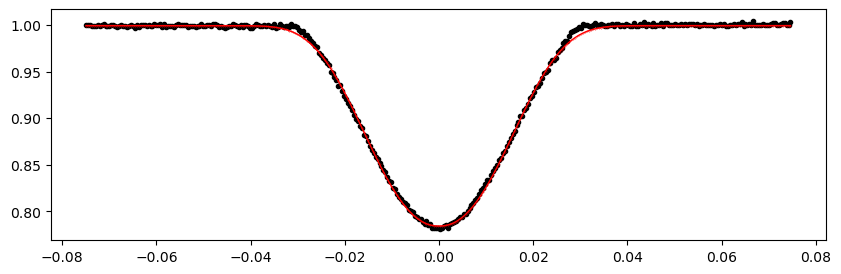

1800.93721 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1100.13it/s]


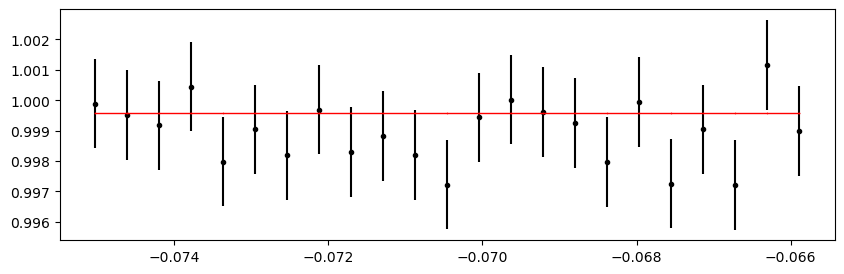

1804.2790360000001 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1105.83it/s]


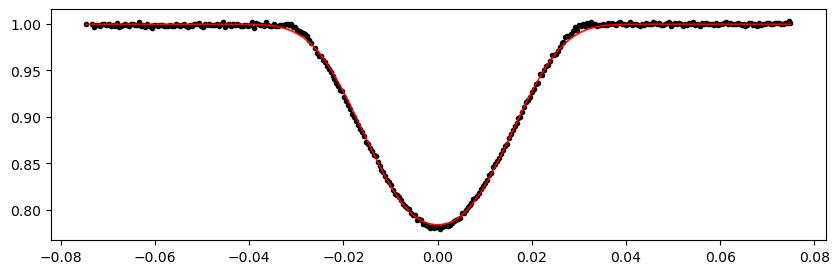

1807.6208620000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1045.20it/s]


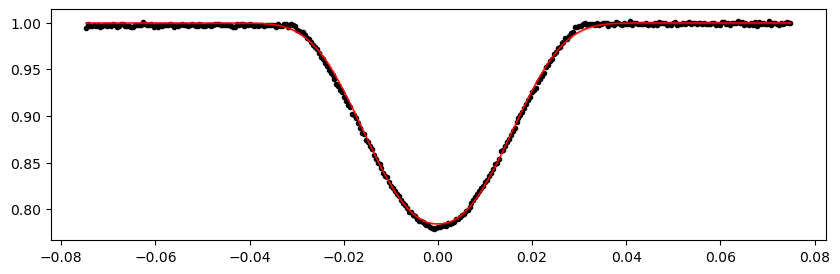

1810.962688 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1207.72it/s]


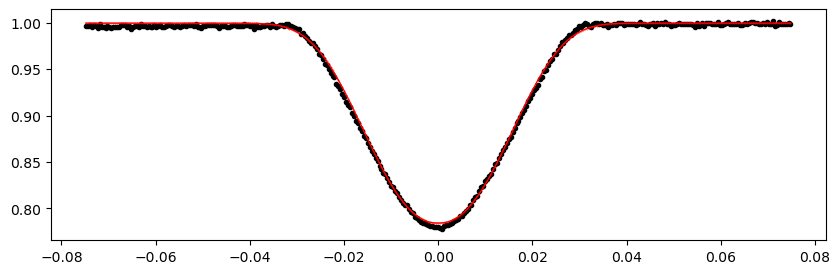

1817.6463400000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1233.03it/s]


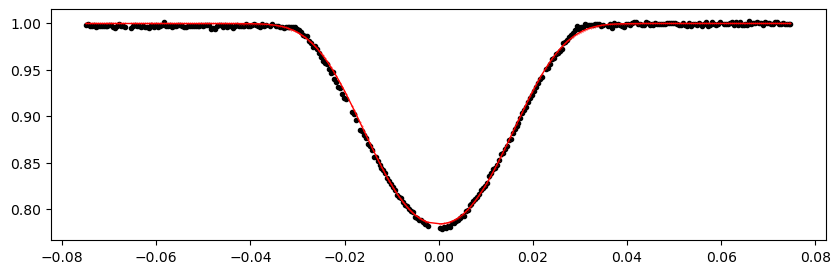

1820.988166 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1213.65it/s]


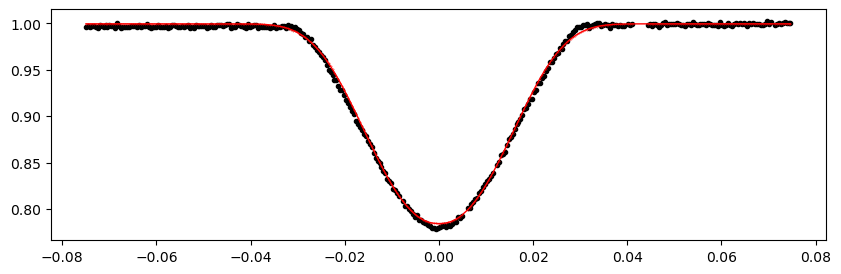

1824.3299920000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1199.63it/s]


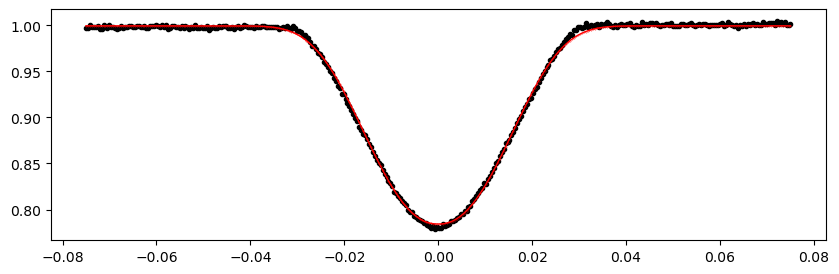

1827.671818 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1206.26it/s]


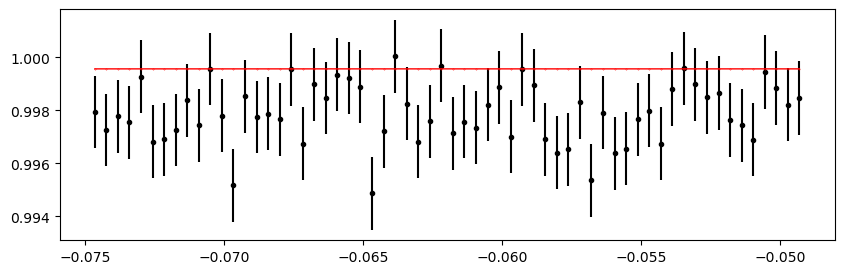

1831.013644 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1225.50it/s]


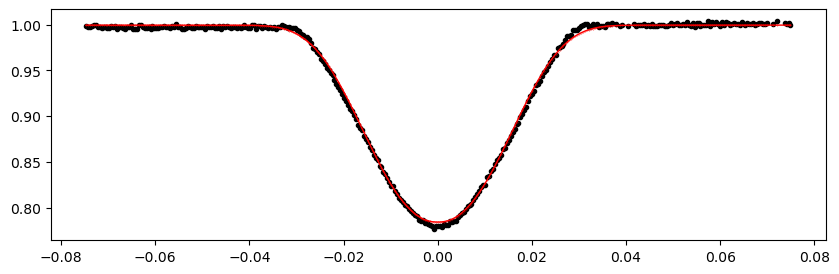

1834.3554700000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1228.62it/s]


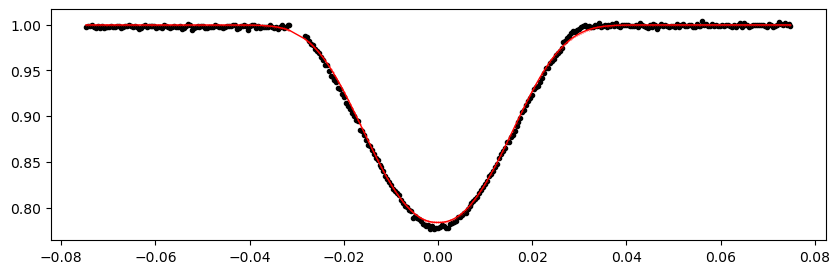

1837.697296 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1199.77it/s]


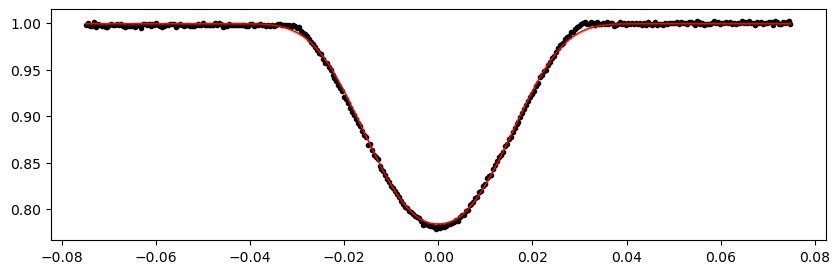

1841.0391220000001 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1212.86it/s]


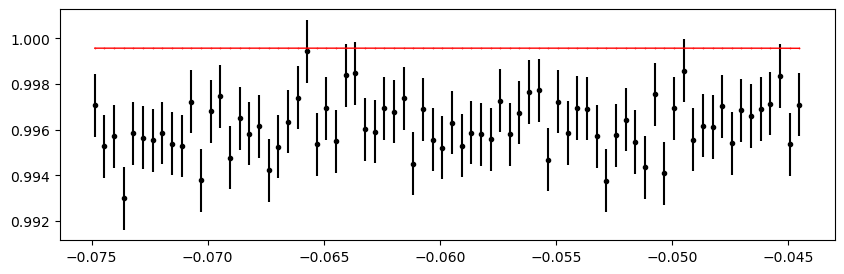

1844.380948 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1230.06it/s]


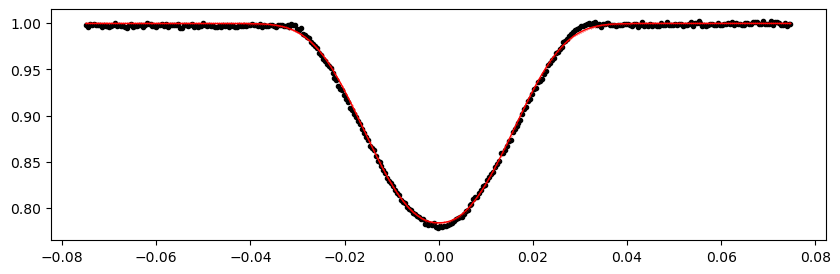

1847.722774 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1196.48it/s]


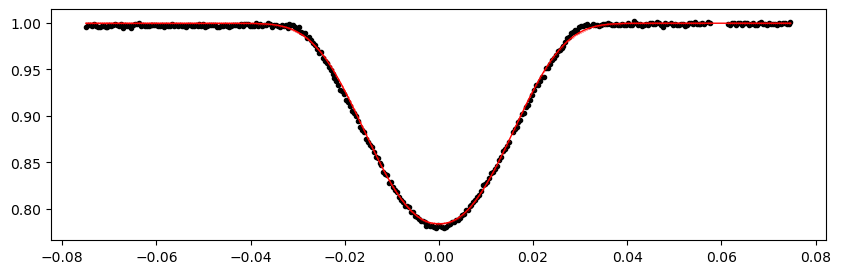

1851.0646000000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1193.06it/s]


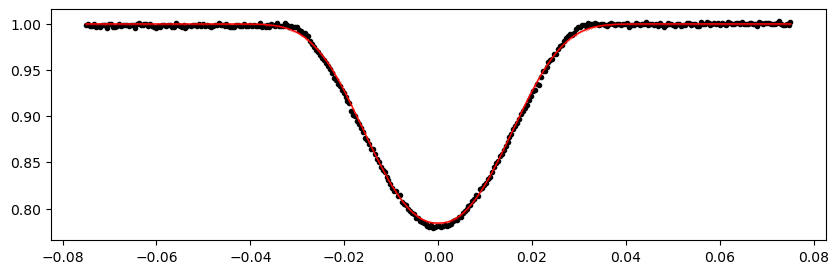

1854.406426 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1209.16it/s]


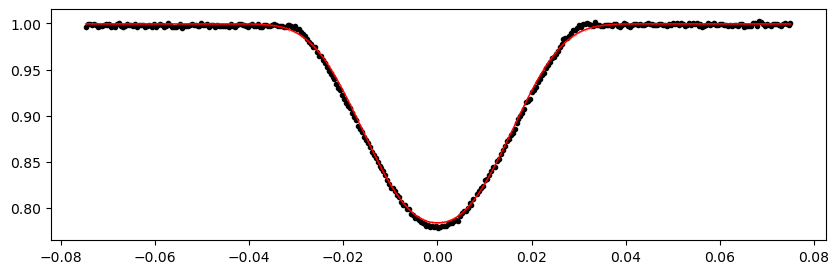

1857.748252 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1211.18it/s]


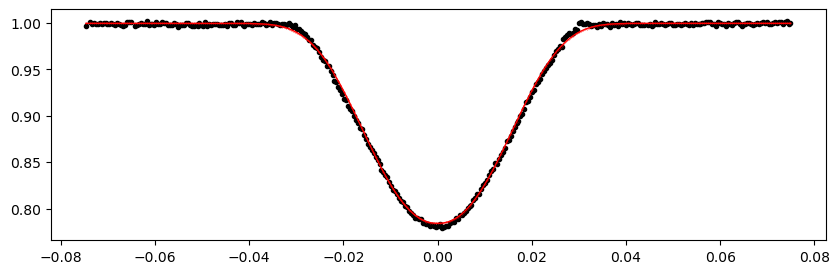

1861.0900780000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1230.46it/s]


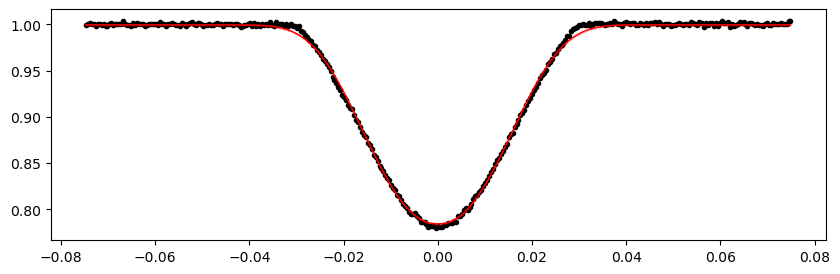

1864.431904 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1211.03it/s]


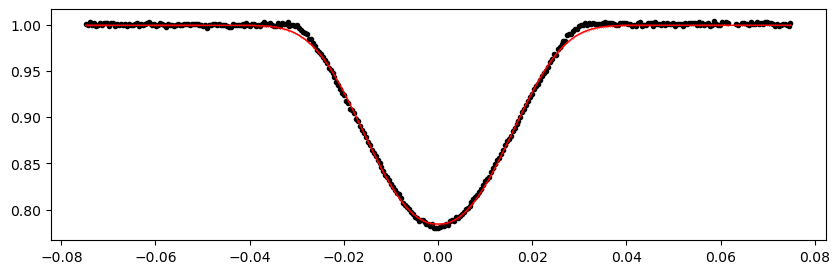

1867.7737300000001 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1212.14it/s]


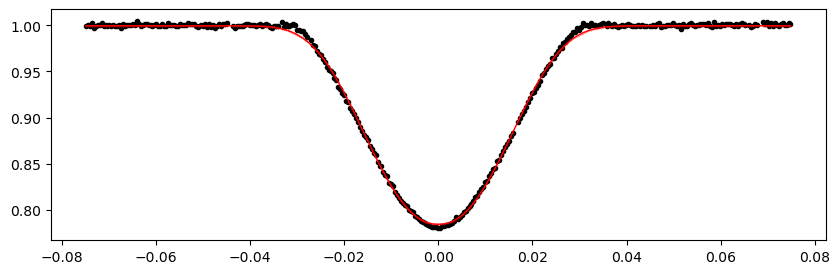

1871.1155560000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1189.07it/s]


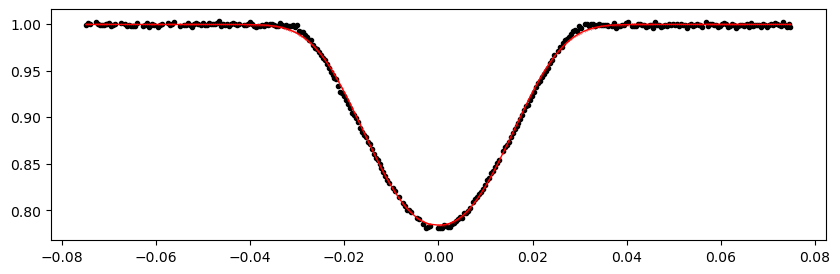

1874.457382 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1199.51it/s]


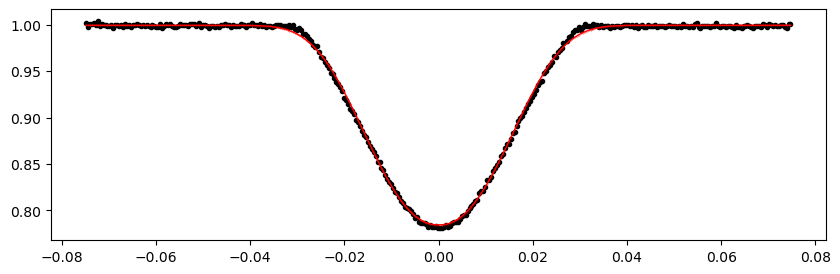

1877.7992080000001 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1246.07it/s]


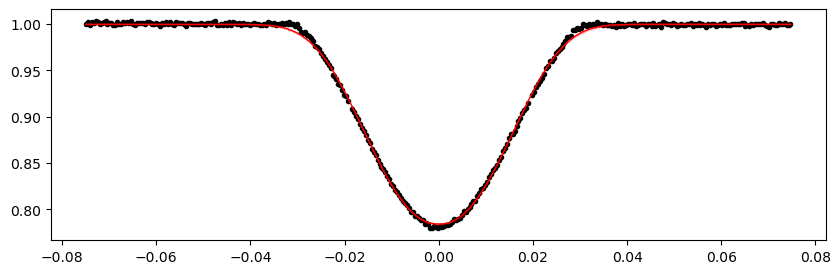

1881.1410340000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1198.54it/s]


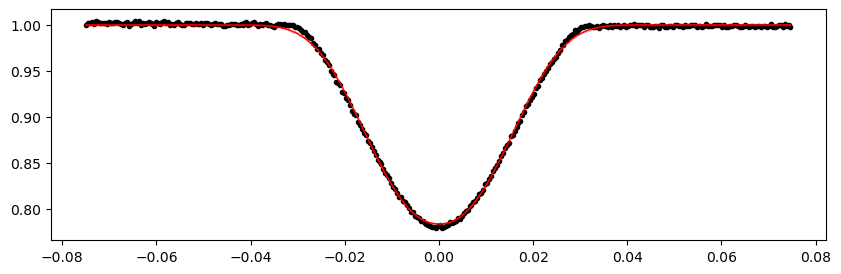

1887.8246860000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1204.79it/s]


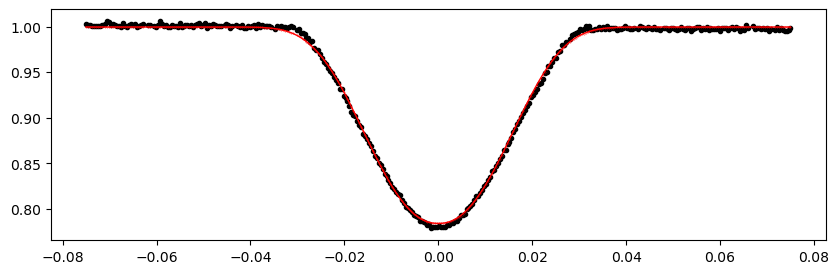

1891.1665120000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1210.59it/s]


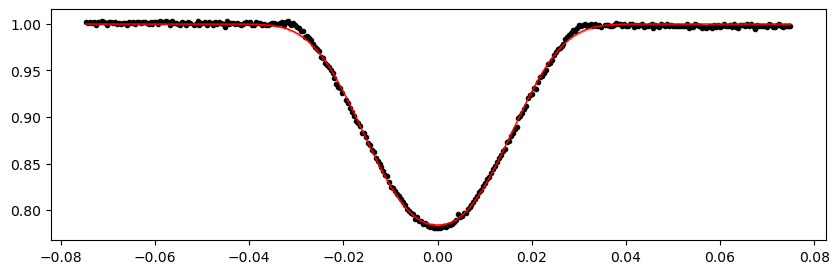

1894.508338 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1214.92it/s]


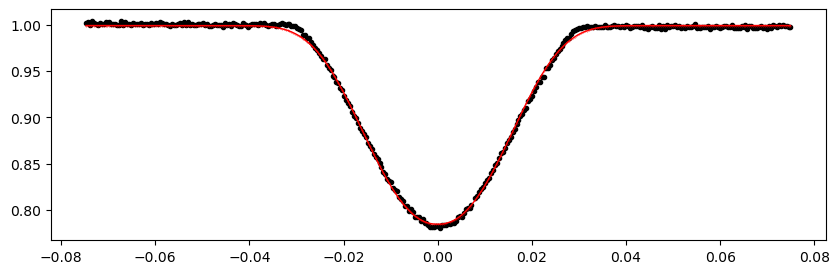

1897.8501640000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1216.56it/s]


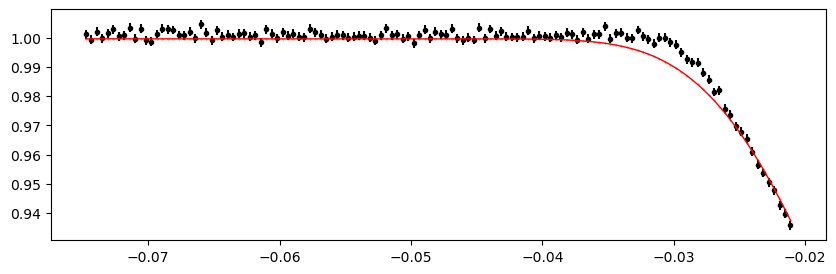

1901.19199 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1206.55it/s]


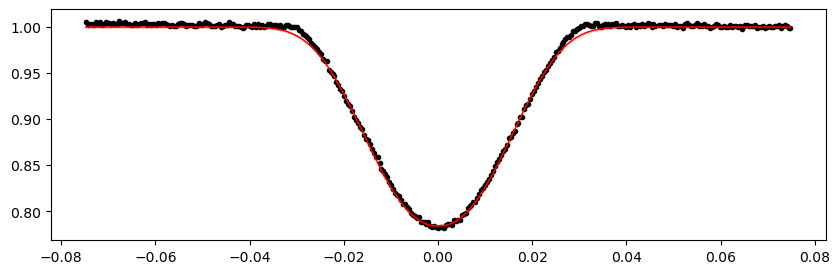

1904.5338160000001 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1184.99it/s]


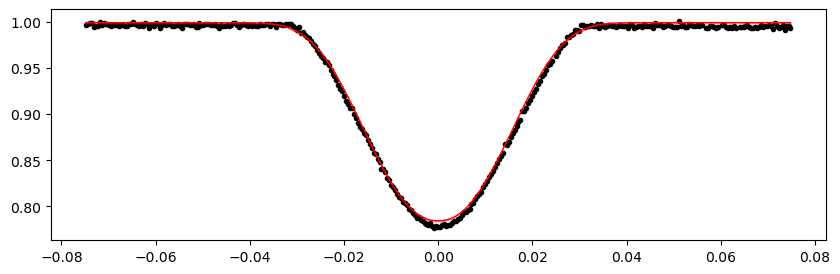

1907.8756420000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1209.21it/s]


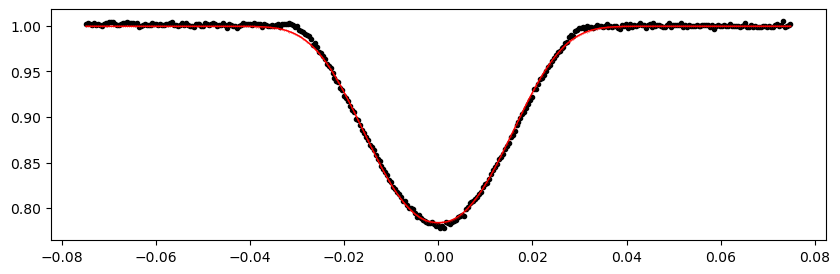

1911.217468 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1177.48it/s]


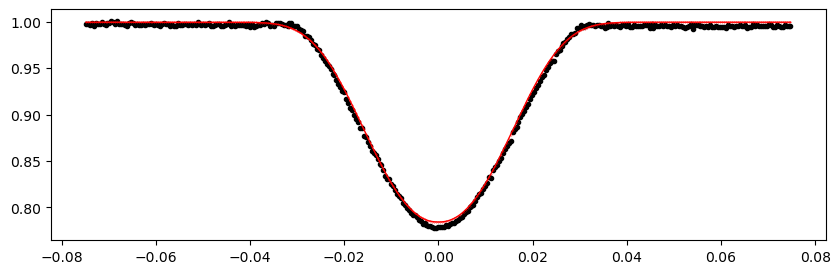

1917.9011200000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1229.39it/s]


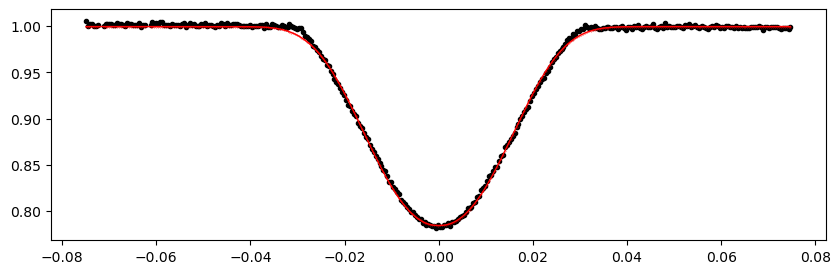

1921.242946 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1210.60it/s]


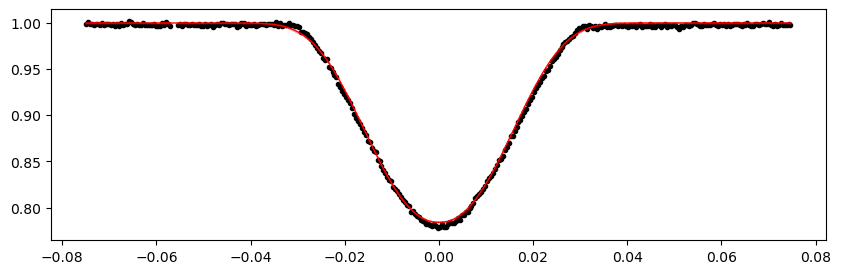

1924.5847720000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1182.69it/s]


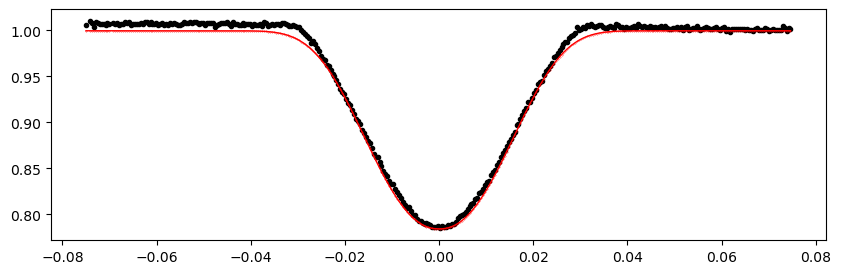

1931.268424 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1200.37it/s]


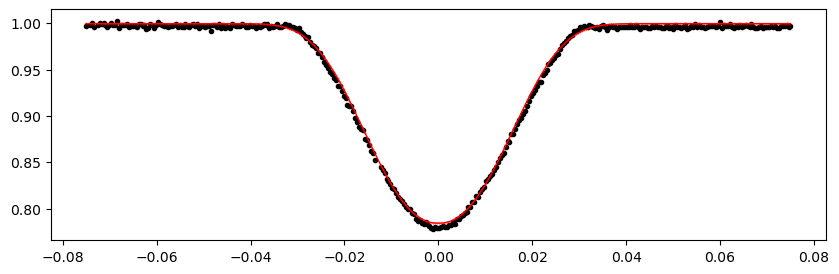

1934.6102500000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1229.97it/s]


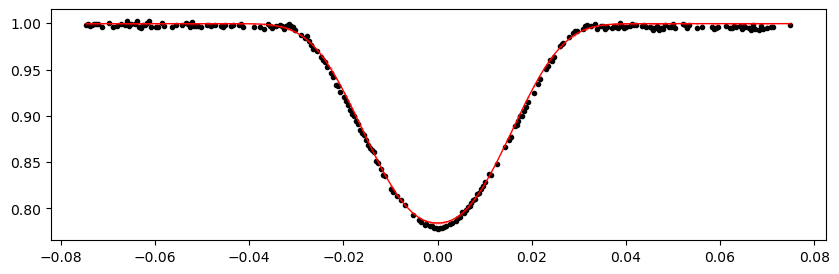

1937.952076 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1189.04it/s]


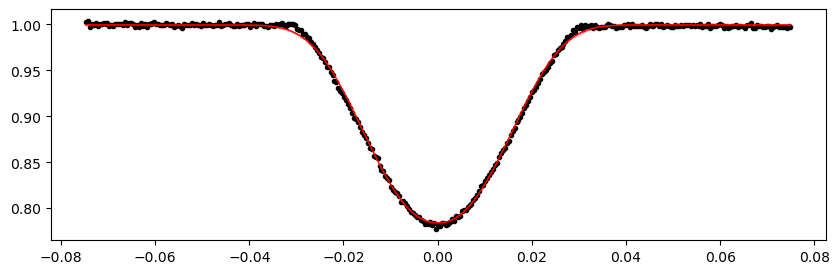

1944.6357280000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1189.04it/s]


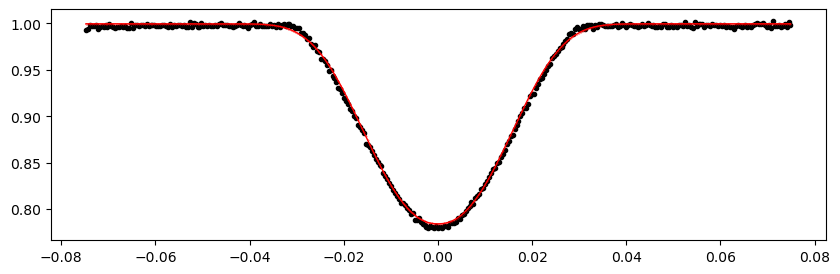

1947.977554 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1218.37it/s]


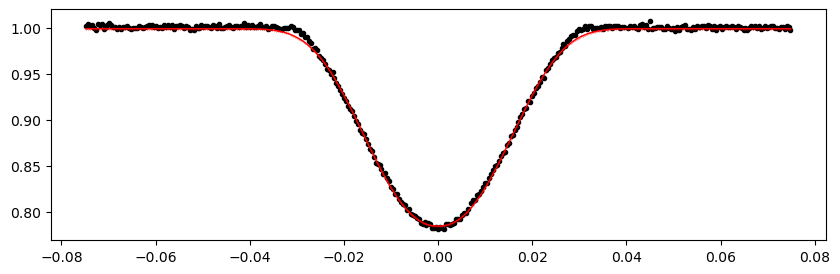

1951.3193800000001 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1230.16it/s]


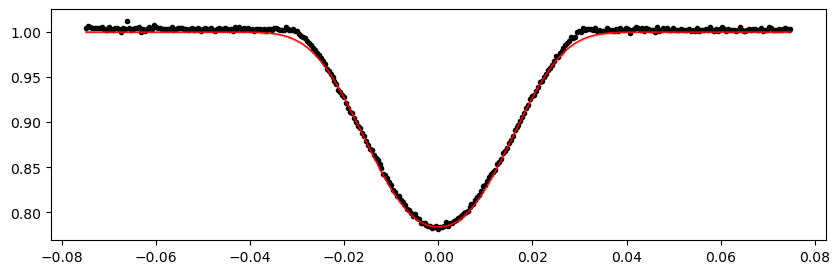

1954.6612060000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1228.46it/s]


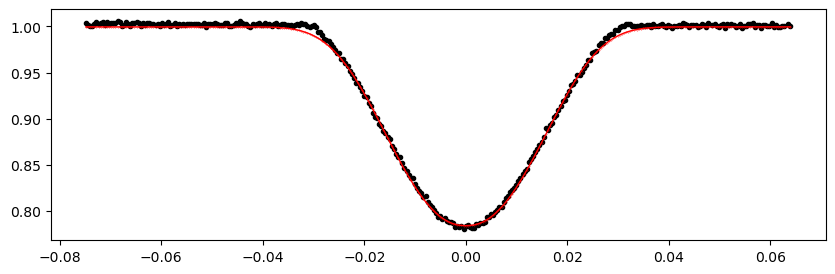

1958.003032 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1206.19it/s]


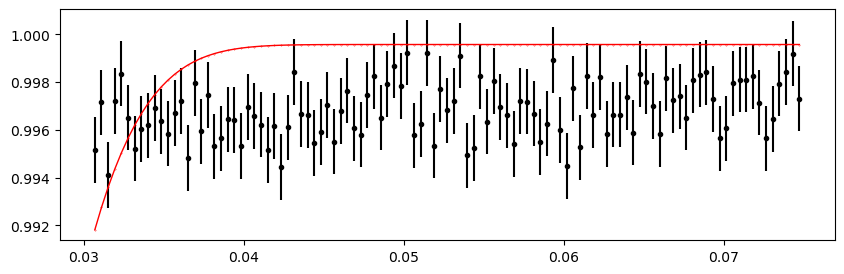

1961.3448580000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1202.27it/s]


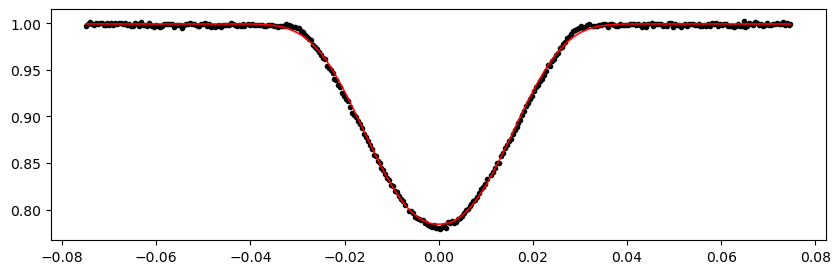

1964.6866840000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1237.82it/s]


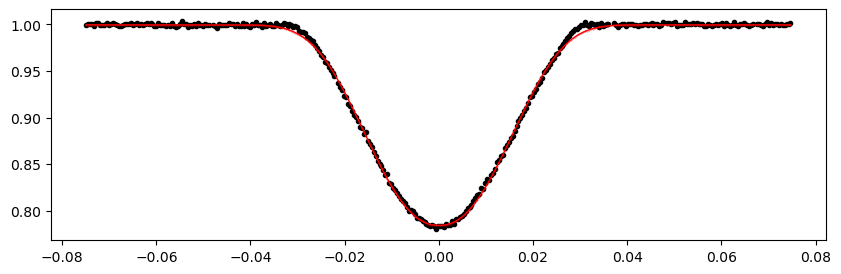

1968.02851 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1207.58it/s]


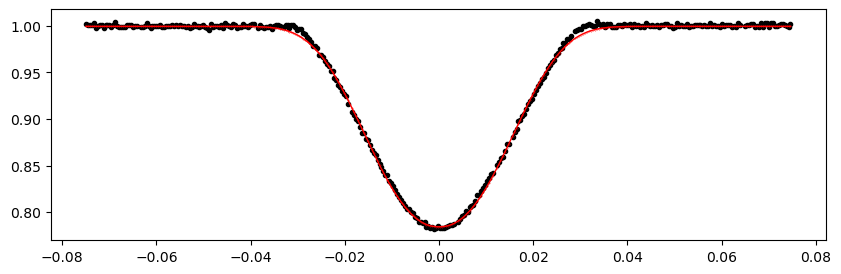

1974.7121620000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1239.22it/s]


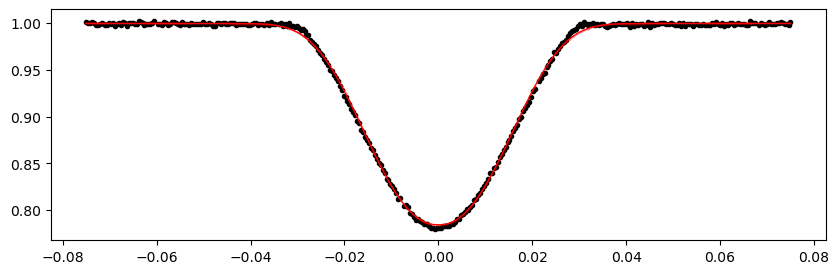

1978.0539880000001 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1214.50it/s]


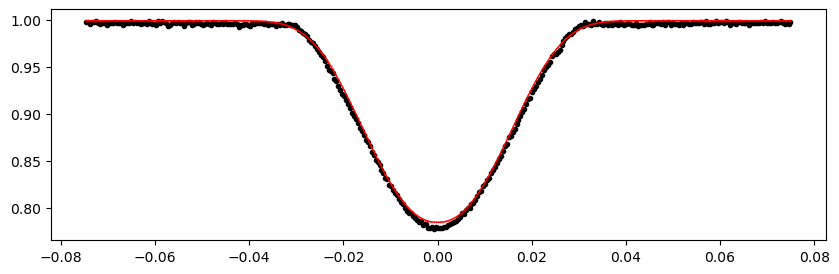

1981.3958140000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1204.40it/s]


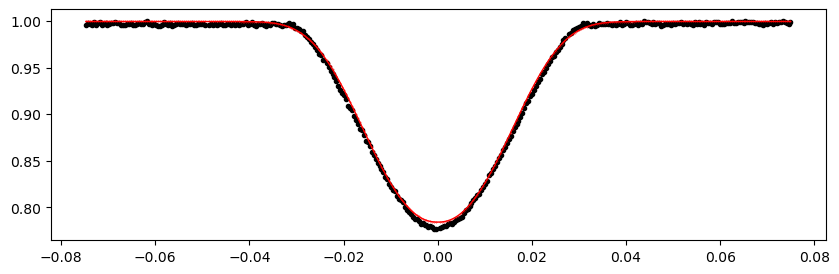

1988.0794660000001 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1212.14it/s]


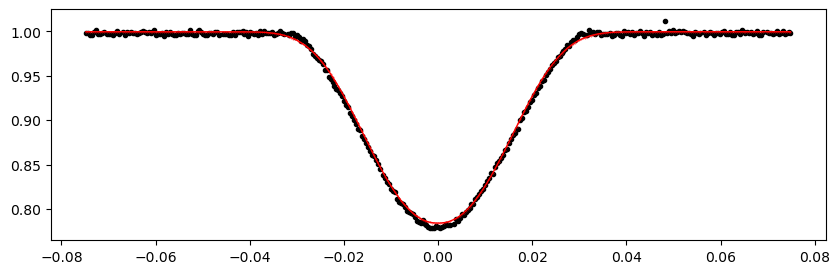

1991.421292 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1196.21it/s]


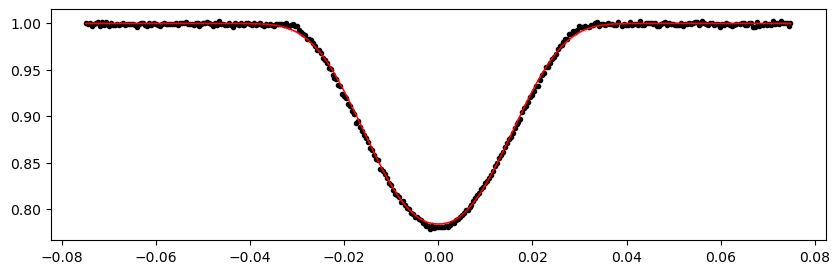

1994.763118 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1218.02it/s]


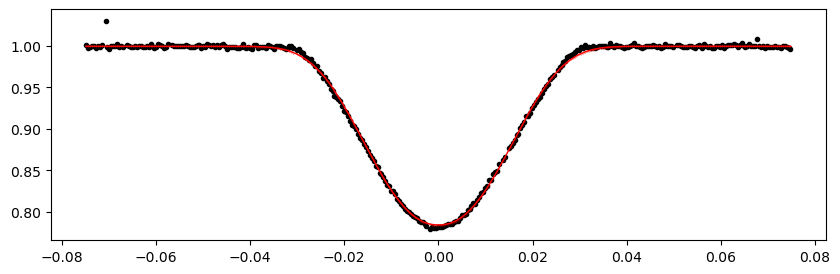

2001.44677 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1210.64it/s]


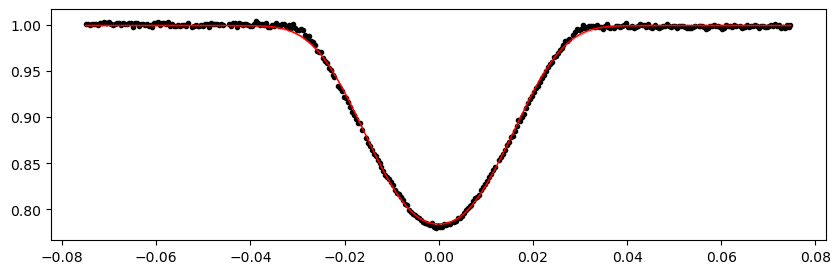

2004.788596 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1246.03it/s]


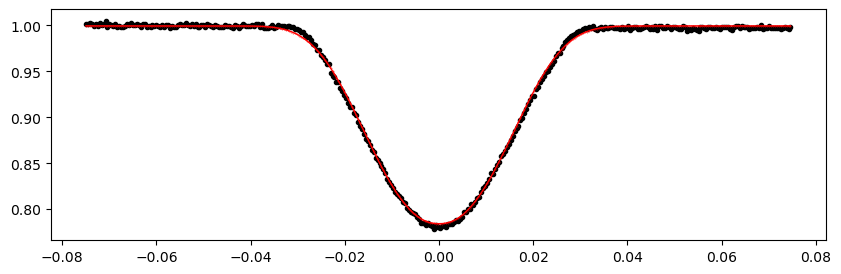

2008.1304220000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1213.57it/s]


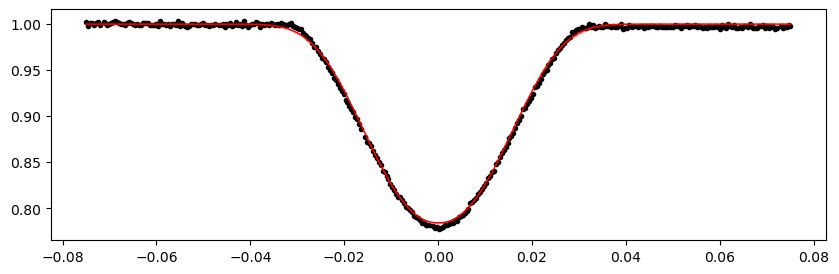

2011.472248 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1198.37it/s]


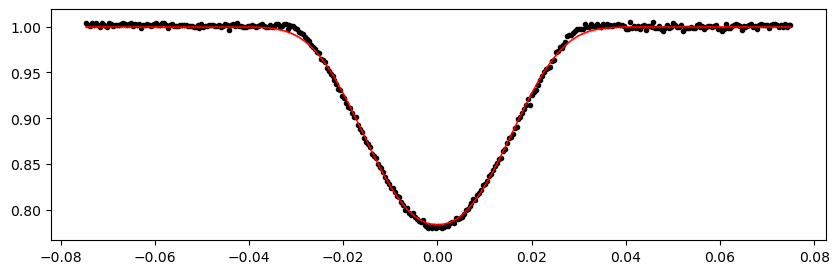

2014.8140740000001 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1210.44it/s]


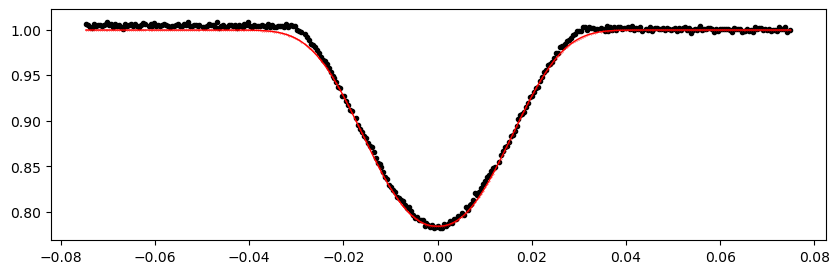

2018.1559000000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1191.89it/s]


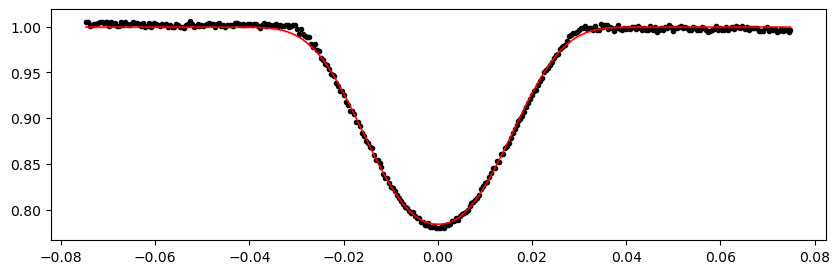

2021.497726 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1254.48it/s]


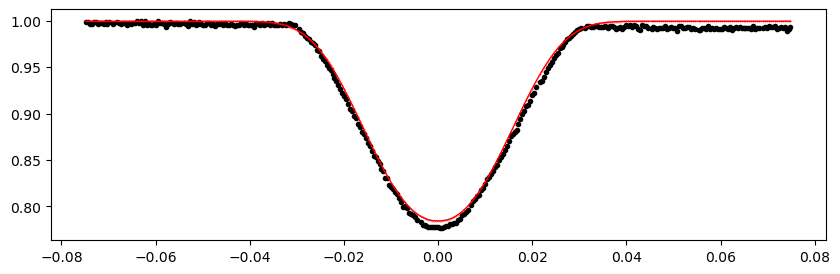

2024.8395520000001 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1221.85it/s]


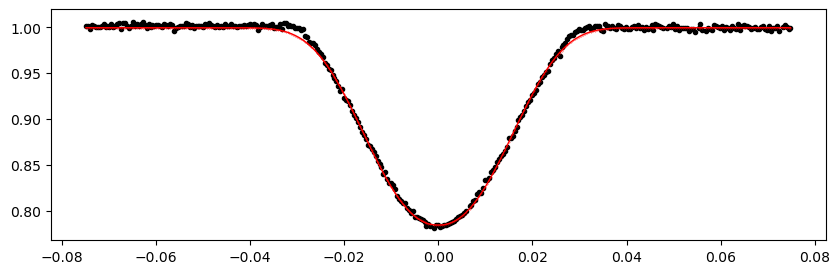

2028.1813780000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1242.24it/s]


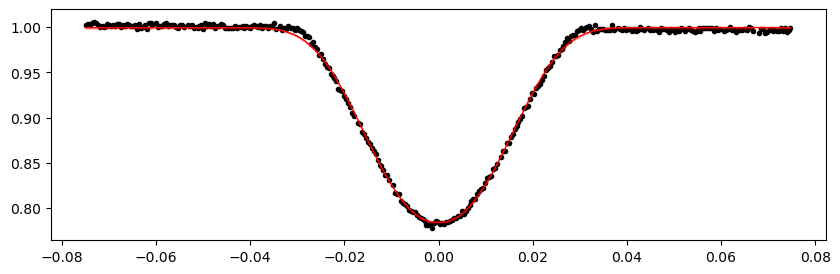

2031.523204 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1220.98it/s]


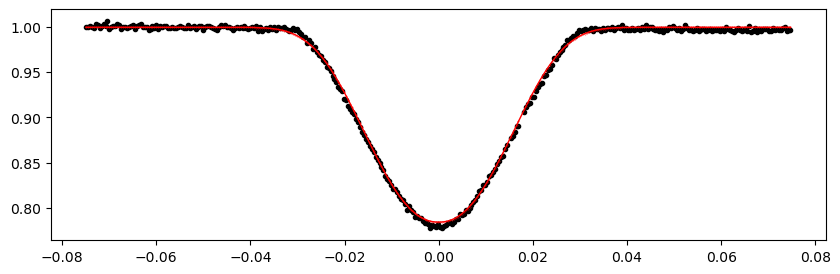

2034.8650300000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1215.05it/s]


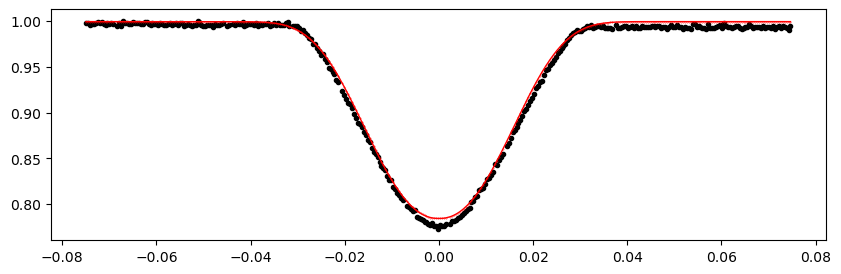

2392.440412 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1197.47it/s]


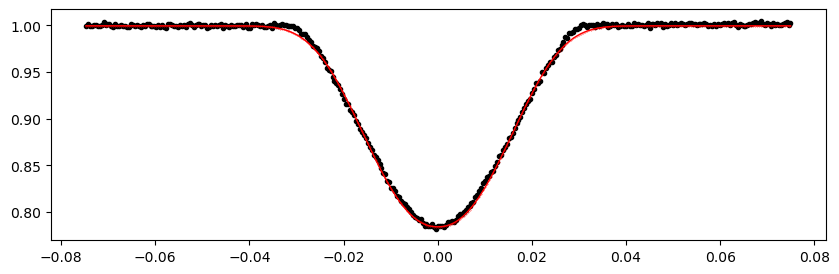

2395.7822380000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1196.19it/s]


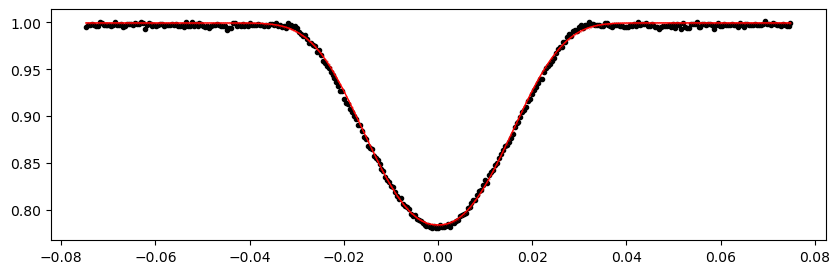

2399.124064 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|███████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 967.02it/s]


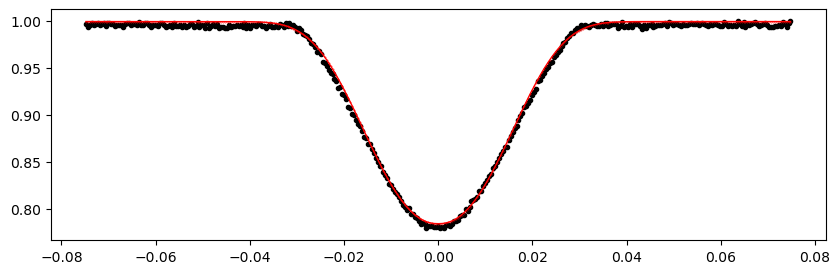

2402.4658900000004 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1086.37it/s]


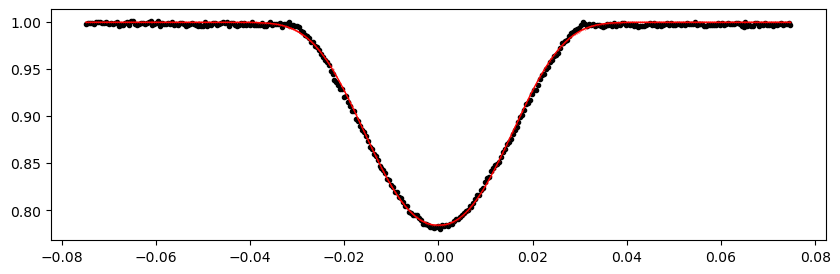

2405.8077160000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1221.73it/s]


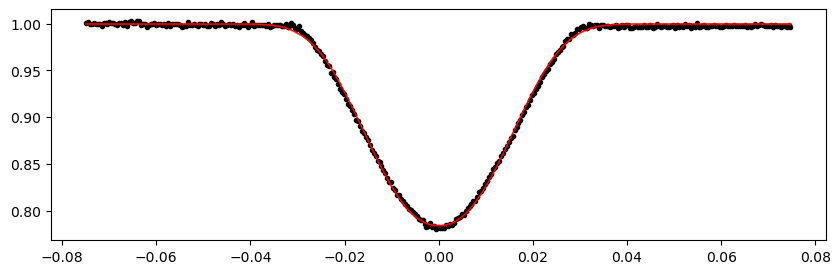

2409.149542 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1216.53it/s]


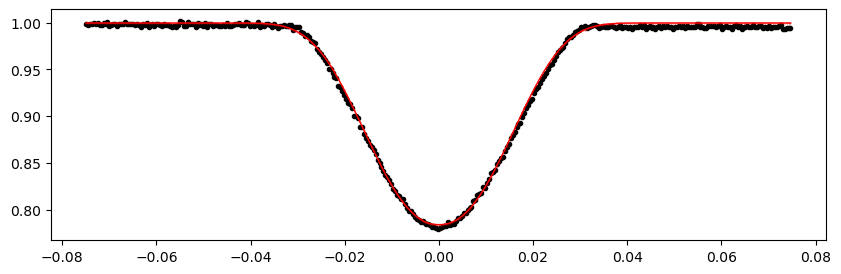

2412.491368 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1199.89it/s]


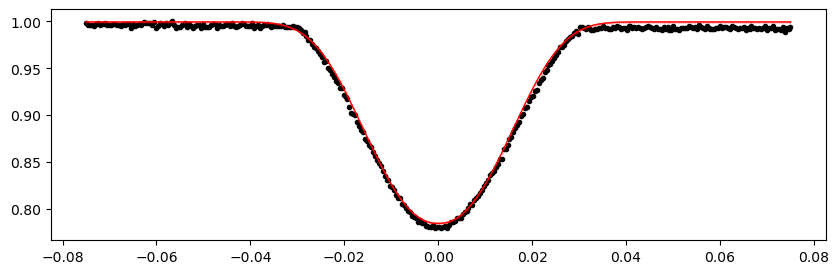

2415.8331940000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1271.65it/s]


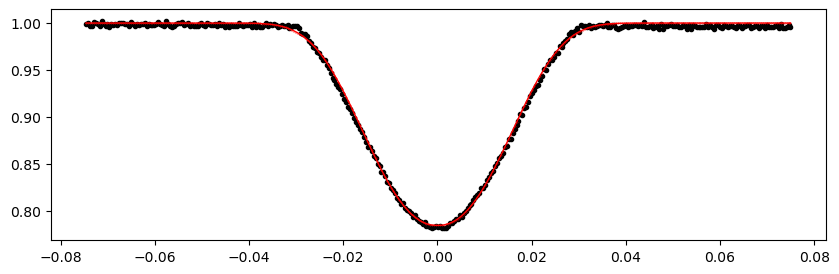

2422.516846 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1244.81it/s]


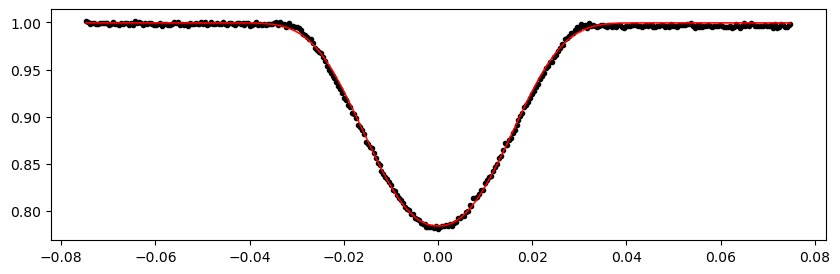

2425.8586720000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1261.89it/s]


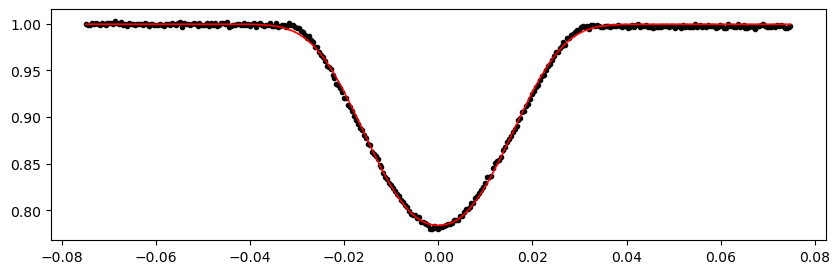

2429.200498 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1269.20it/s]


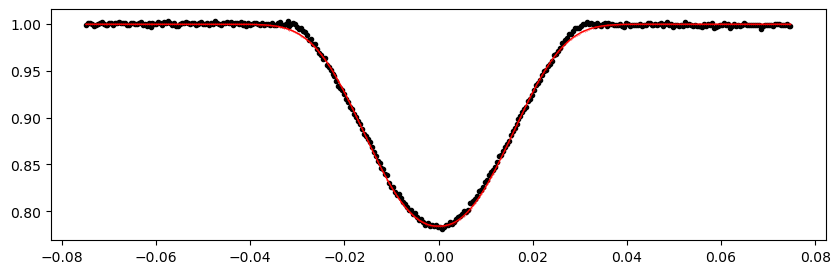

2432.542324 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1249.57it/s]


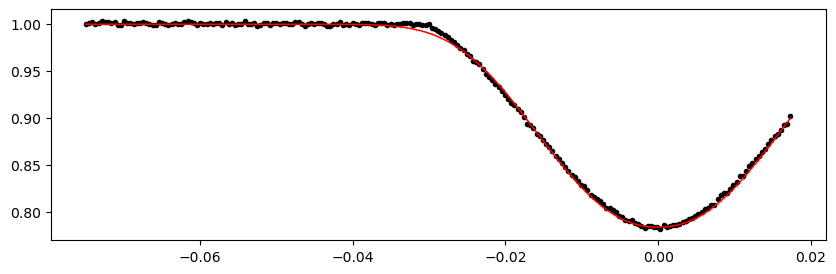

2435.8841500000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1284.81it/s]


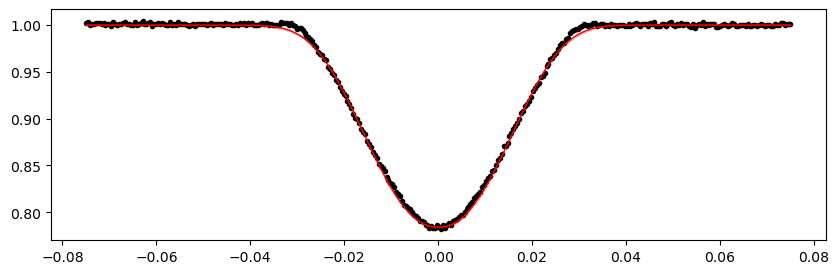

2439.225976 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1257.81it/s]


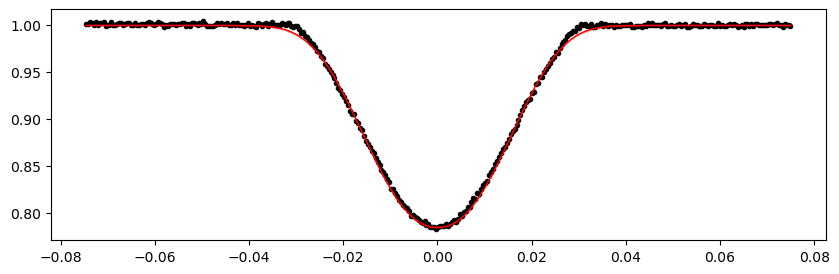

2442.567802 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1292.89it/s]


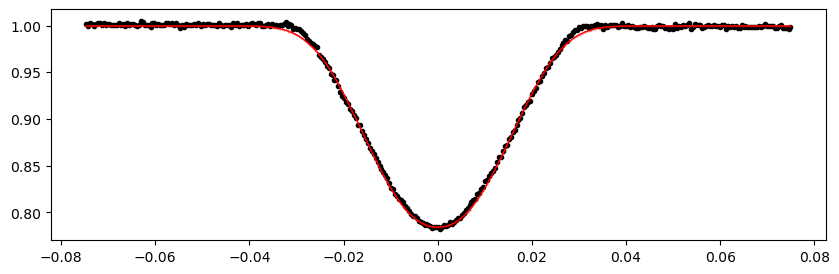

2445.9096280000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1195.70it/s]


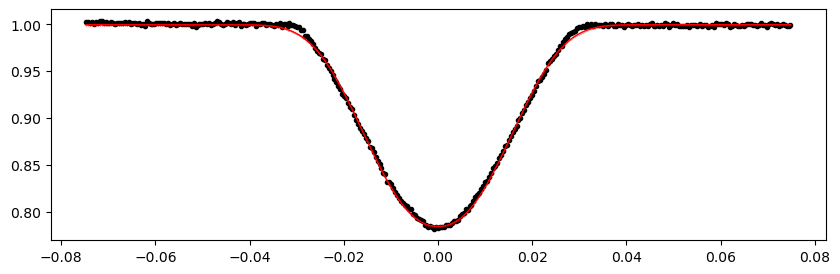

2582.9244940000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1208.86it/s]


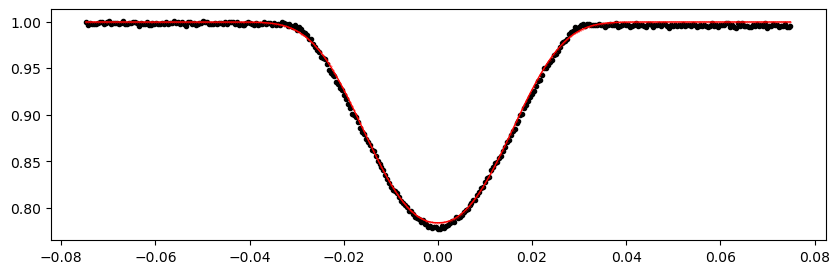

2586.26632 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1190.46it/s]


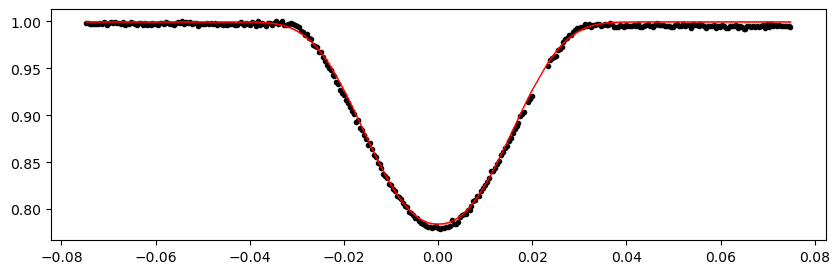

2589.608146 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1232.73it/s]


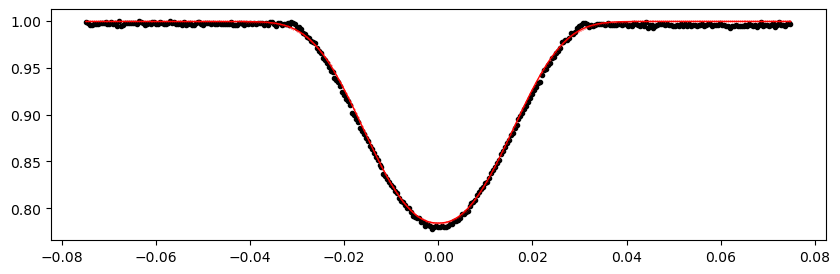

2592.9499720000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1207.12it/s]


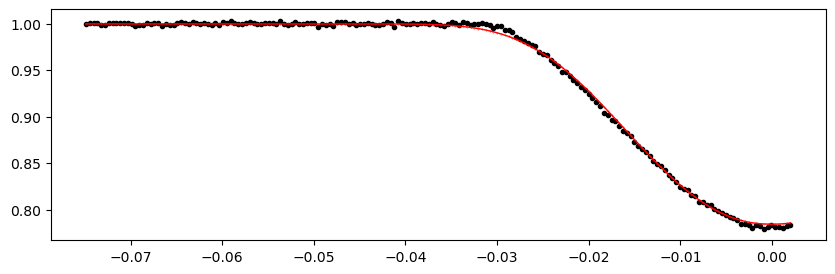

2596.291798 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1256.63it/s]


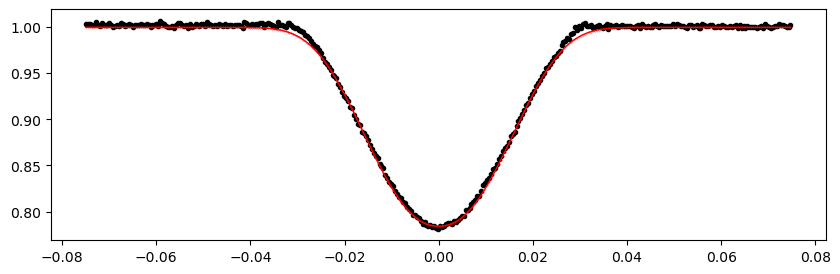

2599.633624 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1227.24it/s]


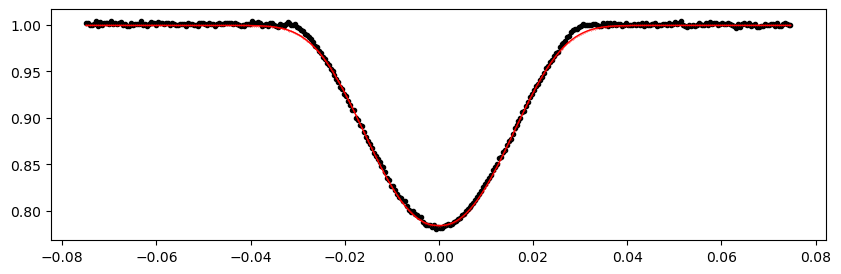

2602.97545 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1047.99it/s]


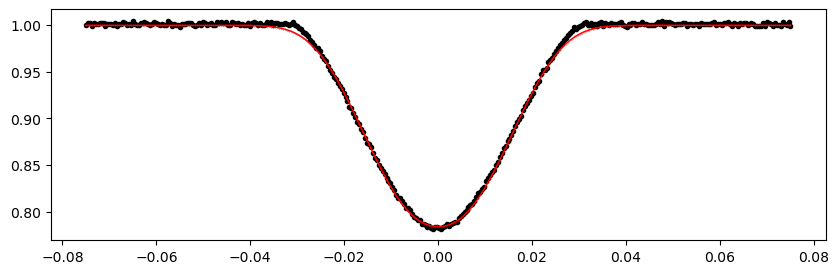

2606.317276 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1164.10it/s]


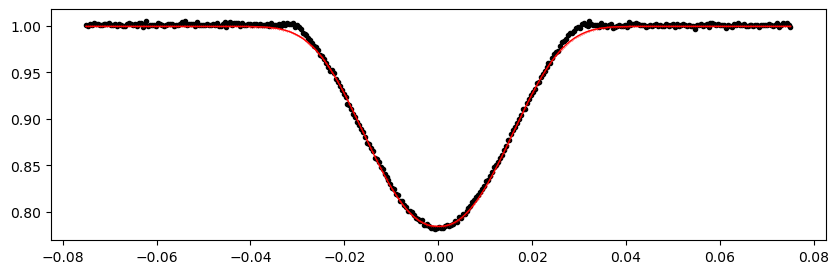

2613.0009280000004 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1190.47it/s]


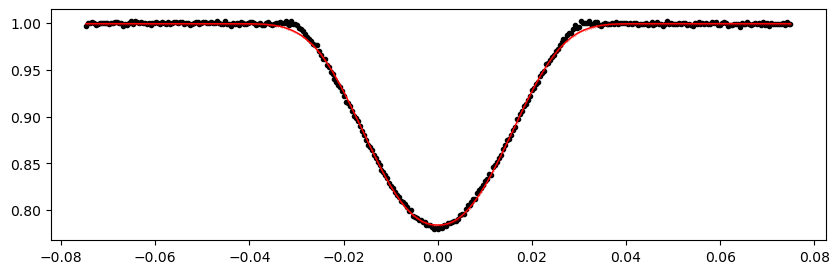

2616.3427540000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1251.28it/s]


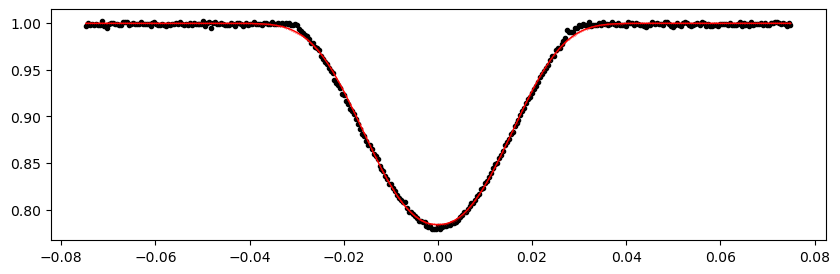

2619.68458 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1198.89it/s]


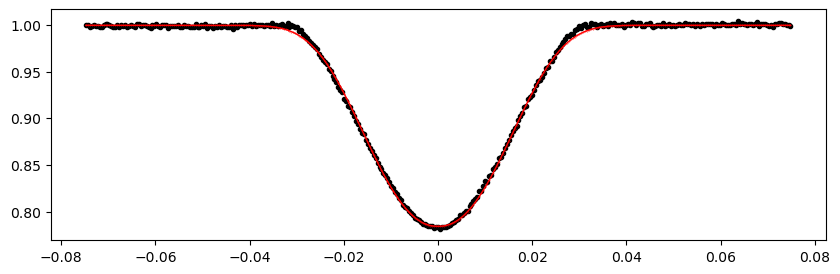

2626.3682320000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1257.96it/s]


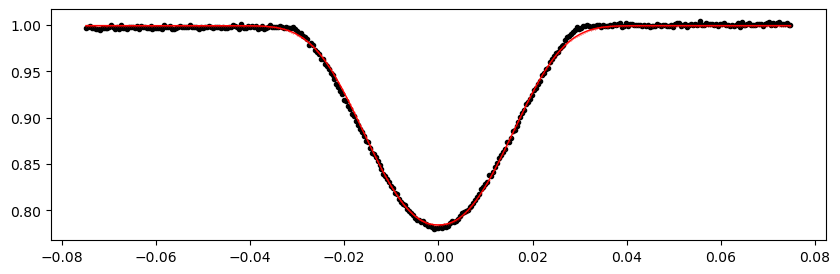

2629.710058 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1250.24it/s]


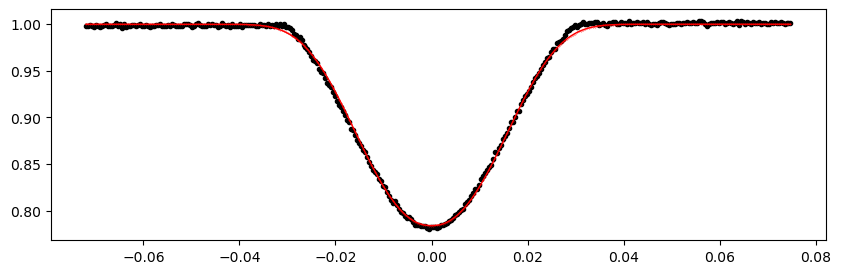

2633.0518840000004 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1229.31it/s]


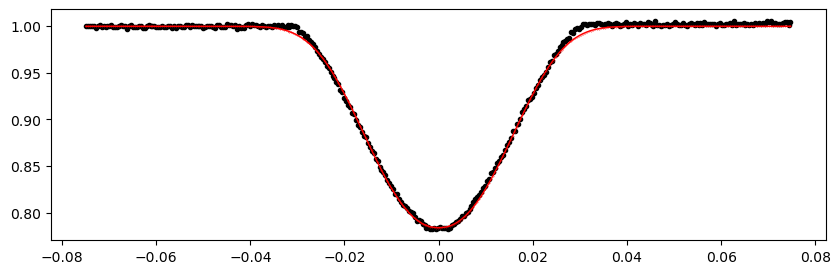

2643.077362 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1219.24it/s]


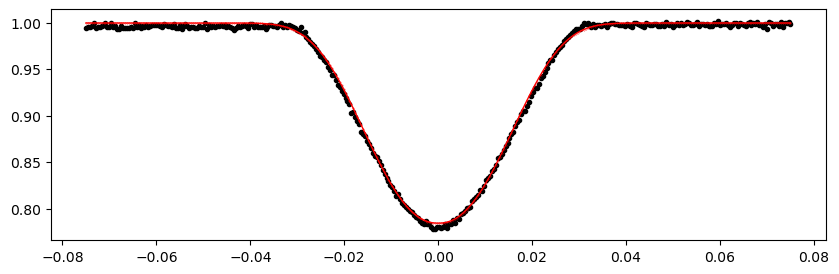

2646.4191880000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1200.93it/s]


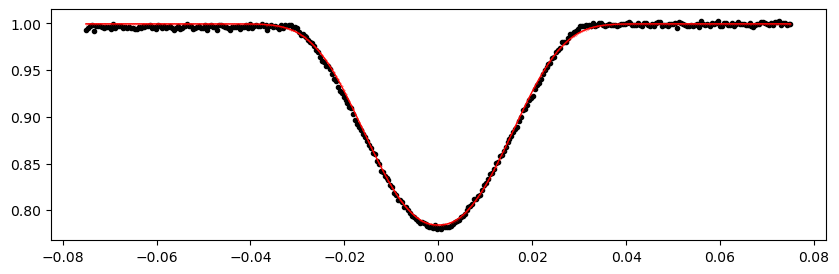

2649.761014 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1271.13it/s]


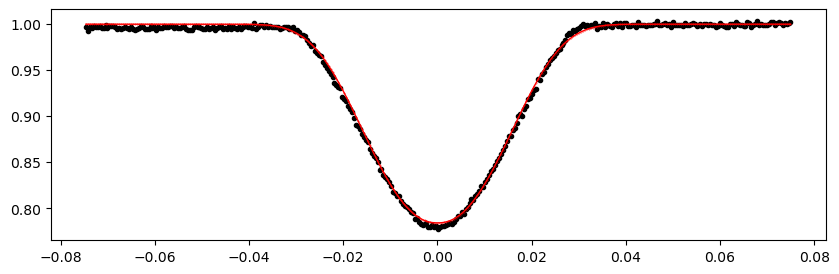

2656.4446660000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1239.91it/s]


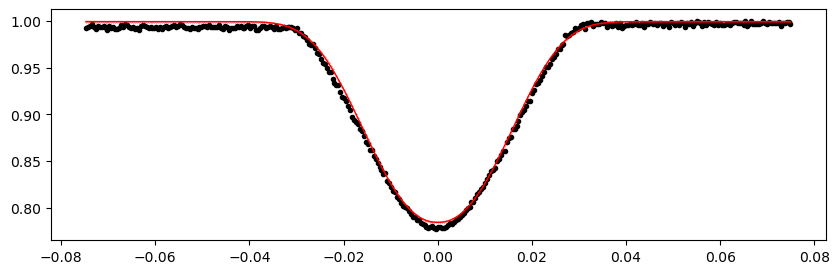

2659.786492 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1127.46it/s]


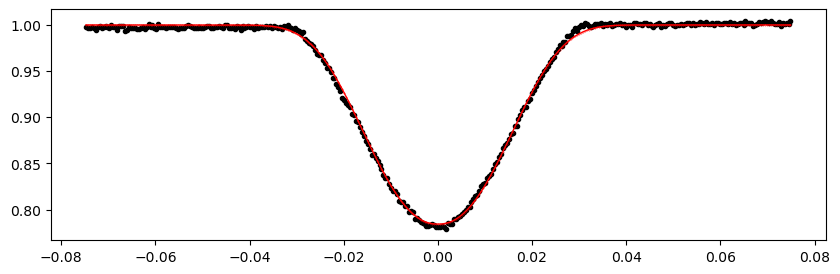

2663.128318 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1244.13it/s]


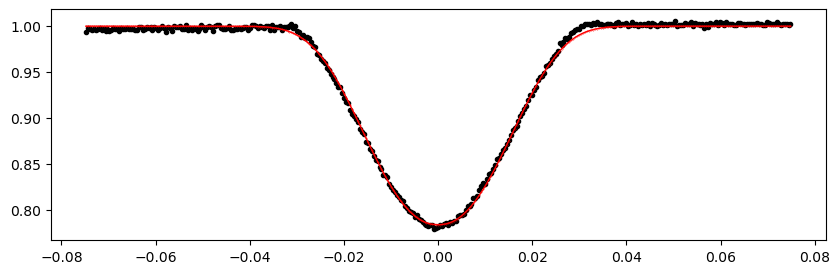

2669.81197 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1245.48it/s]


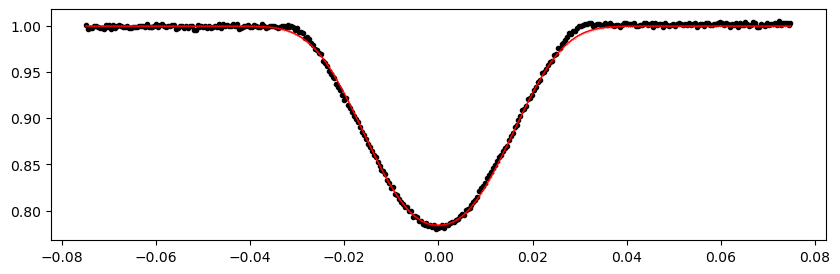

2673.153796 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1230.66it/s]


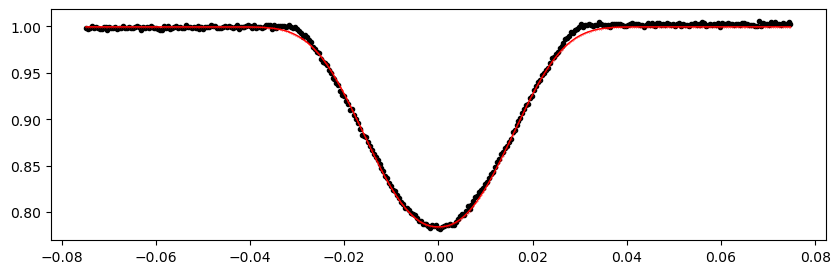

2676.4956220000004 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1238.15it/s]


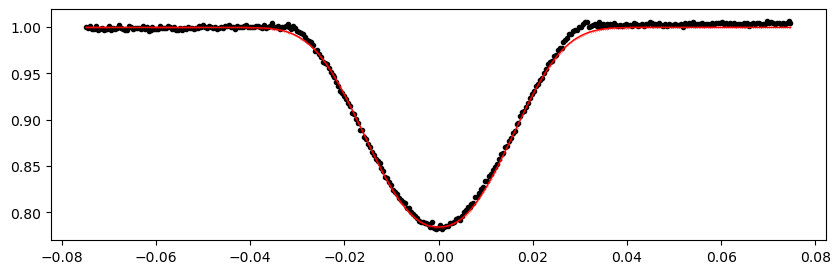

2683.179274 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1253.71it/s]


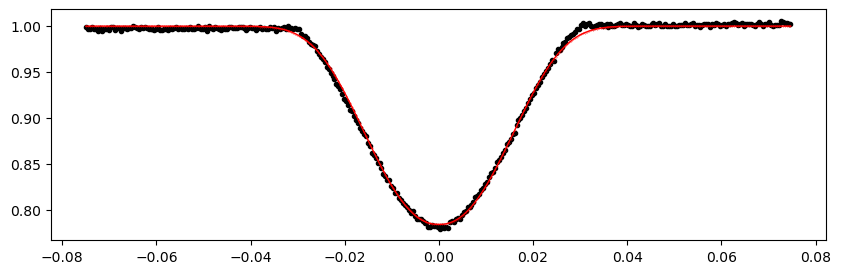

2686.5211 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1255.89it/s]


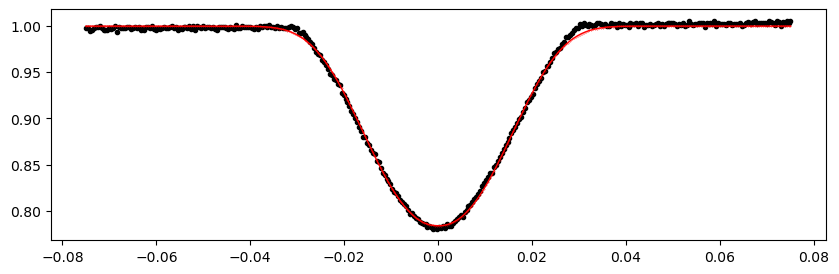

2689.8629260000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1209.51it/s]


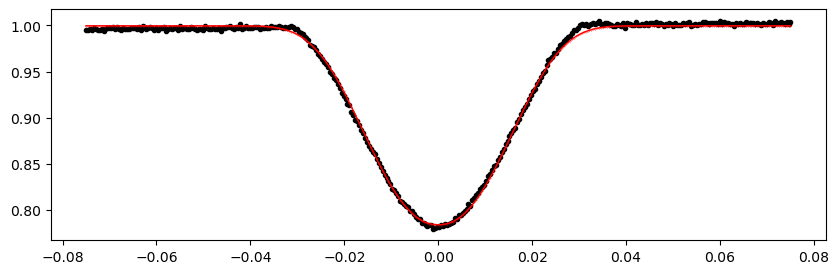

2696.5465780000004 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1238.97it/s]


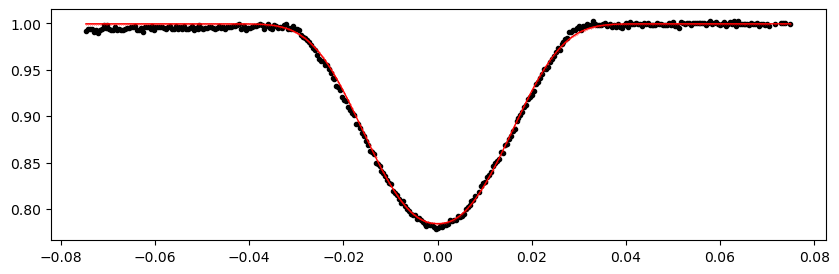

2699.8884040000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1244.70it/s]


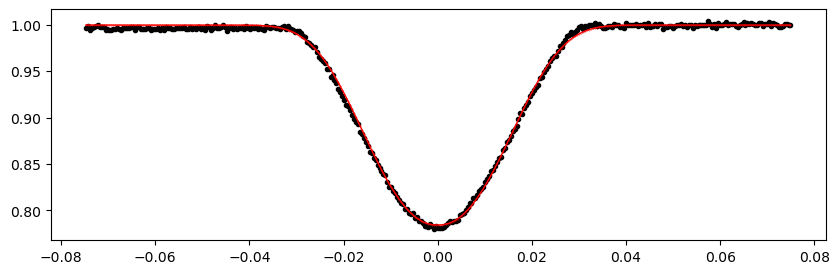

2703.23023 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1234.53it/s]


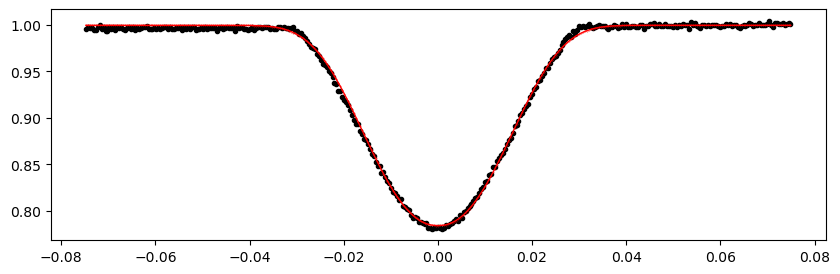

2709.913882 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1240.33it/s]


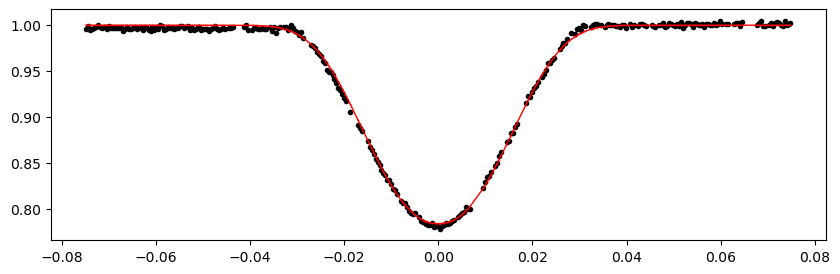

2713.255708 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1235.67it/s]


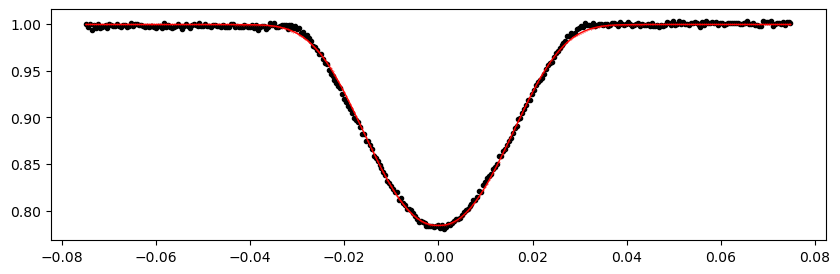

2716.5975340000005 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1263.32it/s]


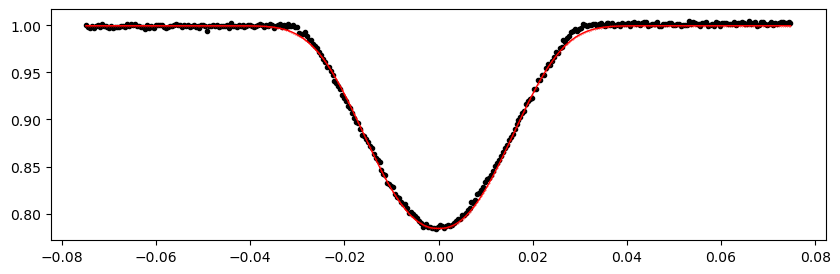

2719.9393600000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1264.65it/s]


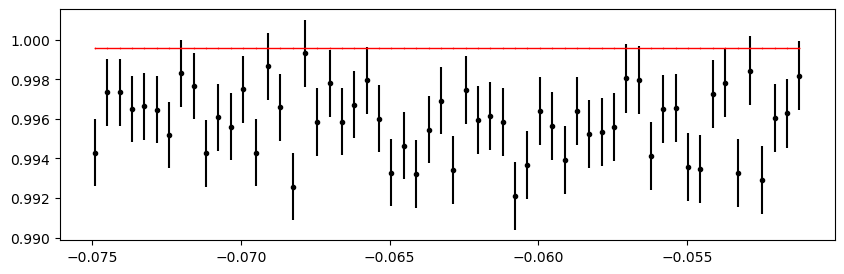

2723.281186 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1258.06it/s]


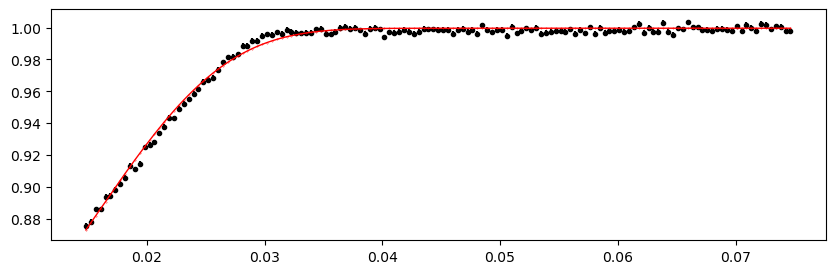

2726.623012 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1218.96it/s]


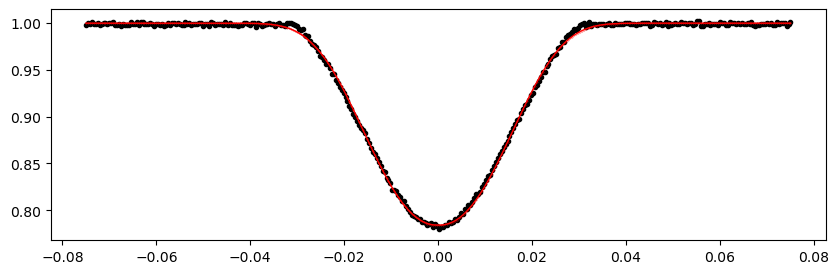

2729.964838 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1248.36it/s]


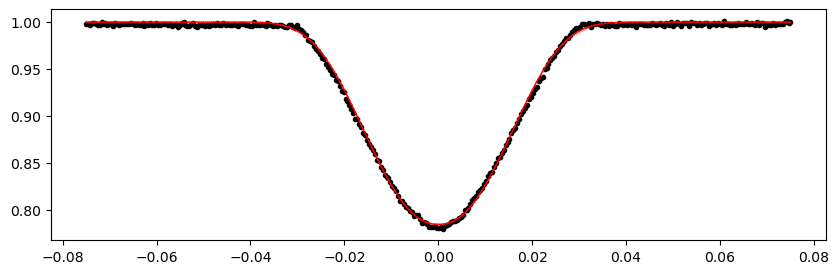

2736.6484900000005 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1255.35it/s]


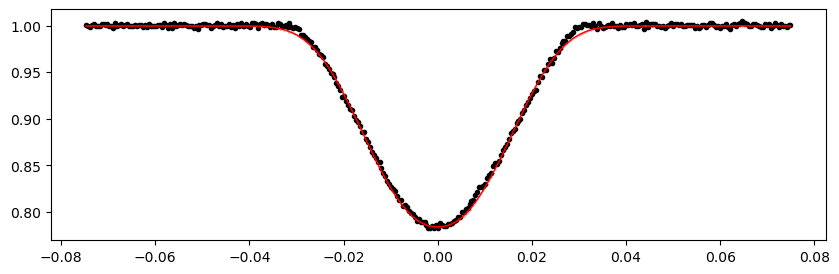

2739.9903160000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1239.18it/s]


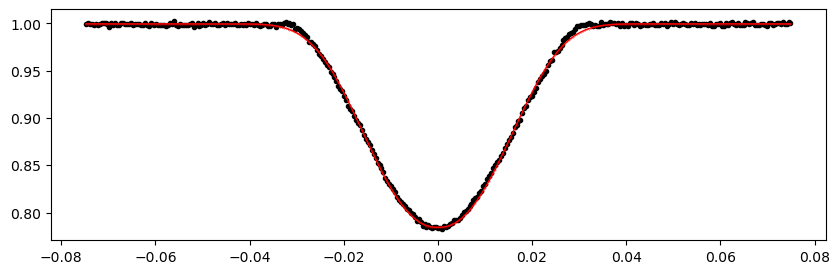

2770.06675 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1278.10it/s]


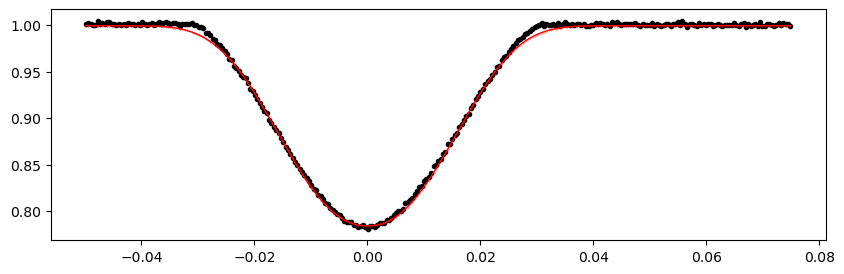

2773.4085760000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1274.07it/s]


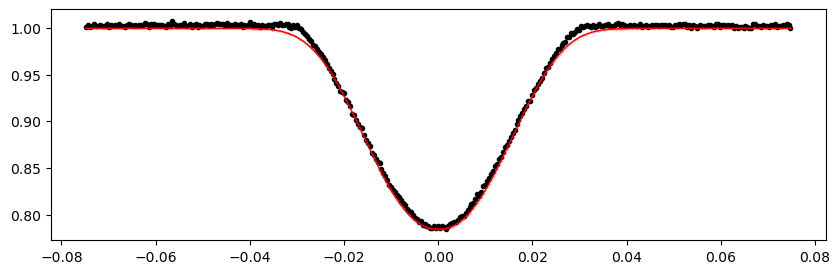

2776.750402 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1246.31it/s]


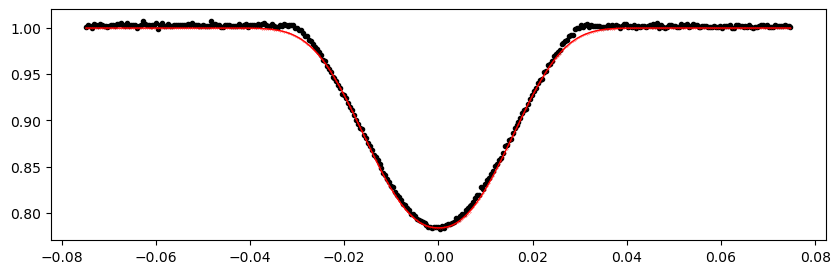

2780.0922280000004 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1226.75it/s]


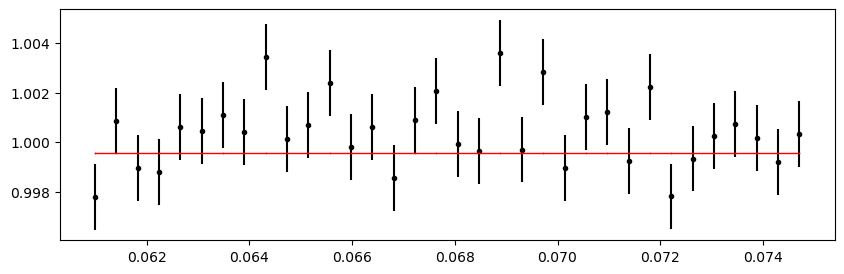

2783.4340540000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1234.37it/s]


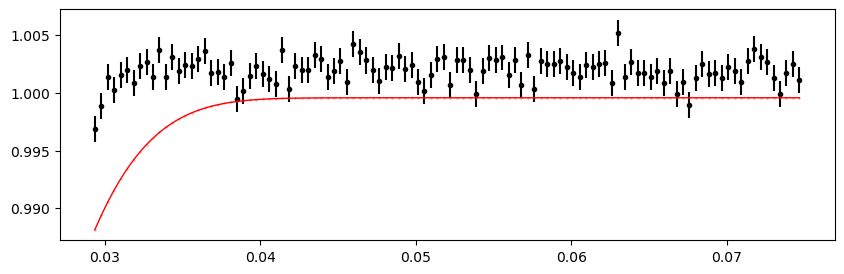

2786.77588 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1204.97it/s]


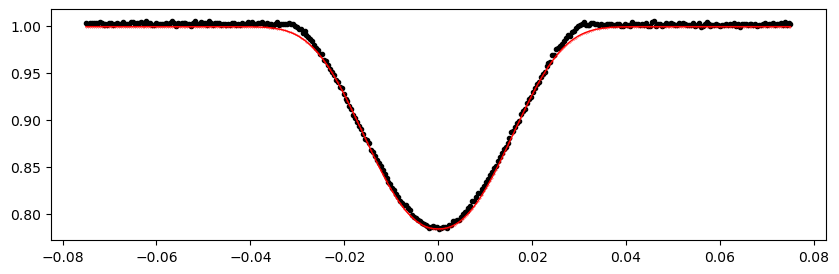

2790.117706 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1207.10it/s]


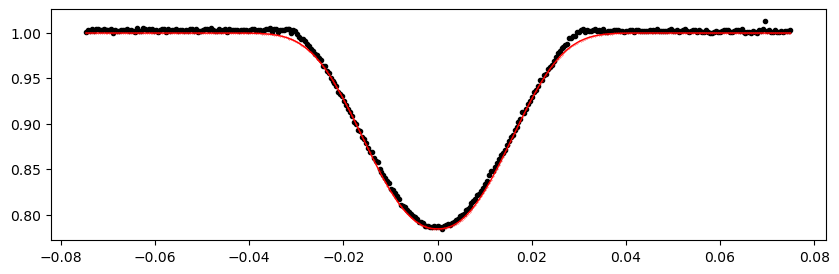

2793.459532 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1224.22it/s]


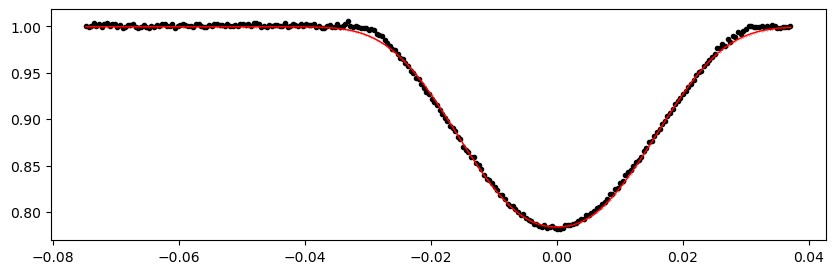

2800.1431840000005 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1289.21it/s]


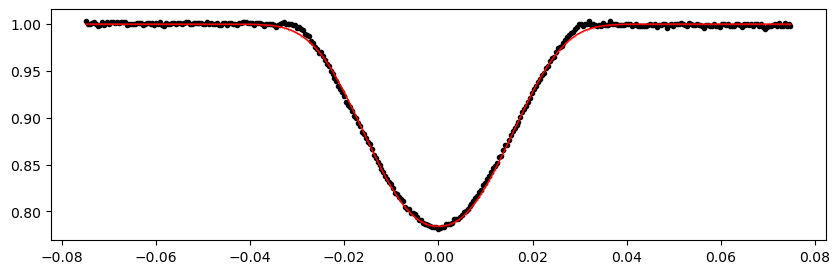

2803.4850100000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1245.19it/s]


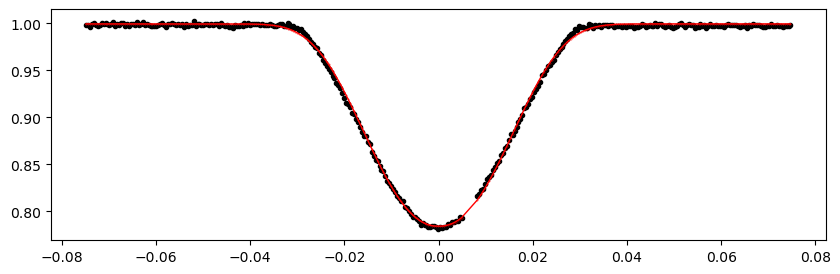

2806.826836 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1213.68it/s]


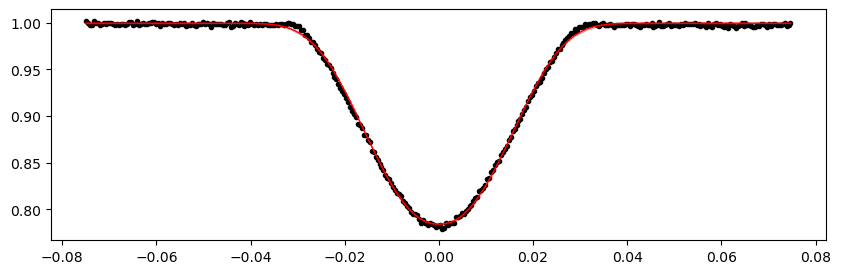

2810.168662 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1247.91it/s]


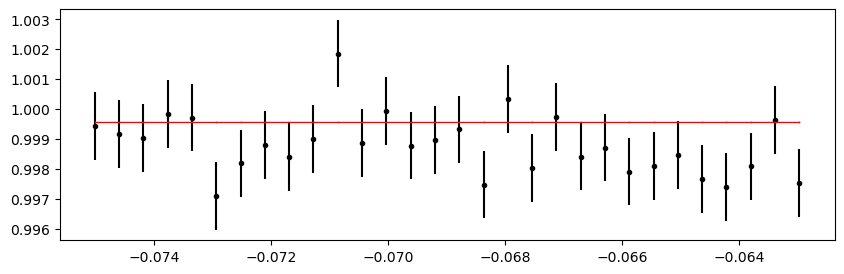

2813.510488 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1127.35it/s]


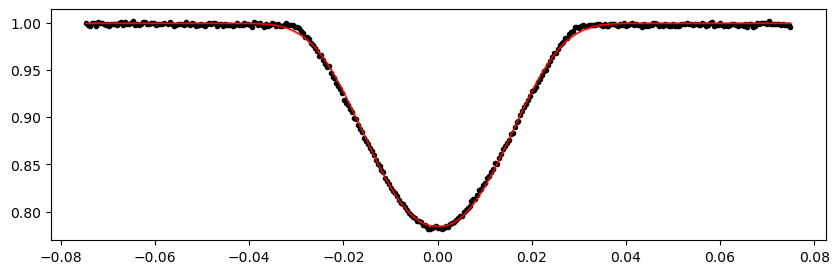

2816.852314 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1137.15it/s]


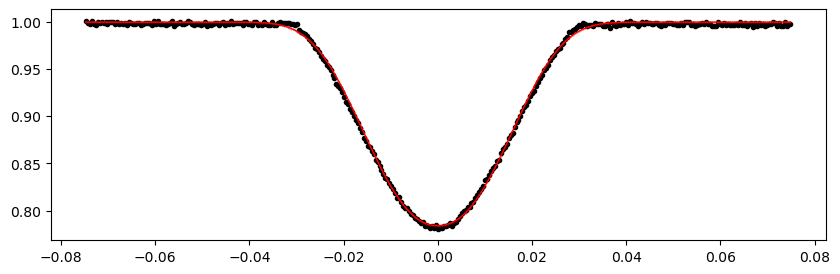

2820.19414 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1237.31it/s]


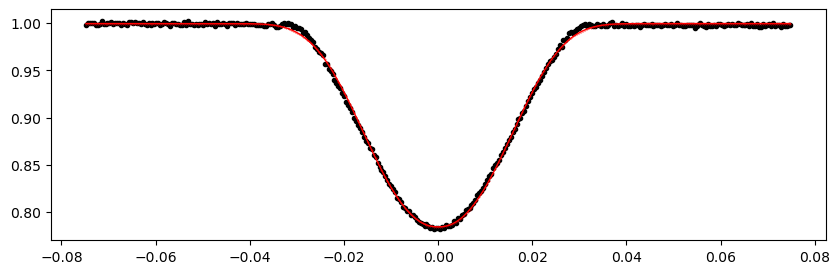

2823.5359660000004 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1221.52it/s]


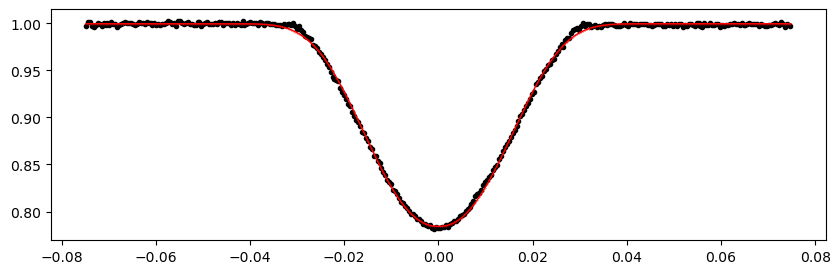

2826.877792 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1236.37it/s]


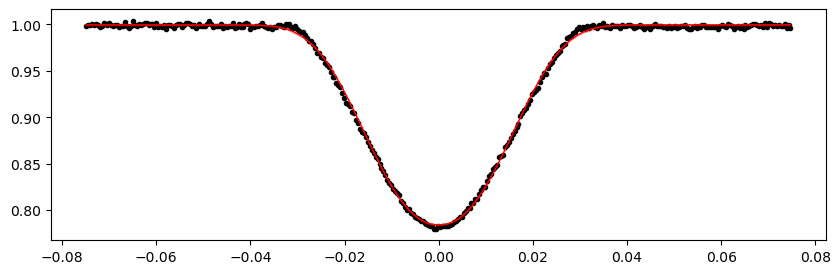

2830.219618 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1232.02it/s]


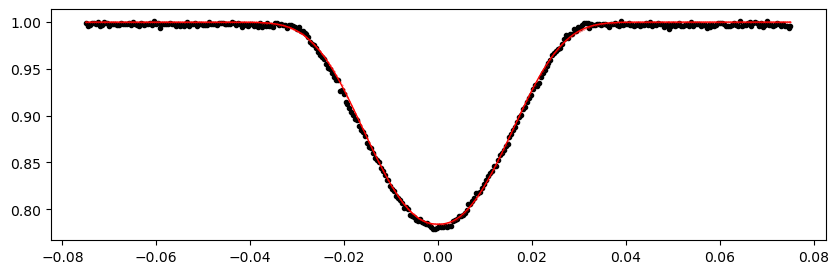

2833.561444 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1250.10it/s]


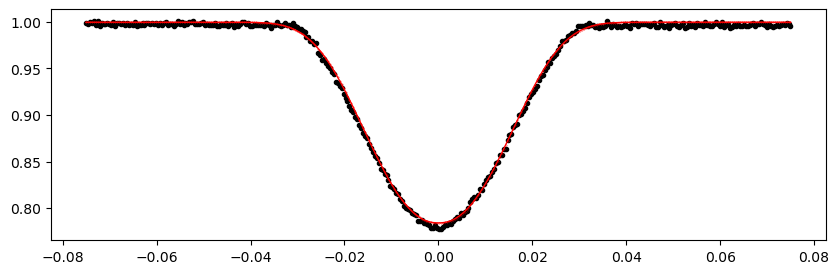

2836.9032700000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1217.57it/s]


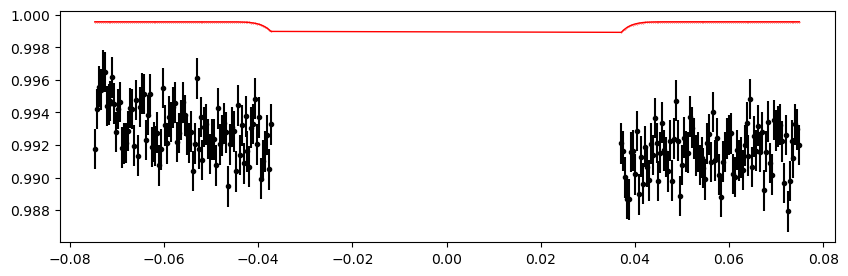

2840.245096 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1224.77it/s]


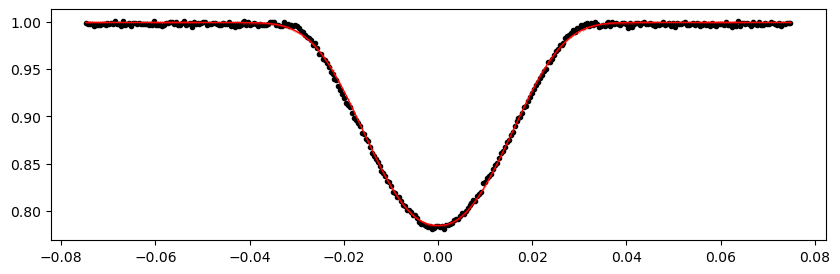

2843.5869220000004 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1250.26it/s]


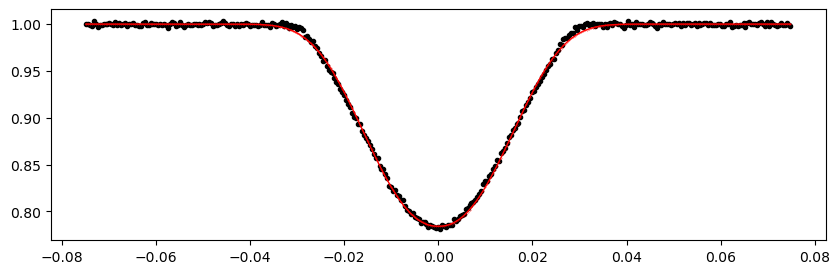

2846.9287480000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1210.00it/s]


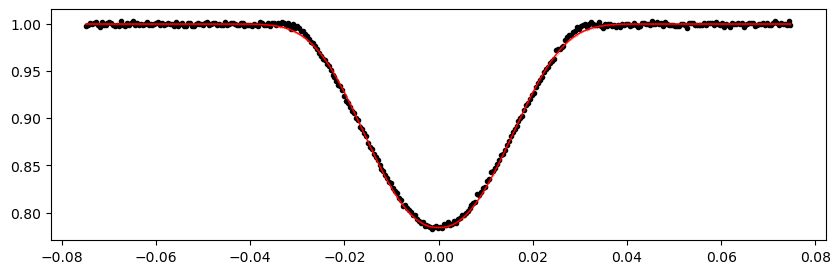

2850.270574 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1219.46it/s]


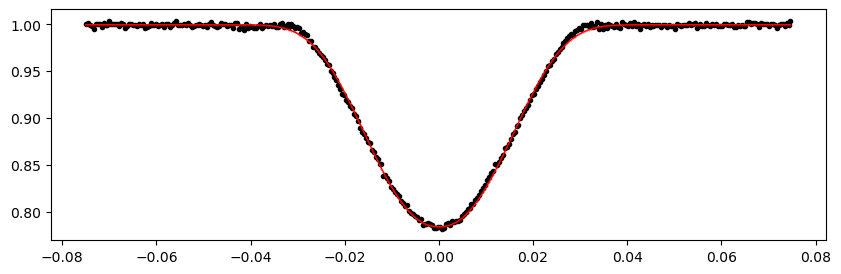

2853.6124 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1214.54it/s]


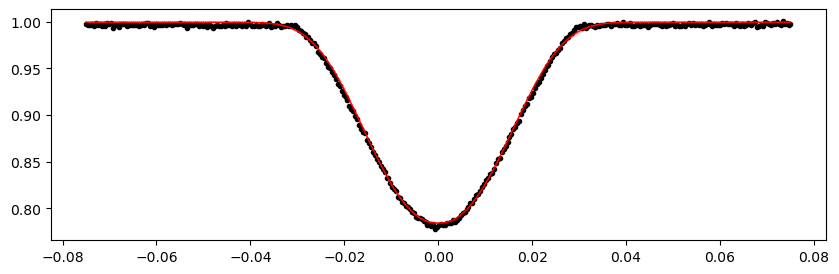

2856.954226 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1183.57it/s]


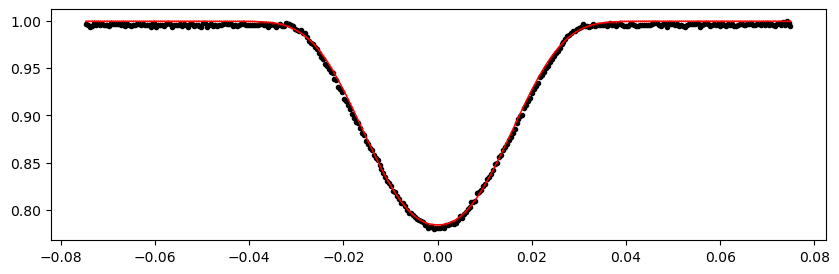

2860.296052 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1218.94it/s]


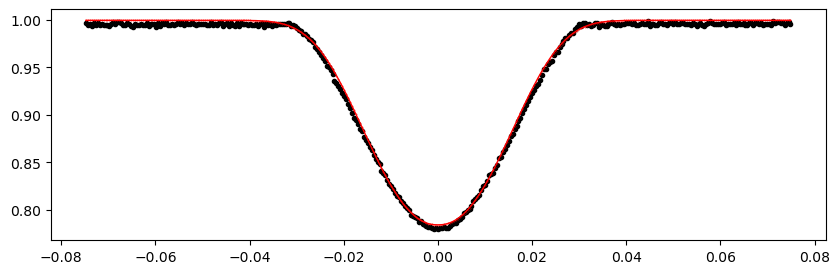

2866.9797040000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1212.78it/s]


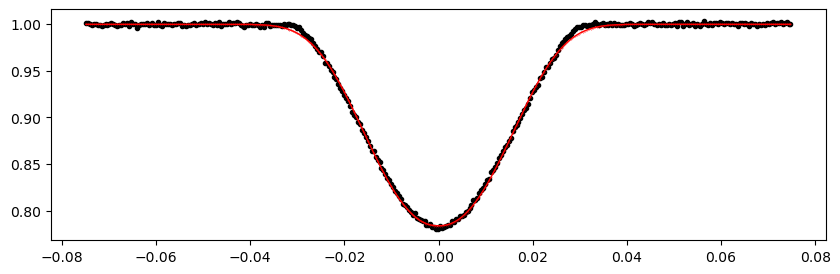

2870.32153 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1224.53it/s]


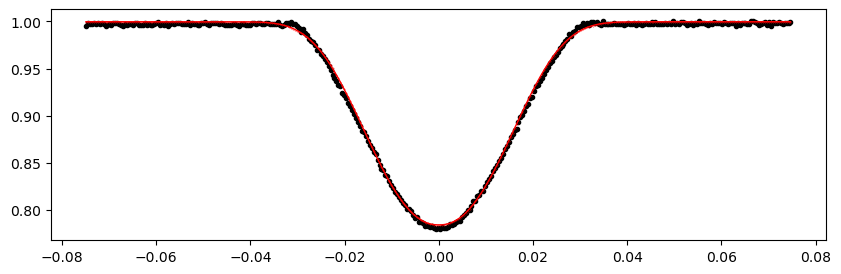

2873.663356 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1258.98it/s]


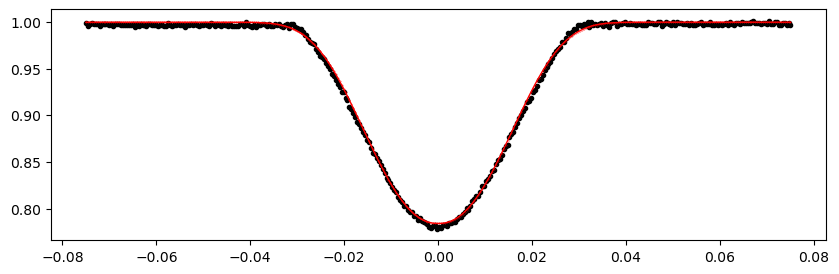

2877.005182 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1253.23it/s]


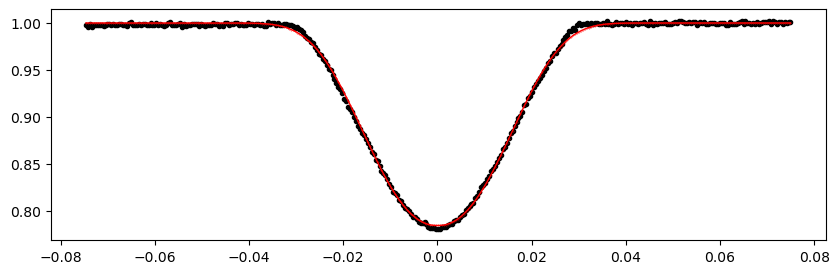

2880.347008 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1263.81it/s]


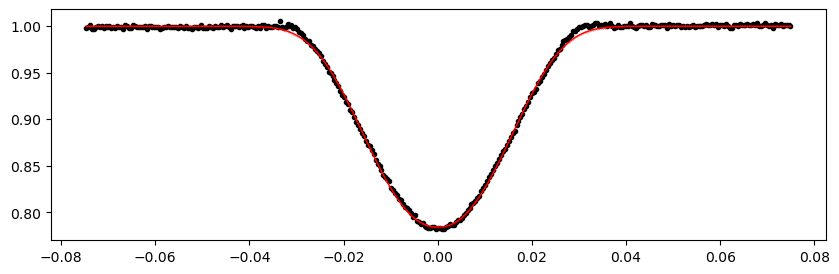

2883.6888340000005 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1193.32it/s]


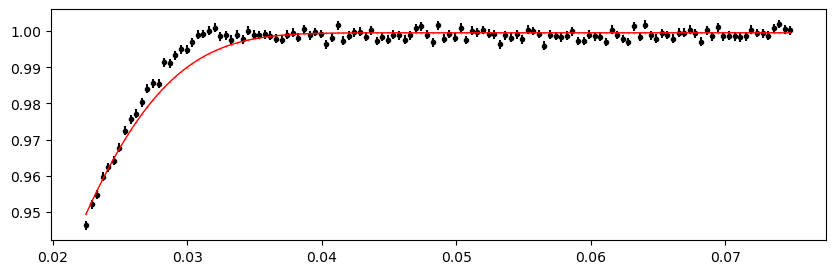

2887.0306600000004 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1207.03it/s]


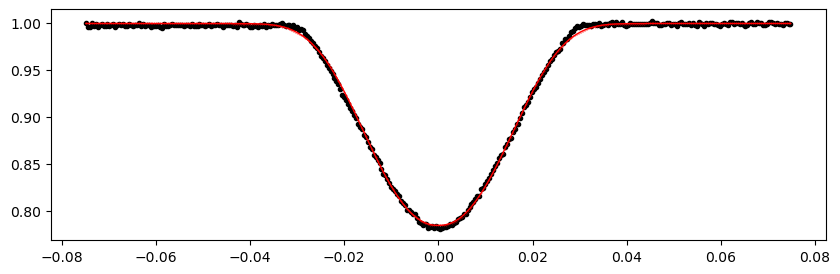

2890.372486 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1243.21it/s]


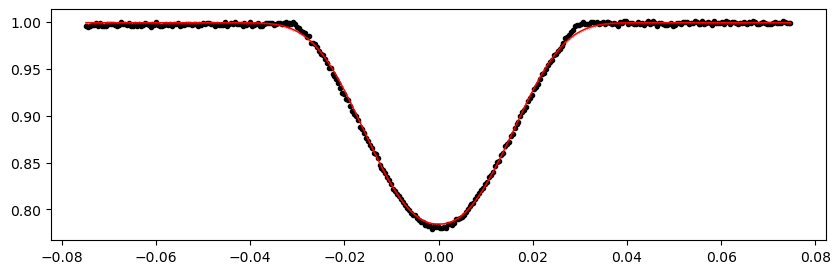

2893.714312 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1224.08it/s]


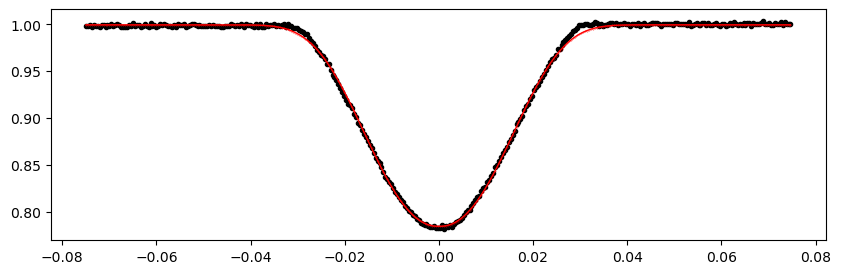

2900.3979640000002 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1242.33it/s]


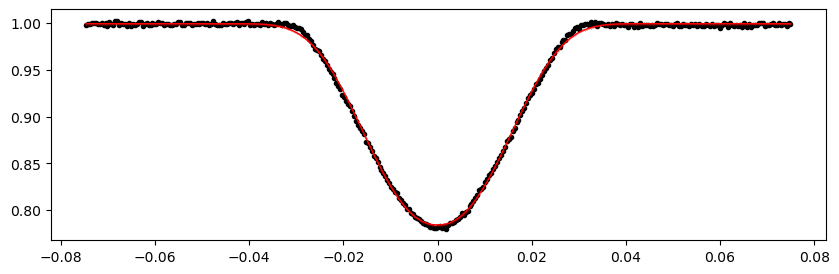

2903.73979 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1211.99it/s]


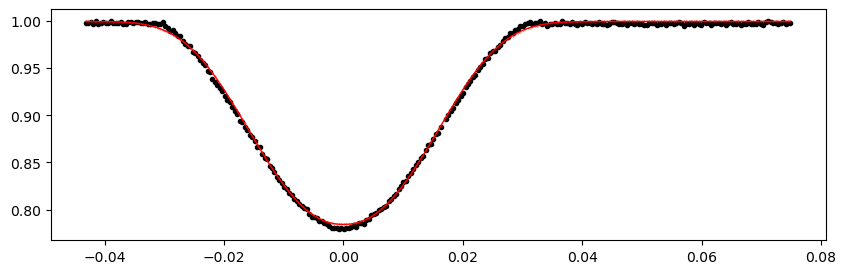

2907.0816160000004 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1212.26it/s]


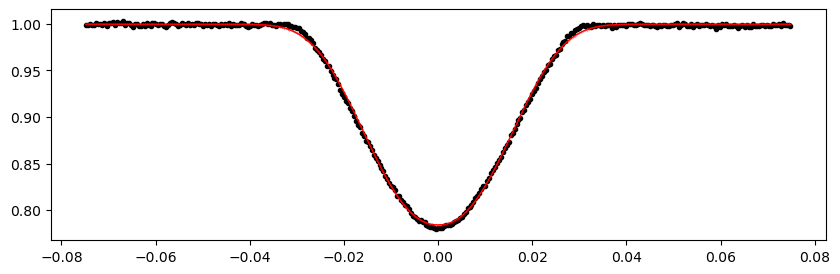

2913.765268 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1242.34it/s]


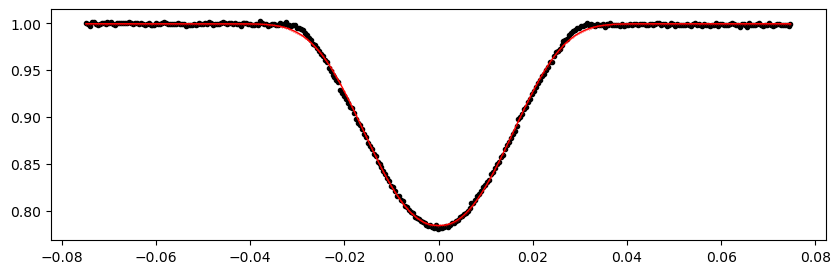

2917.107094 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1256.57it/s]


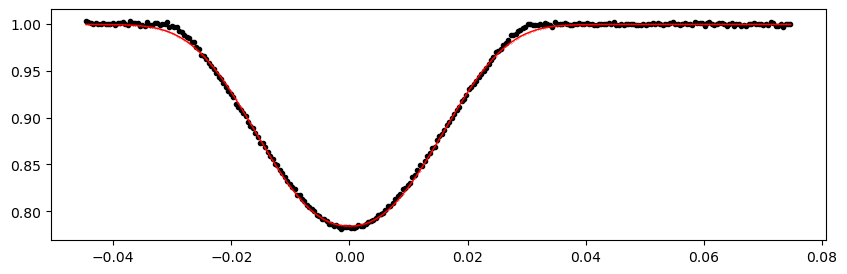

2920.4489200000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1250.28it/s]


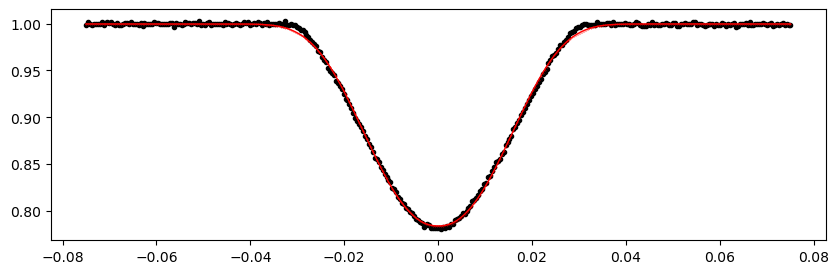

2927.1325720000004 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1229.23it/s]


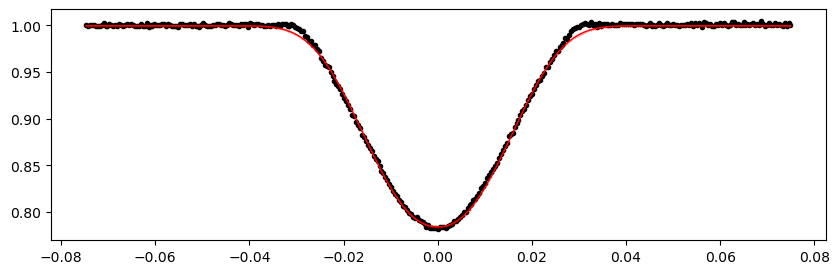

2930.4743980000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1177.79it/s]


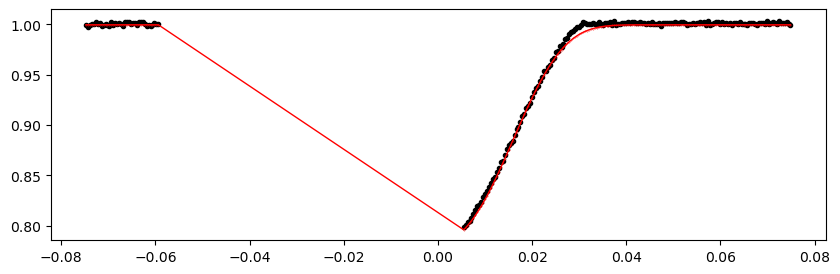

2933.816224 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1243.35it/s]


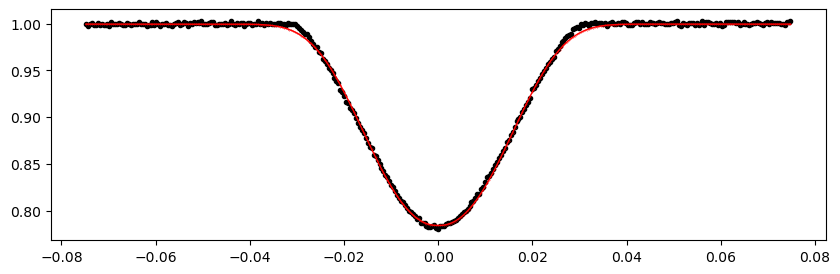

2940.499876 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1259.93it/s]


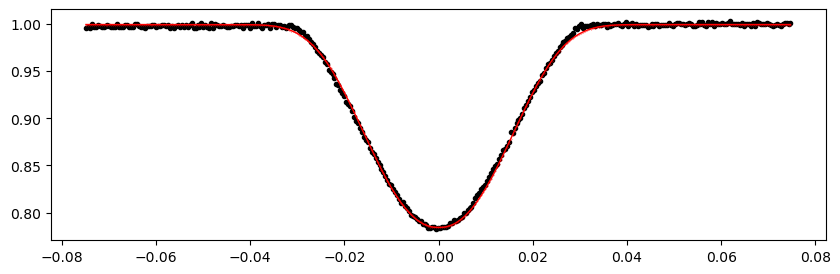

2943.841702 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1249.48it/s]


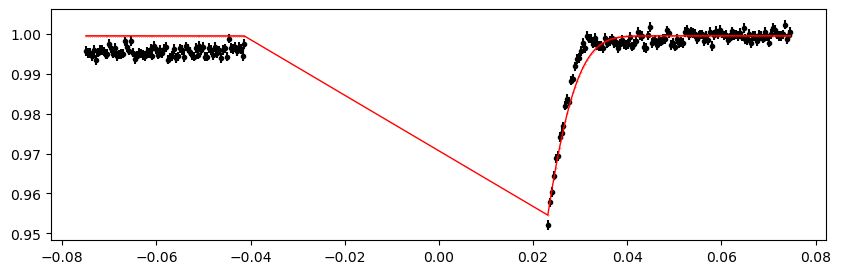

2947.1835280000005 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1249.50it/s]


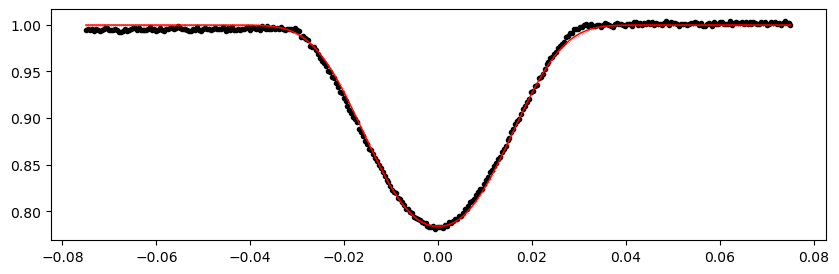

2957.209006 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1211.60it/s]


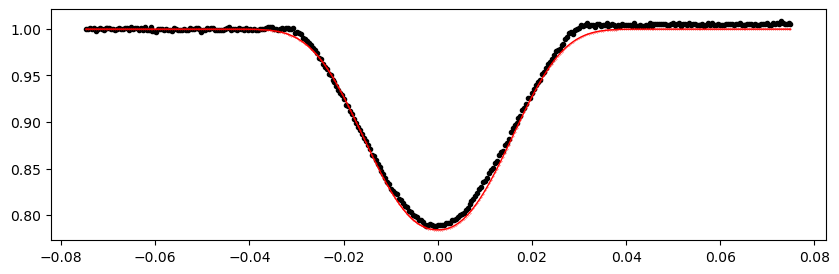

2960.550832 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1256.32it/s]


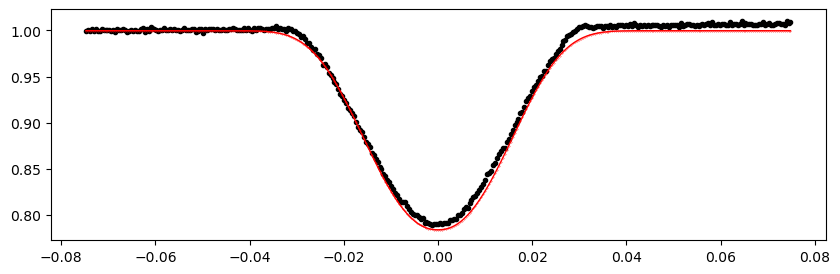

3291.391606 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1237.05it/s]


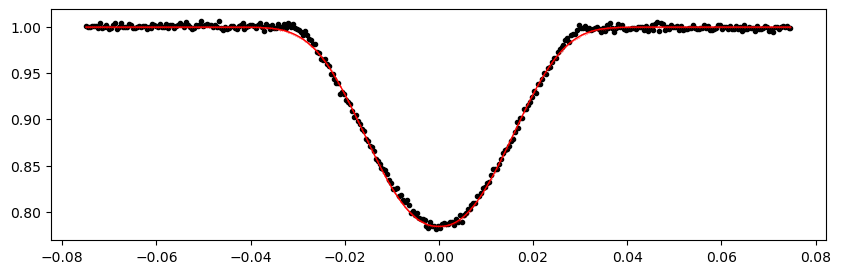

3294.733432 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1253.06it/s]


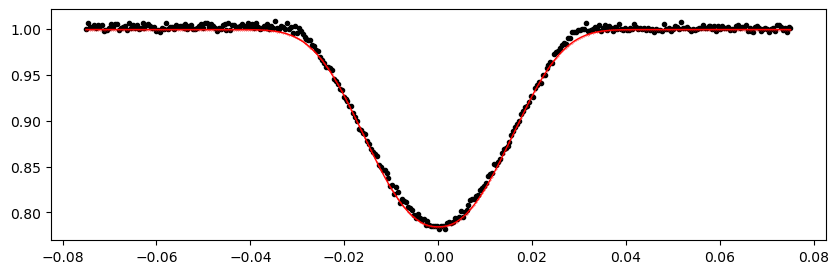

3298.0752580000003 0.9995737754750964 -0.2153080194871514 -0.09198993944674563


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1262.45it/s]


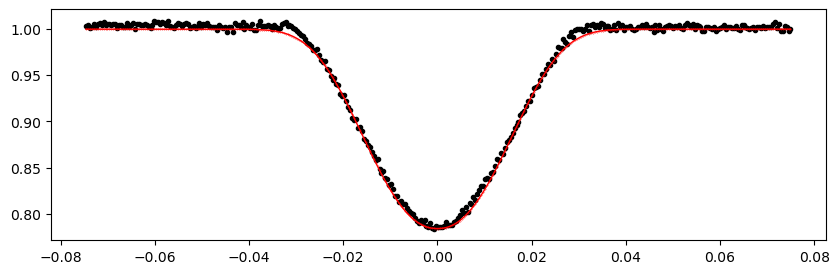

In [33]:
%matplotlib inline

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path)
!$NOTIFY_CMD "Individual primary eclipses fit done"

#---
%matplotlib inline

print("Fitting individual secondary eclipses...")
etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s)
!$NOTIFY_CMD "Individual secondary eclipses fit done"

Fitting individual secondary eclipses...
Creating new manifest file
1683.9733 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


  0%|                                                                    | 0/10000 [00:00<?, ?it/s]C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.72it/s]


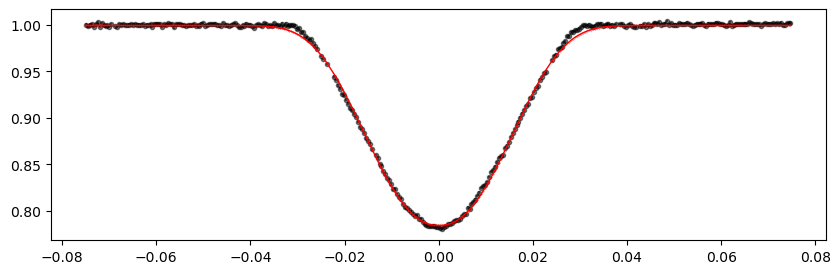

1687.3151240000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.86it/s]


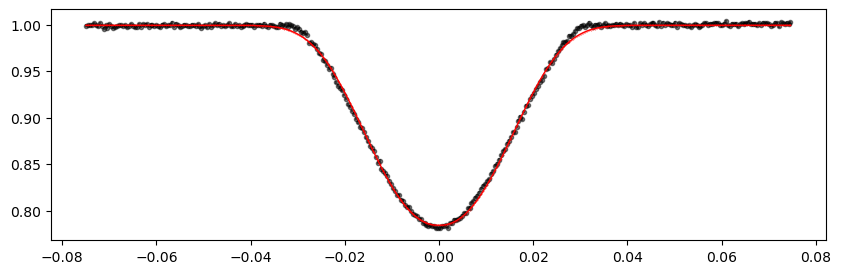

1690.656948 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1330.73it/s]


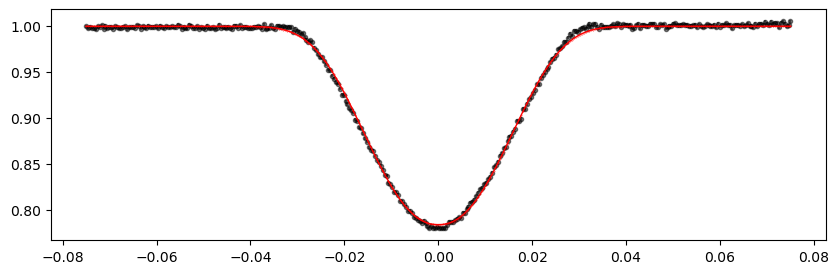

1697.340596 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.65it/s]


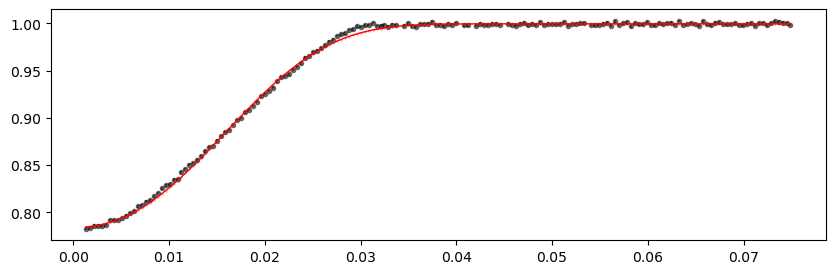

1700.68242 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.37it/s]


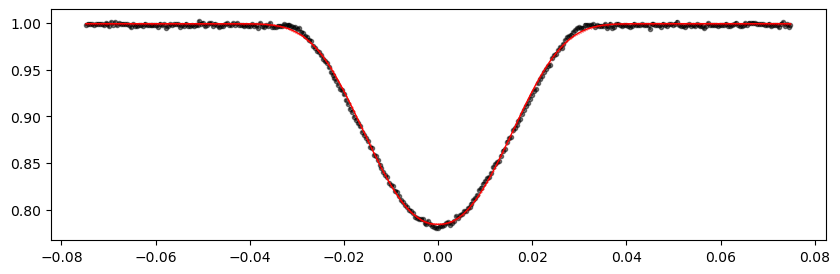

1704.0242440000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.10it/s]


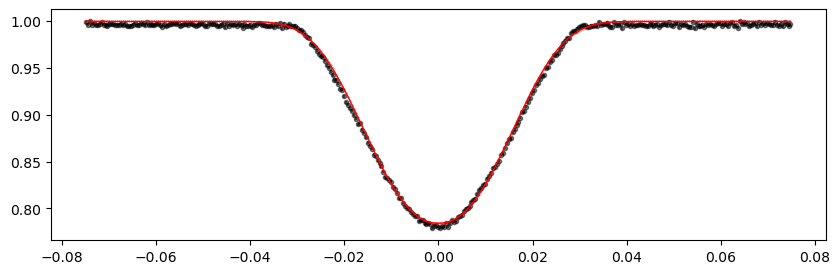

1714.0497160000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.67it/s]


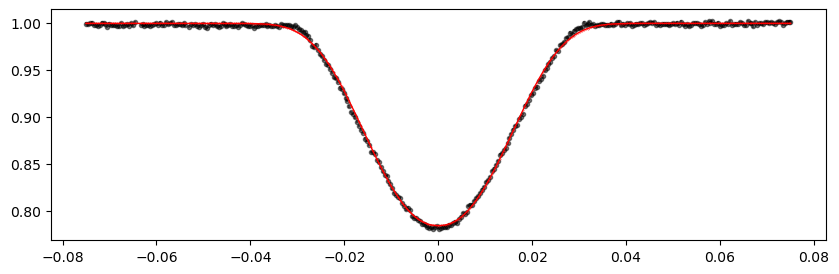

1717.39154 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.64it/s]


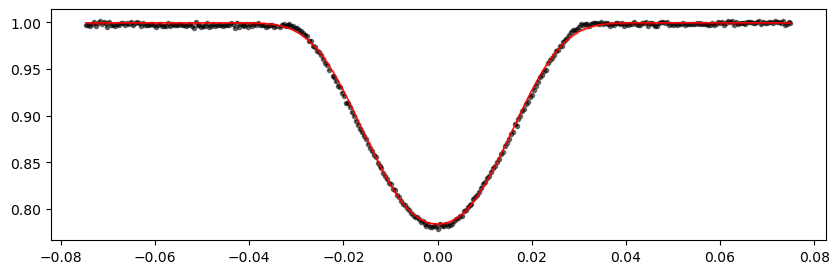

1720.7333640000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.39it/s]


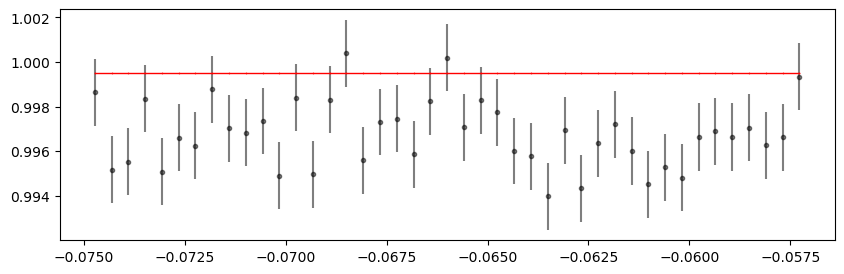

1727.417012 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.94it/s]


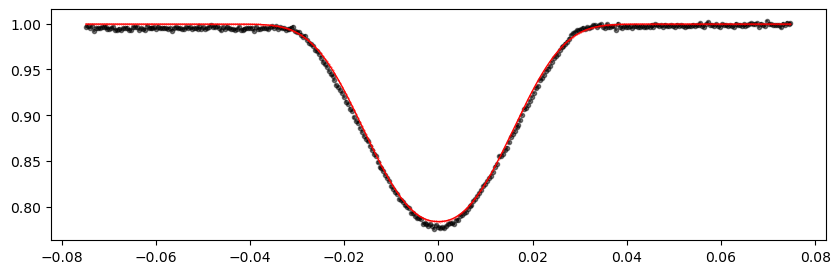

1730.7588360000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.02it/s]


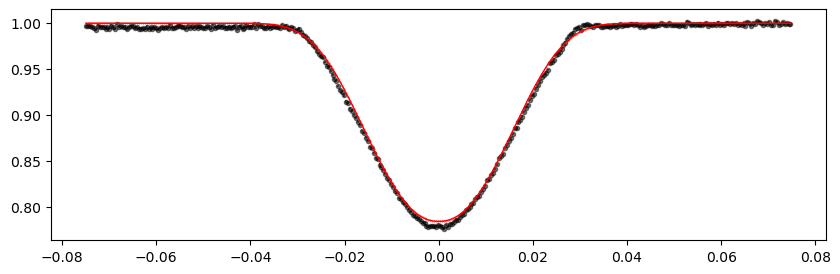

1734.10066 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.08it/s]


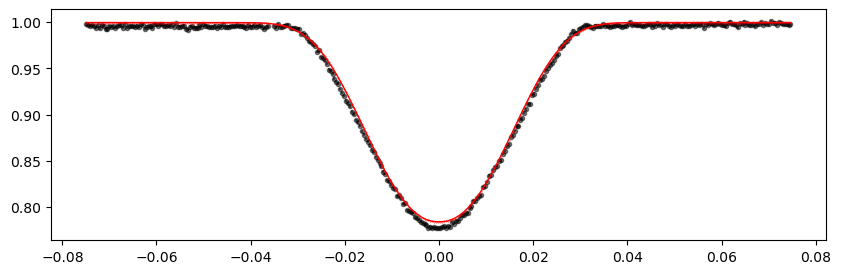

1740.784308 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.45it/s]


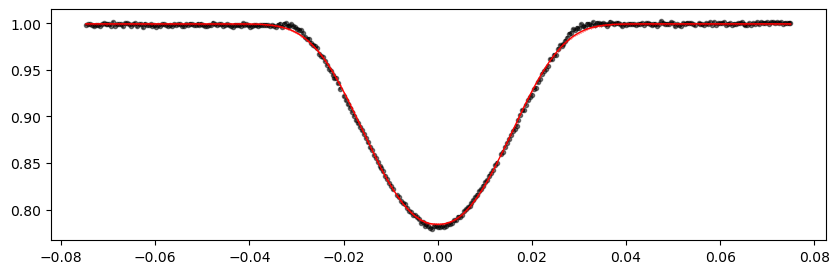

1744.126132 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.31it/s]


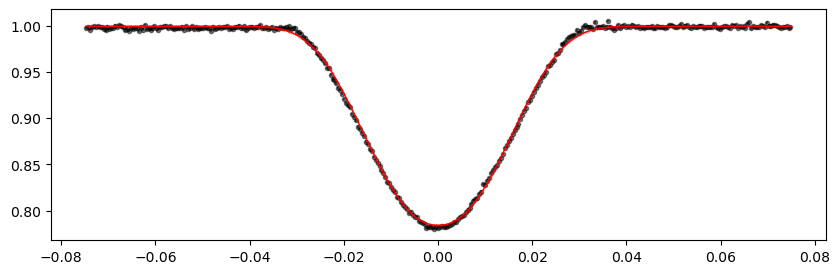

1747.4679560000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1337.27it/s]


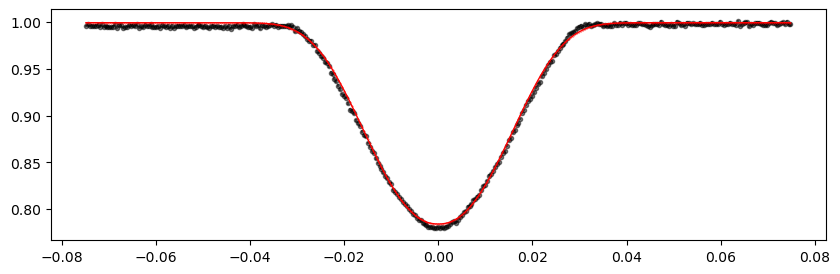

1754.1516040000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.73it/s]


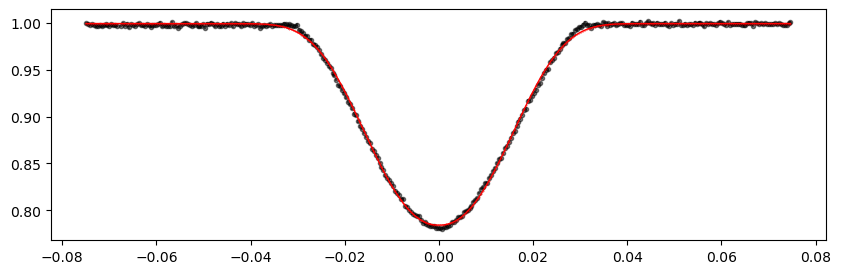

1757.4934280000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.04it/s]


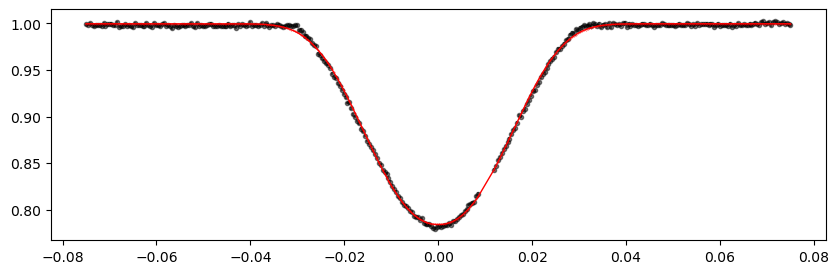

1760.835252 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.04it/s]


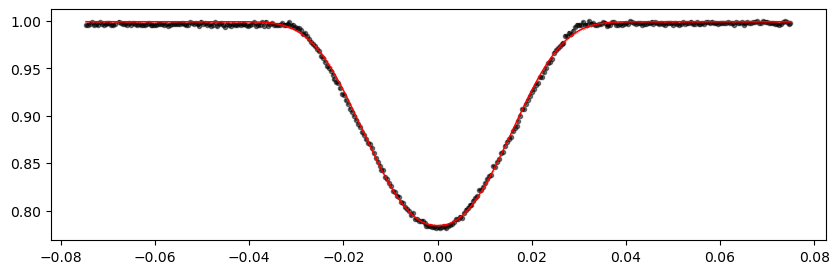

1767.5189 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.18it/s]


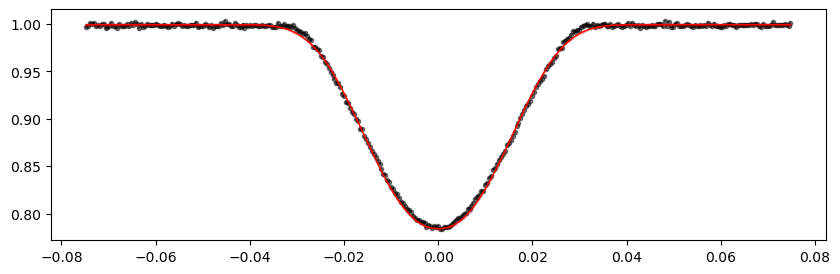

1770.8607240000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.14it/s]


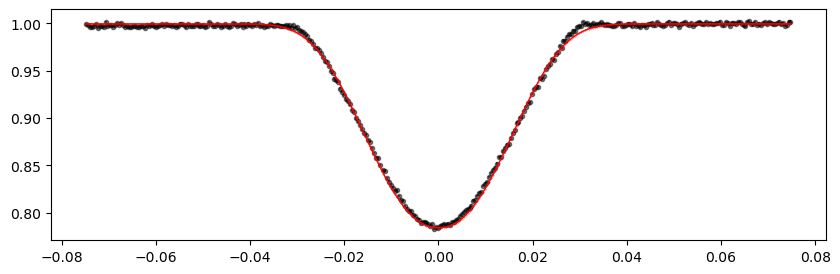

1774.2025480000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.57it/s]


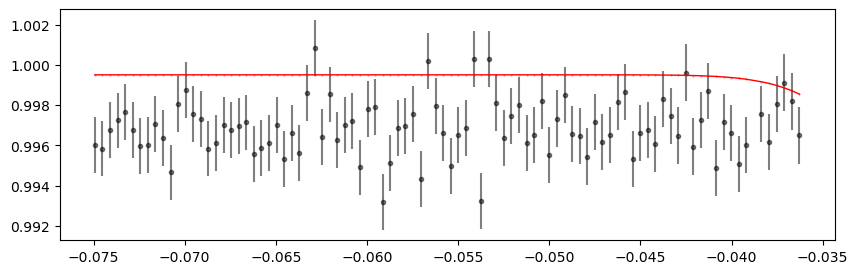

1777.544372 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.23it/s]


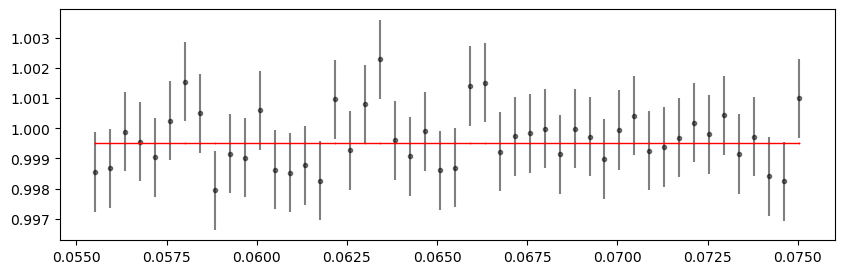

1780.8861960000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.56it/s]


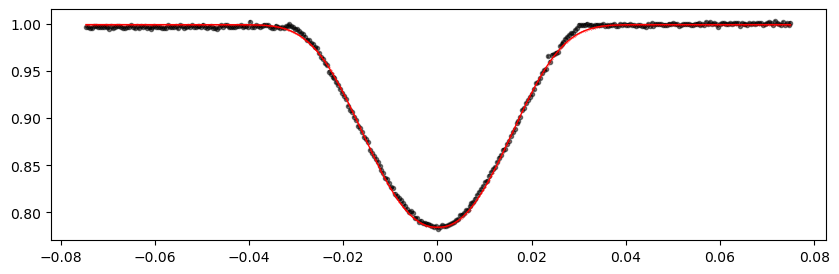

1784.22802 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.18it/s]


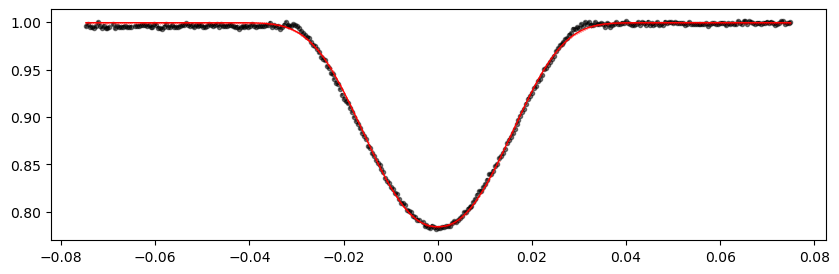

1787.569844 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.86it/s]


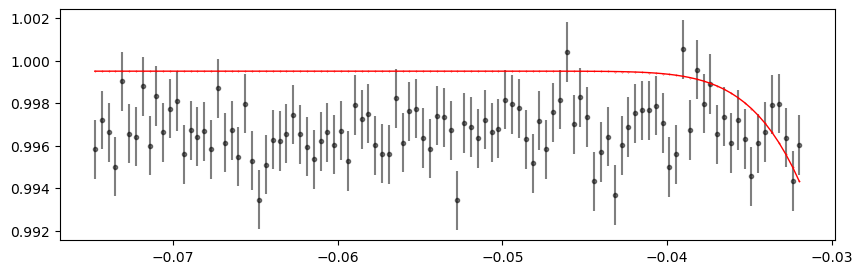

1790.9116680000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1332.21it/s]


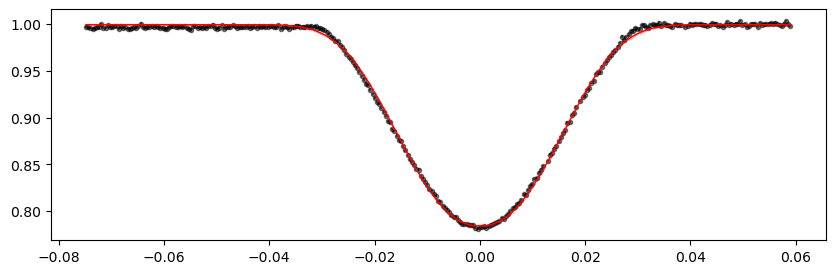

1794.253492 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.09it/s]


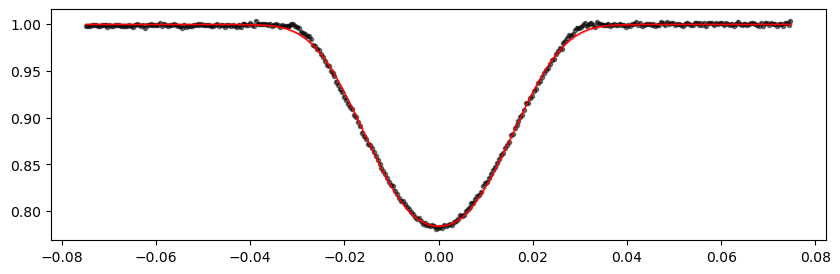

1797.5953160000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.74it/s]


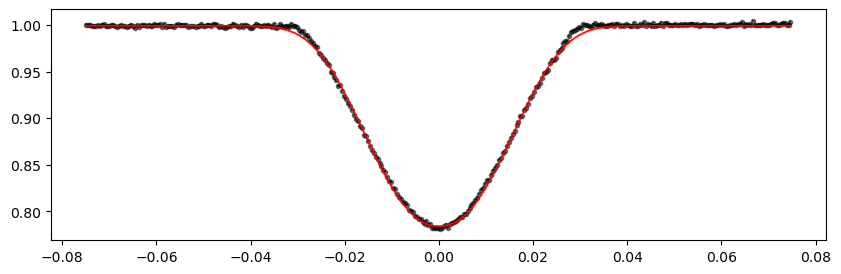

1800.93714 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.35it/s]


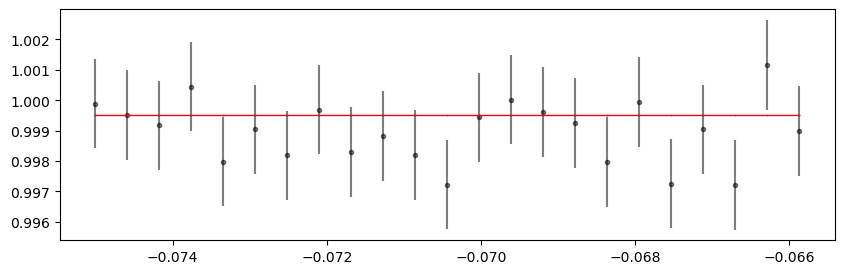

1804.278964 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.75it/s]


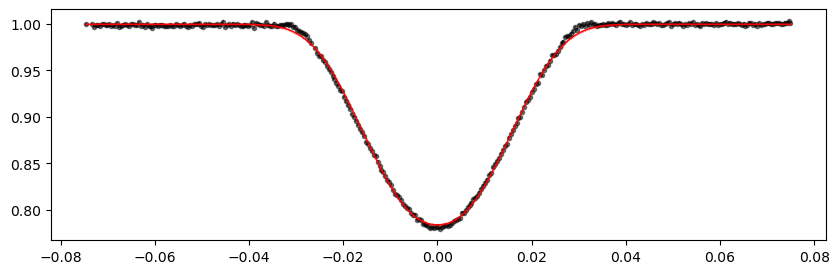

1807.6207880000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.81it/s]


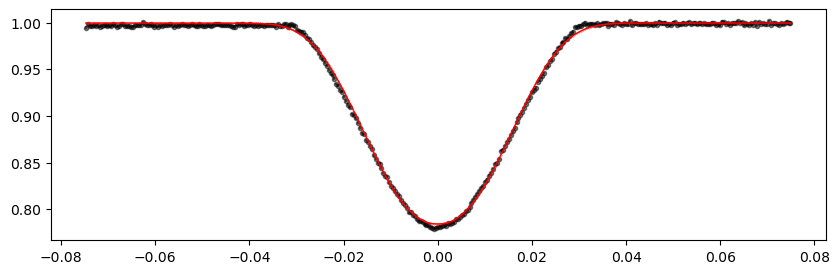

1810.962612 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.16it/s]


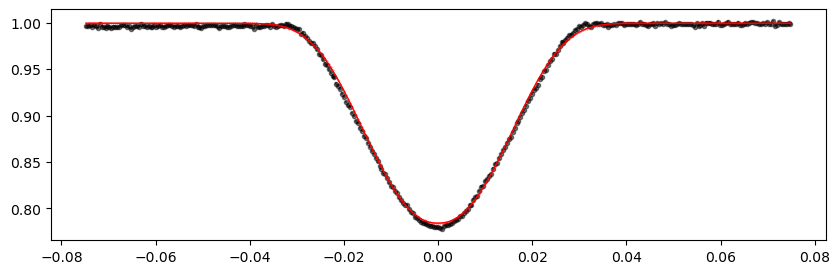

1817.64626 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.86it/s]


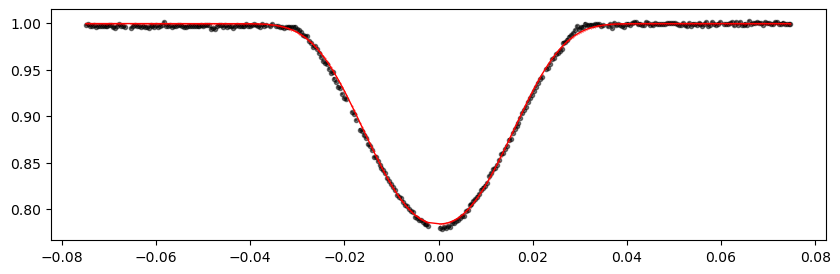

1820.988084 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.02it/s]


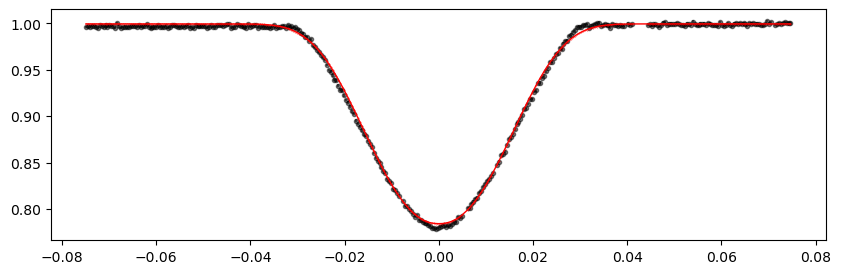

1824.3299080000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.01it/s]


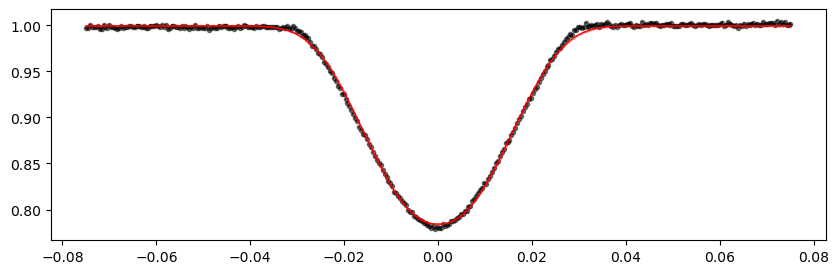

1827.671732 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.95it/s]


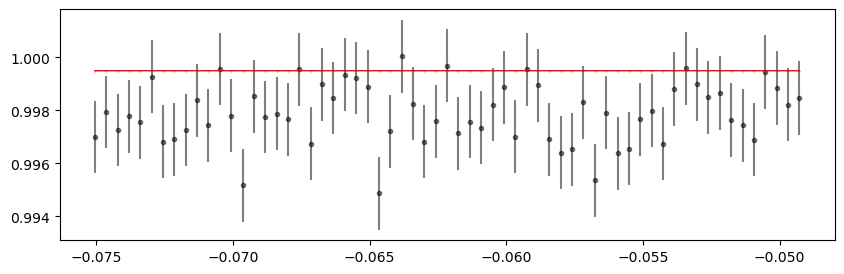

1831.013556 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.55it/s]


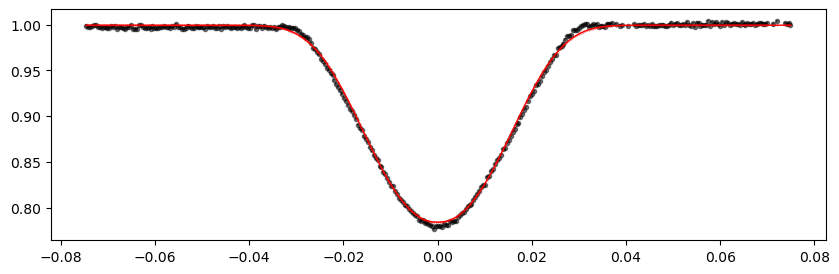

1834.3553800000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.29it/s]


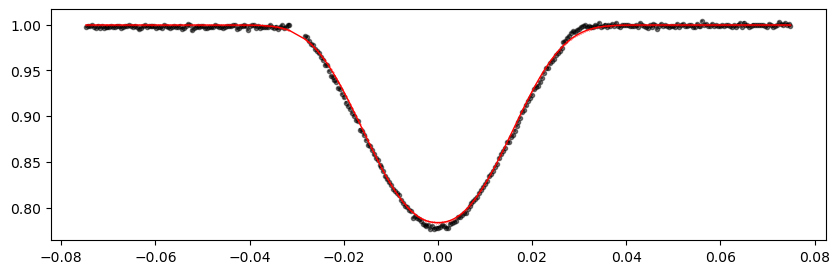

1837.697204 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.07it/s]


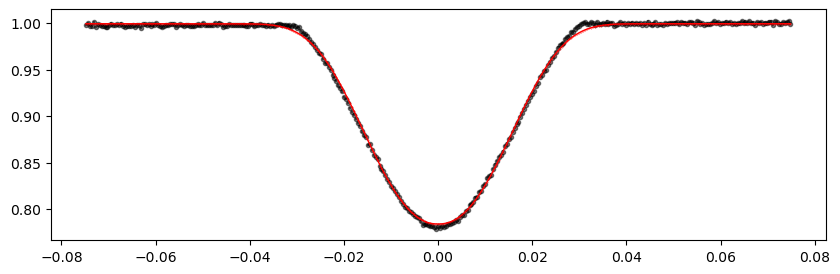

1841.0390280000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1324.69it/s]


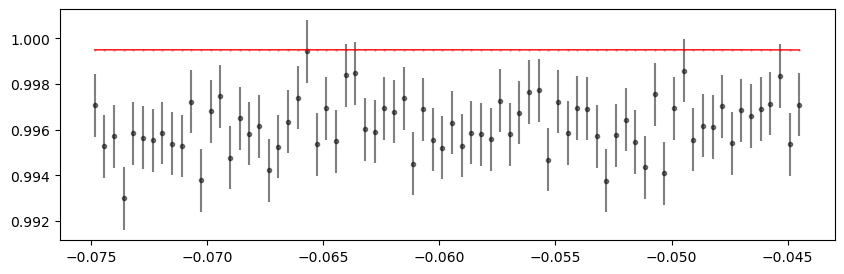

1844.3808520000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.76it/s]


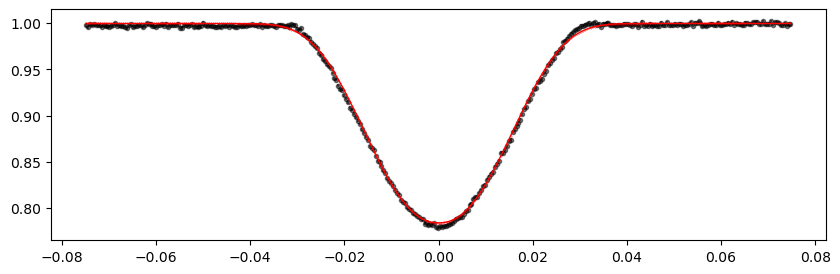

1847.722676 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.17it/s]


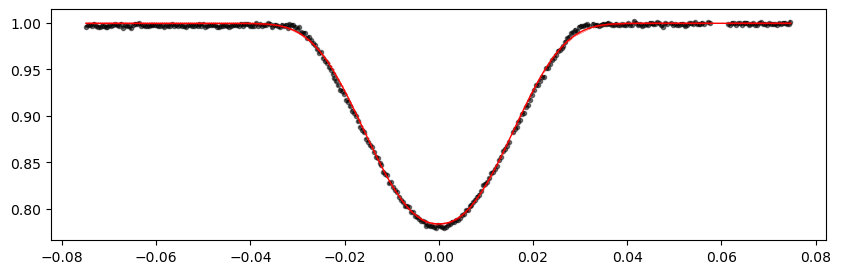

1851.0645000000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.30it/s]


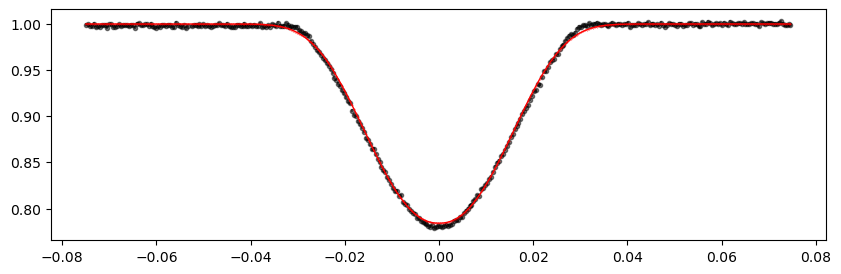

1854.406324 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1330.81it/s]


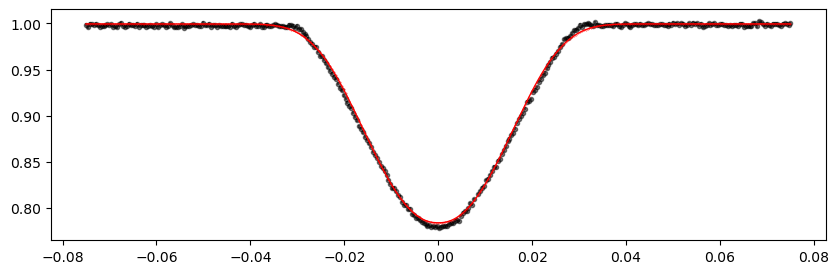

1857.7481480000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.52it/s]


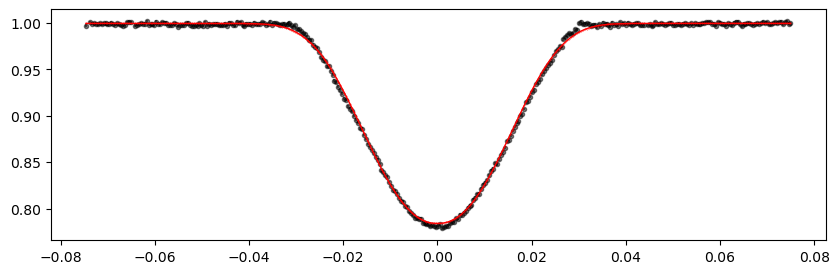

1861.0899720000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.84it/s]


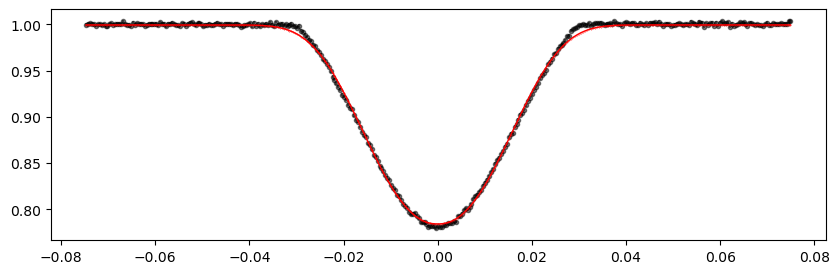

1864.431796 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.06it/s]


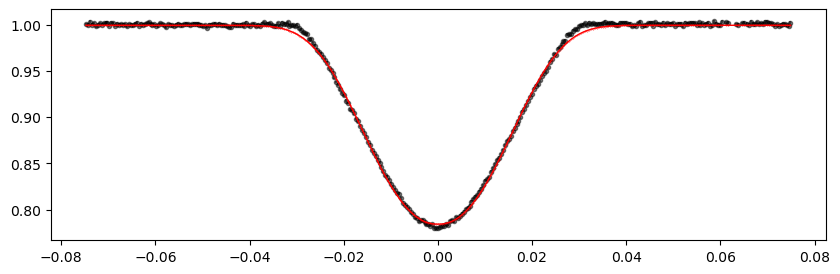

1867.7736200000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.41it/s]


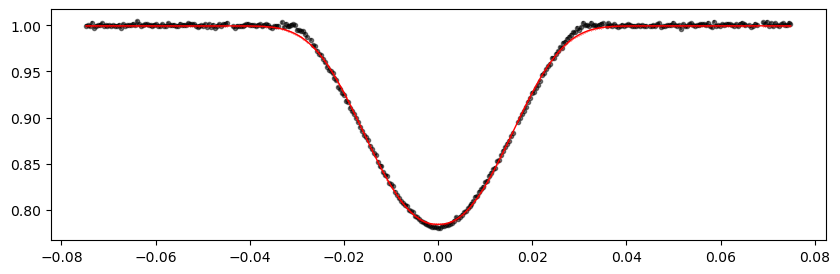

1871.115444 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.18it/s]


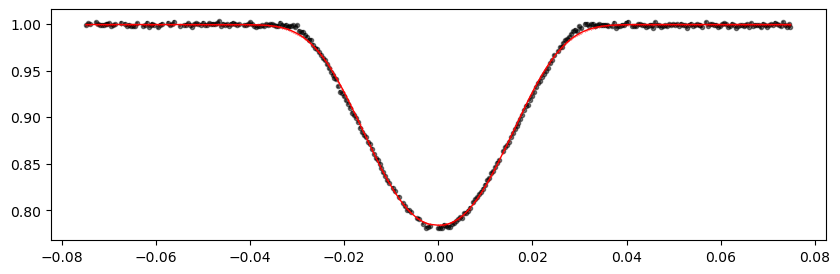

1874.457268 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.86it/s]


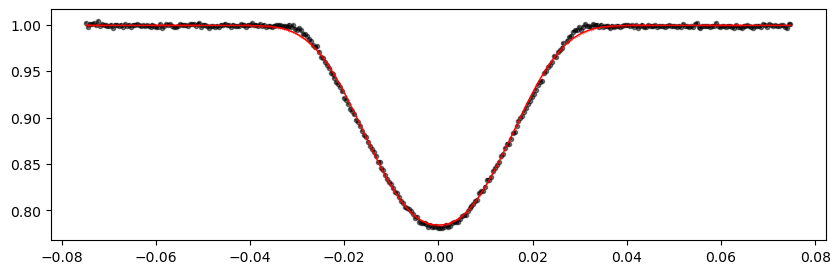

1877.7990920000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.05it/s]


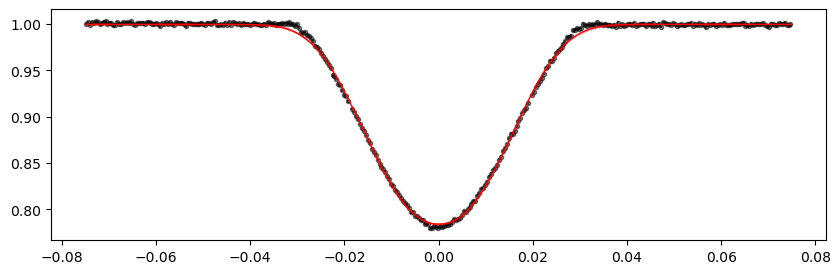

1881.140916 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.57it/s]


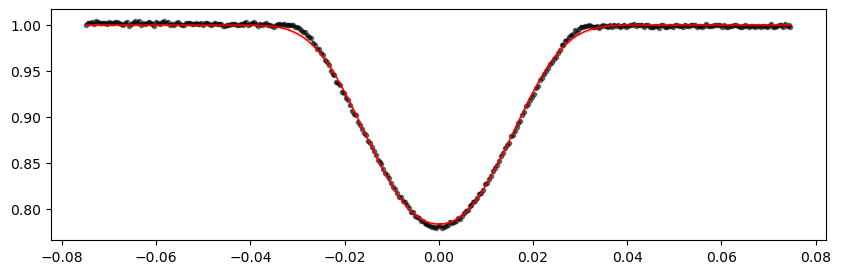

1887.824564 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.50it/s]


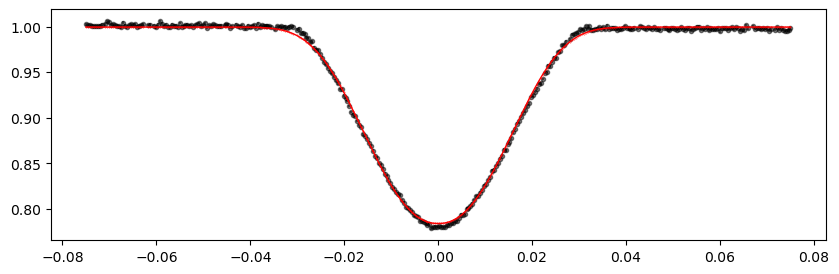

1891.166388 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.37it/s]


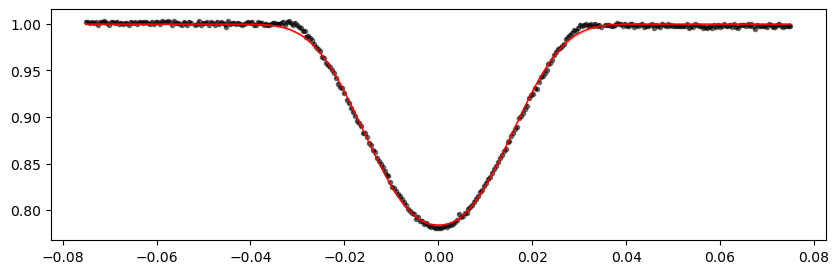

1894.5082120000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.54it/s]


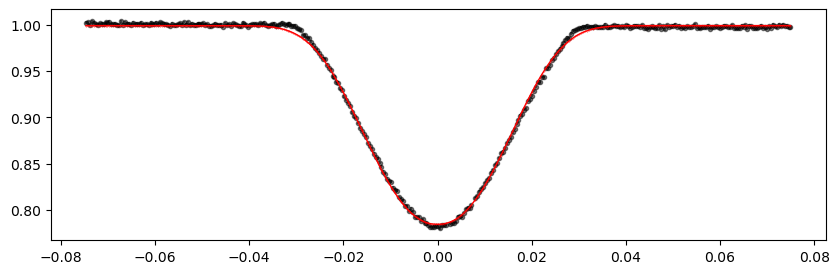

1897.850036 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.79it/s]


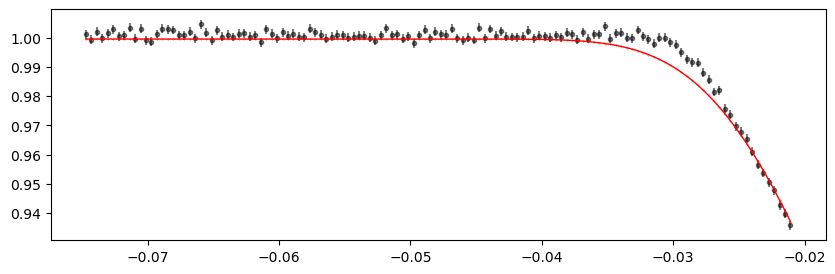

1901.1918600000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.46it/s]


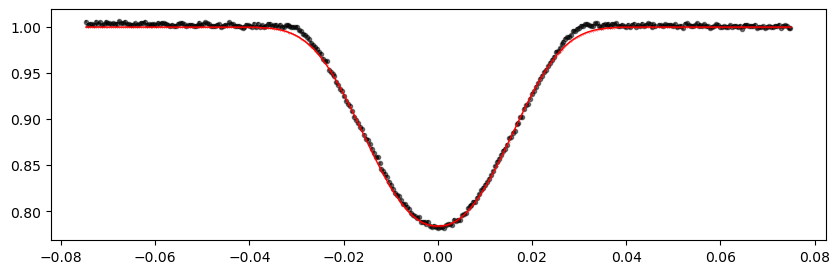

1904.533684 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1357.10it/s]


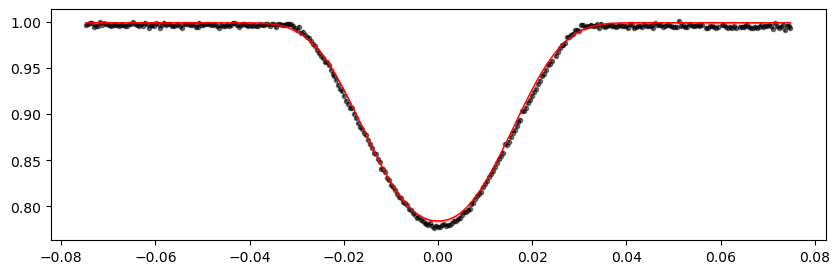

1907.875508 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.30it/s]


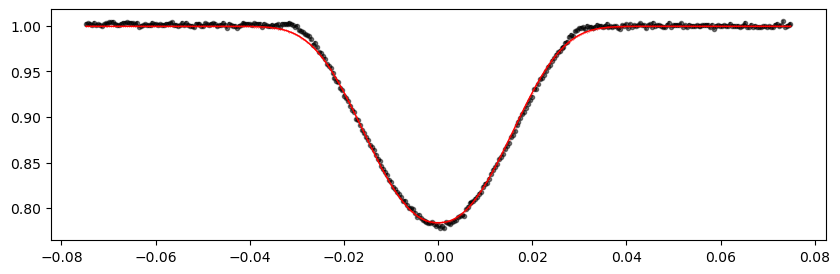

1911.2173320000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.37it/s]


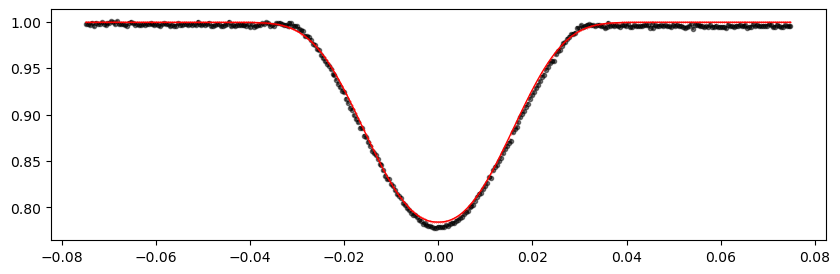

1917.9009800000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.30it/s]


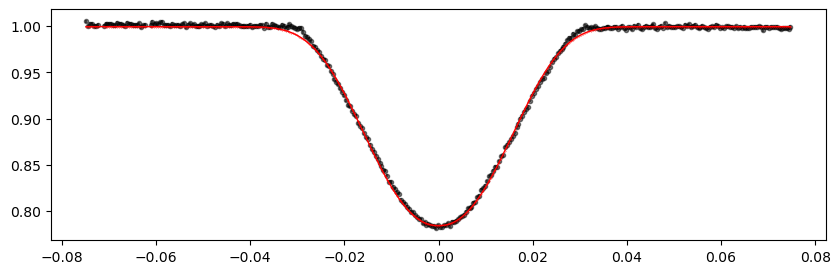

1921.242804 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.72it/s]


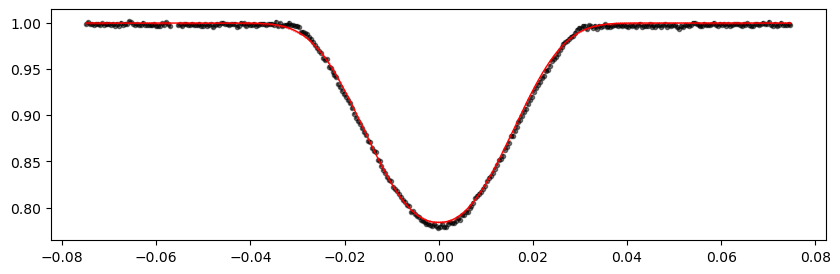

1924.584628 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.61it/s]


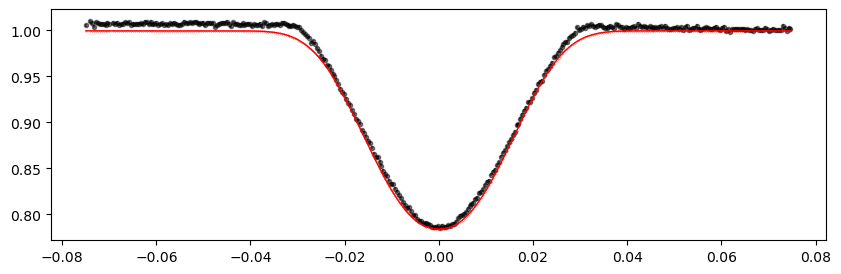

1931.268276 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.16it/s]


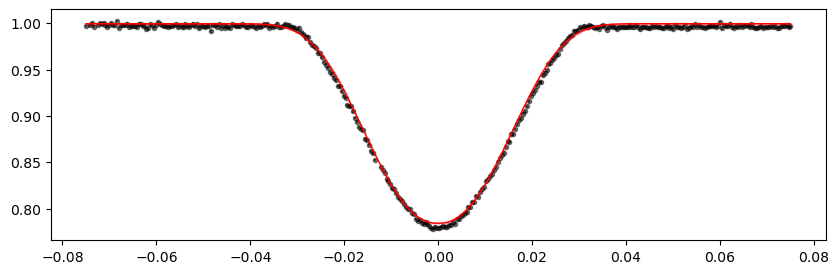

1934.6101 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.75it/s]


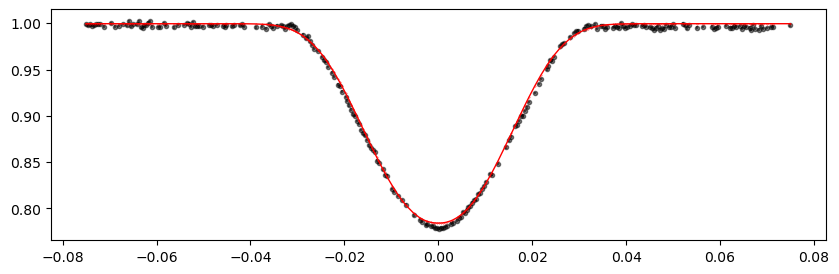

1937.9519240000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.31it/s]


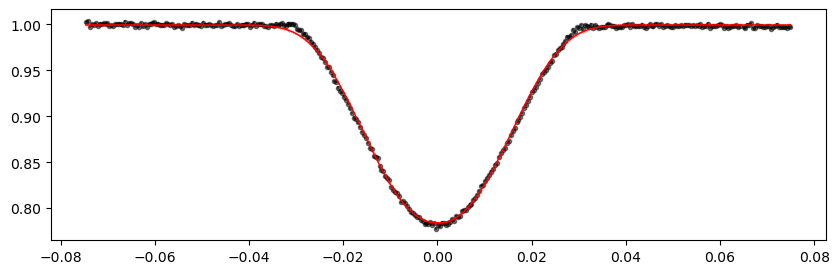

1944.6355720000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.45it/s]


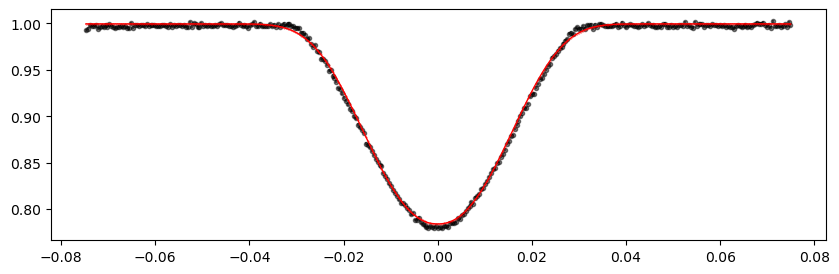

1947.9773960000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1333.74it/s]


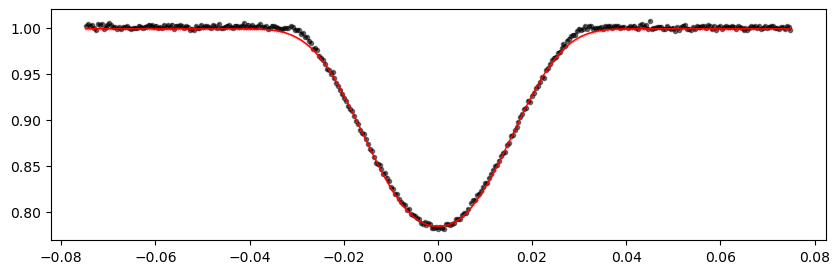

1951.31922 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.65it/s]


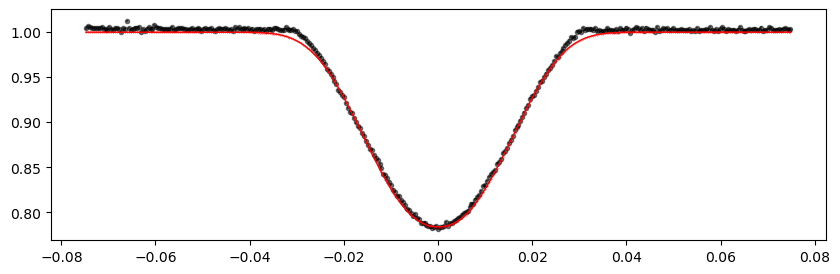

1954.6610440000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.30it/s]


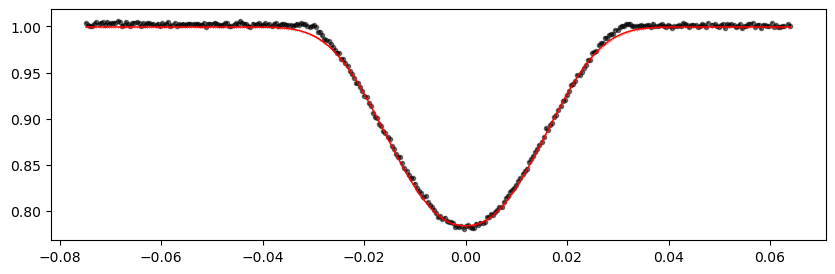

1958.002868 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.31it/s]


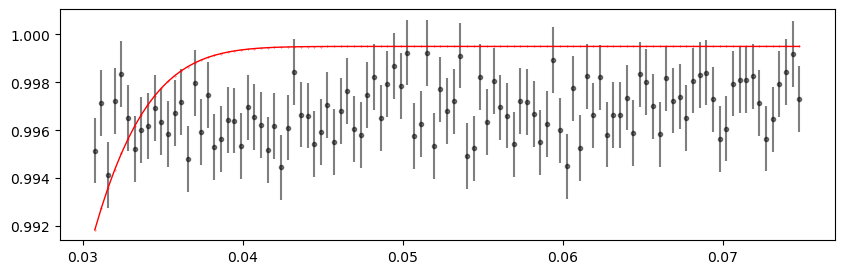

1961.3446920000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.30it/s]


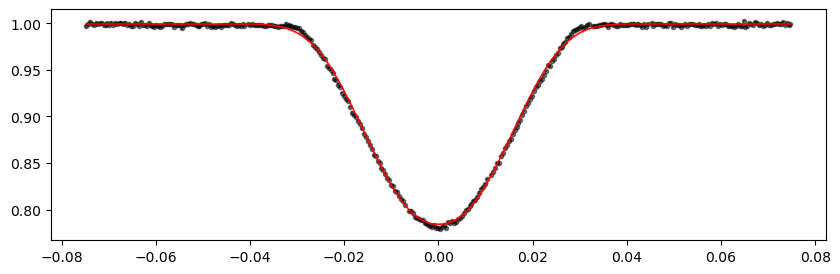

1964.6865160000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.26it/s]


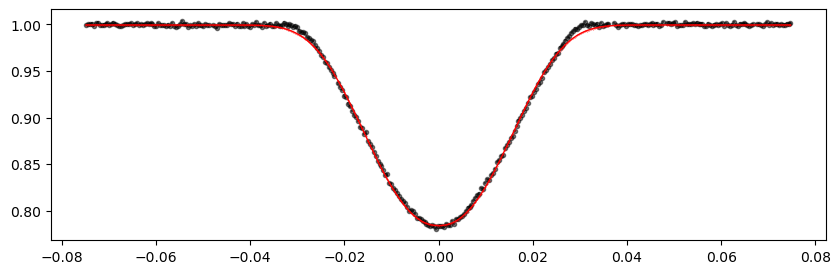

1968.02834 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.76it/s]


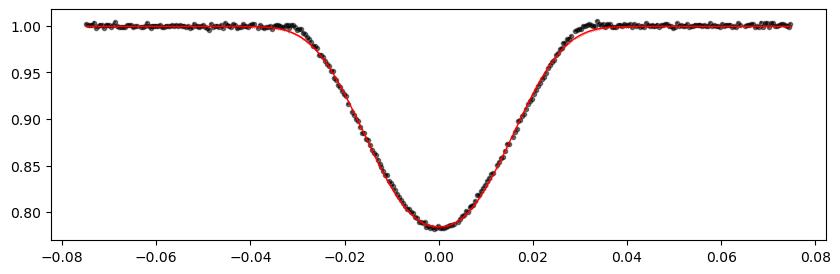

1974.711988 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.46it/s]


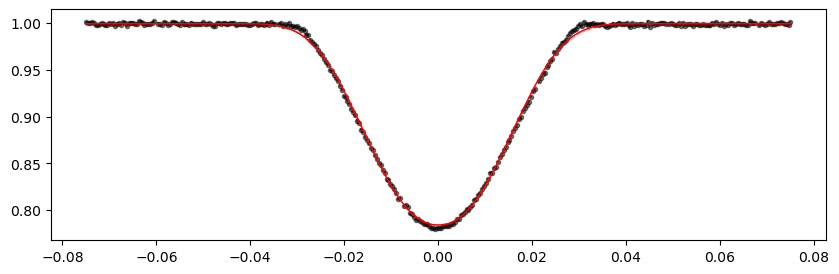

1978.053812 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.17it/s]


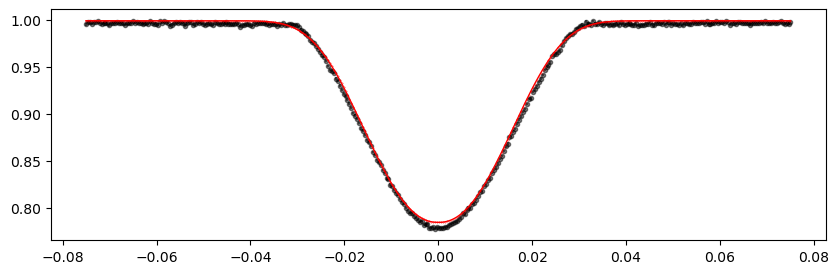

1981.3956360000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.08it/s]


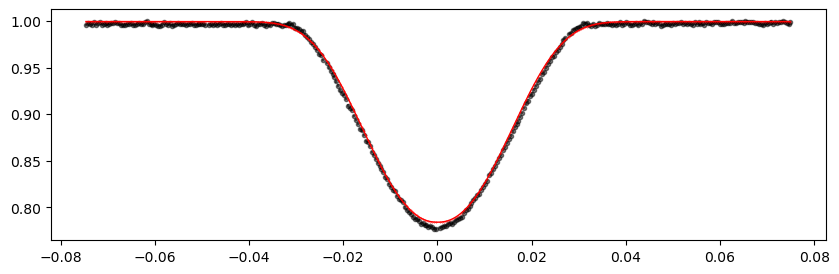

1988.0792840000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.89it/s]


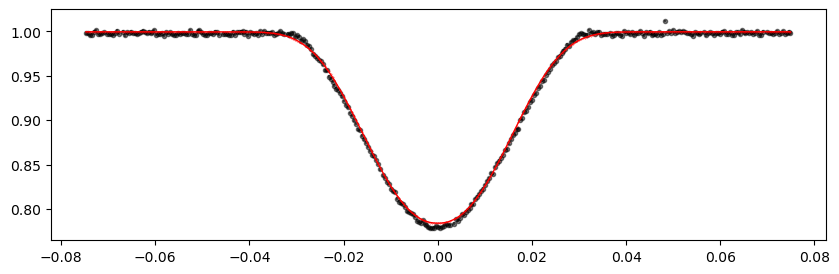

1991.421108 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.99it/s]


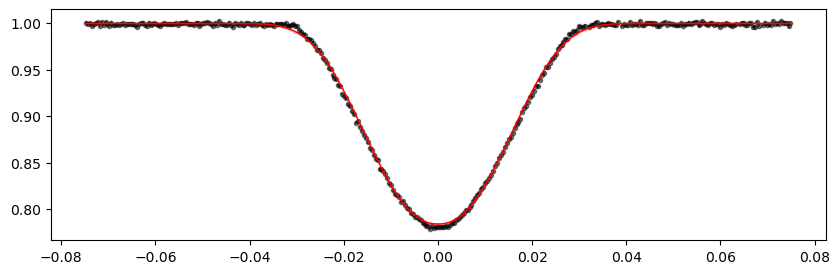

1994.762932 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.74it/s]


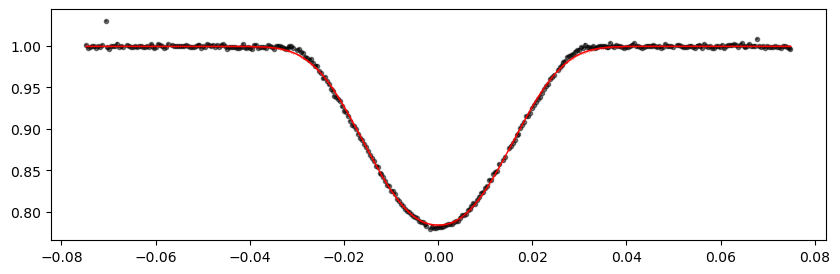

2001.44658 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.42it/s]


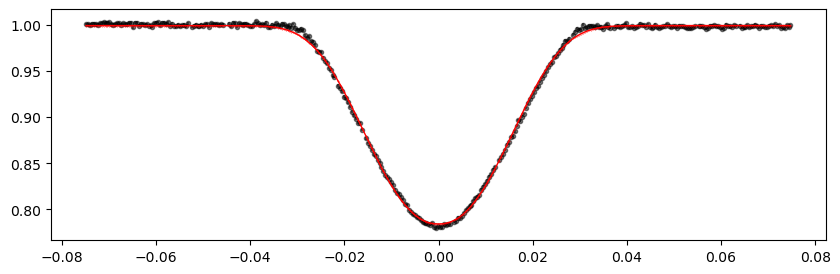

2004.7884040000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.65it/s]


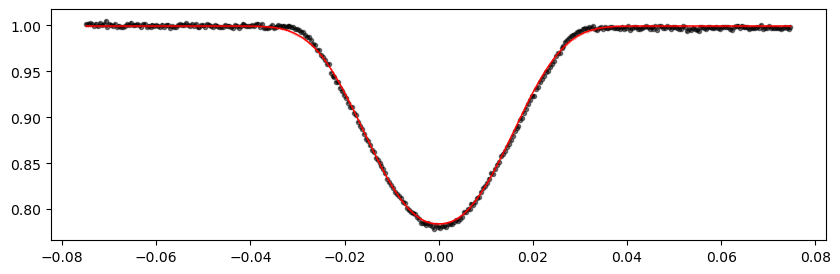

2008.130228 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.48it/s]


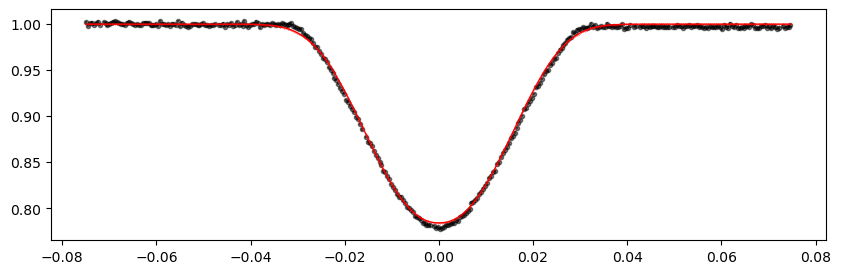

2011.472052 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.76it/s]


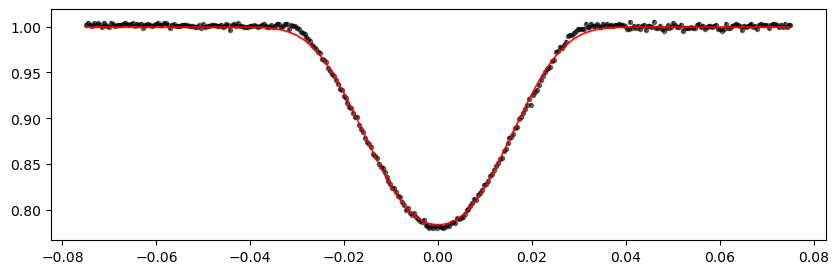

2014.8138760000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.63it/s]


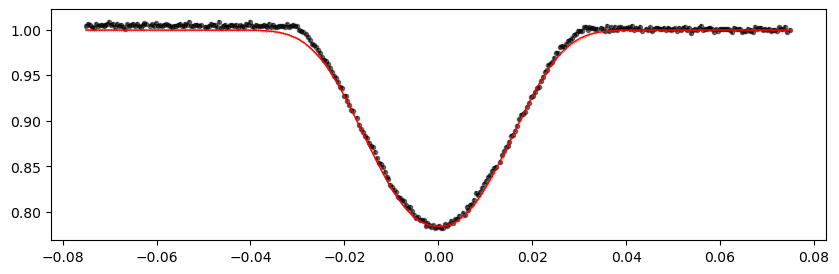

2018.1557 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1330.10it/s]


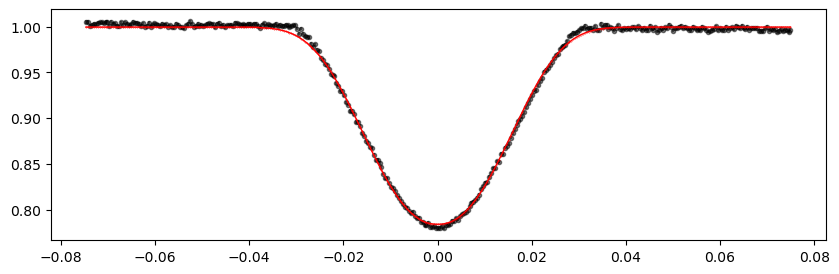

2021.497524 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.56it/s]


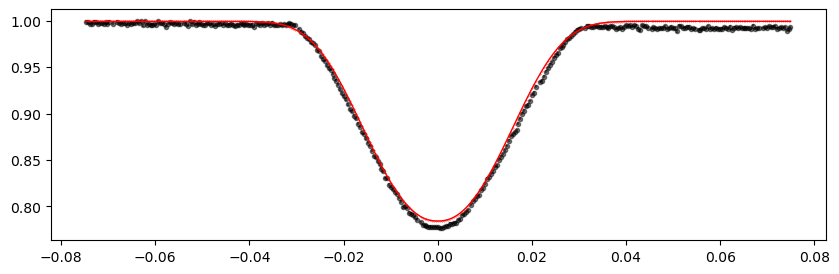

2024.839348 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.76it/s]


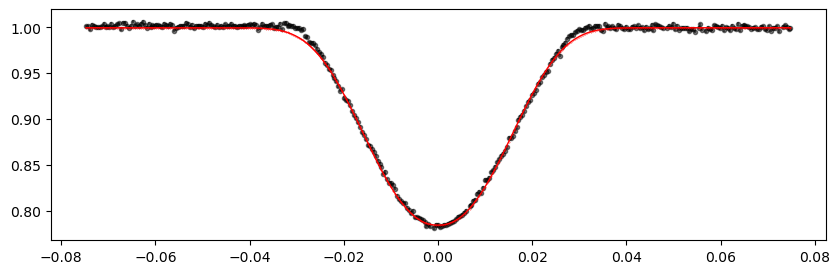

2028.181172 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.69it/s]


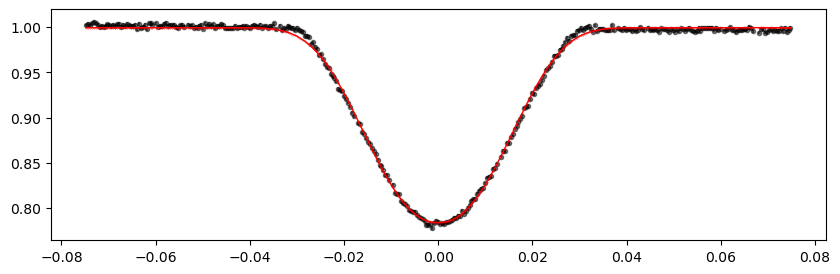

2031.5229960000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.93it/s]


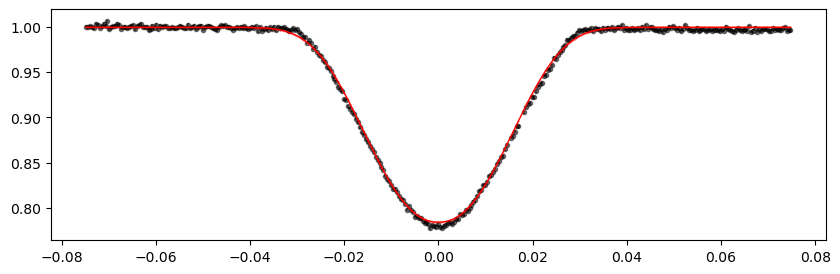

2034.8648200000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.75it/s]


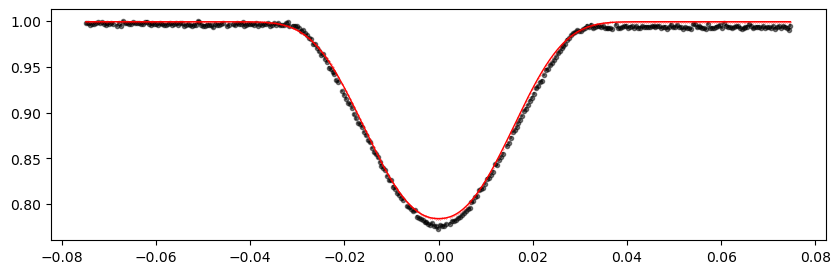

2392.439988 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.06it/s]


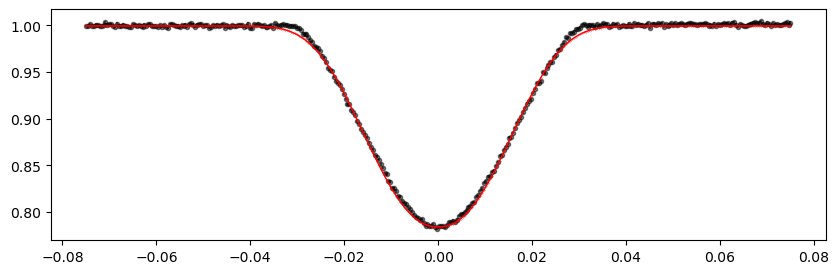

2395.781812 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.88it/s]


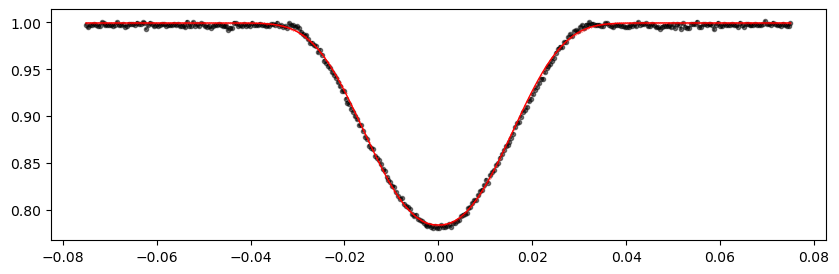

2399.1236360000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.82it/s]


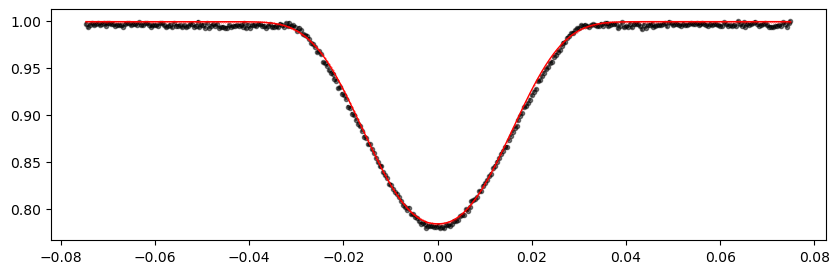

2402.4654600000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.68it/s]


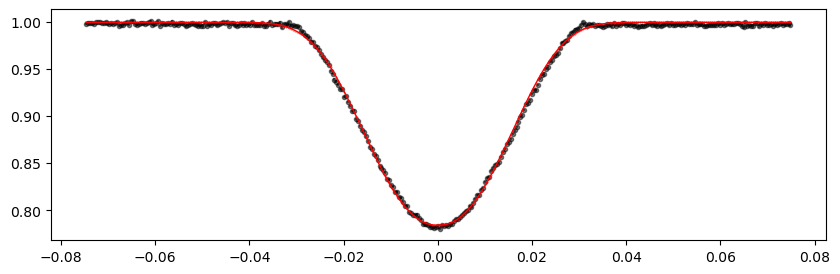

2405.807284 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.79it/s]


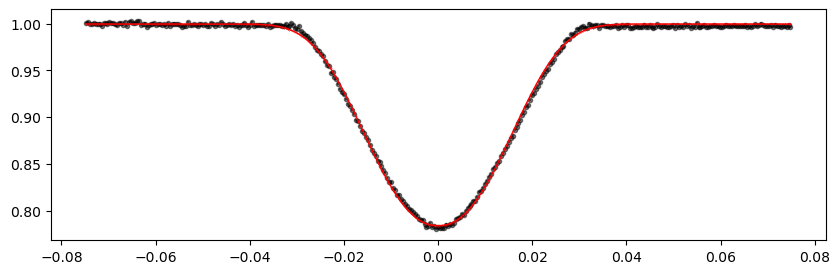

2409.149108 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1384.83it/s]


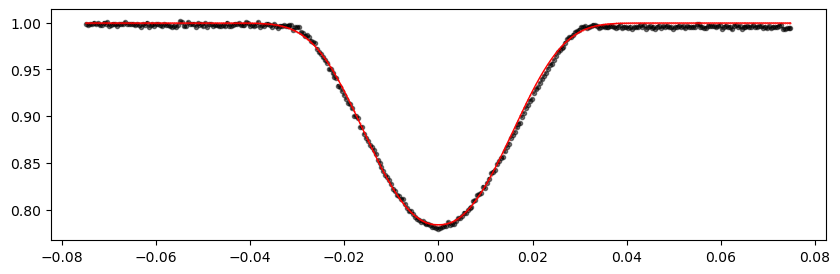

2412.490932 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.67it/s]


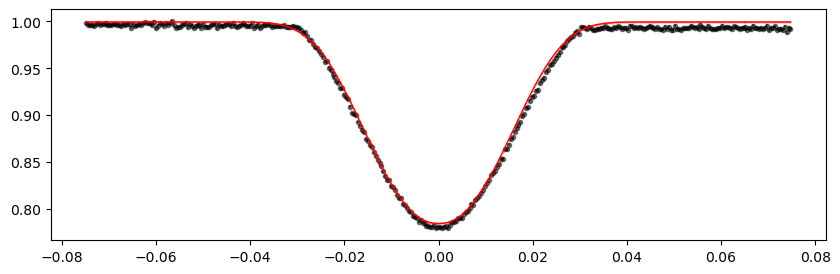

2415.8327560000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1373.87it/s]


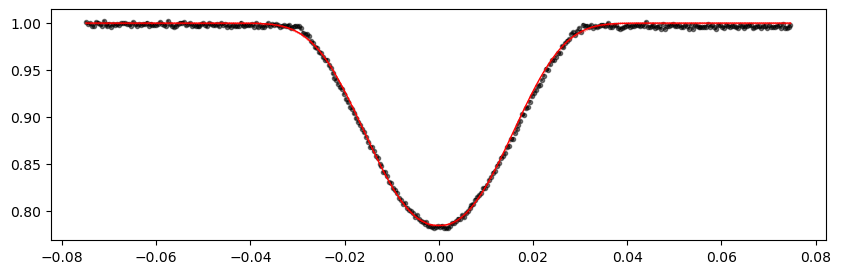

2422.516404 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.85it/s]


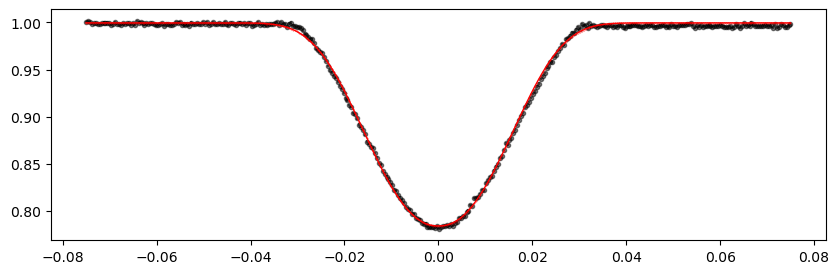

2425.858228 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.55it/s]


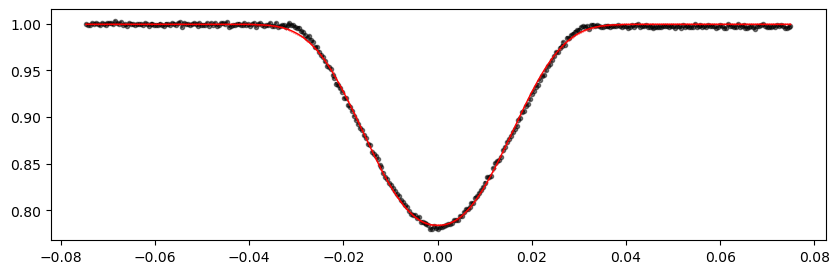

2429.200052 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.58it/s]


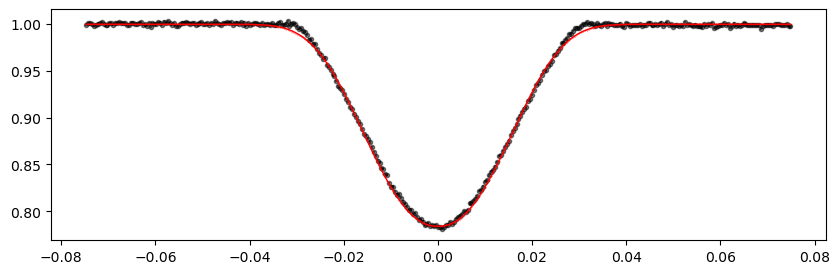

2432.5418760000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.86it/s]


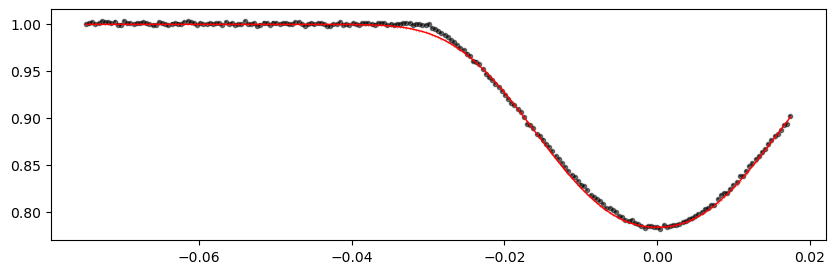

2435.8837000000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.79it/s]


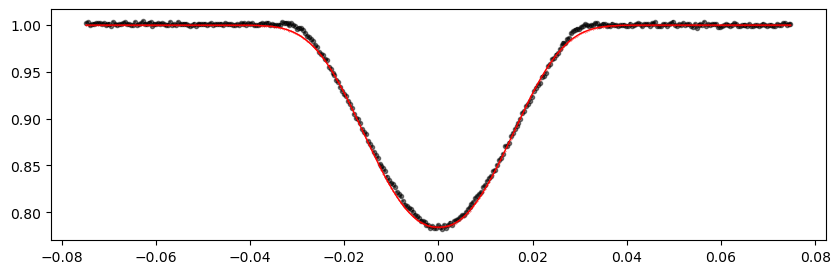

2439.225524 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.01it/s]


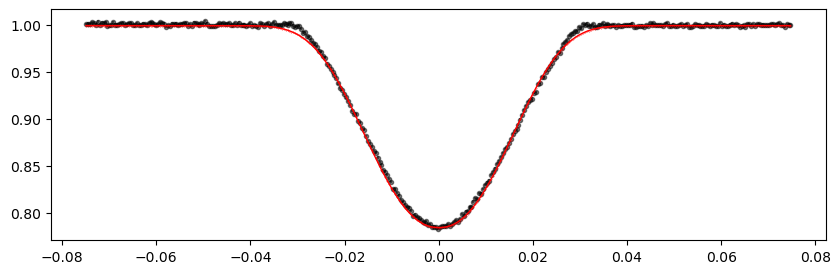

2442.567348 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.91it/s]


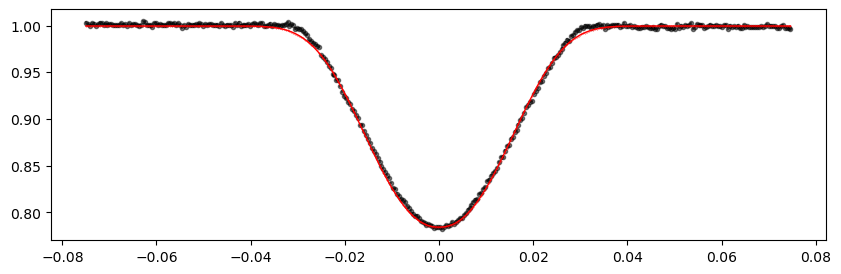

2445.909172 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.07it/s]


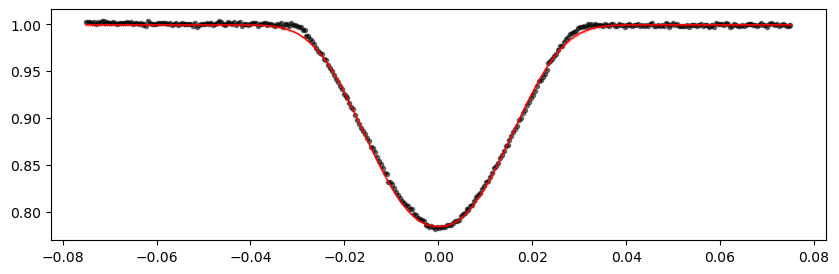

2582.923956 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.64it/s]


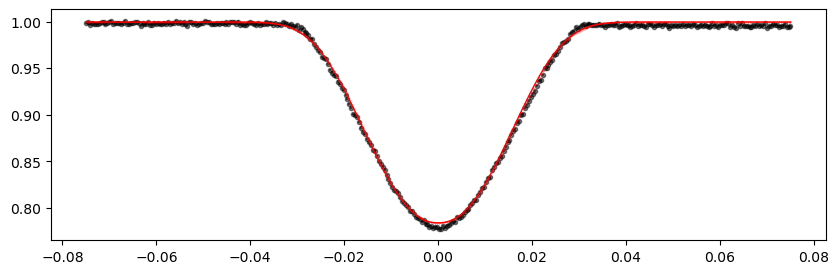

2586.26578 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1374.19it/s]


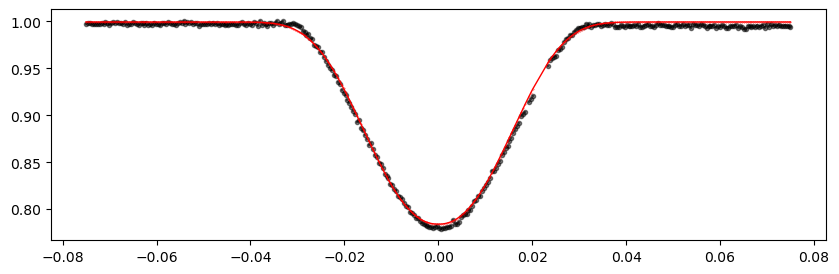

2589.607604 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.91it/s]


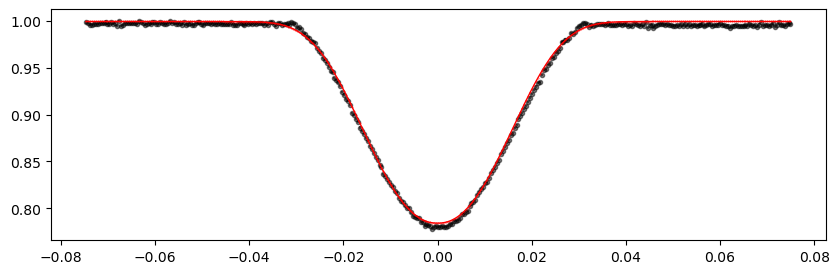

2592.949428 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.52it/s]


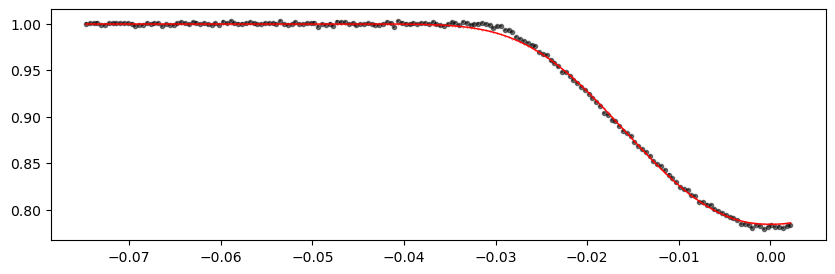

2596.291252 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.04it/s]


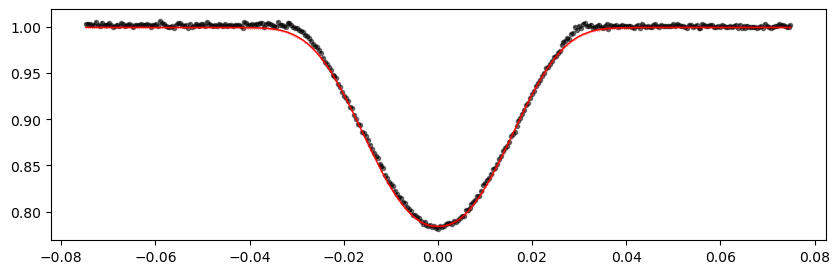

2599.633076 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.78it/s]


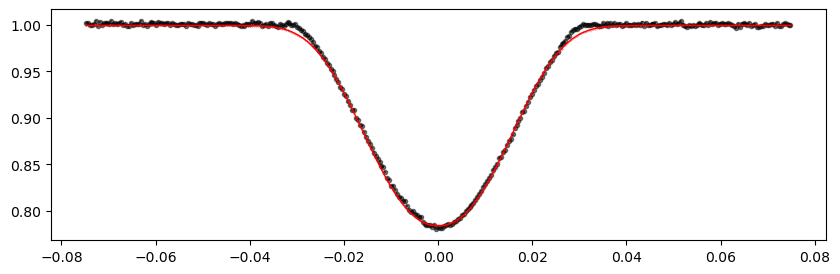

2602.9749 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1381.73it/s]


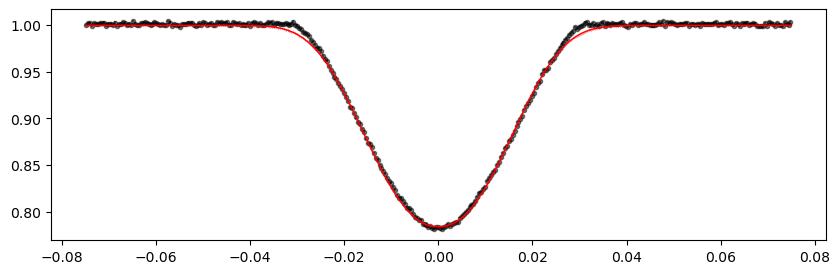

2606.3167240000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.86it/s]


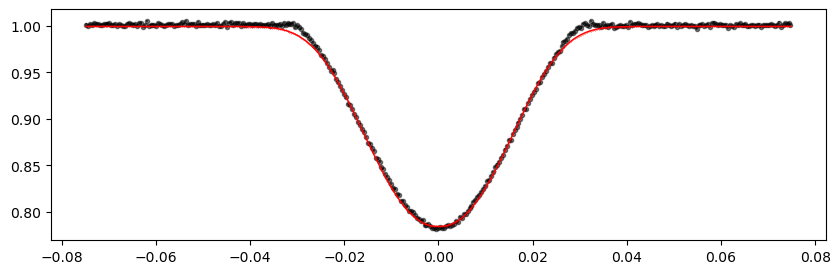

2613.000372 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.95it/s]


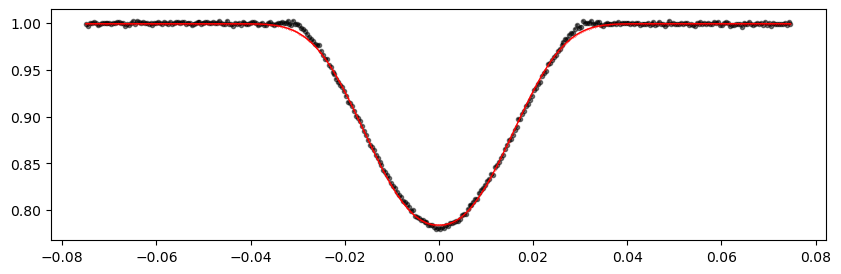

2616.342196 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.77it/s]


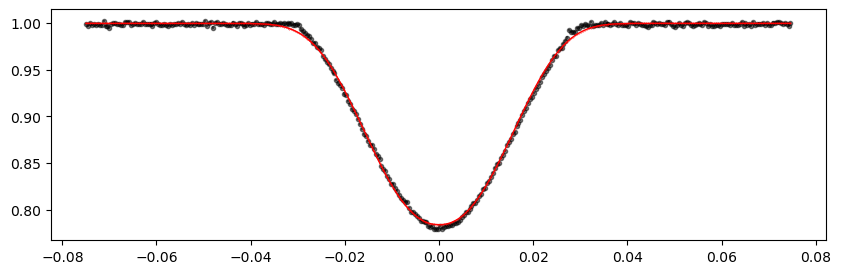

2619.68402 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.60it/s]


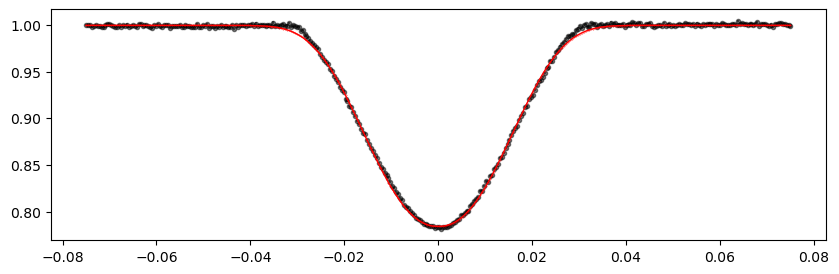

2626.367668 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.80it/s]


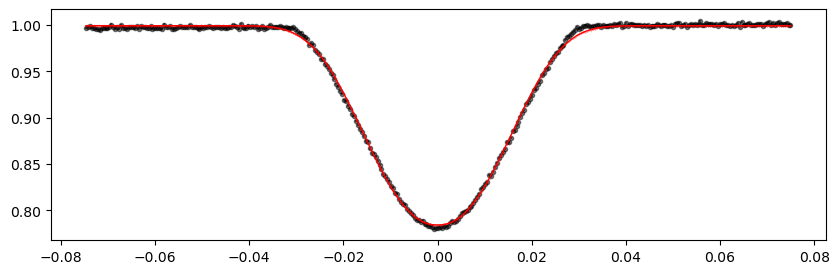

2629.709492 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.76it/s]


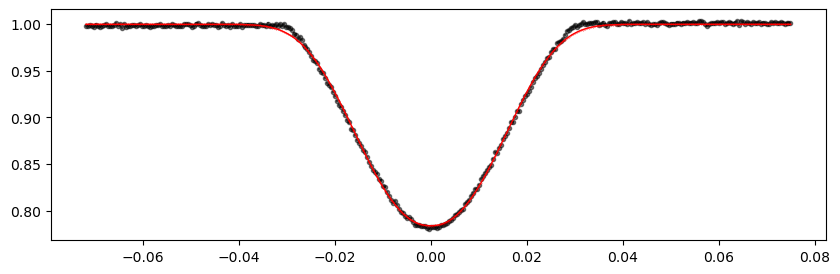

2633.051316 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.65it/s]


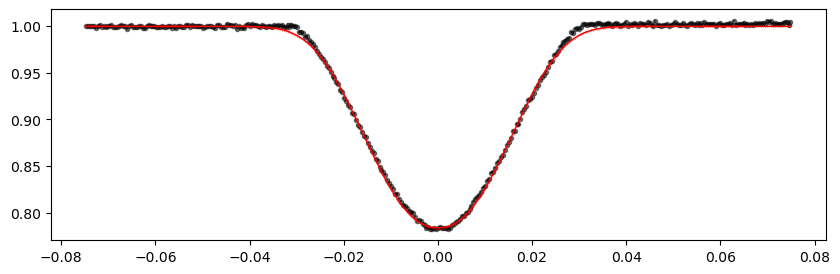

2643.0767880000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.13it/s]


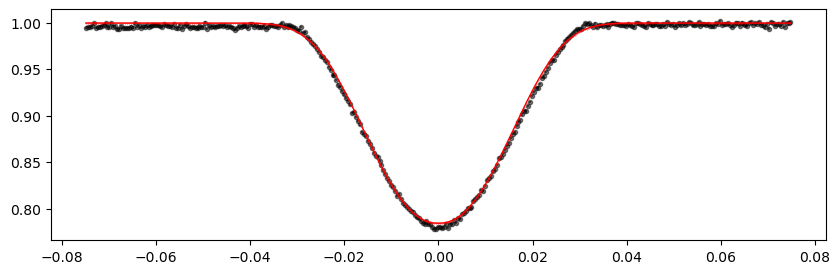

2646.418612 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.93it/s]


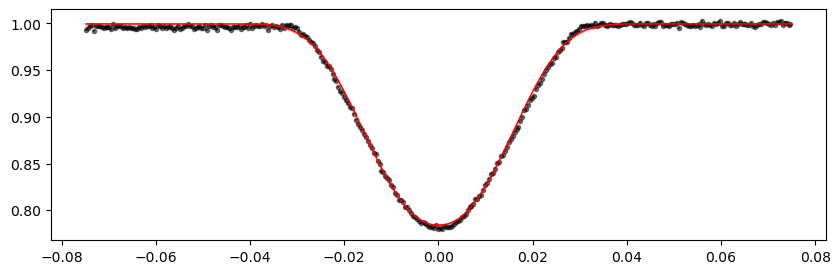

2649.760436 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.71it/s]


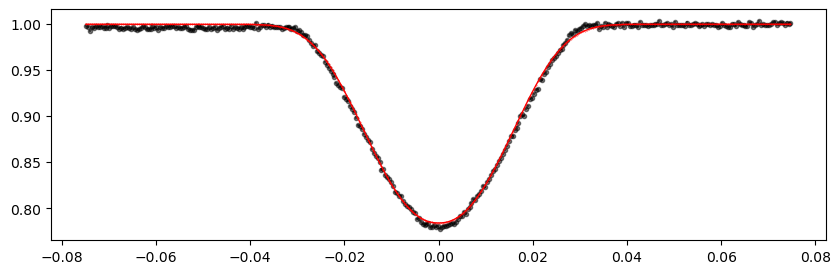

2656.444084 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.01it/s]


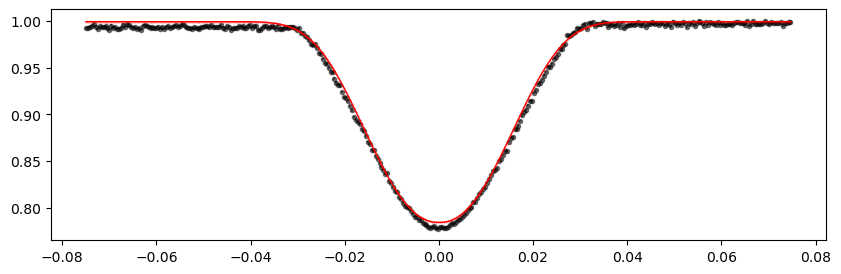

2659.785908 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1378.17it/s]


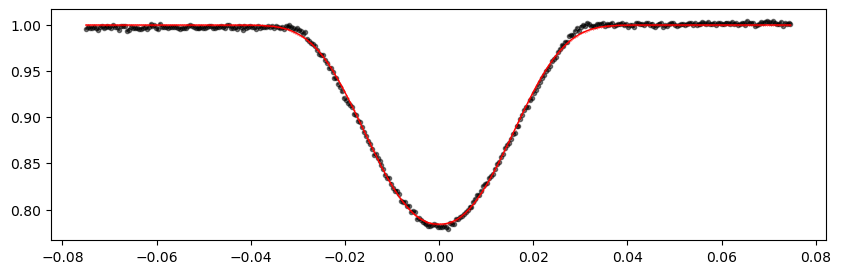

2663.127732 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.25it/s]


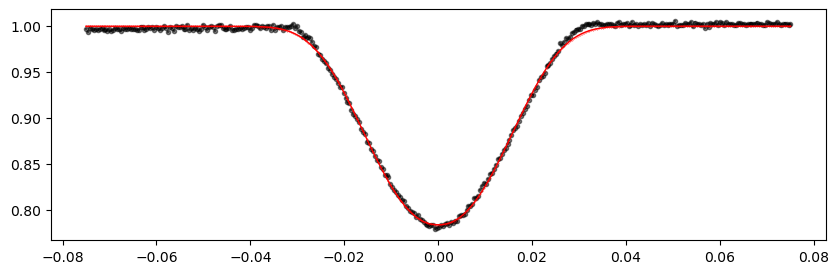

2669.81138 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.79it/s]


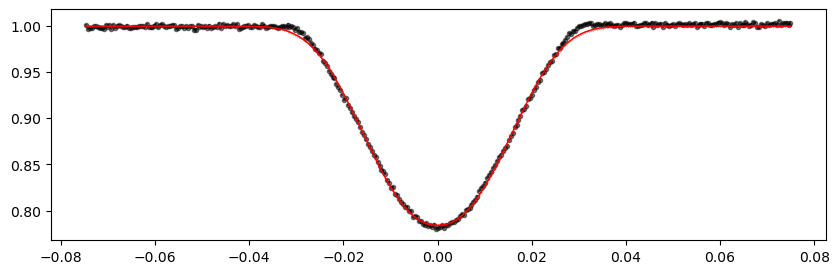

2673.153204 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.21it/s]


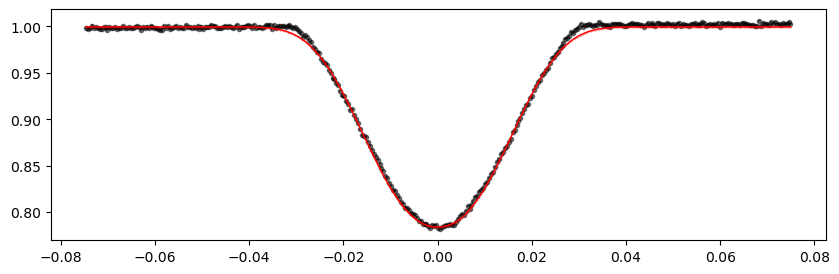

2676.4950280000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.20it/s]


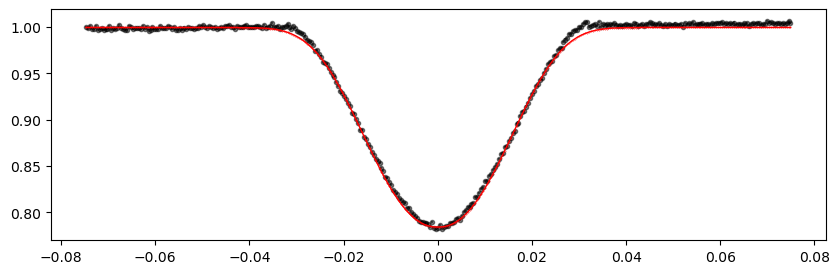

2683.178676 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1389.73it/s]


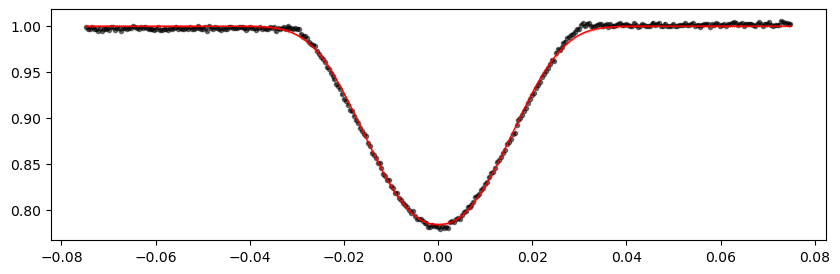

2686.5205 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.74it/s]


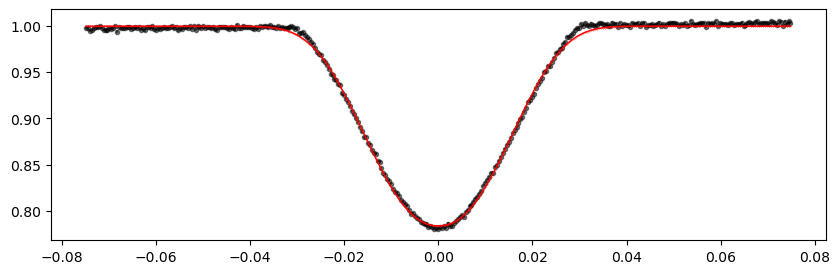

2689.862324 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.60it/s]


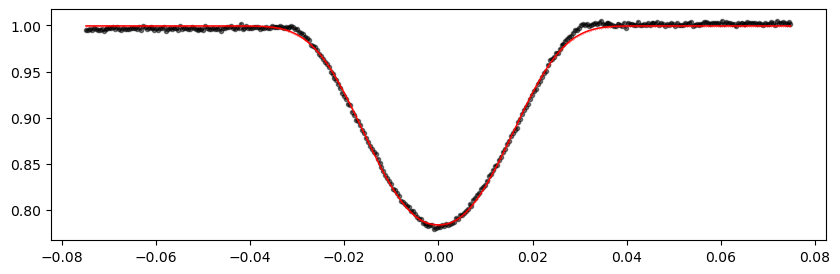

2696.545972 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.75it/s]


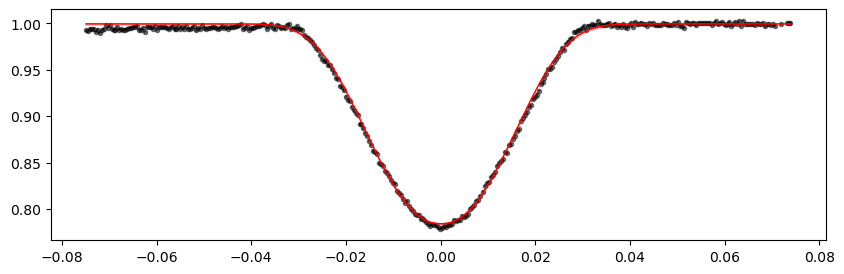

2699.887796 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.63it/s]


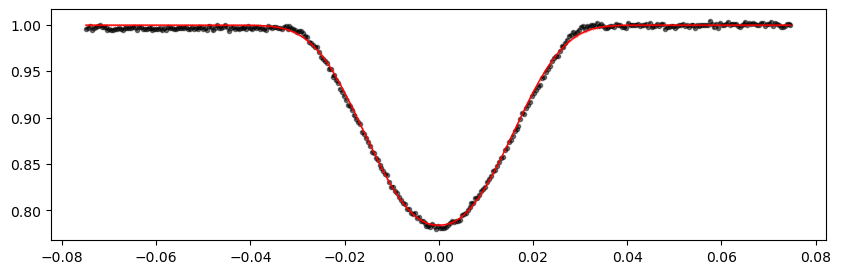

2703.22962 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.87it/s]


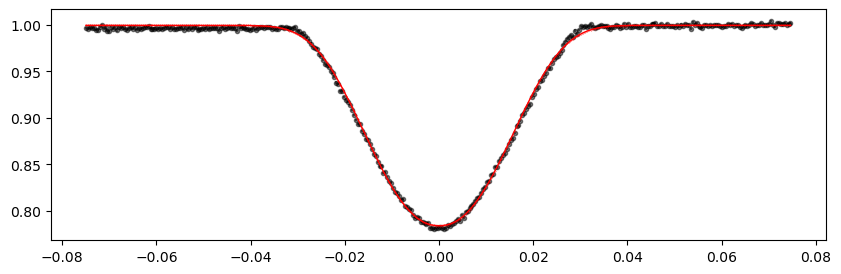

2709.9132680000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.74it/s]


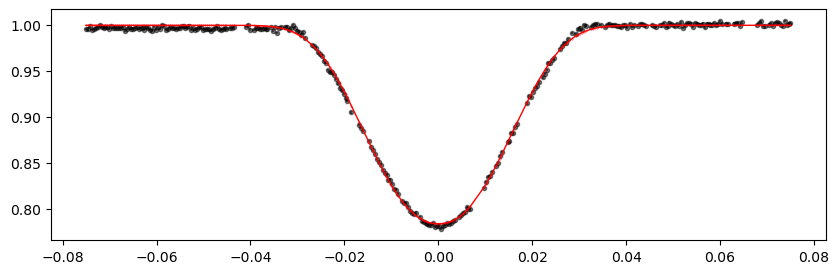

2713.2550920000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1370.98it/s]


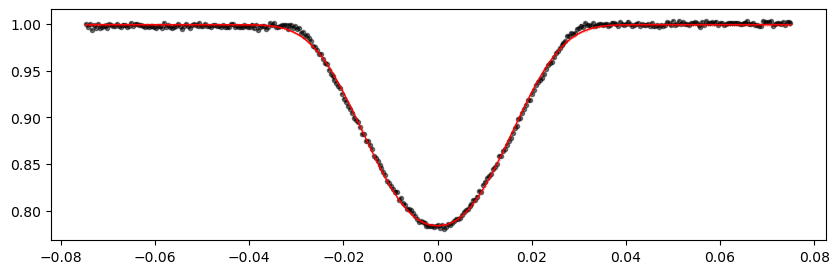

2716.5969160000004 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.94it/s]


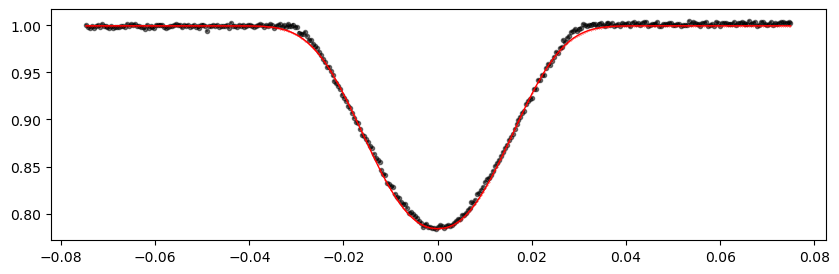

2719.93874 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.15it/s]


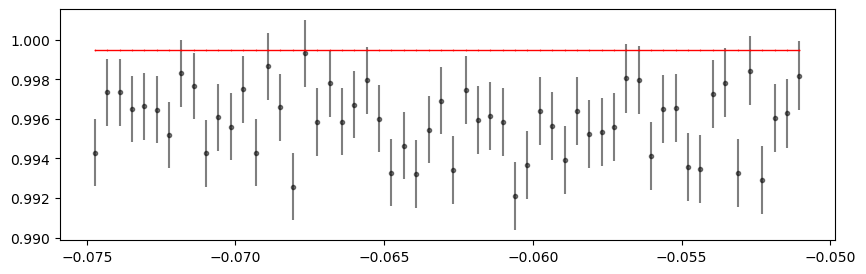

2723.280564 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1378.53it/s]


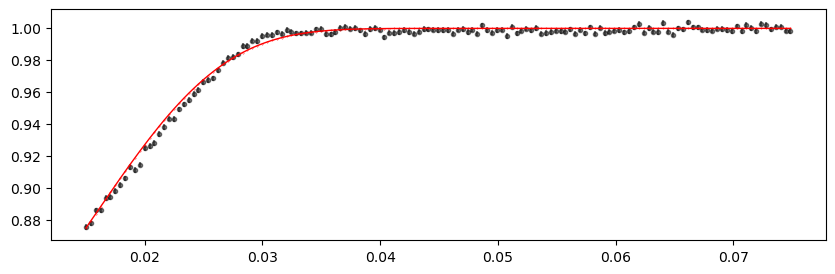

2726.622388 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1378.55it/s]


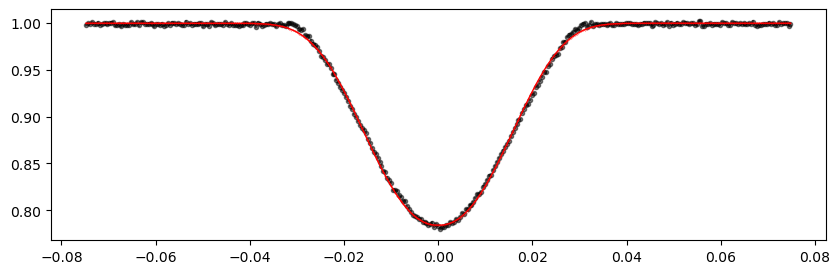

2729.964212 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.72it/s]


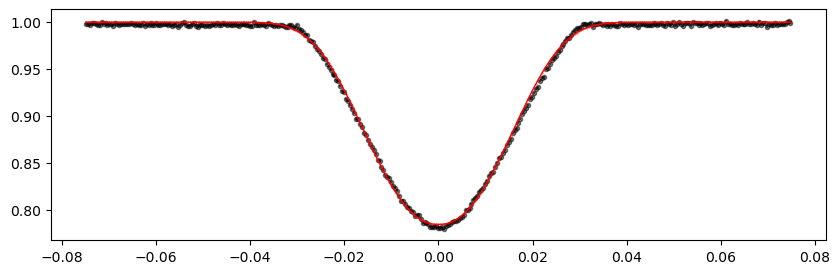

2736.64786 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.36it/s]


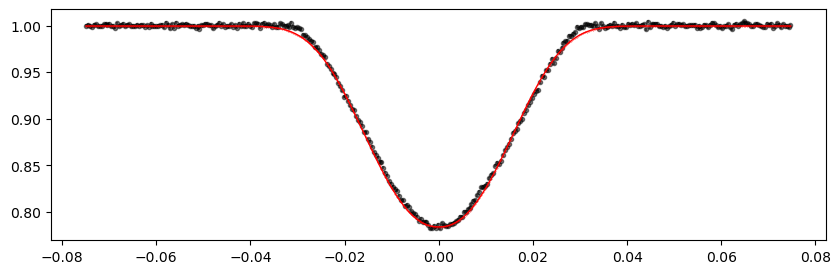

2739.989684 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.09it/s]


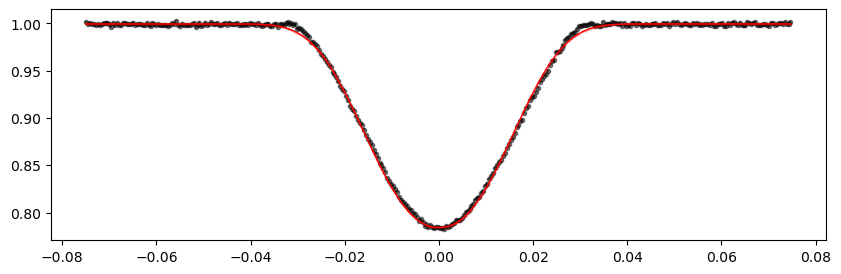

2770.0661 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.28it/s]


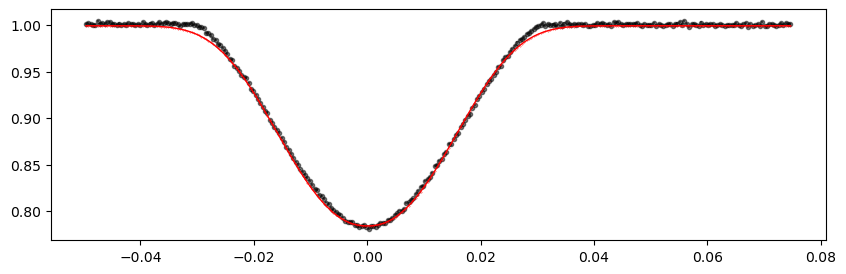

2773.407924 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.02it/s]


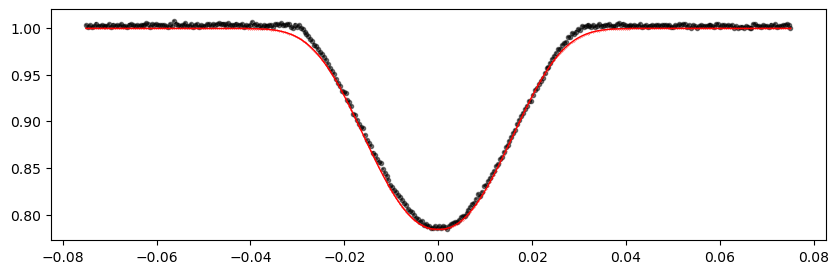

2776.749748 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.88it/s]


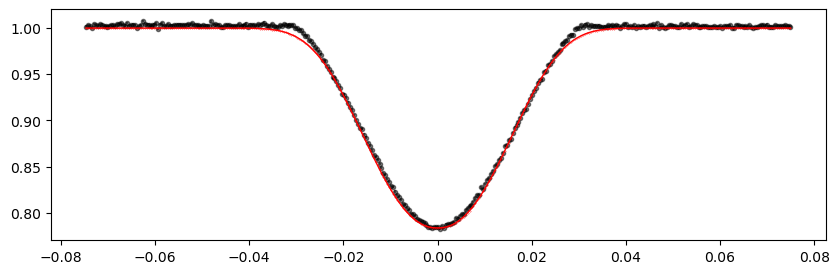

2780.0915720000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1387.68it/s]


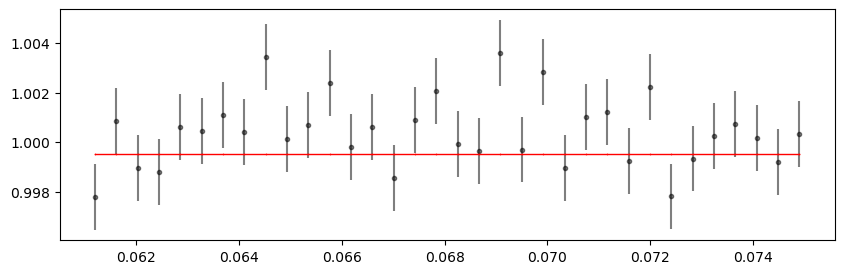

2783.4333960000004 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1379.54it/s]


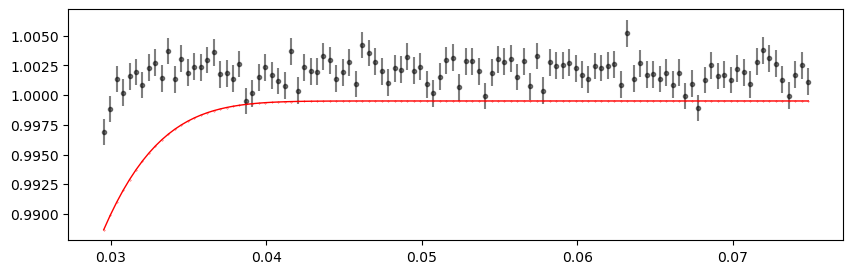

2786.77522 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.58it/s]


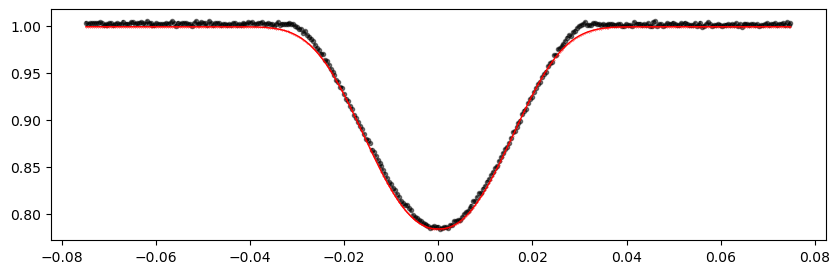

2790.117044 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.91it/s]


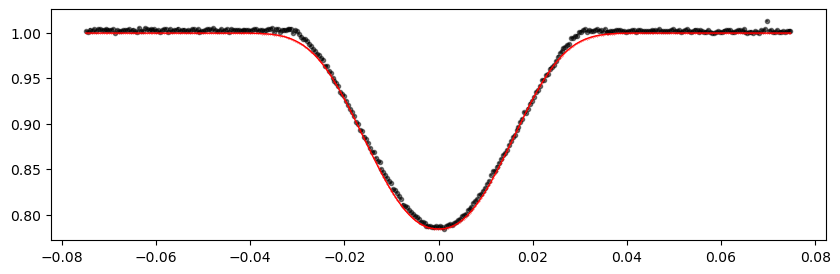

2793.458868 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.72it/s]


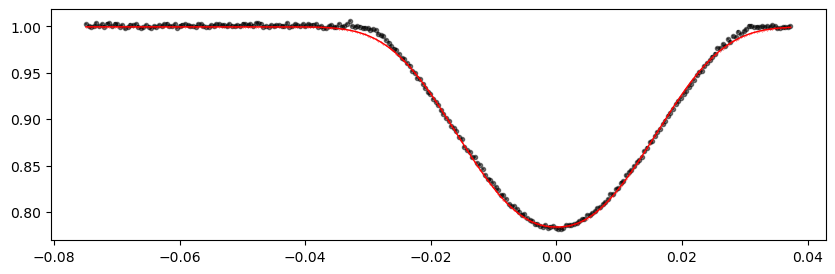

2800.142516 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1377.12it/s]


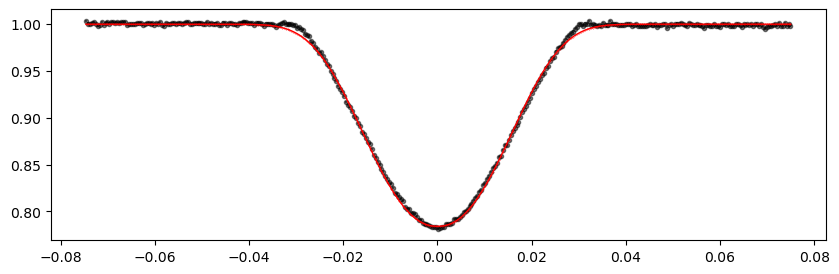

2803.48434 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.69it/s]


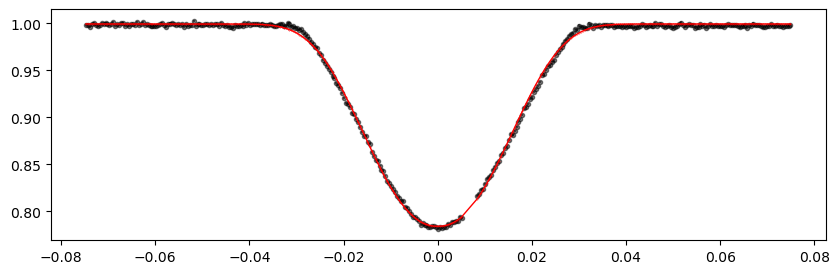

2806.826164 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.69it/s]


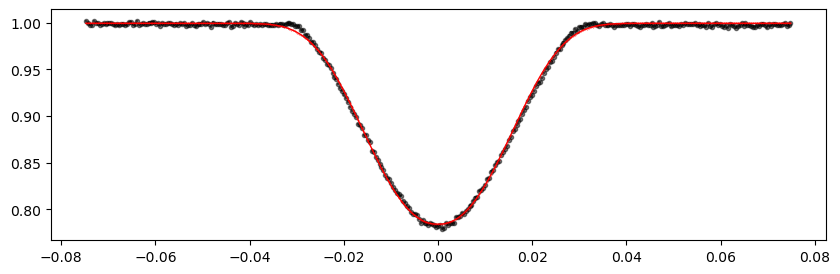

2810.167988 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.57it/s]


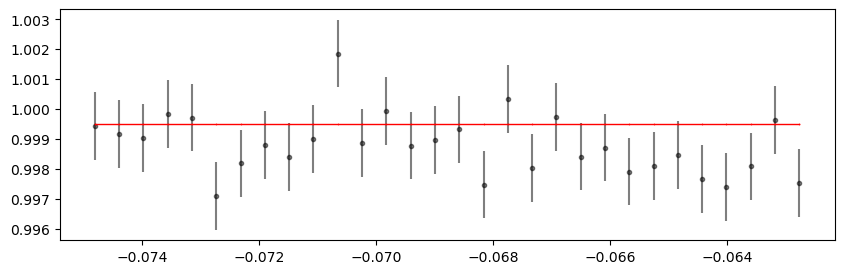

2813.5098120000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.72it/s]


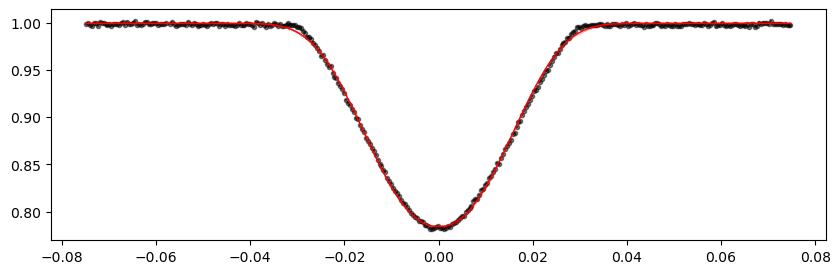

2816.8516360000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1371.52it/s]


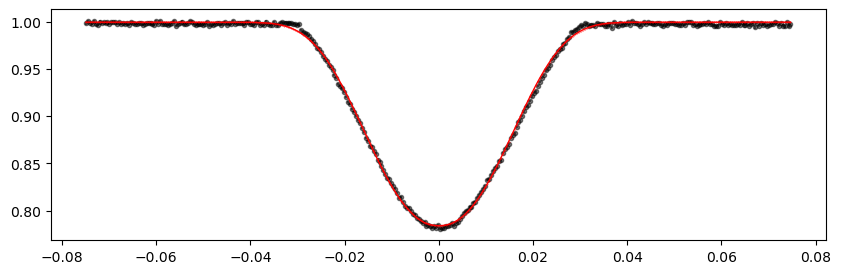

2820.1934600000004 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.09it/s]


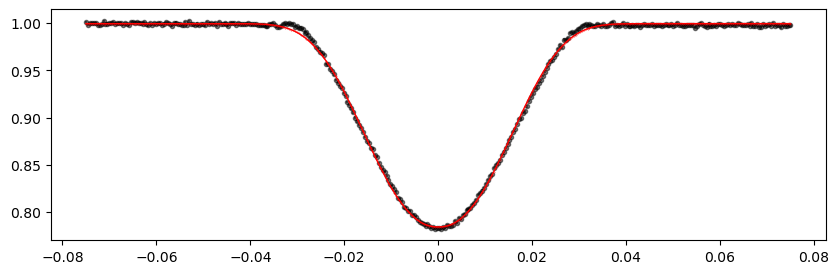

2823.535284 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.02it/s]


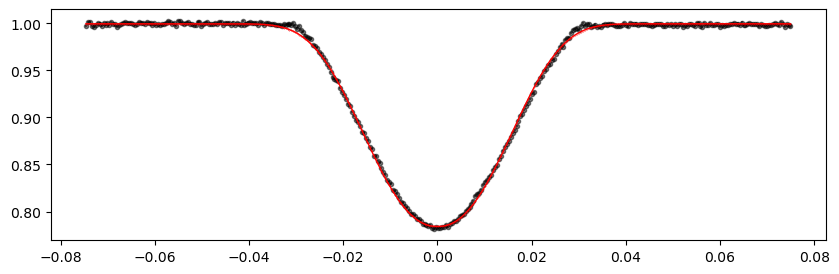

2826.877108 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.43it/s]


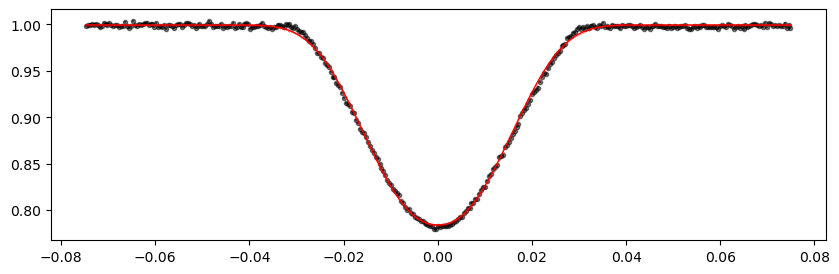

2830.2189319999998 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.39it/s]


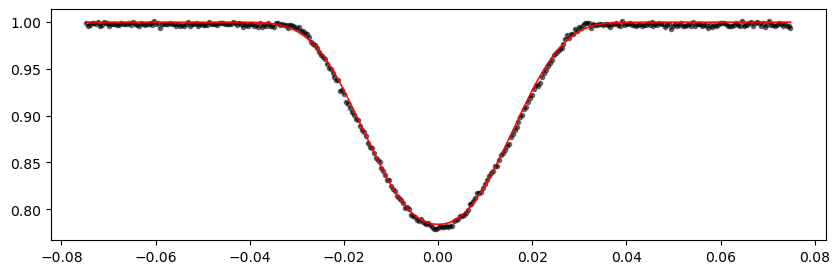

2833.560756 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.16it/s]


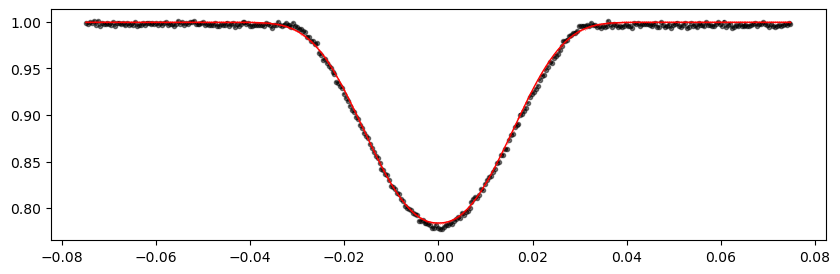

2836.90258 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.92it/s]


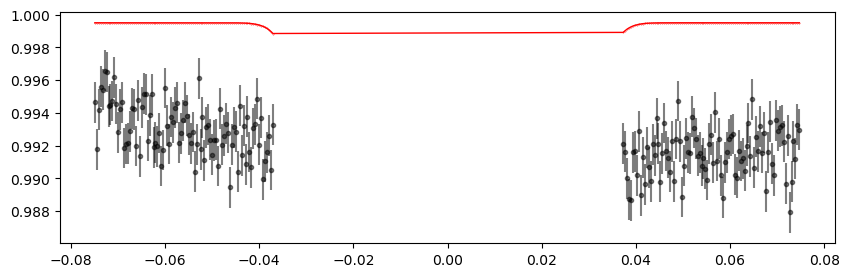

2840.244404 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1390.72it/s]


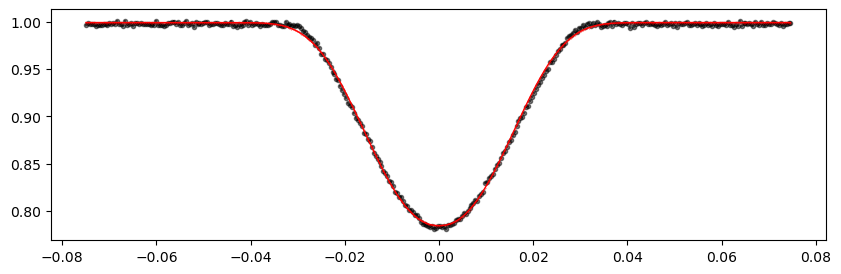

2843.586228 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1384.69it/s]


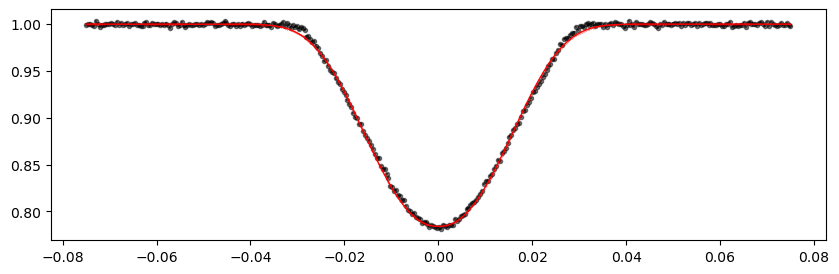

2846.928052 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.69it/s]


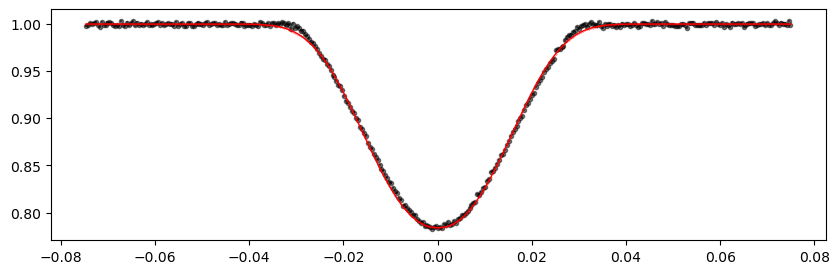

2850.2698760000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.48it/s]


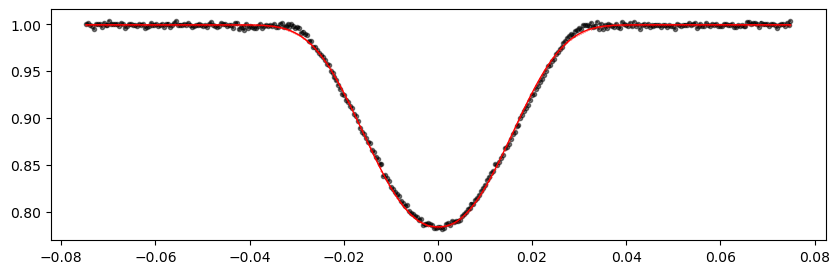

2853.6117000000004 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1370.92it/s]


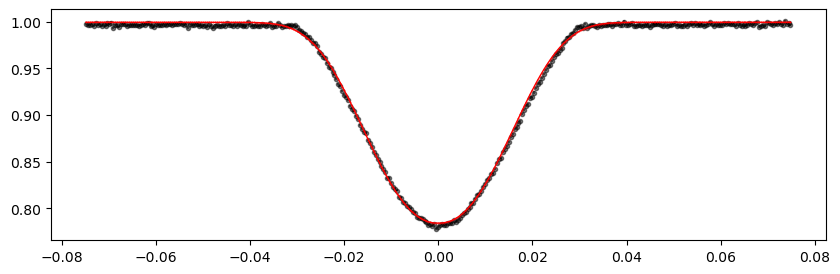

2856.953524 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.59it/s]


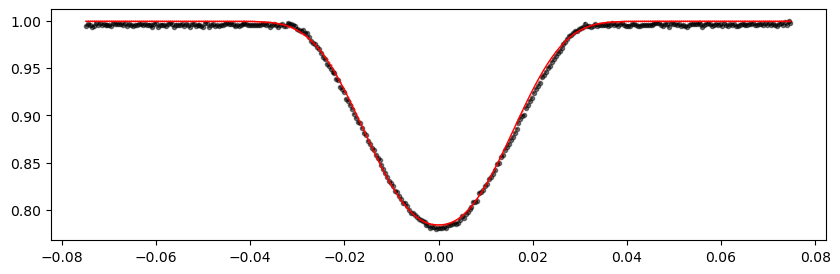

2860.295348 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.02it/s]


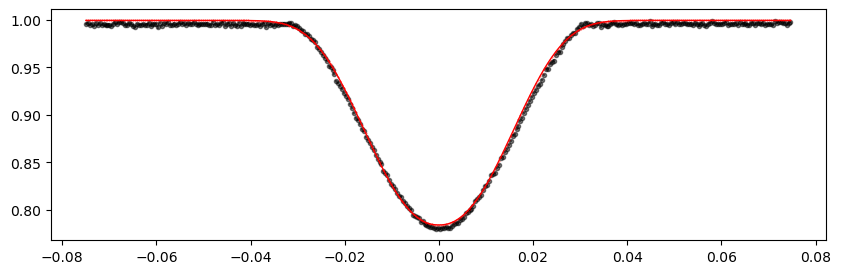

2866.978996 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.73it/s]


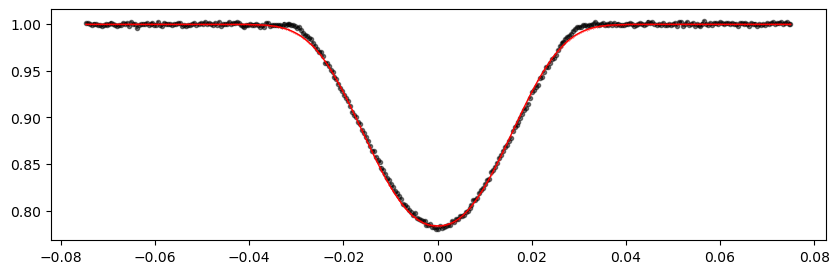

2870.32082 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.94it/s]


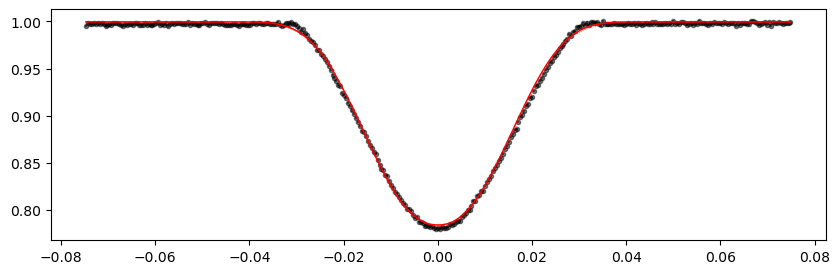

2873.662644 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.61it/s]


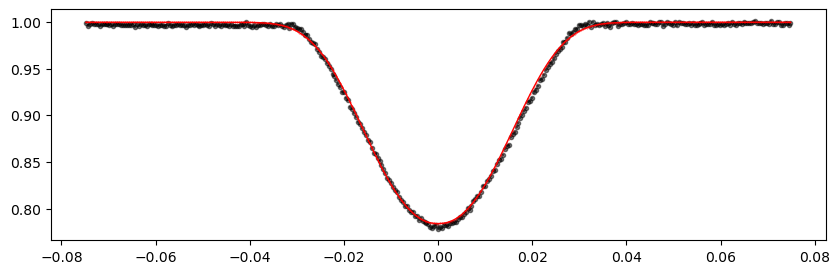

2877.004468 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.16it/s]


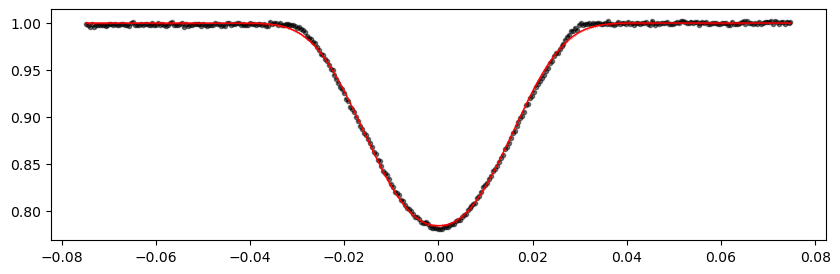

2880.346292 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.64it/s]


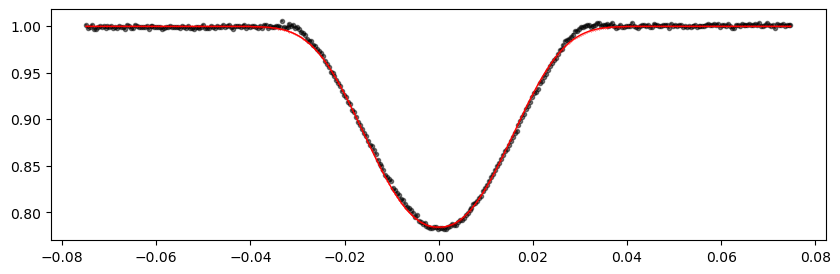

2883.6881160000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.55it/s]


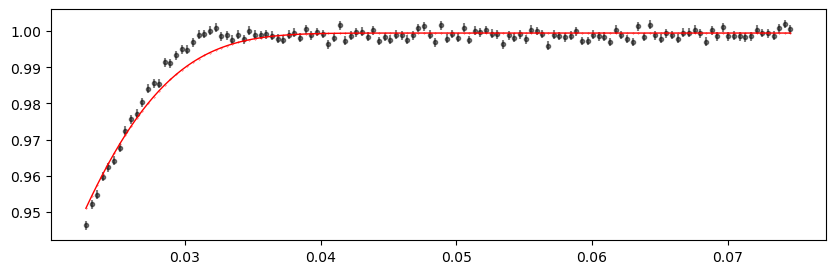

2887.0299400000004 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.51it/s]


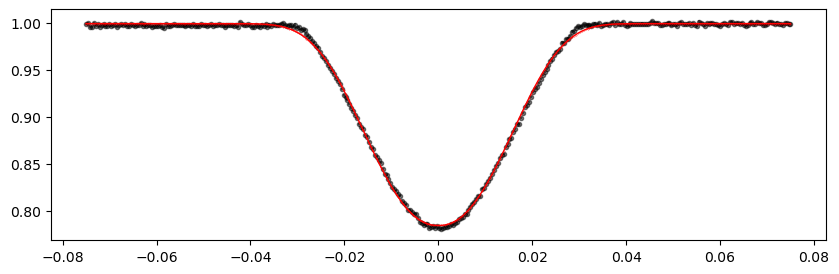

2890.371764 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.47it/s]


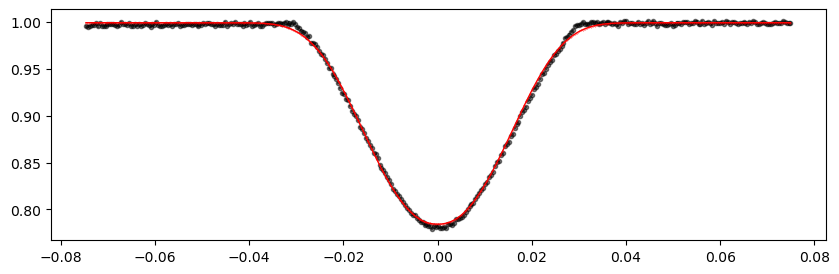

2893.713588 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.66it/s]


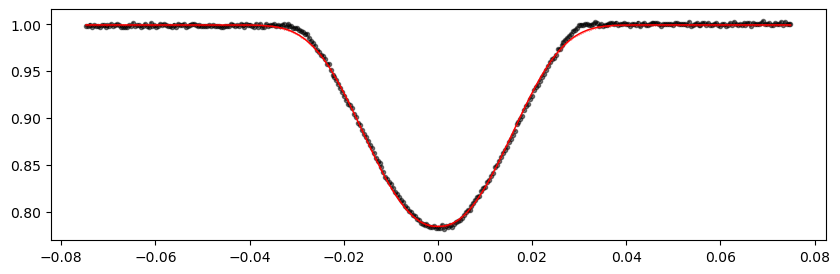

2900.397236 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.58it/s]


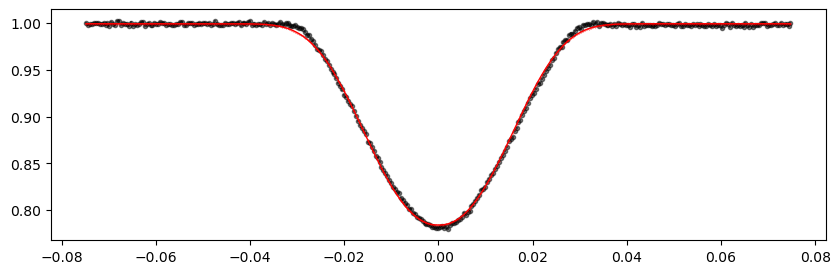

2903.73906 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1381.59it/s]


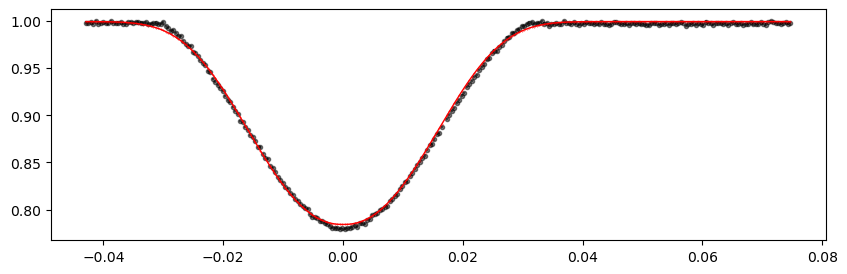

2907.080884 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.62it/s]


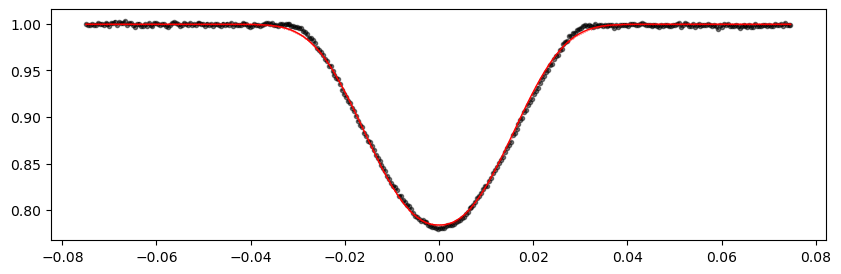

2913.764532 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.82it/s]


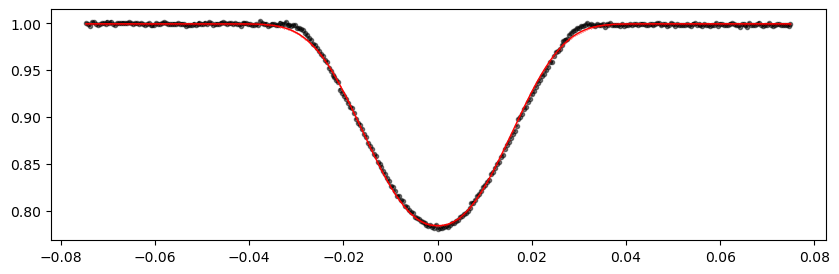

2917.1063560000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.53it/s]


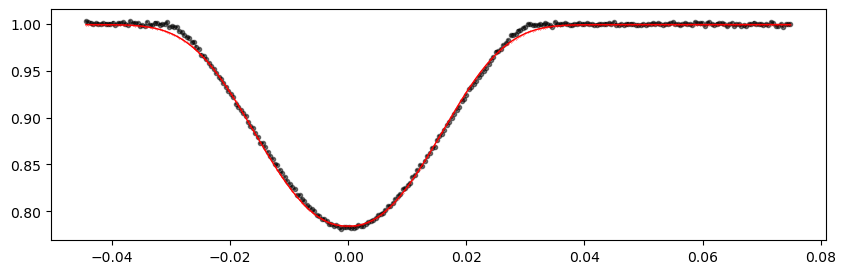

2920.4481800000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.57it/s]


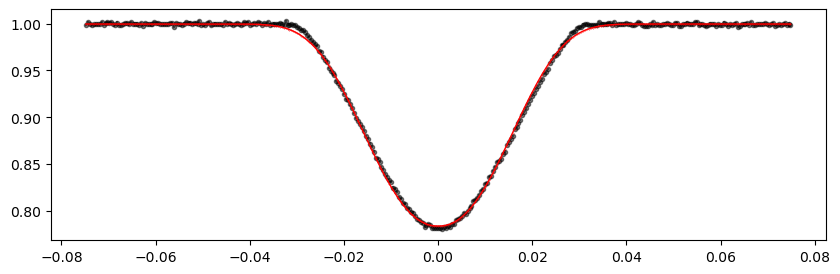

2927.131828 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.00it/s]


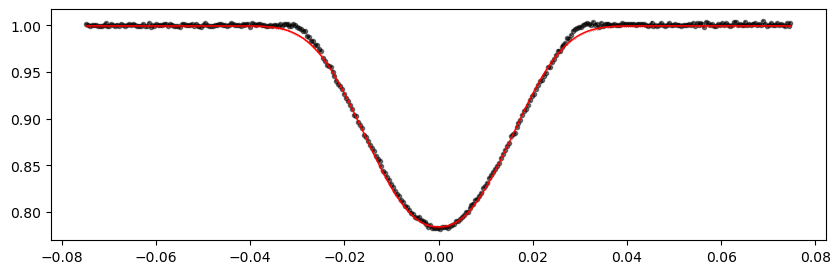

2930.473652 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.60it/s]


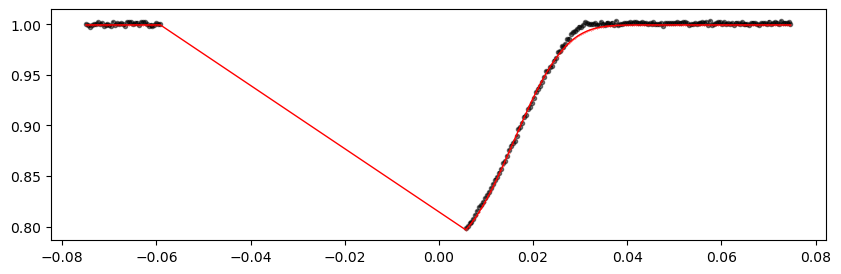

2933.8154759999998 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.86it/s]


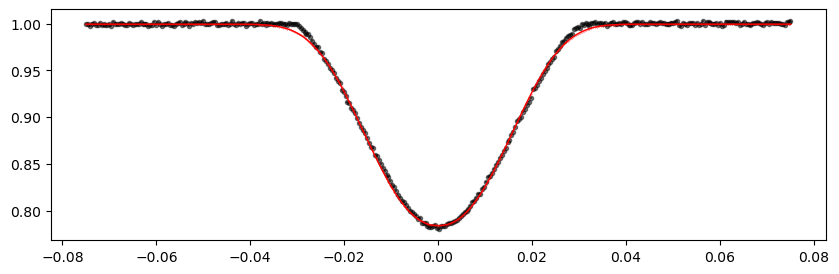

2940.499124 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.78it/s]


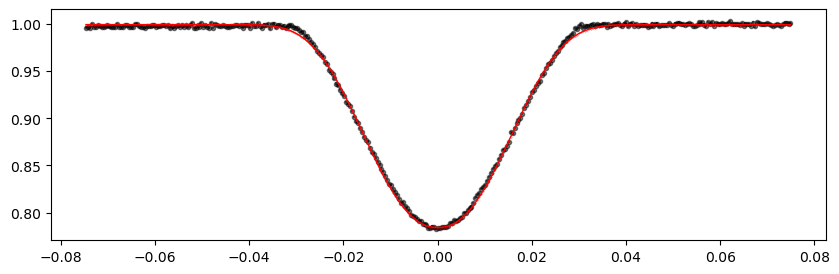

2943.840948 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.63it/s]


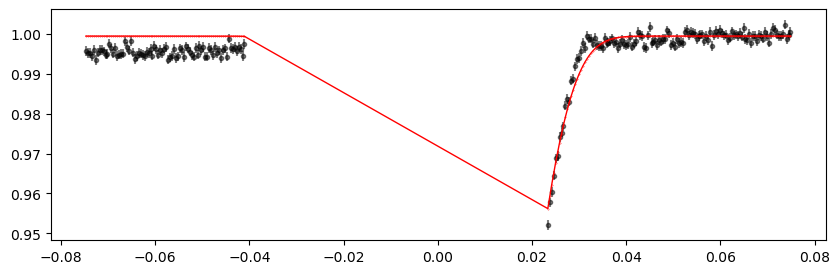

2947.182772 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.66it/s]


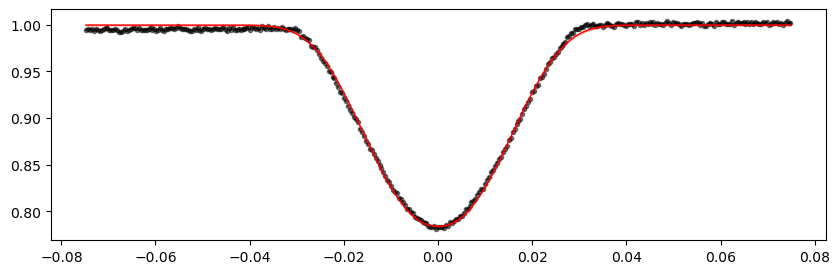

2957.2082440000004 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.77it/s]


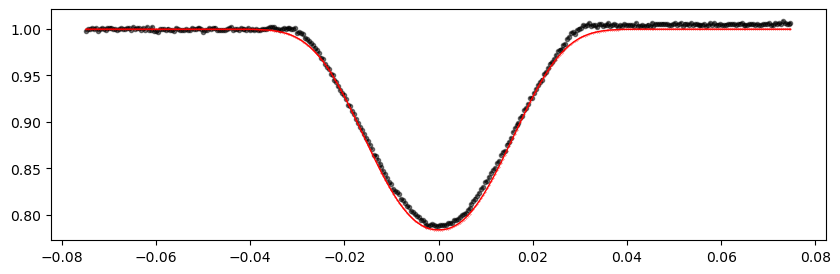

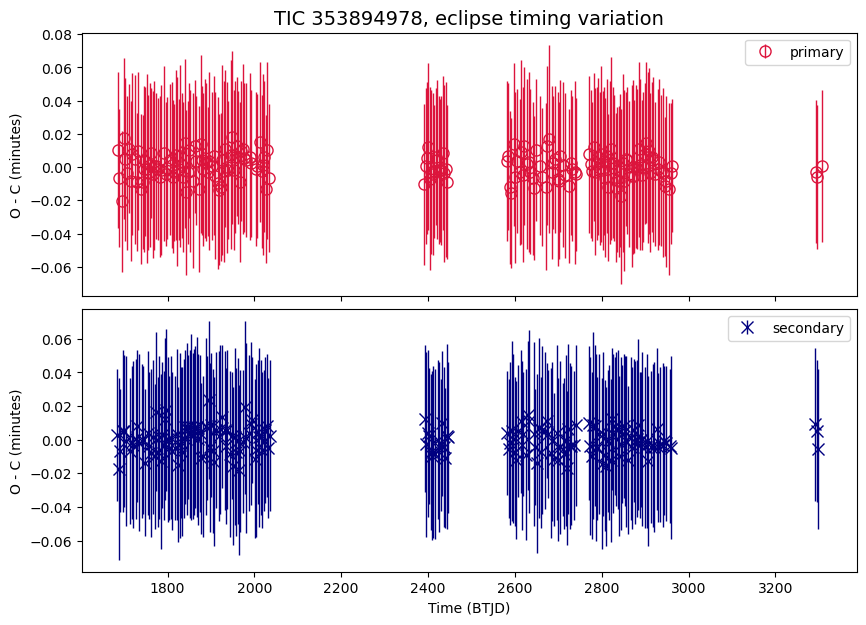

In [38]:
%matplotlib inline
# %matplotlib widget

#plot the extracted transit times to check for ETVs

fig, axs = plt.subplots(2, 1, figsize=(10, 7), sharex=True)

in_df_primary = pd.read_csv(outfile_path)
in_df_secondary = pd.read_csv(outfile_path_s)


in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60

in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60

# axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
#              marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
# axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
#              marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'], 
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")
axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'], 
             lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[1].set_xlabel("Time (BTJD)")
axs[0].set_title(f"TIC {ticid}, eclipse timing variation", fontsize=14)

plt.subplots_adjust(hspace=0.05)
plt.show()

### ETV based on TCE1 Period

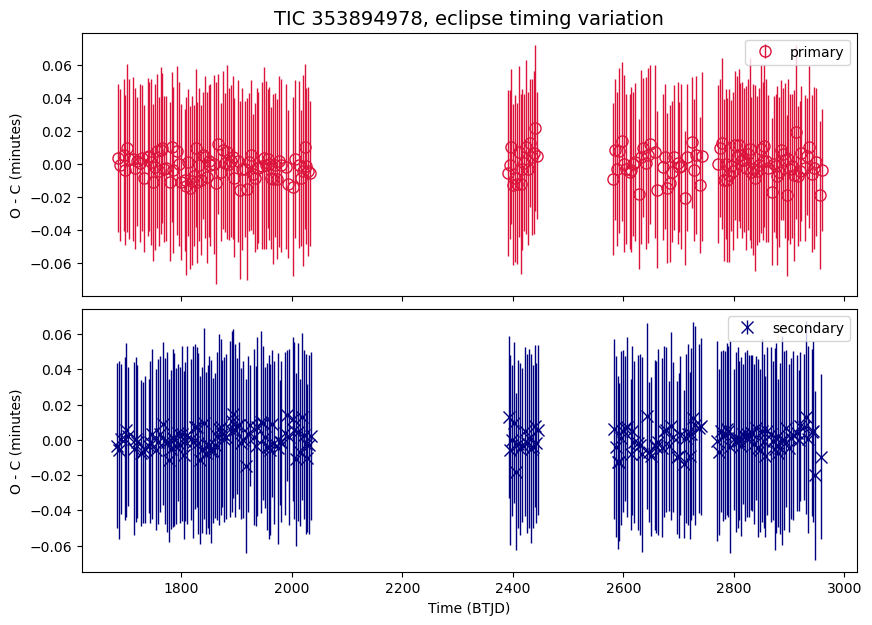


## make a periodogram 

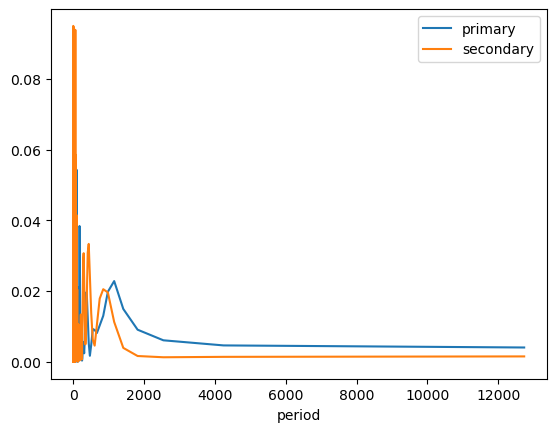

In [33]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()
frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()

fig, ax = plt.subplots()

plt.plot(1/frequency, power, label = 'primary')    
plt.plot(1/frequency_s, power_s, label = 'secondary')    

plt.xlabel("period")

plt.legend()
plt.show()

In [40]:
# FILL-IN the ETV results / comments
has_etv = "N"
comments = "VSX Period to SB Period ~ 1:3 but no ETV. No difference after using a refined period from MCMC fit."

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True, 
))

,0
tic,353894978
has_etv,N
comments,VSX Period to SB Period ~ 1:3 but no ETV. No difference after using a refined period from MCMC fit.
period,3.341826
depth_pct_p,21.64
depth_pct_s,21.53
epoch_p,1685.644213
epoch_s,1683.9733
num_sectors,29
time_span,1629.29



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
353894978,N,VSX Period to SB Period ~ 1:3 but no ETV. No difference after using a refined period from MCMC fit.,3.341826,21.64,21.53,1685.644213,1683.9733,29,1629.29,1683.35,3312.65

